# Temporal-Difference Methods

In this notebook, you will write your own implementations of many Temporal-Difference (TD) methods.

While we have provided some starter code, you are welcome to erase these hints and write your code from scratch.

---

### Part 0: Explore CliffWalkingEnv

We begin by importing the necessary packages.

In [1]:
import sys
import gym
import numpy as np
import random
import math
from collections import defaultdict, deque
import matplotlib.pyplot as plt
%matplotlib inline

import check_test
from plot_utils import plot_values

Use the code cell below to create an instance of the [CliffWalking](https://github.com/openai/gym/blob/master/gym/envs/toy_text/cliffwalking.py) environment.

In [2]:
env = gym.make('CliffWalking-v0')

The agent moves through a $4\times 12$ gridworld, with states numbered as follows:
```
[[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11],
 [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
 [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35],
 [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]]
```
At the start of any episode, state `36` is the initial state.  State `47` is the only terminal state, and the cliff corresponds to states `37` through `46`.

The agent has 4 potential actions:
```
UP = 0
RIGHT = 1
DOWN = 2
LEFT = 3
```

Thus, $\mathcal{S}^+=\{0, 1, \ldots, 47\}$, and $\mathcal{A} =\{0, 1, 2, 3\}$.  Verify this by running the code cell below.

In [3]:
print(env.action_space)
print(env.observation_space)

Discrete(4)
Discrete(48)


In this mini-project, we will build towards finding the optimal policy for the CliffWalking environment.  The optimal state-value function is visualized below.  Please take the time now to make sure that you understand _why_ this is the optimal state-value function.

_**Note**: You can safely ignore the values of the cliff "states" as these are not true states from which the agent can make decisions.  For the cliff "states", the state-value function is not well-defined._

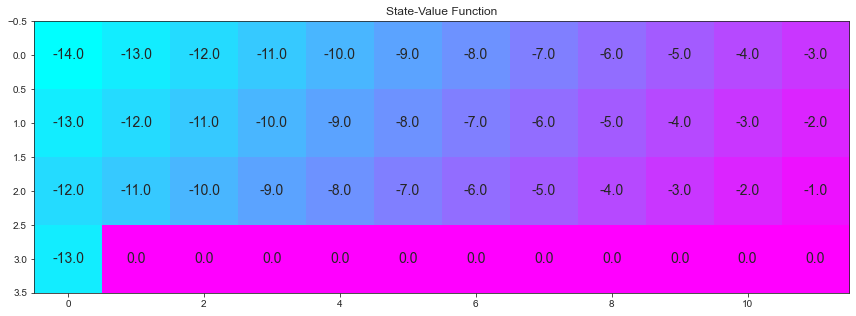

In [4]:
# define the optimal state-value function
V_opt = np.zeros((4,12))
V_opt[0][0:13] = -np.arange(3, 15)[::-1]
V_opt[1][0:13] = -np.arange(3, 15)[::-1] + 1
V_opt[2][0:13] = -np.arange(3, 15)[::-1] + 2
V_opt[3][0] = -13

plot_values(V_opt)

### Part 1: TD Control: Sarsa

In this section, you will write your own implementation of the Sarsa control algorithm.

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

Please complete the function in the code cell below.

(_Feel free to define additional functions to help you to organize your code._)

In [5]:
def update_Q_sarsa(alpha, gamma, Q, state, action, reward, next_state=None, next_action=None):
    """Returns updated Q-value for the most recent experience."""
    current = Q[state][action]  # estimate in Q-table (for current state, action pair)
    # get value of state, action pair at next time step
    Qsa_next = Q[next_state][next_action] if next_state is not None else 0    
    target = reward + (gamma * Qsa_next)               # construct TD target
    new_value = current + (alpha * (target - current)) # get updated value
    return new_value

def epsilon_greedy(Q, state, nA, eps):
    """Selects epsilon-greedy action for supplied state.
    
    Params
    ======
        Q (dictionary): action-value function
        state (int): current state
        nA (int): number actions in the environment
        eps (float): epsilon
    """
    if random.random() > eps: # select greedy action with probability epsilon
        return np.argmax(Q[state])
    else:                     # otherwise, select an action randomly
        return random.choice(np.arange(env.action_space.n))

In [9]:
def sarsa(env, num_episodes, alpha, gamma=1.0, plot_every=100):
    nA = env.action_space.n                # number of actions
    Q = defaultdict(lambda: np.zeros(nA))  # initialize empty dictionary of arrays
    
    # monitor performance
    tmp_scores = deque(maxlen=plot_every)     # deque for keeping track of scores
    avg_scores = deque(maxlen=num_episodes)   # average scores over every plot_every episodes
    
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 100 == 0:
            print("\rEpisode {}/{}".format(i_episode, num_episodes), end="")
            sys.stdout.flush()   
        score = 0                                             # initialize score
        state = env.reset()                                   # start episode
        
        eps = 1.0 / i_episode                                 # set value of epsilon
        action = epsilon_greedy(Q, state, nA, eps)            # epsilon-greedy action selection
        
        while True:
            next_state, reward, done, info = env.step(action) # take action A, observe R, S'
            score += reward                                   # add reward to agent's score
            if not done:
                next_action = epsilon_greedy(Q, next_state, nA, eps) # epsilon-greedy action
                print(f"Q[{state}][{action}] before: {Q[state][action]}")
                Q[state][action] = update_Q_sarsa(alpha, gamma, Q, \
                                                  state, action, reward, next_state, next_action)
                print(f"Q[{state}][{action}] after: {Q[state][action]}")
                state = next_state     # S <- S'
                action = next_action   # A <- A'
            if done:
                Q[state][action] = update_Q_sarsa(alpha, gamma, Q, \
                                                  state, action, reward)
                tmp_scores.append(score)    # append score
                break
        if (i_episode % plot_every == 0):
            avg_scores.append(np.mean(tmp_scores))

    # plot performance
    plt.plot(np.linspace(0,num_episodes,len(avg_scores),endpoint=False), np.asarray(avg_scores))
    plt.xlabel('Episode Number')
    plt.ylabel('Average Reward (Over Next %d Episodes)' % plot_every)
    plt.show()
    # print best 100-episode performance
    print(('Best Average Reward over %d Episodes: ' % plot_every), np.max(avg_scores))    
    return Q

Use the next code cell to visualize the **_estimated_** optimal policy and the corresponding state-value function.  

If the code cell returns **PASSED**, then you have implemented the function correctly!  Feel free to change the `num_episodes` and `alpha` parameters that are supplied to the function.  However, if you'd like to ensure the accuracy of the unit test, please do not change the value of `gamma` from the default.

Q[36][3] before: 0.0
Q[36][3] after: -0.01
Q[36][2] before: 0.0
Q[36][2] after: -0.01
Q[36][1] before: 0.0
Q[36][1] after: -1.0
Q[36][1] before: -1.0
Q[36][1] after: -1.9901
Q[36][2] before: -0.01
Q[36][2] after: -0.0199
Q[36][0] before: 0.0
Q[36][0] after: -0.01
Q[24][2] before: 0.0
Q[24][2] after: -0.029901
Q[36][1] before: -1.9901
Q[36][1] after: -2.970299
Q[36][3] before: -0.01
Q[36][3] after: -0.02
Q[36][3] before: -0.02
Q[36][3] after: -0.03
Q[36][3] before: -0.03
Q[36][3] after: -0.04
Q[36][3] before: -0.04
Q[36][3] after: -0.07930298999999999
Q[36][1] before: -2.970299
Q[36][1] after: -3.970299
Q[36][1] before: -3.970299
Q[36][1] after: -4.970299
Q[36][1] before: -4.970299
Q[36][1] after: -5.9213890399
Q[36][3] before: -0.07930298999999999
Q[36][3] after: -0.08930298999999998
Q[36][3] before: -0.08930298999999998
Q[36][3] after: -0.09850996009999999
Q[36][0] before: -0.01
Q[36][0] after: -0.0199
Q[24][3] before: 0.0
Q[24][3] after: -0.010299009999999999
Q[24][2] before: -0.0299

Q[36][0] before: -0.39679068694217984
Q[36][0] after: -0.4055433611078246
Q[24][0] before: -0.2720581035066531
Q[24][0] after: -0.2813838477816474
Q[12][2] before: -0.2046325310060831
Q[12][2] after: -0.21576466226299948
Q[24][3] before: -0.317845656697719
Q[24][3] after: -0.3274810386085583
Q[24][0] before: -0.2813838477816474
Q[24][0] after: -0.2900549780043773
Q[12][1] before: -0.14849687005463993
Q[12][1] after: -0.15799855013449818
Q[13][1] before: -0.09866487804046496
Q[13][1] after: -0.10820174751836126
Q[14][0] before: -0.0523518258300948
Q[14][0] after: -0.0628384106152636
Q[2][3] before: -0.10101030434697414
Q[2][3] after: -0.11151668721551107
Q[1][0] before: -0.15164859120066695
Q[1][0] after: -0.1608716267868314
Q[1][2] before: -0.07395214981711032
Q[1][2] after: -0.08639110275577228
Q[13][2] before: -0.31784744368330614
Q[13][2] after: -0.3255630950810583
Q[25][1] before: -0.08941258345852156
Q[25][1] after: -0.09971558786290527
Q[26][3] before: -0.11971302389689312
Q[26][

Q[13][0] before: -0.21399611989391476
Q[13][0] after: -0.22427127341662298
Q[1][3] before: -0.2415114721647365
Q[1][3] after: -0.25146997129554777
Q[0][0] before: -0.23736138524586164
Q[0][0] after: -0.24702844031834442
Q[0][3] before: -0.20406689249414056
Q[0][3] after: -0.21406689249414057
Q[0][3] before: -0.21406689249414057
Q[0][3] after: -0.22463832690710794
Q[0][1] before: -0.2712103337908787
Q[0][1] after: -0.28076018428531574
Q[1][2] before: -0.2261953832345808
Q[1][2] after: -0.23573737623372726
Q[13][3] before: -0.1803946831492265
Q[13][3] after: -0.19134951051011992
Q[12][0] before: -0.27587741923856957
Q[12][0] after: -0.2855889294493673
Q[0][0] before: -0.24702844031834442
Q[0][0] after: -0.2568045391842321
Q[0][3] before: -0.22463832690710794
Q[0][3] after: -0.23490840201830235
Q[0][2] before: -0.25164583802654783
Q[0][2] after: -0.2614698277602894
Q[12][3] before: -0.23404481140070316
Q[12][3] after: -0.24730659511436373
Q[12][2] before: -0.5602231827667612
Q[12][2] afte

Q[13][3] before: -0.24715390600348838
Q[13][3] after: -0.2579342411757168
Q[12][0] before: -0.32518742322632727
Q[12][0] after: -0.3351043579996202
Q[0][0] before: -0.3168809005556181
Q[0][0] after: -0.3264721385594363
Q[0][3] before: -0.2760047009374405
Q[0][3] after: -0.2865369975872564
Q[0][1] before: -0.3292343659190334
Q[0][1] after: -0.3387828381423828
Q[1][2] before: -0.28408158825397545
Q[1][2] after: -0.30913827931204363
Q[13][2] before: -1.7897506940607941
Q[13][2] after: -1.7850764594727861
Q[25][1] before: -0.32232723525999263
Q[25][1] after: -0.3373118455305795
Q[26][3] before: -0.8207882623186818
Q[26][3] after: -0.8268645638226794
Q[25][3] before: -0.4284184127184307
Q[25][3] after: -0.5182371260307328
Q[24][2] before: -8.410289743948642
Q[24][2] after: -8.509935434411828
Q[36][3] before: -17.374858790267226
Q[36][3] after: -17.384858790267227
Q[36][3] before: -17.384858790267227
Q[36][3] after: -17.379749621560464
Q[36][2] before: -15.873941919590747
Q[36][2] after: -15

Q[1][0] after: -0.46930099296155414
Q[1][0] before: -0.46930099296155414
Q[1][0] after: -0.47939494104551167
Q[1][2] before: -0.47869580135730694
Q[1][2] after: -0.4885826938032981
Q[13][3] before: -0.4673850459564241
Q[13][3] after: -0.4933295423941934
Q[12][2] before: -2.061834689733357
Q[12][2] after: -2.0597981355108486
Q[24][0] before: -0.8581792674825317
Q[24][0] after: -0.8801954561628149
Q[12][2] before: -2.0597981355108486
Q[12][2] after: -2.058002108717368
Q[24][0] before: -0.8801954561628149
Q[24][0] after: -0.887716645907272
Q[12][3] before: -0.6323144306085196
Q[12][3] after: -0.6423144306085196
Q[12][3] before: -0.6423144306085196
Q[12][3] after: -0.6504130742536792
Q[12][0] before: -0.452178795124491
Q[12][0] after: -0.4612550734952292
Q[0][3] before: -0.3598066321983135
Q[0][3] after: -0.3698066321983135
Q[0][3] before: -0.3698066321983135
Q[0][3] after: -0.3804865186675413
Q[0][1] before: -0.43779527912109306
Q[0][1] after: -0.44737818915808947
Q[1][1] before: -0.39608

Q[24][0] after: -1.1823478759586972
Q[12][0] before: -0.632935187878047
Q[12][0] after: -0.6424250409409251
Q[0][0] before: -0.5819204941658608
Q[0][0] after: -0.592806692562655
Q[0][2] before: -0.6705403338452799
Q[0][2] after: -0.6820370808067877
Q[12][3] before: -0.8202150299960612
Q[12][3] after: -0.8468296493062261
Q[12][2] before: -2.4816769610125484
Q[12][2] after: -2.721644291883147
Q[24][2] before: -25.47841004807239
Q[24][2] after: -25.609753521533293
Q[36][3] before: -37.61275739416247
Q[36][3] after: -38.56161764023117
Q[36][1] before: -131.49878200103214
Q[36][1] after: -131.24803183314293
Q[36][0] before: -6.4237652121115385
Q[36][0] after: -6.404639069372358
Q[24][3] before: -3.5111509381934822
Q[24][3] after: -3.5578795587155967
Q[24][1] before: -7.184012990404914
Q[24][1] after: -7.129299395638303
Q[25][0] before: -0.71265351374381
Q[25][0] after: -0.7212885930408696
Q[13][3] before: -0.5761614434497673
Q[13][3] after: -0.5888982603433598
Q[12][1] before: -0.8498431328

Q[14][1] before: -0.42209808399482895
Q[14][1] after: -0.4304301292314786
Q[15][3] before: -0.2553026076597963
Q[15][3] after: -0.2809353379934851
Q[14][2] before: -1.8185756410286749
Q[14][2] after: -1.8275699836047274
Q[26][3] before: -1.718009898633928
Q[26][3] after: -2.31429133305659
Q[25][2] before: -60.34615334090016
Q[25][2] after: -61.14176516980477
Q[36][3] before: -39.90733623136099
Q[36][3] after: -39.60034562869364
Q[36][0] before: -8.208275964625456
Q[36][0] after: -8.152345301722953
Q[24][0] before: -1.6152096743751418
Q[24][0] after: -1.6196199453033315
Q[12][3] before: -1.0562367671941189
Q[12][3] after: -1.0667330203195013
Q[12][1] before: -1.1058620797323764
Q[12][1] after: -1.14001703680665
Q[13][2] before: -3.521357787159732
Q[13][2] after: -3.5155735056604467
Q[25][1] before: -1.9429296372311717
Q[25][1] after: -1.9566432541894259
Q[26][3] before: -2.31429133305659
Q[26][3] after: -2.3207148522679186
Q[25][1] before: -1.9566432541894259
Q[25][1] after: -1.95087027

Q[23][3] before: -0.01
Q[23][3] after: -0.020099
Q[22][2] before: -0.0199
Q[22][2] after: -0.029801
Q[34][1] before: -0.01
Q[34][1] after: -0.02
Q[36][0] before: -9.338347270392921
Q[36][0] after: -9.273435418655623
Q[24][0] before: -1.8471620966631874
Q[24][0] after: -1.8497400288665198
Q[12][3] before: -1.1049553169964201
Q[12][3] after: -1.1134109674014752
Q[12][0] before: -0.9505203575019214
Q[12][0] after: -0.9603836772975949
Q[0][1] before: -0.9368523370692634
Q[0][1] after: -0.945621449463573
Q[1][3] before: -0.8137635765002179
Q[1][3] after: -0.8250564737194463
Q[0][0] before: -0.9430532984230623
Q[0][0] after: -0.9530532984230623
Q[0][0] before: -0.9530532984230623
Q[0][0] after: -0.9629645487932019
Q[0][3] before: -0.9441783354370249
Q[0][3] after: -0.9543661975705867
Q[0][0] before: -0.9629645487932019
Q[0][0] after: -0.9727911177999057
Q[0][1] before: -0.945621449463573
Q[0][1] after: -0.9547719978444705
Q[1][2] before: -0.8606762875533301
Q[1][2] after: -0.8696285447558318

Q[0][0] after: -1.0732923439981328
Q[0][3] before: -1.054333285097188
Q[0][3] after: -1.064333285097188
Q[0][3] before: -1.064333285097188
Q[0][3] after: -1.074333285097188
Q[0][3] before: -1.074333285097188
Q[0][3] after: -1.0842391248808663
Q[0][1] before: -1.0649172634650024
Q[0][1] after: -1.0734420610635116
Q[1][3] before: -0.9173970233159168
Q[1][3] after: -0.9288731522455167
Q[0][2] before: -1.0650099162759112
Q[0][2] after: -1.0748605763224648
Q[12][0] before: -1.0500759209312633
Q[12][0] after: -1.060308085161932
Q[0][0] before: -1.0732923439981328
Q[0][0] after: -1.0832923439981328
Q[0][0] before: -1.0832923439981328
Q[0][0] after: -1.0931938411687865
Q[0][1] before: -1.0734420610635116
Q[0][1] after: -1.081665631954962
Q[1][0] before: -0.8957991502085476
Q[1][0] after: -0.9057991502085476
Q[1][0] before: -0.9057991502085476
Q[1][0] after: -0.9157079083933022
Q[1][2] before: -0.8966749686840021
Q[1][2] after: -0.9057849318894904
Q[13][0] before: -0.8076712892328282
Q[13][0] a

Q[6][0] after: -0.32742034972712364
Q[6][0] before: -0.32742034972712364
Q[6][0] after: -0.33737901027430023
Q[6][1] before: -0.3232864044447808
Q[6][1] after: -0.3325145157577627
Q[7][2] before: -0.2460975357429688
Q[7][2] after: -0.2559553334008631
Q[19][1] before: -0.2318773015323992
Q[19][1] after: -0.24132811804308563
Q[20][3] before: -0.1769589526010442
Q[20][3] after: -0.18742357950043778
Q[19][3] before: -0.22342164254040434
Q[19][3] after: -0.23421419362534707
Q[18][3] before: -0.30267675103467856
Q[18][3] after: -0.3134678185469996
Q[17][3] before: -0.38178350226678276
Q[17][3] after: -0.39238827235400786
Q[16][3] before: -0.4422605109892912
Q[16][3] after: -0.454037608075817
Q[15][0] before: -0.6199702196418726
Q[15][0] after: -0.6304255201549199
Q[3][1] before: -0.6655002709466071
Q[3][1] after: -0.6740738973661552
Q[4][2] before: -0.5228629129014132
Q[4][2] after: -0.5421022186954015
Q[16][2] before: -1.4467934923002495
Q[16][2] after: -1.4442621344760533
Q[28][0] before: 

Q[2][0] before: -0.9197933893705942
Q[2][0] after: -0.9297628227035006
Q[2][1] before: -0.9167367226612406
Q[2][1] after: -0.925110720211345
Q[3][0] before: -0.7541364776716822
Q[3][0] after: -0.7641364776716822
Q[3][0] before: -0.7641364776716822
Q[3][0] after: -0.7740773946856452
Q[3][3] before: -0.7582281790679756
Q[3][3] after: -0.7698484976585438
Q[2][3] before: -0.920260038124795
Q[2][3] after: -0.932188572523644
Q[1][1] before: -1.1131134780096923
Q[1][1] after: -1.121200963263293
Q[2][2] before: -0.9218620033697632
Q[2][2] after: -0.9311438492391569
Q[14][3] before: -0.8500465903091377
Q[14][3] after: -0.8617313847862653
Q[13][1] before: -1.0185260380219012
Q[13][1] after: -1.0268618014686532
Q[14][1] before: -0.8521023826970967
Q[14][1] after: -0.8608143109846038
Q[15][3] before: -0.7232952114478096
Q[15][3] after: -0.7346144276509458
Q[14][0] before: -0.8552168317614279
Q[14][0] after: -0.8659157706459271
Q[2][1] before: -0.925110720211345
Q[2][1] after: -0.9334580187792352
Q

Q[14][0] after: -0.9510095876605056
Q[2][2] before: -0.9967891440599199
Q[2][2] after: -1.0062588705202924
Q[14][3] before: -0.9437617900971627
Q[14][3] after: -0.9554668700674297
Q[13][0] before: -1.1142697871238656
Q[13][0] after: -1.1249087724085802
Q[1][1] before: -1.1781683155953386
Q[1][1] after: -1.1863962110327277
Q[2][1] before: -1.0009578593342519
Q[2][1] after: -1.0094049357298824
Q[3][1] before: -0.8456654988973155
Q[3][1] after: -0.8542545321239075
Q[4][1] before: -0.7045688215565128
Q[4][1] after: -0.7132672032456663
Q[5][1] before: -0.5744069904718607
Q[5][1] after: -0.5833759547007753
Q[6][3] before: -0.4713034133633196
Q[6][3] after: -0.4823457309503924
Q[5][3] before: -0.5755351720706023
Q[5][3] after: -0.5868762324893813
Q[4][2] before: -0.7096412139484928
Q[4][2] after: -0.7190999168033397
Q[16][1] before: -0.6555114994331881
Q[16][1] after: -0.6643234546162543
Q[17][1] before: -0.53670701773981
Q[17][1] after: -0.5459390653625605
Q[18][1] before: -0.459911780014859

Q[12][1] before: -1.4559930402642527
Q[12][1] after: -1.4635097214129957
Q[13][3] before: -1.2076611551385632
Q[13][3] after: -1.220154279291539
Q[12][0] before: -1.45697357043614
Q[12][0] after: -1.4664099254205467
Q[0][1] before: -1.4006090688768196
Q[0][1] after: -1.4091874122261212
Q[1][2] before: -1.2584434038069734
Q[1][2] after: -1.2679551015380464
Q[13][0] before: -1.2096131769142684
Q[13][0] after: -1.2201965961605061
Q[1][2] before: -1.2679551015380464
Q[1][2] after: -1.2774056458290397
Q[13][1] before: -1.2130095306373743
Q[13][1] after: -1.2212332003545308
Q[14][0] before: -1.0353765023530295
Q[14][0] after: -1.0458431972858522
Q[2][2] before: -1.0820459956353043
Q[2][2] after: -1.0916015031014474
Q[14][3] before: -1.0375967422496053
Q[14][3] after: -1.0494223176200246
Q[13][3] before: -1.220154279291539
Q[13][3] after: -1.2325734093324807
Q[12][3] before: -1.4620672833857038
Q[12][3] after: -1.4720672833857038
Q[12][3] before: -1.4720672833857038
Q[12][3] after: -1.4819817

Q[21][0] after: -0.33641913289763165
Q[9][3] before: -0.356527714512259
Q[9][3] after: -0.36730020014925896
Q[8][2] before: -0.433776278212253
Q[8][2] after: -0.44362069884501504
Q[20][1] before: -0.41821834148845705
Q[20][1] after: -0.42734089904766853
Q[21][1] before: -0.3304740974096032
Q[21][1] after: -0.34000303260936415
Q[22][1] before: -0.28336761738569877
Q[22][1] after: -0.29287938804570574
Q[23][0] before: -0.2345446833863944
Q[23][0] after: -0.24485040554030427
Q[11][2] before: -0.26511689877738076
Q[11][2] after: -0.2748198902091419
Q[23][3] before: -0.23541604195349067
Q[23][3] after: -0.24589857494685527
Q[22][0] before: -0.28366934128995036
Q[22][0] after: -0.2938687584384558
Q[10][1] before: -0.3036110561404927
Q[10][1] after: -0.3133231444811792
Q[11][2] before: -0.2748198902091419
Q[11][2] after: -0.2844594225784283
Q[23][1] before: -0.23877312713778784
Q[23][1] after: -0.24877312713778785
Q[23][1] before: -0.24877312713778785
Q[23][1] after: -0.2586785541557523
Q[23]

Q[9][0] after: -0.43844026545893217
Q[9][3] before: -0.4212713250479633
Q[9][3] after: -0.43205071691192615
Q[8][3] before: -0.49921051144425227
Q[8][3] after: -0.5100280418128205
Q[7][3] before: -0.5809635483010702
Q[7][3] after: -0.5919457767225279
Q[6][2] before: -0.6791863904468415
Q[6][2] after: -0.6888922994082417
Q[18][1] before: -0.6497772865868653
Q[18][1] after: -0.6589642980017414
Q[19][2] before: -0.5684784280744791
Q[19][2] after: -0.5769922703583604
Q[31][1] before: -0.4198626564626108
Q[31][1] after: -0.4293492386747528
Q[32][3] before: -0.3685208776768088
Q[32][3] after: -0.3789686373317375
Q[31][3] before: -0.41329684316967846
Q[31][3] after: -0.4233846402869055
Q[30][1] before: -0.4220765548923774
Q[30][1] after: -0.43205039414414903
Q[31][0] before: -0.4194604800695403
Q[31][0] after: -0.43097527886527187
Q[19][0] before: -0.5709403596426985
Q[19][0] after: -0.5811067169836641
Q[7][0] before: -0.587576093739257
Q[7][0] after: -0.597576093739257
Q[7][0] before: -0.597

Q[12][0] before: -1.6994167652586674
Q[12][0] after: -1.708678526577954
Q[0][1] before: -1.6255928971873335
Q[0][1] after: -1.634270540098566
Q[1][1] before: -1.4933571883105794
Q[1][1] after: -1.501743570802095
Q[2][2] before: -1.3319954374621388
Q[2][2] after: -1.3417223396967075
Q[14][1] before: -1.3046856609190094
Q[14][1] after: -1.3133608912546766
Q[15][1] before: -1.1722086944857293
Q[15][1] after: -1.1806732592839653
Q[16][3] before: -1.0186651743093265
Q[16][3] after: -1.0302231620647941
Q[15][0] before: -1.174463949856104
Q[15][0] after: -1.184543654329164
Q[3][0] before: -1.1824343971621194
Q[3][0] after: -1.1924343971621194
Q[3][0] before: -1.1924343971621194
Q[3][0] after: -1.202359514092732
Q[3][3] before: -1.18494609022336
Q[3][3] after: -1.196490612090758
Q[2][1] before: -1.3393982769631587
Q[2][1] after: -1.3478699122751594
Q[3][1] before: -1.1865618081632208
Q[3][1] after: -1.1950372540055985
Q[4][3] before: -1.0341063924009983
Q[4][3] after: -1.0456405766600283
Q[3][

Q[6][0] after: -0.8054446552897149
Q[6][0] before: -0.8054446552897149
Q[6][0] after: -0.8153462777767183
Q[6][2] before: -0.795606903990055
Q[6][2] after: -0.8053345559343054
Q[18][0] before: -0.7683720984150987
Q[18][0] after: -0.7787178619003207
Q[6][1] before: -0.802948446937302
Q[6][1] after: -0.8118836774882293
Q[7][2] before: -0.6964715020300306
Q[7][2] after: -0.7063101066978097
Q[19][2] before: -0.6803319688079391
Q[19][2] after: -0.6890924023233153
Q[31][0] before: -0.5563753203455524
Q[31][0] after: -0.5676302153265558
Q[19][3] before: -0.681864818445891
Q[19][3] after: -0.6927433759001147
Q[18][2] before: -0.7697205638682683
Q[18][2] after: -0.7779951052588939
Q[30][0] before: -0.597174702930832
Q[30][0] after: -0.6089237469871382
Q[18][3] before: -0.7720791085614561
Q[18][3] after: -0.7830973977471953
Q[17][3] before: -0.8739080271353765
Q[17][3] after: -0.8861105722017493
Q[16][0] before: -1.0941625337726562
Q[16][0] after: -1.1042559877614162
Q[4][3] before: -1.103507932

Q[0][3] after: -1.8117682793778915
Q[0][2] before: -1.7955052494032442
Q[0][2] after: -1.8062689849764535
Q[12][1] before: -1.8718788067241814
Q[12][1] after: -1.8796701092647754
Q[13][0] before: -1.6510090607835903
Q[13][0] after: -1.661118525152568
Q[1][1] before: -1.6619554976813642
Q[1][1] after: -1.6703324827439707
Q[2][1] before: -1.4996540039420074
Q[2][1] after: -1.507925083139862
Q[3][2] before: -1.326761923727477
Q[3][2] after: -1.336558294024533
Q[15][1] before: -1.3063989534330767
Q[15][1] after: -1.3148812049790377
Q[16][0] before: -1.1546241080291881
Q[16][0] after: -1.1646665081191179
Q[4][0] before: -1.1588641170221716
Q[4][0] after: -1.1688641170221716
Q[4][0] before: -1.1688641170221716
Q[4][0] after: -1.1787746101196943
Q[4][1] before: -1.159913426774437
Q[4][1] after: -1.168111073162494
Q[5][3] before: -0.979678065580133
Q[5][3] after: -0.9914963716454488
Q[4][3] before: -1.1615086721117096
Q[4][3] after: -1.173188368050712
Q[3][1] before: -1.3294782660119535
Q[3][1

Q[4][1] before: -1.2172174967836837
Q[4][1] after: -1.2253595317421135
Q[5][1] before: -1.0314209926266558
Q[5][1] after: -1.0400320736601454
Q[6][2] before: -0.8925290959756257
Q[6][2] after: -0.9022177713274974
Q[18][0] before: -0.8613966311627903
Q[18][0] after: -0.8717336619784642
Q[6][0] before: -0.8950997127301832
Q[6][0] after: -0.9050997127301832
Q[6][0] before: -0.9050997127301832
Q[6][0] after: -0.9150218057384439
Q[6][3] before: -0.8973090135562573
Q[6][3] after: -0.9086827668633074
Q[5][2] before: -1.0346843442612716
Q[5][2] after: -1.04402068242957
Q[17][2] before: -0.9683181610911071
Q[17][2] after: -0.9755547032706585
Q[29][3] before: -0.691972379046251
Q[29][3] after: -0.7004898422506997
Q[28][1] before: -0.5437186994911238
Q[28][1] after: -0.555201875675298
Q[29][1] before: -0.6920363179085438
Q[29][1] after: -0.7022509085059081
Q[30][0] before: -0.713495377644978
Q[30][0] after: -0.7249776415538
Q[18][2] before: -0.8617217685271777
Q[18][2] after: -0.870328349104671
Q

Q[8][2] before: -0.7381615838066098
Q[8][2] after: -0.7479626429287975
Q[20][2] before: -0.7182674960253831
Q[20][2] after: -0.7272872145170431
Q[32][1] before: -0.6202393451913868
Q[32][1] after: -0.6295233698248106
Q[33][3] before: -0.5486418085337692
Q[33][3] after: -0.5593911712118693
Q[32][0] before: -0.6235780763437809
Q[32][0] after: -0.6345439007638266
Q[20][1] before: -0.7201605183483449
Q[20][1] after: -0.7291807470032189
Q[21][0] before: -0.6221833838357373
Q[21][0] after: -0.6323467140345869
Q[9][1] before: -0.6385164037206924
Q[9][1] after: -0.647756610577176
Q[10][1] before: -0.5625370893690594
Q[10][1] after: -0.5720501521969562
Q[11][2] before: -0.5138433721587387
Q[11][2] after: -0.5233402133302956
Q[23][0] before: -0.4635274893144289
Q[23][0] after: -0.4740416656822734
Q[11][3] before: -0.5149451260988792
Q[11][3] after: -0.5254498117665548
Q[10][3] before: -0.5654136928664409
Q[10][3] after: -0.5762371220435483
Q[9][1] before: -0.647756610577176
Q[9][1] after: -0.656

Q[14][0] before: -1.7166396022330366
Q[14][0] after: -1.7264843013678157
Q[2][1] before: -1.7011095157109468
Q[2][1] after: -1.7089874718663298
Q[3][2] before: -1.4889051312492372
Q[3][2] after: -1.498166705770444
Q[15][2] before: -1.4150625833699062
Q[15][2] after: -1.417988288083999
Q[27][3] before: -0.7076330547791736
Q[27][3] after: -0.7199063845502367
Q[26][0] before: -0.9349660318854803
Q[26][0] after: -0.9528009844612441
Q[14][1] before: -1.7184612894618525
Q[14][1] after: -1.725456559448074
Q[15][2] before: -1.417988288083999
Q[15][2] after: -1.4209352077220812
Q[27][1] before: -0.7126802518922151
Q[27][1] after: -0.7222186729158704
Q[28][0] before: -0.6665223542577497
Q[28][0] after: -0.6831680162002993
Q[16][1] before: -1.3310885485127075
Q[16][1] after: -1.338980637380308
Q[17][3] before: -1.120297435272755
Q[17][3] after: -1.1324482729250702
Q[16][0] before: -1.335381200504265
Q[16][0] after: -1.3453899461170935
Q[4][3] before: -1.3362557617871347
Q[4][3] after: -1.34779482

Q[30][0] before: -0.9918229386390673
Q[30][0] after: -1.0026718731897835
Q[18][0] before: -1.0767163937106887
Q[18][0] after: -1.0869650995795692
Q[6][3] before: -1.1015869805987315
Q[6][3] after: -1.1129488912426395
Q[5][0] before: -1.2377780449895361
Q[5][0] after: -1.2477780449895362
Q[5][0] before: -1.2477780449895362
Q[5][0] after: -1.257687653095696
Q[5][3] before: -1.2387388556055248
Q[5][3] after: -1.2504206530154627
Q[4][2] before: -1.4069185965993203
Q[4][2] after: -1.4169453051605365
Q[16][1] before: -1.4095894527209358
Q[16][1] after: -1.4174252141520056
Q[17][3] before: -1.1931655958279226
Q[17][3] after: -1.2053692149003004
Q[16][3] before: -1.4135275030657044
Q[16][3] after: -1.4244518624023508
Q[15][0] before: -1.5059634367303516
Q[15][0] after: -1.5166150775991944
Q[3][0] before: -1.5711275236146387
Q[3][0] after: -1.5811275236146387
Q[3][0] before: -1.5811275236146387
Q[3][0] after: -1.5910367950894249
Q[3][1] before: -1.572054671093254
Q[3][1] after: -1.5804132358654

Q[3][3] after: -1.6593893348857927
Q[2][3] before: -1.8446091549904553
Q[2][3] after: -1.8563781582771064
Q[1][0] before: -2.0215094836555623
Q[1][0] after: -2.031509483655562
Q[1][0] before: -2.031509483655562
Q[1][0] after: -2.041439467443621
Q[1][3] before: -2.0245078624614687
Q[1][3] after: -2.035825319471732
Q[0][2] before: -2.1562535634878333
Q[0][2] after: -2.167283413822553
Q[12][3] before: -2.2592385969597935
Q[12][3] after: -2.2692385969597932
Q[12][3] before: -2.2692385969597932
Q[12][3] after: -2.2791487884582655
Q[12][1] before: -2.260257746807033
Q[12][1] after: -2.267982829665612
Q[13][1] before: -2.032766032664956
Q[13][1] after: -2.0410598142459193
Q[14][3] before: -1.8621441907612744
Q[14][3] after: -1.8739309913219973
Q[13][0] before: -2.0408242468335644
Q[13][0] after: -2.05067124342771
Q[1][1] before: -2.0255239062481216
Q[1][1] after: -2.0337296590418066
Q[2][0] before: -1.8460991856166258
Q[2][0] after: -1.8560991856166258
Q[2][0] before: -1.8560991856166258
Q[2]

Q[16][2] after: -1.5218583585797567
Q[28][0] before: -0.9162972914539563
Q[28][0] after: -0.9323202932758466
Q[16][1] before: -1.518597473642989
Q[16][1] after: -1.5264416032260173
Q[17][3] before: -1.3030104319458151
Q[17][3] after: -1.3151989112121545
Q[16][2] before: -1.5218583585797567
Q[16][2] after: -1.5258826894170818
Q[28][3] before: -0.9242914423122732
Q[28][3] after: -0.9328310098500487
Q[27][1] before: -0.7782481960898249
Q[27][1] after: -0.7897152586555887
Q[28][1] before: -0.9249544526662055
Q[28][1] after: -0.9370740727227354
Q[29][3] before: -1.1369164583191902
Q[29][3] after: -1.1448704966687568
Q[28][0] before: -0.9323202932758466
Q[28][0] after: -0.948251676761497
Q[16][3] before: -1.525458641840883
Q[16][3] after: -1.5370902804732143
Q[15][3] before: -1.6886225050740025
Q[15][3] after: -1.701291317984897
Q[14][1] before: -1.9555037961634498
Q[14][1] after: -1.9628452310856688
Q[15][2] before: -1.6896472883853453
Q[15][2] after: -1.6905872005375606
Q[27][3] before: -0

Q[20][1] after: -0.9964453949373205
Q[21][1] before: -0.8635592633441396
Q[21][1] after: -0.872471032674599
Q[22][2] before: -0.7547361963900837
Q[22][2] after: -0.7639722906581512
Q[34][1] before: -0.6783456231968324
Q[34][1] after: -0.686288444708022
Q[35][0] before: -0.4726277743157816
Q[35][0] after: -0.48444321170221133
Q[23][0] before: -0.6541715129587512
Q[23][0] after: -0.664895220561562
Q[11][3] before: -0.7265422732398391
Q[11][3] after: -0.7371944896117002
Q[10][2] before: -0.7917639104259506
Q[10][2] after: -0.8014145372651271
Q[22][0] before: -0.7568265943436
Q[22][0] after: -0.7671932327842438
Q[10][3] before: -0.7934904384079766
Q[10][3] after: -0.8044729614907863
Q[9][3] before: -0.8917427466889402
Q[9][3] after: -0.9028908724741472
Q[8][0] before: -1.0065553252096526
Q[8][0] after: -1.0165553252096526
Q[8][0] before: -1.0165553252096526
Q[8][0] after: -1.0264772770222486
Q[8][3] before: -1.0087505064692432
Q[8][3] after: -1.020014320104862
Q[7][1] before: -1.1351318700

Q[27][1] after: -1.1103855889820453
Q[28][1] before: -1.1696070913607577
Q[28][1] after: -1.180782450308075
Q[29][3] before: -1.2871429860924952
Q[29][3] after: -1.2960165309870613
Q[28][3] before: -1.1744974755491027
Q[28][3] after: -1.1837827128376135
Q[27][3] before: -1.1030212044001926
Q[27][3] after: -1.1158694358683277
Q[26][1] before: -1.3878443512137075
Q[26][1] after: -1.3950580376996025
Q[27][0] before: -1.1092129998032028
Q[27][0] after: -1.1257463141870039
Q[15][1] before: -1.7625444381833084
Q[15][1] after: -1.7709797769582987
Q[16][1] before: -1.606078315682335
Q[16][1] after: -1.6141633915037472
Q[17][0] before: -1.4145858978235584
Q[17][0] after: -1.4249736884936945
Q[5][1] before: -1.4533649648371807
Q[5][1] after: -1.4619572491046693
Q[6][2] before: -1.3125933915860473
Q[6][2] after: -1.3224216526140693
Q[18][1] before: -1.295419494388242
Q[18][1] after: -1.304219413561258
Q[19][2] before: -1.1754114116898393
Q[19][2] after: -1.1852520144431684
Q[31][1] before: -1.159

Q[26][0] after: -1.6174980218537534
Q[14][2] before: -2.158244293218076
Q[14][2] after: -2.1628368305044328
Q[26][0] before: -1.6174980218537534
Q[26][0] after: -1.6329138246988029
Q[14][1] before: -2.1590783063586985
Q[14][1] after: -2.1655727207899695
Q[15][2] before: -1.8085197494857967
Q[15][2] after: -1.8127416949104456
Q[27][3] before: -1.2307142919506815
Q[27][3] after: -1.2447362872781627
Q[26][0] before: -1.6329138246988029
Q[26][0] after: -1.6482130547568592
Q[14][2] before: -2.1628368305044328
Q[14][2] after: -2.167690592746957
Q[26][0] before: -1.6482130547568592
Q[26][0] after: -1.6633629494369055
Q[14][0] before: -2.1632025227614946
Q[14][0] after: -2.172716648660239
Q[2][3] before: -2.11461511263594
Q[2][3] after: -2.1264528417473154
Q[1][1] before: -2.2983880237735024
Q[1][1] after: -2.306566764130765
Q[2][1] before: -2.116262059499783
Q[2][1] after: -2.123852370554426
Q[3][2] before: -1.8752931649640892
Q[3][2] after: -1.8846542616539401
Q[15][0] before: -1.81140283394

Q[13][1] before: -2.3762883976219698
Q[13][1] after: -2.3845225371100573
Q[14][2] before: -2.1997023464307093
Q[14][2] after: -2.2052738968666348
Q[26][1] before: -1.7568573900232636
Q[26][1] after: -1.7626042908844128
Q[27][0] before: -1.3315474761381847
Q[27][0] after: -1.346714049679334
Q[15][2] before: -1.8482048302530996
Q[15][2] after: -1.8531776945347618
Q[27][3] before: -1.3454912584193177
Q[27][3] after: -1.3596623887439687
Q[26][1] before: -1.7626042908844128
Q[26][1] after: -1.768445388472362
Q[27][0] before: -1.346714049679334
Q[27][0] after: -1.3617328372578559
Q[15][3] before: -1.8485928075315254
Q[15][3] after: -1.862119769494024
Q[14][0] before: -2.2012890037813824
Q[14][0] after: -2.2108187277351936
Q[2][1] before: -2.1542613991624893
Q[2][1] after: -2.1618727719410322
Q[3][1] before: -1.915398677016803
Q[3][1] after: -1.923513150124103
Q[4][0] before: -1.7268459877467959
Q[4][0] after: -1.736763024196944
Q[4][1] before: -1.7185496327616157
Q[4][1] after: -1.7267547329

Q[24][0] before: -2.7139624241637947
Q[24][0] after: -2.7234661347166123
Q[12][0] before: -2.6643334794455384
Q[12][0] after: -2.6730483146444795
Q[0][1] before: -2.535816999339628
Q[0][1] after: -2.544418619998009
Q[1][1] before: -2.395979065177713
Q[1][1] after: -2.4041132090055486
Q[2][3] before: -2.2093934479612476
Q[2][3] after: -2.2212780572374795
Q[1][3] before: -2.3978543755844446
Q[1][3] after: -2.4092512336247287
Q[0][0] before: -2.5375401796128774
Q[0][0] after: -2.547540179612877
Q[0][0] before: -2.547540179612877
Q[0][0] after: -2.5575089640167286
Q[0][1] before: -2.544418619998009
Q[0][1] after: -2.553015565888084
Q[1][1] before: -2.4041132090055486
Q[1][1] after: -2.412219099641102
Q[2][0] before: -2.2147022725608765
Q[2][0] after: -2.2247022725608763
Q[2][0] before: -2.2247022725608763
Q[2][0] after: -2.2346064627939515
Q[2][1] before: -2.2151212958684074
Q[2][1] after: -2.2227539300283636
Q[3][2] before: -1.978384711864041
Q[3][2] after: -1.9878145796804845
Q[15][1] be

Q[20][0] before: -1.170164500161467
Q[20][0] after: -1.1803737262991654
Q[8][3] before: -1.191087113931319
Q[8][3] after: -1.2025809233464166
Q[7][2] before: -1.3404680554410722
Q[7][2] after: -1.350395778572642
Q[19][2] before: -1.3332403685980492
Q[19][2] after: -1.34307166887517
Q[31][0] before: -1.3163703963101252
Q[31][0] after: -1.3265614117549513
Q[19][1] before: -1.3354719407927507
Q[19][1] after: -1.3438529045480772
Q[20][3] before: -1.1735683163254098
Q[20][3] after: -1.1852052453382225
Q[19][3] before: -1.3372612176066792
Q[19][3] after: -1.3486191241644294
Q[18][3] before: -1.4730518733817164
Q[18][3] after: -1.4843342433705513
Q[17][3] before: -1.6012888722651988
Q[17][3] after: -1.6132061901993866
Q[16][1] before: -1.7930206656839847
Q[16][1] after: -1.8011074565714826
Q[17][0] before: -1.6016997544337783
Q[17][0] after: -1.612090886168613
Q[5][1] before: -1.640812927917248
Q[5][1] after: -1.649235317832265
Q[6][0] before: -1.4830519194189336
Q[6][0] after: -1.49305191941

Q[3][1] before: -2.098079092172284
Q[3][1] after: -2.1059181022535225
Q[4][3] before: -1.8819801002961614
Q[4][3] after: -1.8941798491615038
Q[3][3] before: -2.1019549868304073
Q[3][3] after: -2.114235171783182
Q[2][1] before: -2.329973482107917
Q[2][1] after: -2.337705025228174
Q[3][2] before: -2.103127794133623
Q[3][2] after: -2.112895284106971
Q[15][1] before: -2.0798767914684078
Q[15][1] after: -2.087534555961564
Q[16][0] before: -1.8456532407840414
Q[16][0] after: -1.856046828525099
Q[4][2] before: -1.885012014889804
Q[4][2] after: -1.8946465247425157
Q[16][2] before: -1.848463000160978
Q[16][2] after: -1.8552005064376655
Q[28][1] before: -1.5222136278297267
Q[28][1] after: -1.53256716800932
Q[29][1] before: -1.5575676457890586
Q[29][1] after: -1.5666871417773618
Q[30][0] before: -1.469517244619374
Q[30][0] after: -1.4799817936644943
Q[18][2] before: -1.515972149131412
Q[18][2] after: -1.5255298789716603
Q[30][3] before: -1.4717451331562412
Q[30][3] after: -1.482605883602696
Q[29]

Q[20][2] after: -1.278677657927299
Q[32][0] before: -1.2182211646205925
Q[32][0] after: -1.2287593399122847
Q[20][0] before: -1.2720386937898212
Q[20][0] after: -1.2821958641892077
Q[8][1] before: -1.2877557337284877
Q[8][1] after: -1.2963288992370545
Q[9][2] before: -1.145072284585157
Q[9][2] after: -1.154866409189925
Q[21][0] before: -1.1244847450619475
Q[21][0] after: -1.1347554927401646
Q[9][1] before: -1.1515595128836653
Q[9][1] after: -1.1602589983106752
Q[10][2] before: -1.0215080555846512
Q[10][2] after: -1.0310326655508908
Q[22][2] before: -0.9739690522086119
Q[22][2] after: -0.9830340965809348
Q[34][3] before: -0.8804734894409024
Q[34][3] after: -0.8922152758978821
Q[33][0] before: -1.054652135138865
Q[33][0] after: -1.065353568299342
Q[21][1] before: -1.124795451186587
Q[21][1] after: -1.1333044918246549
Q[22][0] before: -0.9756995149933724
Q[22][0] after: -0.9862087807290097
Q[10][0] before: -1.0266260885571048
Q[10][0] after: -1.0366260885571048
Q[10][0] before: -1.0366260

Episode 100/5000Q[36][0] before: -5.408462162451804
Q[36][0] after: -5.3936335988124835
Q[24][0] before: -2.9256057985197343
Q[24][0] after: -2.935331317912361
Q[12][1] before: -2.898157737782423
Q[12][1] after: -2.9055835698315553
Q[13][1] before: -2.640740942695635
Q[13][1] after: -2.6484552483610027
Q[14][1] before: -2.4121715092323828
Q[14][1] after: -2.419538503736329
Q[15][1] before: -2.148870959626993
Q[15][1] after: -2.1565599191340206
Q[16][2] before: -1.9177669103297252
Q[16][2] after: -1.9250324703035178
Q[28][1] before: -1.6443229077089883
Q[28][1] after: -1.6543362667343744
Q[29][0] before: -1.6456588102475906
Q[29][0] after: -1.6564846349928815
Q[17][1] before: -1.7282412847766826
Q[17][1] after: -1.7367860517967821
Q[18][2] before: -1.582717986786645
Q[18][2] after: -1.5923173018425432
Q[30][0] before: -1.542649492376465
Q[30][0] after: -1.5530832595949504
Q[18][0] before: -1.5860262142249946
Q[18][0] after: -1.5962349896112347
Q[6][3] before: -1.606903752848996
Q[6][3] 

Q[34][0] before: -0.9151862069098343
Q[34][0] after: -0.9262114342324711
Q[22][0] before: -1.017708939173512
Q[22][0] after: -1.0281961809308333
Q[10][0] before: -1.0664331149056474
Q[10][0] after: -1.0764331149056474
Q[10][0] before: -1.0764331149056474
Q[10][0] after: -1.0863590351275028
Q[10][2] before: -1.069025137091188
Q[10][2] after: -1.078523844250408
Q[22][2] before: -1.018895853013174
Q[22][2] after: -1.0278635916131622
Q[34][3] before: -0.9156697130120022
Q[34][3] after: -0.9274549816766597
Q[33][3] before: -1.09419657947776
Q[33][3] after: -1.105962095730499
Q[32][3] before: -1.27074820475167
Q[32][3] after: -1.2824451115745314
Q[31][0] before: -1.4404388870378124
Q[31][0] after: -1.4507428060238376
Q[19][1] before: -1.4708307856403275
Q[19][1] after: -1.4792878466131376
Q[20][2] before: -1.3165368829213333
Q[20][2] after: -1.326079457541937
Q[32][0] before: -1.2707943449817072
Q[32][0] after: -1.2813158332787582
Q[20][0] before: -1.322943174686807
Q[20][0] after: -1.333106

Q[31][0] before: -1.4610359951575382
Q[31][0] after: -1.471402413489926
Q[19][3] before: -1.497677828396313
Q[19][3] after: -1.509171509337512
Q[18][0] before: -1.6470459225162053
Q[18][0] after: -1.6572266086705234
Q[6][3] before: -1.6651145379480177
Q[6][3] after: -1.6767191099503795
Q[5][0] before: -1.82557173818421
Q[5][0] after: -1.83557173818421
Q[5][0] before: -1.83557173818421
Q[5][0] after: -1.845491856906192
Q[5][2] before: -1.8275836103824066
Q[5][2] after: -1.8372263878917992
Q[17][3] before: -1.7918613613216574
Q[17][3] after: -1.8037334444052504
Q[16][1] before: -1.9790696696809469
Q[16][1] after: -1.9872445320835823
Q[17][1] before: -1.7965559099444952
Q[17][1] after: -1.805084363681901
Q[18][1] before: -1.6494012836850782
Q[18][1] after: -1.6578840629867102
Q[19][2] before: -1.4976792138482868
Q[19][2] after: -1.5073268152623625
Q[31][1] before: -1.4624393552558383
Q[31][1] after: -1.4707332991422635
Q[32][0] before: -1.2918337438983523
Q[32][0] after: -1.30234795247629

Q[13][0] after: -2.728667644790412
Q[1][1] before: -2.6765366620931457
Q[1][1] after: -2.6843877409890076
Q[2][1] before: -2.4616445516793313
Q[2][1] after: -2.4695011835126226
Q[3][1] before: -2.2473077350084427
Q[3][1] after: -2.255235498031932
Q[4][3] before: -2.0400840373573743
Q[4][3] after: -2.0521729367985846
Q[3][3] before: -2.248973981478393
Q[3][3] after: -2.2611792534987356
Q[2][1] before: -2.4695011835126226
Q[2][1] after: -2.4773058144470808
Q[3][2] before: -2.249964276958456
Q[3][2] after: -2.259835501082179
Q[15][0] before: -2.237086689330756
Q[15][0] after: -2.247268177417768
Q[3][1] before: -2.255235498031932
Q[3][1] after: -2.2631178830886767
Q[4][1] before: -2.043474003706415
Q[4][1] after: -2.051604983427696
Q[5][2] before: -1.8565719758345212
Q[5][2] after: -1.8662651509543182
Q[17][2] before: -1.8258894878142187
Q[17][2] after: -1.8351842827986253
Q[29][1] before: -1.755368986254882
Q[29][1] after: -1.7642201877529107
Q[30][1] before: -1.6404891360577394
Q[30][1] 

Q[33][1] before: -1.15633080409626
Q[33][1] after: -1.1644243362935423
Q[34][1] before: -0.9656840238244799
Q[34][1] after: -0.972683415017336
Q[36][0] before: -5.258447085893415
Q[36][0] after: -5.246185969802609
Q[24][0] before: -3.0323354768128414
Q[24][0] after: -3.0420220354754677
Q[12][0] before: -3.00099134307547
Q[12][0] after: -3.0095063212365667
Q[0][2] before: -2.8524891591851183
Q[0][2] after: -2.863976127286781
Q[12][1] before: -3.0011859693513987
Q[12][1] after: -3.0084937251602537
Q[13][1] before: -2.7319615502368997
Q[13][1] after: -2.7394743982076983
Q[14][0] before: -2.483246347316746
Q[14][0] after: -2.493265050375621
Q[2][1] before: -2.485116653204252
Q[2][1] after: -2.4929615677052253
Q[3][2] before: -2.2696081033015774
Q[3][2] after: -2.27940693814735
Q[15][3] before: -2.249491587878804
Q[15][3] after: -2.261829625777538
Q[14][2] before: -2.4832953777521505
Q[14][2] after: -2.4899357875729757
Q[26][0] before: -2.1473363598346897
Q[26][0] after: -2.1607361112122585

Q[27][1] before: -1.9027731600347653
Q[27][1] after: -1.9123145829054817
Q[28][0] before: -1.856915447106402
Q[28][0] after: -1.8689509535601636
Q[16][1] before: -2.0604660924825557
Q[16][1] after: -2.068610112178083
Q[17][3] before: -1.8748680620352707
Q[17][3] after: -1.8867399899631285
Q[16][2] before: -2.062060854821053
Q[16][2] after: -2.070034129386505
Q[28][1] before: -1.859388311366272
Q[28][1] after: -1.8689087398213888
Q[29][3] before: -1.8114311568779562
Q[29][3] after: -1.8219232704320425
Q[28][3] before: -1.860642512286587
Q[28][3] after: -1.871159232992776
Q[27][1] before: -1.9123145829054817
Q[27][1] after: -1.9218805244746409
Q[28][1] before: -1.8689087398213888
Q[28][1] after: -1.878391335674257
Q[29][1] before: -1.8171683251082145
Q[29][1] after: -1.825922957012762
Q[30][3] before: -1.6926315155629732
Q[30][3] after: -1.7038837479078779
Q[29][0] before: -1.8178547500534457
Q[29][0] after: -1.8284886176997224
Q[17][0] before: -1.8812415146811212
Q[17][0] after: -1.8914

Q[18][1] after: -1.7591941059308596
Q[19][2] before: -1.5945098475241413
Q[19][2] after: -1.6042511771084396
Q[31][3] before: -1.5686428059539657
Q[31][3] after: -1.5802096448920344
Q[30][1] before: -1.725326699760847
Q[30][1] after: -1.7337720113906274
Q[31][1] before: -1.5698578627389033
Q[31][1] after: -1.5781232516590173
Q[32][0] before: -1.3963967547503153
Q[32][0] after: -1.4067809842566048
Q[20][0] before: -1.434819705379265
Q[20][0] after: -1.4450077282848015
Q[8][2] before: -1.4536219959328986
Q[8][2] after: -1.4634388179390267
Q[20][1] before: -1.4353041965457196
Q[20][1] after: -1.4437880527129536
Q[21][3] before: -1.283689813269118
Q[21][3] after: -1.2952502227068559
Q[20][3] before: -1.439730757042908
Q[20][3] after: -1.4513057976327157
Q[19][1] before: -1.597234816023668
Q[19][1] after: -1.6056677175843534
Q[20][2] before: -1.4405249720922144
Q[20][2] after: -1.450087985891716
Q[32][1] before: -1.3968263520423567
Q[32][1] after: -1.40491927177133
Q[33][0] before: -1.20611

Q[1][1] before: -2.7785004113771987
Q[1][1] after: -2.7863277926141947
Q[2][2] before: -2.5612385350767934
Q[2][2] after: -2.571191217771875
Q[14][1] before: -2.556506804584969
Q[14][1] after: -2.5642096037986657
Q[15][1] before: -2.326786725954643
Q[15][1] after: -2.3346251301709624
Q[16][2] before: -2.110627147586615
Q[16][2] after: -2.1188730970756358
Q[28][1] before: -1.935222096488714
Q[28][1] after: -1.9446558507624765
Q[29][1] before: -1.8785975238649641
Q[29][1] after: -1.8873179672423315
Q[30][1] before: -1.7506418616017048
Q[30][1] after: -1.7590807076756436
Q[31][1] before: -1.59452646899559
Q[31][1] after: -1.6027111685806703
Q[32][1] before: -1.412996427503624
Q[32][1] after: -1.421072272222045
Q[33][1] before: -1.2205808993457274
Q[33][1] after: -1.2285202387581275
Q[34][0] before: -1.0145148405857323
Q[34][0] after: -1.0255513315312512
Q[22][3] before: -1.118163935137633
Q[22][3] after: -1.1299347980133252
Q[21][3] before: -1.2952502227068559
Q[21][3] after: -1.306819982

Q[6][2] before: -1.8042149873971223
Q[6][2] after: -1.8141014015694192
Q[18][1] before: -1.792856404626809
Q[18][1] after: -1.8012447220027277
Q[19][0] before: -1.6316881422186742
Q[19][0] after: -1.6418018290033827
Q[7][3] before: -1.6430568206895175
Q[7][3] after: -1.6546752623972059
Q[6][3] before: -1.8049009914583407
Q[6][3] after: -1.8167011030496634
Q[5][0] before: -1.984912150590613
Q[5][0] after: -1.9947884333606163
Q[5][3] before: -1.9725404275909422
Q[5][3] after: -1.9843906585299484
Q[4][1] before: -2.157563521491563
Q[4][1] after: -2.165722398594553
Q[5][2] before: -1.9734512317905573
Q[5][2] after: -1.9831747627932295
Q[17][3] before: -1.9458043320577842
Q[17][3] after: -1.9576053692682969
Q[16][1] before: -2.1259080531090393
Q[16][1] after: -2.1341289731962925
Q[17][2] before: -1.9480000618343687
Q[17][2] after: -1.9574769149768163
Q[29][3] before: -1.8956853760791283
Q[29][3] after: -1.906281793308885
Q[28][3] before: -1.955327099054782
Q[28][3] after: -1.966003242300651

Q[27][1] after: -2.08201947626223
Q[28][3] before: -2.0087851317145664
Q[28][3] after: -2.0194513861154086
Q[27][0] before: -2.0754105717987863
Q[27][0] after: -2.088349083092611
Q[15][0] before: -2.369261701181267
Q[15][0] after: -2.379399662037232
Q[3][3] before: -2.383057786777771
Q[3][3] after: -2.395251900190275
Q[2][1] before: -2.602469128028151
Q[2][1] after: -2.6103187930978278
Q[3][2] before: -2.387435634995831
Q[3][2] after: -2.3972856823919932
Q[15][3] before: -2.3724403746120633
Q[15][3] after: -2.3847051854533827
Q[14][2] before: -2.5989214587439973
Q[14][2] after: -2.605989757487805
Q[26][0] before: -2.3057513331247868
Q[26][0] after: -2.318713262787459
Q[14][3] before: -2.6019442993920463
Q[14][3] after: -2.6146502169152575
Q[13][1] before: -2.872536051713168
Q[13][1] after: -2.8798393654625847
Q[14][1] before: -2.6028674266548237
Q[14][1] after: -2.6105781790102514
Q[15][1] before: -2.3739426621975683
Q[15][1] after: -2.3818192453879896
Q[16][3] before: -2.1616009812396

Q[4][1] before: -2.2147467144588515
Q[4][1] after: -2.222919431913928
Q[5][2] before: -2.0320184599664914
Q[5][2] after: -2.041748538555074
Q[17][2] before: -2.005026318824768
Q[17][2] after: -2.014574935626319
Q[29][3] before: -1.9598879989798899
Q[29][3] after: -1.9706996986657541
Q[28][3] before: -2.0410579675663096
Q[28][3] after: -2.0518376456414713
Q[27][1] before: -2.119025775082458
Q[27][1] after: -2.1282826400532735
Q[28][0] before: -2.0447122721640243
Q[28][0] after: -2.0561807828724445
Q[16][1] before: -2.191563343006064
Q[16][1] after: -2.1997346673149556
Q[17][1] before: -2.008695773895212
Q[17][1] after: -2.0171223799570908
Q[18][3] before: -1.851356380083114
Q[18][3] after: -1.8629848598449616
Q[17][0] before: -2.0142043562678658
Q[17][0] after: -2.024400027337343
Q[5][1] before: -2.033771463215582
Q[5][1] after: -2.042068755925941
Q[6][2] before: -1.8635007342514438
Q[6][2] after: -1.8733822739397683
Q[18][1] before: -1.8516547030839037
Q[18][1] after: -1.86002970892677

Q[28][3] before: -2.0733527161275043
Q[28][3] after: -2.0841793814922362
Q[27][1] before: -2.1560192526006863
Q[27][1] after: -2.1652037714749475
Q[28][1] before: -2.0744711400268083
Q[28][1] after: -2.083639977432101
Q[29][1] before: -1.9913548805560402
Q[29][1] after: -1.999955624333342
Q[30][1] before: -1.8514292582862393
Q[30][1] after: -1.8597614788566328
Q[31][3] before: -1.6846513153255946
Q[31][3] after: -1.6963275957008013
Q[30][0] before: -1.852279352846266
Q[30][0] after: -1.8625025179120114
Q[18][3] before: -1.8745958594208005
Q[18][3] after: -1.8861864916269517
Q[17][2] before: -2.0336590800359122
Q[17][2] after: -2.043245066987382
Q[29][3] before: -1.9922577751828805
Q[29][3] after: -2.0031251479943513
Q[28][0] before: -2.0789950563299775
Q[28][0] after: -2.090366675938934
Q[16][1] before: -2.2161570172256493
Q[16][1] after: -2.2243352387986497
Q[17][1] before: -2.03397917452569
Q[17][1] after: -2.042406884112778
Q[18][1] before: -1.8767501332344823
Q[18][1] after: -1.885

Q[0][1] after: -3.074852636212049
Q[1][1] before: -2.895241945239404
Q[1][1] after: -2.9029921409517265
Q[2][2] before: -2.6702615164716437
Q[2][2] after: -2.6801205626461995
Q[14][2] before: -2.656166133927206
Q[14][2] after: -2.6634347262652214
Q[26][0] before: -2.3830253677287625
Q[26][0] after: -2.39576355878056
Q[14][1] before: -2.656844472908538
Q[14][1] after: -2.664597201946341
Q[15][2] before: -2.4321173766888253
Q[15][2] after: -2.4395384284303403
Q[27][3] before: -2.1742225508403026
Q[27][3] after: -2.1863382731089063
Q[26][1] before: -2.385794777700664
Q[26][1] after: -2.393681383928853
Q[27][1] before: -2.1744554005195873
Q[27][1] after: -2.1836388778534026
Q[28][1] before: -2.0928031339011133
Q[28][1] after: -2.101946943735666
Q[29][0] before: -2.0071841173563754
Q[29][0] after: -2.017632836554163
Q[17][3] before: -2.0520560371351357
Q[17][3] after: -2.0638254276145704
Q[16][2] before: -2.2289950850785893
Q[16][2] after: -2.237655030481724
Q[28][3] before: -2.094989625392

Q[26][1] before: -2.4253654276759726
Q[26][1] after: -2.4333909273331167
Q[27][0] before: -2.2279153933903877
Q[27][0] after: -2.2403328710601396
Q[15][2] before: -2.4696631603655956
Q[15][2] after: -2.477261200992194
Q[27][1] before: -2.2294672230254093
Q[27][1] after: -2.2386401461473304
Q[28][0] before: -2.1467595352175253
Q[28][0] after: -2.157946199559716
Q[16][1] before: -2.26542596943659
Q[16][1] after: -2.2736167203594904
Q[17][1] before: -2.0845010617266326
Q[17][1] after: -2.0928784421099227
Q[18][2] before: -1.9222391000556478
Q[18][2] after: -1.9320498833544648
Q[30][0] before: -1.903317429937355
Q[30][0] after: -1.9135530755148646
Q[18][1] before: -1.9268819876883159
Q[18][1] after: -1.935140170864695
Q[19][0] before: -1.7527003053262273
Q[19][0] after: -1.7628081117307315
Q[7][0] before: -1.7634809457766463
Q[7][0] after: -1.7734809457766463
Q[7][0] before: -1.7734809457766463
Q[7][0] after: -1.7833862998576542
Q[7][1] before: -1.7640163538774274
Q[7][1] after: -1.7723277

Q[0][2] before: -3.1304087103003524
Q[0][2] after: -3.1420213810925364
Q[12][1] before: -3.29167578951877
Q[12][1] after: -3.2986518416131445
Q[13][3] before: -2.9892809989562323
Q[13][3] after: -3.0023454102620684
Q[12][0] before: -3.2957221295398256
Q[12][0] after: -3.3040906844258453
Q[0][1] before: -3.1325776181418137
Q[0][1] after: -3.1408182714541666
Q[1][2] before: -2.9566429493770867
Q[1][2] after: -2.967033828761565
Q[13][1] before: -2.9957308878249216
Q[13][1] after: -3.002923141703674
Q[14][2] before: -2.7149562757001933
Q[14][2] after: -2.722397029411501
Q[26][0] before: -2.4590316468309843
Q[26][0] after: -2.4716080251867836
Q[14][3] before: -2.716669482410904
Q[14][3] after: -2.7294749725290584
Q[13][0] before: -2.99721849422635
Q[13][0] after: -3.0068188075230657
Q[1][1] before: -2.9572498238979374
Q[1][1] after: -2.9649717311200985
Q[2][2] before: -2.7294405461140334
Q[2][2] after: -2.739335289710844
Q[14][1] before: -2.7189149057950783
Q[14][1] after: -2.72672908712256

Q[29][3] before: -2.1125659152535503
Q[29][3] after: -2.1236879198324092
Q[28][0] before: -2.2247663731394325
Q[28][0] after: -2.23581993825333
Q[16][0] before: -2.330122884529172
Q[16][0] after: -2.3403258579632915
Q[4][2] before: -2.350420227941119
Q[4][2] after: -2.3602210718097734
Q[16][3] before: -2.3305046148065407
Q[16][3] after: -2.3425174990051136
Q[15][3] before: -2.5317930346638473
Q[15][3] after: -2.5439988837680856
Q[14][2] before: -2.752377945087693
Q[14][2] after: -2.7599457120886988
Q[26][0] before: -2.509154645188259
Q[26][0] after: -2.5216138109717376
Q[14][3] before: -2.755071223536123
Q[14][3] after: -2.7678770085562996
Q[13][0] before: -3.0356497255537827
Q[13][0] after: -3.045173681319877
Q[1][0] before: -2.9880453021632194
Q[1][0] after: -2.998045302163219
Q[1][0] before: -2.998045302163219
Q[1][0] after: -3.007946262844466
Q[1][1] before: -2.988141370287927
Q[1][1] after: -2.9959209267328495
Q[2][3] before: -2.7660970147801556
Q[2][3] after: -2.7783327155778093


Q[10][1] before: -1.325768287009032
Q[10][1] after: -1.334674232030313
Q[11][0] before: -1.2163627891371502
Q[11][0] after: -1.2263627891371502
Q[11][0] before: -1.2263627891371502
Q[11][0] after: -1.2362655139985144
Q[11][3] before: -1.2166352752735607
Q[11][3] after: -1.2278074531893584
Q[10][2] before: -1.33385306685332
Q[10][2] after: -1.3432031669266153
Q[22][2] before: -1.2688630741828513
Q[22][2] after: -1.2777423873355145
Q[34][1] before: -1.1567943894491775
Q[34][1] after: -1.1629243607457218
Q[35][0] before: -0.7697915191036122
Q[35][0] after: -0.7830361275605633
Q[23][3] before: -1.0942523647987235
Q[23][3] after: -1.1060153667830779
Q[22][0] before: -1.2705525632341725
Q[22][0] after: -1.281193779922134
Q[10][1] before: -1.334674232030313
Q[10][1] after: -1.343518822217343
Q[11][2] before: -1.2191332507333017
Q[11][2] after: -1.2278976305527587
Q[23][1] before: -1.095571232678993
Q[23][1] after: -1.105571232678993
Q[23][1] before: -1.105571232678993
Q[23][1] after: -1.11551

Q[23][2] before: -1.1130213521418344
Q[23][2] after: -1.1196987659267512
Q[36][0] before: -4.909399249131614
Q[36][0] after: -4.904685310315525
Q[24][0] before: -3.4380053675227575
Q[24][0] after: -3.4475889592884963
Q[12][1] before: -3.3963645440966177
Q[12][1] after: -3.4033319355489065
Q[13][0] before: -3.0931036893254857
Q[13][0] after: -3.1026752568564064
Q[1][2] before: -3.0502604424175517
Q[1][2] after: -3.060694345514143
Q[13][3] before: -3.093650752076664
Q[13][3] after: -3.1067475639113864
Q[12][1] before: -3.4033319355489065
Q[12][1] after: -3.410258844736585
Q[13][1] before: -3.0960228543167494
Q[13][1] after: -3.103123462852033
Q[14][0] before: -2.8060837078451146
Q[14][0] after: -2.8162977596518357
Q[2][3] before: -2.8274888885172405
Q[2][3] after: -2.8398173494247794
Q[1][3] before: -3.0603349792711305
Q[1][3] after: -3.0720807606963754
Q[0][0] before: -3.234913121795613
Q[0][0] after: -3.2449131217956126
Q[0][0] before: -3.2449131217956126
Q[0][0] after: -3.254818484097

Q[8][3] before: -1.7127124366573316
Q[8][3] after: -1.724531489469157
Q[7][2] before: -1.8946177178398633
Q[7][2] after: -1.904550840400601
Q[19][2] before: -1.887929973913642
Q[19][2] after: -1.897675396097567
Q[31][1] before: -1.862472192306146
Q[31][1] after: -1.870460601184237
Q[32][3] before: -1.661313080115248
Q[32][3] after: -1.673404555325938
Q[31][1] before: -1.870460601184237
Q[31][1] after: -1.878414125487861
Q[32][0] before: -1.6658130315466382
Q[32][0] after: -1.6761576620947005
Q[20][1] before: -1.7002760863528807
Q[20][1] after: -1.708385784697015
Q[21][1] before: -1.5112459207662976
Q[21][1] after: -1.5191759242237912
Q[22][2] before: -1.304246266515665
Q[22][2] after: -1.3130321297221466
Q[34][3] before: -1.1828325871638186
Q[34][3] after: -1.1954207100746392
Q[33][3] before: -1.4416448782458833
Q[33][3] after: -1.4539019495367602
Q[32][1] before: -1.6673520073335835
Q[32][1] after: -1.67511764439234
Q[33][1] before: -1.4439157132092226
Q[33][1] after: -1.4513477770837

Q[14][0] before: -2.877251268439883
Q[14][0] after: -2.8874761035453322
Q[2][1] before: -2.899734778984817
Q[2][1] after: -2.9075038299806533
Q[3][0] before: -2.6766398785684347
Q[3][0] after: -2.6866398785684344
Q[3][0] before: -2.6866398785684344
Q[3][0] after: -2.6965454152176846
Q[3][1] before: -2.6771935434934324
Q[3][1] after: -2.6852000327599943
Q[4][2] before: -2.477842470149629
Q[4][2] after: -2.4877638592459044
Q[16][1] before: -2.469981379777198
Q[16][1] after: -2.4780438638955267
Q[17][3] before: -2.276229791610061
Q[17][3] after: -2.2881956540159387
Q[16][0] before: -2.4728160321978496
Q[16][0] after: -2.482923678059183
Q[4][1] before: -2.4835806183311844
Q[4][1] after: -2.4916451713236913
Q[5][1] before: -2.2900359175818887
Q[5][1] after: -2.298233312587663
Q[6][3] before: -2.1097754181593245
Q[6][3] after: -2.1216014965424432
Q[5][3] before: -2.292383256471206
Q[5][3] after: -2.3042980734089924
Q[4][0] before: -2.4838649502498447
Q[4][0] after: -2.4938649502498444
Q[4][0

Q[31][1] before: -1.9262902590854205
Q[31][1] after: -1.9342442021405815
Q[32][1] before: -1.7216845646015067
Q[32][1] after: -1.7294148740318163
Q[33][0] before: -1.4947155076324692
Q[33][0] after: -1.505354629775114
Q[21][2] before: -1.5586277218969369
Q[21][2] after: -1.5679973900404902
Q[33][1] before: -1.495594536252263
Q[33][1] after: -1.5028965067013937
Q[34][0] before: -1.2257915811653364
Q[34][0] after: -1.2369834445910624
Q[22][0] before: -1.3449779237379422
Q[22][0] after: -1.3556680166715742
Q[10][1] before: -1.4139872171011385
Q[10][1] after: -1.4226964192252962
Q[11][1] before: -1.2849074295169074
Q[11][1] after: -1.2949074295169074
Q[11][1] before: -1.2949074295169074
Q[11][1] after: -1.3048488627551154
Q[11][2] before: -1.2890507533376998
Q[11][2] after: -1.2977136386285761
Q[23][1] before: -1.1553392824253272
Q[23][1] after: -1.1653392824253272
Q[23][1] before: -1.1653392824253272
Q[23][1] after: -1.1752705418731093
Q[23][0] before: -1.1584652272035272
Q[23][0] after: 

Q[20][0] before: -1.779693903482627
Q[20][0] after: -1.7898530770003933
Q[8][3] before: -1.7956112552592727
Q[8][3] after: -1.8074805187996612
Q[7][0] before: -1.9825376092981228
Q[7][0] after: -1.9925376092981228
Q[7][0] before: -1.9925376092981228
Q[7][0] after: -2.0024422610075945
Q[7][3] before: -1.9830027802452843
Q[7][3] after: -1.994879963401775
Q[6][2] before: -2.1707210958943706
Q[6][2] after: -2.18059136276405
Q[18][2] before: -2.157747782862304
Q[18][2] after: -2.1674882912520808
Q[30][1] before: -2.131798621839972
Q[30][1] after: -2.140005639569959
Q[31][0] before: -1.9525003948386863
Q[31][0] after: -1.9627203331023608
Q[19][0] before: -1.9744942212061363
Q[19][0] after: -1.9845876872408708
Q[7][2] before: -1.9838408246795898
Q[7][2] after: -1.993755439111374
Q[19][1] before: -1.975302267858016
Q[19][1] after: -1.9833581527354314
Q[20][1] before: -1.7808907555995428
Q[20][1] after: -1.788856042278332
Q[21][2] before: -1.5774194234784653
Q[21][2] after: -1.5868047841500381


Q[30][1] before: -2.1481866956127336
Q[30][1] after: -2.1563741576534703
Q[31][3] before: -1.9669328996864275
Q[31][3] after: -1.9787606909135318
Q[30][3] before: -2.1497120223968573
Q[30][3] after: -2.1612269169323683
Q[29][3] before: -2.3012014759479484
Q[29][3] after: -2.3121658050171243
Q[28][1] before: -2.397634382865549
Q[28][1] after: -2.4067136693658226
Q[29][1] before: -2.305563032892898
Q[29][1] after: -2.3140711441405037
Q[30][1] before: -2.1563741576534703
Q[30][1] after: -2.164539806143373
Q[31][0] before: -1.972939006643746
Q[31][0] after: -1.9831236686336202
Q[19][1] before: -1.9914052056311737
Q[19][1] after: -1.9994598502865462
Q[20][1] before: -1.7968696711684102
Q[20][1] after: -1.8048465341871882
Q[21][0] before: -1.594555973046198
Q[21][0] after: -1.6047945189474433
Q[9][1] before: -1.6184105631707322
Q[9][1] after: -1.6266282541039054
Q[10][1] before: -1.4401796564880482
Q[10][1] after: -1.4489286299381605
Q[11][2] before: -1.3150770014992745
Q[11][2] after: -1.32

Q[4][0] after: -2.5934499659237606
Q[4][0] before: -2.5934499659237606
Q[4][0] after: -2.603387582591482
Q[4][2] before: -2.5872116326958956
Q[4][2] after: -2.597260202109024
Q[16][3] before: -2.5920685740087315
Q[16][3] after: -2.6037402383168833
Q[15][2] before: -2.7592350048239123
Q[15][2] after: -2.7675108656153893
Q[27][0] before: -2.5868210839716066
Q[27][0] after: -2.5985517470465385
Q[15][1] before: -2.7598873914648006
Q[15][1] after: -2.76822200067813
Q[16][0] before: -2.5933483127977848
Q[16][0] after: -2.6032977640056787
Q[4][1] before: -2.5882934335871557
Q[4][1] after: -2.596290514156801
Q[5][3] before: -2.388001490551683
Q[5][3] after: -2.4000555580449854
Q[4][3] before: -2.5934082398819425
Q[4][3] after: -2.605325444777701
Q[3][3] before: -2.7851287294577762
Q[3][3] after: -2.7972760873642546
Q[2][3] before: -2.999864520105617
Q[2][3] after: -3.0121368903862304
Q[1][0] before: -3.2271015481669654
Q[1][0] after: -3.237101548166965
Q[1][0] before: -3.237101548166965
Q[1][0

Q[27][3] before: -2.6015199567110128
Q[27][3] after: -2.613284478514027
Q[26][1] before: -2.7779721370124184
Q[26][1] after: -2.78626100727804
Q[27][1] before: -2.6068591635746037
Q[27][1] after: -2.6150836290177635
Q[28][3] before: -2.4293057078905784
Q[28][3] after: -2.441115064193995
Q[27][0] before: -2.610241338232227
Q[27][0] after: -2.621897291830355
Q[15][3] before: -2.7758366980450493
Q[15][3] after: -2.787999438348094
Q[14][2] before: -2.992110728349499
Q[14][2] after: -2.9999819812853112
Q[26][0] before: -2.779236021930683
Q[26][0] after: -2.791435836852864
Q[14][1] before: -2.9992175141487674
Q[14][1] after: -3.00699123725252
Q[15][1] before: -2.7765898245240423
Q[15][1] after: -2.7849777768382067
Q[16][3] before: -2.6153850559404956
Q[16][3] after: -2.627007043513019
Q[15][0] before: -2.7775838131927992
Q[15][0] after: -2.7877943658788307
Q[3][2] before: -2.7986390817959284
Q[3][2] after: -2.808493478022096
Q[15][2] before: -2.7840787044127158
Q[15][2] after: -2.79237076215

Q[22][3] before: -1.4176051205698244
Q[22][3] after: -1.429803301330615
Q[21][3] before: -1.6374231966488886
Q[21][3] after: -1.6495116853664642
Q[20][2] before: -1.8462720684064515
Q[20][2] after: -1.8559474755297805
Q[32][1] before: -1.8138127807393556
Q[32][1] after: -1.8214433699825205
Q[33][3] before: -1.576871705055844
Q[33][3] after: -1.5892834477470688
Q[32][3] before: -1.8180459741783226
Q[32][3] after: -1.8301590117842
Q[31][1] before: -2.029349734766047
Q[31][1] after: -2.0372606717641584
Q[32][0] before: -1.820443434577177
Q[32][0] after: -1.8307463387270877
Q[20][0] before: -1.850733849568242
Q[20][0] after: -1.8608990779551275
Q[8][3] before: -1.8672566882568085
Q[8][3] after: -1.8792057920635574
Q[7][0] before: -2.0621670689317018
Q[7][0] after: -2.0721670689317016
Q[7][0] before: -2.0721670689317016
Q[7][0] after: -2.0820753017123876
Q[7][2] before: -2.0629903470003152
Q[7][2] after: -2.0728372146403893
Q[19][3] before: -2.047677111007733
Q[19][3] after: -2.059635467535

Q[32][0] before: -1.8307463387270877
Q[32][0] after: -1.8410913808298963
Q[20][3] before: -1.8652505490079436
Q[20][3] after: -1.8773126365196244
Q[19][1] before: -2.07145930017603
Q[19][1] after: -2.0794014898806537
Q[20][2] before: -1.865678270638381
Q[20][2] after: -1.8753877653327515
Q[32][1] before: -1.8366277400754372
Q[32][1] after: -1.8441658263468819
Q[33][0] before: -1.5904363672198993
Q[33][0] after: -1.6010572676412924
Q[21][1] before: -1.6525264093592023
Q[21][1] after: -1.6602721045570297
Q[22][2] before: -1.4270959291419452
Q[22][2] after: -1.4357992449300645
Q[34][3] before: -1.2974275079538715
Q[34][3] after: -1.3104148959759823
Q[33][1] before: -1.596166310164942
Q[33][1] after: -1.6032136952428746
Q[34][1] before: -1.300904817958203
Q[34][1] after: -1.3062681377758192
Q[35][0] before: -0.8372367997198222
Q[35][0] after: -0.8510868209682003
Q[23][2] before: -1.2222389245576346
Q[23][2] after: -1.2283948364119481
Q[36][0] before: -4.823531905557389
Q[36][0] after: -4.8

Q[31][0] before: -2.0750512045987275
Q[31][0] after: -2.0852536953666956
Q[19][1] before: -2.095300281395527
Q[19][1] after: -2.103187604713987
Q[20][1] before: -1.8840326132415393
Q[20][1] after: -1.8918720162162606
Q[21][1] before: -1.6679729107136763
Q[21][1] after: -1.675676846497336
Q[22][1] before: -1.4383664890796362
Q[22][1] after: -1.446327878250207
Q[23][2] before: -1.2345054061367198
Q[23][2] after: -1.2405868192542746
Q[36][0] before: -4.821105680009442
Q[36][0] after: -4.82050024286755
Q[24][0] before: -3.7605619658202283
Q[24][0] after: -3.769933541381455
Q[12][1] before: -3.6977195219429397
Q[12][1] after: -3.7044506581059906
Q[13][0] before: -3.3708331382480177
Q[13][0] after: -3.3803916424817912
Q[1][0] before: -3.326683561625377
Q[1][0] after: -3.3366835616253767
Q[1][0] before: -3.3366835616253767
Q[1][0] after: -3.346636108476122
Q[1][2] before: -3.3319382466998997
Q[1][2] after: -3.3423966612330624
Q[13][1] before: -3.37777970001617
Q[13][1] after: -3.3847185596411

Q[13][2] before: -3.2327107615366995
Q[13][2] after: -3.225176852253678
Q[25][0] before: -1.4793198332345847
Q[25][0] after: -1.5067784034247758
Q[13][2] before: -3.225176852253678
Q[13][2] after: -3.217992867765389
Q[25][0] before: -1.5067784034247758
Q[25][0] after: -1.533890548068182
Q[13][2] before: -3.217992867765389
Q[13][2] after: -3.211151844568417
Q[25][0] before: -1.533890548068182
Q[25][0] after: -1.5606631610331843
Q[13][2] before: -3.211151844568417
Q[13][2] after: -3.2046469577330647
Q[25][0] before: -1.5606631610331843
Q[25][0] after: -1.587102999000183
Q[13][2] before: -3.2046469577330647
Q[13][2] after: -3.835815228640454
Q[25][2] before: -65.32147404847197
Q[25][2] after: -65.71645925374578
Q[36][0] before: -4.819994575852689
Q[36][0] after: -4.819680377907714
Q[24][0] before: -3.788574781355135
Q[24][0] after: -3.7978637490753986
Q[12][0] before: -3.71747155338148
Q[12][0] after: -3.725626816132347
Q[0][1] before: -3.5329978284682007
Q[0][1] after: -3.541091816795849

Q[4][1] before: -2.732171152994879
Q[4][1] after: -2.7401705655851267
Q[5][3] before: -2.532112412019659
Q[5][3] after: -2.544158322265919
Q[4][3] before: -2.7367034366456773
Q[4][3] after: -2.748645449887735
Q[3][3] before: -2.9309047608514156
Q[3][3] after: -2.9430753797207694
Q[2][3] before: -3.1479666477867774
Q[2][3] after: -3.1602905462973774
Q[1][3] before: -3.3803564988467847
Q[1][3] after: -3.392287211596608
Q[0][1] before: -3.5734277738291187
Q[0][1] after: -3.5815338777581065
Q[1][2] before: -3.3840381667278843
Q[1][2] after: -3.3943934925184833
Q[13][1] before: -3.419570745787797
Q[13][1] after: -3.4265514633107594
Q[14][3] before: -3.1176424980840163
Q[14][3] after: -3.1307016198328714
Q[13][3] before: -3.4235546729695243
Q[13][3] after: -3.436894138326501
Q[12][1] before: -3.7575012086671986
Q[12][1] after: -3.764191711213634
Q[13][1] before: -3.4265514633107594
Q[13][1] after: -3.4334809072962846
Q[14][2] before: -3.119495861863263
Q[14][2] after: -3.1275413413416455
Q[2

Q[7][3] before: -2.138309424164708
Q[7][3] after: -2.15040856850701
Q[6][1] before: -2.3482238583949355
Q[6][1] after: -2.3561594749866415
Q[7][0] before: -2.1417855175655434
Q[7][0] after: -2.151785517565543
Q[7][0] before: -2.151785517565543
Q[7][0] after: -2.161689582830529
Q[7][2] before: -2.142192044064159
Q[7][2] after: -2.1520861515022176
Q[19][3] before: -2.1316027878699937
Q[19][3] after: -2.1436297762361094
Q[18][0] before: -2.3343016244815464
Q[18][0] after: -2.344441053105772
Q[6][3] before: -2.3482444869040937
Q[6][3] after: -2.3602888751468436
Q[5][0] before: -2.5526833111790883
Q[5][0] after: -2.562683311179088
Q[5][0] before: -2.562683311179088
Q[5][0] after: -2.572594620811242
Q[5][2] before: -2.553814274394502
Q[5][2] after: -2.563635001520064
Q[17][1] before: -2.5358869869507514
Q[17][1] after: -2.5438748540422114
Q[18][1] before: -2.3346736960967527
Q[18][1] after: -2.3426583199122795
Q[19][2] before: -2.1331360776494486
Q[19][2] after: -2.142962286126409
Q[31][0] b

Q[2][1] before: -3.2050023802089864
Q[2][1] after: -3.2127007772912783
Q[3][1] before: -2.974842088438172
Q[3][1] after: -2.9828127796574684
Q[4][1] before: -2.7719112103678136
Q[4][1] after: -2.779874272388006
Q[5][3] before: -2.568217412387023
Q[5][3] after: -2.5802615239641704
Q[4][3] before: -2.7726285701017552
Q[4][3] after: -2.7846564778711085
Q[3][0] before: -2.9754193470370893
Q[3][0] after: -2.985419347037089
Q[3][0] before: -2.985419347037089
Q[3][0] after: -2.995363695458974
Q[3][3] before: -2.979854189225603
Q[3][3] after: -2.9921478490251627
Q[2][2] before: -3.209220169181562
Q[2][2] after: -3.2188718254420436
Q[14][0] before: -3.174385795229726
Q[14][0] after: -3.1847424236012647
Q[2][3] before: -3.2100486323836064
Q[2][3] after: -3.2225215402644785
Q[1][2] before: -3.4573394204708308
Q[1][2] after: -3.4679154033796027
Q[13][1] before: -3.5149377113480096
Q[13][1] after: -3.5215775045329307
Q[14][1] before: -3.178917029840123
Q[14][1] after: -3.1866407914205097
Q[15][1] b

Q[4][3] after: -2.808810620864891
Q[3][2] before: -3.0128632717805424
Q[3][2] after: -3.0224934486597257
Q[15][1] before: -2.9758809596988787
Q[15][1] after: -2.9840501461121214
Q[16][1] before: -2.792799601023139
Q[16][1] after: -2.80059765065995
Q[17][0] before: -2.572604564704247
Q[17][0] after: -2.5827661631844845
Q[5][1] before: -2.588764412727978
Q[5][1] after: -2.5967201101863226
Q[6][3] before: -2.3843341585624493
Q[6][3] after: -2.396413675760583
Q[5][3] before: -2.5922858783757974
Q[5][3] after: -2.604337896731035
Q[4][2] before: -2.797487713899533
Q[4][2] after: -2.8074424564347016
Q[16][0] before: -2.7929619674163737
Q[16][0] after: -2.803058513344753
Q[4][0] before: -2.8026165602542927
Q[4][0] after: -2.8126165602542925
Q[4][0] before: -2.8126165602542925
Q[4][0] after: -2.8225264719394776
Q[4][1] before: -2.803607728772811
Q[4][1] after: -2.811496617478751
Q[5][0] before: -2.5924965993667737
Q[5][0] after: -2.6024965993667735
Q[5][0] before: -2.6024965993667735
Q[5][0] af

Q[23][0] before: -1.2841259447643742
Q[23][0] after: -1.2956403435000168
Q[11][0] before: -1.4355658183286302
Q[11][0] after: -1.4455658183286302
Q[11][0] before: -1.4455658183286302
Q[11][0] after: -1.4555309092964668
Q[11][3] before: -1.4420749151123005
Q[11][3] after: -1.4534884686941993
Q[10][3] before: -1.5834302733021859
Q[10][3] after: -1.595433041846507
Q[9][3] before: -1.783707127734299
Q[9][3] after: -1.7958283990439003
Q[8][2] before: -1.9958342586944315
Q[8][2] after: -2.00565253463228
Q[20][1] before: -1.977661852479279
Q[20][1] after: -1.9854039072731628
Q[21][1] before: -1.7518673318676672
Q[21][1] after: -1.7594009178128602
Q[22][2] before: -1.5052259263869823
Q[22][2] after: -1.5138575996052415
Q[34][1] before: -1.3683932482128927
Q[34][1] after: -1.3733695189821842
Q[36][0] before: -4.824946683533488
Q[36][0] after: -4.825986139894791
Q[24][0] before: -3.9288923196638312
Q[24][0] after: -3.9385758030195874
Q[12][0] before: -3.8972406552394308
Q[12][0] after: -3.905466

Q[30][1] after: -2.398164934029795
Q[31][0] before: -2.187044739710854
Q[31][0] after: -2.19721036831817
Q[19][3] before: -2.2036076004424068
Q[19][3] after: -2.215690693630361
Q[18][2] before: -2.41191691923782
Q[18][2] after: -2.421732379609433
Q[30][0] before: -2.3934629563991603
Q[30][0] after: -2.4036712053097746
Q[18][1] before: -2.414287847460589
Q[18][1] after: -2.422199290991509
Q[19][1] before: -2.2054322005525675
Q[19][1] after: -2.2132319176197734
Q[20][1] before: -1.9854039072731628
Q[20][1] after: -1.9931054804196666
Q[21][2] before: -1.7555612219235417
Q[21][2] after: -1.7649711592159123
Q[33][0] before: -1.6965549511606082
Q[33][0] after: -1.7071813069768011
Q[21][3] before: -1.7591905327799136
Q[21][3] after: -1.7714618472732975
Q[20][3] before: -1.986321982118313
Q[20][3] after: -1.9985273627909363
Q[19][0] before: -2.206860049380657
Q[19][0] after: -2.21696650910773
Q[7][1] before: -2.2175060220879237
Q[7][1] after: -2.2253599458712654
Q[8][0] before: -2.002898400422

Q[9][3] before: -1.8079865894429625
Q[9][3] after: -1.8201441726455057
Q[8][3] before: -2.0237449096972644
Q[8][3] after: -2.0358546055562874
Q[7][3] before: -2.234714495599557
Q[7][3] after: -2.24681458118396
Q[6][3] before: -2.444723054039899
Q[6][3] after: -2.456804600286335
Q[5][3] before: -2.6528776786834705
Q[5][3] after: -2.6650164251075927
Q[4][2] before: -2.866752321095688
Q[4][2] after: -2.8766301412517197
Q[16][2] before: -2.8545343366988574
Q[16][2] after: -2.8631733063088416
Q[28][1] before: -2.7184312976972818
Q[28][1] after: -2.7271419635842298
Q[29][1] before: -2.5894978863920874
Q[29][1] after: -2.5976644614118936
Q[30][1] before: -2.4061553883726785
Q[30][1] after: -2.4141499705898166
Q[31][3] before: -2.205613610086485
Q[31][3] after: -2.217696038847286
Q[30][0] before: -2.413856486166592
Q[30][0] after: -2.4240334389835905
Q[18][2] before: -2.4315517678664365
Q[18][2] after: -2.4413777498936704
Q[30][1] before: -2.4141499705898166
Q[30][1] after: -2.4220821767220304

Q[2][2] after: -3.362866216348695
Q[14][1] before: -3.3081179380132624
Q[14][1] after: -3.3156088594932798
Q[15][1] before: -3.0572100860150178
Q[15][1] after: -3.0652747152497106
Q[16][0] before: -2.8636730094842866
Q[16][0] after: -2.873854765910197
Q[4][3] before: -2.881848652075343
Q[4][3] after: -2.894070992390417
Q[3][3] before: -3.1040826835827895
Q[3][3] after: -3.1166093372077195
Q[2][1] before: -3.3567480460757757
Q[2][1] after: -3.364266426337543
Q[3][2] before: -3.108586072252504
Q[3][2] after: -3.118077519308309
Q[15][3] before: -3.0577307778329983
Q[15][3] after: -3.0702487953813287
Q[14][0] before: -3.309532532666033
Q[14][0] after: -3.3200533820139007
Q[2][3] before: -3.3616174674528203
Q[2][3] after: -3.3743989624273887
Q[1][1] before: -3.6397669649096756
Q[1][1] after: -3.6469979574240656
Q[2][2] before: -3.362866216348695
Q[2][2] after: -3.3723559793027347
Q[14][2] before: -3.311842511752688
Q[14][2] after: -3.3183503061177544
Q[26][0] before: -2.9626219482593186
Q[2

Q[0][2] before: -3.871618109559696
Q[0][2] after: -3.883376863256556
Q[12][1] before: -4.047493479245715
Q[12][1] after: -4.054863596600854
Q[13][1] before: -3.7845052147596046
Q[13][1] after: -3.7901741313901947
Q[14][0] before: -3.351396877818636
Q[14][0] after: -3.361885397851905
Q[2][0] before: -3.400248881145576
Q[2][0] after: -3.410248881145576
Q[2][0] before: -3.410248881145576
Q[2][0] after: -3.420155047741875
Q[2][2] before: -3.4008655407754933
Q[2][2] after: -3.4103854370330433
Q[14][1] before: -3.3528551665305053
Q[14][1] after: -3.360280372479799
Q[15][3] before: -3.0953757614598585
Q[15][3] after: -3.1079887440246172
Q[14][2] before: -3.3566740179357115
Q[14][2] after: -3.3630049807977844
Q[26][0] before: -2.989770304142982
Q[26][0] after: -3.00347540482635
Q[14][1] before: -3.360280372479799
Q[14][1] after: -3.367653804131654
Q[15][1] before: -3.097623537665309
Q[15][1] after: -3.1056697733261873
Q[16][1] before: -2.902247103753124
Q[16][1] after: -2.910065784502106
Q[17]

Q[12][3] before: -4.08242449165512
Q[12][3] after: -4.0923698122036365
Q[12][1] before: -4.076956546506773
Q[12][1] after: -4.084298608367947
Q[13][3] before: -3.8111627326241484
Q[13][3] after: -3.82382802616006
Q[12][0] before: -4.077692086215314
Q[12][0] after: -4.085909532086175
Q[0][1] before: -3.89943667330141
Q[0][1] after: -3.907611202550634
Q[1][2] before: -3.7168895982238492
Q[1][2] after: -3.727850797624616
Q[13][1] before: -3.81300953830051
Q[13][1] after: -3.8186681997360044
Q[14][3] before: -3.378875681849959
Q[14][3] after: -3.3932612178003816
Q[13][0] before: -3.817429276892218
Q[13][0] after: -3.8264430522243336
Q[1][1] before: -3.718806810103808
Q[1][1] after: -3.725930182274715
Q[2][1] before: -3.431144027194499
Q[2][1] after: -3.4385397045452066
Q[3][1] before: -3.1707117622652774
Q[3][1] after: -3.178425981703789
Q[4][0] before: -2.942133706116465
Q[4][0] after: -2.9521337061164648
Q[4][0] before: -2.9521337061164648
Q[4][0] after: -2.9620437299955644
Q[4][3] befor

Q[26][1] before: -3.0293356226249406
Q[26][1] after: -3.038703494098172
Q[27][1] before: -2.9661227699481088
Q[27][1] after: -2.9746893812540076
Q[28][1] before: -2.822783900538001
Q[28][1] after: -2.8314114010938547
Q[29][0] before: -2.6855339561233795
Q[29][0] after: -2.6959361981414562
Q[17][3] before: -2.725758157931038
Q[17][3] after: -2.7379511301370494
Q[16][3] before: -2.9450553785321625
Q[16][3] after: -2.957001375657632
Q[15][0] before: -3.1396550910791263
Q[15][0] after: -3.1501800151793793
Q[3][3] before: -3.1921475011044405
Q[3][3] after: -3.2047392888624304
Q[2][3] before: -3.451326276903416
Q[2][3] after: -3.464215105510333
Q[1][1] before: -3.740209137595129
Q[1][1] after: -3.747340454804676
Q[2][1] before: -3.4533408585498186
Q[2][1] after: -3.460746547904676
Q[3][1] before: -3.1939097940355605
Q[3][1] after: -3.2015911333951608
Q[4][0] before: -2.9620437299955644
Q[4][0] after: -2.972043729995564
Q[4][0] before: -2.972043729995564
Q[4][0] after: -2.9819727631406816
Q[4

Q[32][3] before: -2.0634772385768714
Q[32][3] after: -2.075867691517144
Q[31][3] before: -2.3025225326041365
Q[31][3] after: -2.3146668072193717
Q[30][1] before: -2.5169499941276445
Q[30][1] after: -2.524857232244447
Q[31][1] before: -2.30767380580789
Q[31][1] after: -2.3152567056572035
Q[32][1] before: -2.0659637907392536
Q[32][1] after: -2.073165352157345
Q[33][1] before: -1.7861199325483692
Q[33][1] after: -1.792658507937353
Q[34][1] before: -1.4399774714467382
Q[34][1] after: -1.4445036746748443
Q[36][0] before: -4.869446290087935
Q[36][0] after: -5.146385035329861
Q[24][2] before: -31.563320814280594
Q[24][2] after: -31.309151456491087
Q[36][0] before: -5.146385035329861
Q[36][0] after: -5.146461289554349
Q[24][0] before: -4.154010457778602
Q[24][0] after: -4.163739024473993
Q[12][0] before: -4.126867127317702
Q[12][0] after: -4.134945200357641
Q[0][3] before: -3.934674431311554
Q[0][3] after: -3.9446744313115536
Q[0][3] before: -3.9446744313115536
Q[0][3] after: -3.95463006564824

Q[20][2] after: -2.1184368115657928
Q[32][1] before: -2.0803546612991735
Q[32][1] after: -2.0875780801124137
Q[33][0] before: -1.8026965426232209
Q[33][0] after: -1.8133053466852063
Q[21][1] before: -1.863576948821749
Q[21][1] after: -1.870935671096339
Q[22][2] before: -1.599449176280748
Q[22][2] after: -1.6079447444070365
Q[34][1] before: -1.4490059889096123
Q[34][1] after: -1.4534842277175004
Q[36][0] before: -5.147263344702077
Q[36][0] after: -5.147717116834745
Q[24][0] before: -4.192640557968778
Q[24][0] after: -4.202206193183499
Q[12][1] before: -4.1492040794409135
Q[12][1] after: -4.1562053230567395
Q[13][3] before: -3.8493284410234994
Q[13][3] after: -3.862347100296432
Q[12][0] before: -4.151194368316757
Q[12][0] after: -4.159304402734609
Q[0][0] before: -3.96219781010197
Q[0][0] after: -3.97219781010197
Q[0][0] before: -3.97219781010197
Q[0][0] after: -3.9821978101019697
Q[0][0] before: -3.9821978101019697
Q[0][0] after: -3.9920199938241345
Q[0][1] before: -3.964416182318444
Q[

Q[36][0] after: -5.149621095628798
Q[24][0] before: -4.221290794650843
Q[24][0] after: -4.230752242471938
Q[12][0] before: -4.167435576760416
Q[12][0] after: -4.175506695878168
Q[0][3] before: -3.9745474885356282
Q[0][3] after: -3.984547488535628
Q[0][3] before: -3.984547488535628
Q[0][3] after: -3.994481451856851
Q[0][2] before: -3.9779438206579267
Q[0][2] after: -3.989865007785633
Q[12][1] before: -4.170062533428563
Q[12][1] after: -4.176937166791789
Q[13][2] before: -3.8575258697511585
Q[13][2] after: -3.85965994061402
Q[25][1] before: -3.070932956037313
Q[25][1] after: -3.081868059441101
Q[26][0] before: -3.164443296416105
Q[26][0] after: -3.1773332940729087
Q[14][2] before: -3.453443062096496
Q[14][2] after: -3.460584727514
Q[26][1] before: -3.167609603846887
Q[26][1] after: -3.176633040449133
Q[27][3] before: -3.0699532640715312
Q[27][3] after: -3.081020061835307
Q[26][1] before: -3.176633040449133
Q[26][1] after: -3.18561274245636
Q[27][0] before: -3.0746032411717805
Q[27][0] af

Q[6][1] before: -2.615965538378252
Q[6][1] after: -2.6237341740098143
Q[7][3] before: -2.39282910153452
Q[7][3] after: -2.405061596986719
Q[6][2] before: -2.6160786467544175
Q[6][2] after: -2.626003108227634
Q[18][2] before: -2.60852479407605
Q[18][2] after: -2.618401688684128
Q[30][3] before: -2.5962142548838405
Q[30][3] after: -2.608198010860665
Q[29][3] before: -2.794589852566311
Q[29][3] after: -2.8061714006439824
Q[28][3] before: -2.952744660333464
Q[28][3] after: -2.964415494565833
Q[27][0] before: -3.1198280835703454
Q[27][0] after: -3.1310513317724356
Q[15][1] before: -3.242152903779344
Q[15][1] after: -3.2501595381549455
Q[16][1] before: -3.0428163413394587
Q[16][1] after: -3.050610179980315
Q[17][1] before: -2.822200205425076
Q[17][1] after: -2.830079234294031
Q[18][3] before: -2.6101030923205655
Q[18][3] after: -2.622235210247883
Q[17][3] before: -2.8233148850523118
Q[17][3] after: -2.8355502803525905
Q[16][0] before: -3.0468544150801837
Q[16][0] after: -3.0569213682028473
Q

Q[16][0] after: -3.077146722869109
Q[4][1] before: -3.077147031626714
Q[4][1] after: -3.0849773028149436
Q[5][3] before: -2.860174150449636
Q[5][3] after: -2.872352397864334
Q[4][3] before: -3.077998891919432
Q[4][3] after: -3.0902410221656185
Q[3][1] before: -3.3022119165380626
Q[3][1] after: -3.3100053626337904
Q[4][0] before: -3.081556526110849
Q[4][0] after: -3.091556526110849
Q[4][0] before: -3.091556526110849
Q[4][0] after: -3.101471784838502
Q[4][2] before: -3.0830823988761566
Q[4][2] after: -3.092991447694917
Q[16][1] before: -3.0739872807522026
Q[16][1] after: -3.0817271974440166
Q[17][2] before: -2.8479789499336197
Q[17][2] after: -2.8576774841781116
Q[29][3] before: -2.817832374382828
Q[29][3] after: -2.8294945944936263
Q[28][1] before: -2.984054385462671
Q[28][1] after: -2.9924135312272333
Q[29][0] before: -2.8199689619188737
Q[29][0] after: -2.830305854127903
Q[17][1] before: -2.853658182821837
Q[17][1] after: -2.8614964157203553
Q[18][0] before: -2.6374814726736653
Q[18][

Q[30][0] after: -2.668003940182568
Q[18][3] before: -2.670889055129829
Q[18][3] after: -2.683049364442643
Q[17][2] before: -2.8869199864112556
Q[17][2] after: -2.8966962337803626
Q[29][3] before: -2.8645447233219494
Q[29][3] after: -2.876248418420429
Q[28][3] before: -3.034914233169886
Q[28][3] after: -3.0467221304884267
Q[27][3] before: -3.2157039650239247
Q[27][3] after: -3.227054999713215
Q[26][0] before: -3.3508074339529594
Q[26][0] after: -3.3627428967164827
Q[14][2] before: -3.544353710305297
Q[14][2] after: -3.5524388329163745
Q[26][1] before: -3.352865971413079
Q[26][1] after: -3.361511740514894
Q[27][1] before: -3.2174428815945806
Q[27][1] after: -3.225639694659921
Q[28][0] before: -3.037124188128593
Q[28][0] after: -3.0478276427514963
Q[16][0] before: -3.107469650418915
Q[16][0] after: -3.1175423738335626
Q[4][3] before: -3.114741991883666
Q[4][3] after: -3.127005714688538
Q[3][1] before: -3.3411142723709144
Q[3][1] after: -3.348865230409916
Q[4][1] before: -3.116210076271069

Q[31][1] before: -2.4426999181702143
Q[31][1] after: -2.4501412219905587
Q[32][1] before: -2.1868303002046807
Q[32][1] after: -2.1938381465924968
Q[33][0] before: -1.8876149389862806
Q[33][0] after: -1.8982471497515654
Q[21][1] before: -1.9508360155147533
Q[21][1] after: -1.9579983494118913
Q[22][2] before: -1.6670694052285648
Q[22][2] after: -1.6754484483793417
Q[34][1] before: -1.5049737203062568
Q[34][1] after: -1.5090885858064622
Q[36][0] before: -5.178171889635561
Q[36][0] after: -5.180999873681277
Q[24][0] before: -4.4609702942071765
Q[24][0] after: -4.469181481195258
Q[12][1] before: -4.282088993015261
Q[12][1] after: -4.288418820827874
Q[13][1] before: -3.915071774276573
Q[13][1] after: -3.921627302770561
Q[14][1] before: -3.5706246236754158
Q[14][1] after: -3.578272833023986
Q[15][2] before: -3.335445558532417
Q[15][2] after: -3.3445907481051713
Q[27][3] before: -3.249964515807814
Q[27][3] after: -3.261422846402998
Q[26][1] before: -3.395797575326182
Q[26][1] after: -3.4043422

Q[6][0] after: -2.7381723431601155
Q[6][1] before: -2.724013111330883
Q[6][1] after: -2.7316844500773314
Q[7][3] before: -2.4911469859757127
Q[7][3] after: -2.503482029616681
Q[6][3] before: -2.724651350072553
Q[6][3] after: -2.7368618590234823
Q[5][3] before: -2.945702245165516
Q[5][3] after: -2.957881898080963
Q[4][3] before: -3.1636675367101894
Q[4][3] after: -3.1758997278619403
Q[3][2] before: -3.386886651885289
Q[3][2] after: -3.3965927698727207
Q[15][0] before: -3.3574984506284515
Q[15][0] after: -3.3678005043963766
Q[3][1] before: -3.3877038274209745
Q[3][1] after: -3.3955322608580896
Q[4][1] before: -3.17054717113248
Q[4][1] after: -3.1783216562237806
Q[5][2] before: -2.9479956802625265
Q[5][2] after: -2.9578742768458266
Q[17][2] before: -2.935855338592558
Q[17][2] after: -2.945718746859296
Q[29][0] before: -2.9221961652663477
Q[29][0] after: -2.932354173140225
Q[17][0] before: -2.9379969526540695
Q[17][0] after: -2.9481132794457516
Q[5][1] before: -2.949629631822274
Q[5][1] af

Q[17][2] before: -2.955495043968443
Q[17][2] after: -2.9652913681884905
Q[29][3] before: -2.9351274659731685
Q[29][3] after: -2.9469403883168384
Q[28][1] before: -3.1164197003401686
Q[28][1] after: -3.1246115729856854
Q[29][1] before: -2.935606964891864
Q[29][1] after: -2.9434360461211084
Q[30][0] before: -2.7185150878163102
Q[30][0] after: -2.728668175908075
Q[18][1] before: -2.733823896992785
Q[18][1] after: -2.741459104403703
Q[19][2] before: -2.497344638084559
Q[19][2] after: -2.5072361219418946
Q[31][3] before: -2.486493023818131
Q[31][3] after: -2.4988888871137407
Q[30][1] before: -2.7260793533791308
Q[30][1] after: -2.7336890938994114
Q[31][1] before: -2.487053405407215
Q[31][1] after: -2.494400128793777
Q[32][1] before: -2.221725744063465
Q[32][1] after: -2.228633887957844
Q[33][1] before: -1.9125401335013785
Q[33][1] after: -1.9186641774354305
Q[34][3] before: -1.524944526906578
Q[34][3] after: -1.5388817234118666
Q[33][1] before: -1.9186641774354305
Q[33][1] after: -1.9247298

Q[20][0] after: -2.2776230932784314
Q[8][0] before: -2.281746494161775
Q[8][0] after: -2.291746494161775
Q[8][0] before: -2.291746494161775
Q[8][0] after: -2.301649831570067
Q[8][3] before: -2.2820802349909552
Q[8][3] after: -2.2944635576205297
Q[7][0] before: -2.5204124979483953
Q[7][0] after: -2.530412497948395
Q[7][0] before: -2.530412497948395
Q[7][0] after: -2.540371505511688
Q[7][1] before: -2.5263132542776723
Q[7][1] after: -2.5338902484652714
Q[8][1] before: -2.284012673037591
Q[8][1] after: -2.291478515085785
Q[9][1] before: -2.0305968778569707
Q[9][1] after: -2.038254986608413
Q[10][2] before: -1.7964077530011737
Q[10][2] after: -1.8054491416973433
Q[22][2] before: -1.700546622618128
Q[22][2] after: -1.7088763925769
Q[34][0] before: -1.5335236184953107
Q[34][0] after: -1.5452404724199684
Q[22][1] before: -1.7052090109610907
Q[22][1] after: -1.712499112355662
Q[23][1] before: -1.4342191504182358
Q[23][1] after: -1.4442191504182358
Q[23][1] before: -1.4442191504182358
Q[23][1] 

Q[31][0] before: -2.5218202688255924
Q[31][0] after: -2.531897959990342
Q[19][0] before: -2.5295893853005764
Q[19][0] after: -2.539676872454366
Q[7][2] before: -2.5383381006795687
Q[7][2] after: -2.548290706027953
Q[19][3] before: -2.53359863551802
Q[19][3] after: -2.545930323812756
Q[18][2] before: -2.7667674649916028
Q[18][2] after: -2.776689128183331
Q[30][0] before: -2.7589337841644133
Q[30][0] after: -2.769027159180682
Q[18][0] before: -2.7682712857912697
Q[18][0] after: -2.778324863666132
Q[6][3] before: -2.773629073277479
Q[6][3] after: -2.7858693935661996
Q[5][2] before: -2.997661102149563
Q[5][2] after: -3.0076221619806387
Q[17][1] before: -2.9937670852571343
Q[17][1] after: -3.001515980242794
Q[18][3] before: -2.7686565838231028
Q[18][3] after: -2.7809145900064802
Q[17][3] before: -2.994457202160841
Q[17][3] after: -3.0066944602539944
Q[16][0] before: -3.218183011476161
Q[16][0] after: -3.2282105847006184
Q[4][0] before: -3.220940333921893
Q[4][0] after: -3.2309403339218927
Q

Q[9][3] before: -2.067365019230327
Q[9][3] after: -2.0799059471366133
Q[8][1] before: -2.3214578098589684
Q[8][1] after: -2.328929676588609
Q[9][1] before: -2.068644482823058
Q[9][1] after: -2.076193651958778
Q[10][2] before: -1.8235613963950499
Q[10][2] after: -1.8325966101841693
Q[22][1] before: -1.7270827753069826
Q[22][1] after: -1.7342953117099196
Q[23][0] before: -1.4483364156006768
Q[23][0] after: -1.4602890558530623
Q[11][1] before: -1.6436004408392253
Q[11][1] after: -1.6536004408392253
Q[11][1] before: -1.6536004408392253
Q[11][1] after: -1.6635606581328402
Q[11][2] before: -1.6496221702007003
Q[11][2] after: -1.6576524573850482
Q[23][2] before: -1.4526508886354845
Q[23][2] after: -1.4574411025044827
Q[36][0] before: -5.254599936368489
Q[36][0] after: -5.259034275419371
Q[24][0] before: -4.698033841456618
Q[24][0] after: -4.705114718500935
Q[12][0] before: -4.4061215458883884
Q[12][0] after: -4.413972530421198
Q[0][0] before: -4.1912199991693075
Q[0][0] after: -4.201219999169

Q[31][1] before: -2.574634607234929
Q[31][1] after: -2.581914519314767
Q[32][3] before: -2.302625815218707
Q[32][3] after: -2.3154187022596675
Q[31][1] before: -2.581914519314767
Q[31][1] after: -2.589127054129374
Q[32][0] before: -2.303168000775468
Q[32][0] after: -2.3134199394280373
Q[20][0] before: -2.328361866032378
Q[20][0] after: -2.3384939667212468
Q[8][0] before: -2.341571934919252
Q[8][0] after: -2.3515719349192516
Q[8][0] before: -2.3515719349192516
Q[8][0] after: -2.3614937231341635
Q[8][1] before: -2.343750756410436
Q[8][1] after: -2.351150612232036
Q[9][1] before: -2.0837363385704184
Q[9][1] after: -2.0912856462214306
Q[10][1] before: -1.8386671036716256
Q[10][1] after: -1.8469080118391723
Q[11][3] before: -1.6627579204262908
Q[11][3] after: -1.674531374822916
Q[10][3] before: -1.840103360088821
Q[10][3] after: -1.8525830083653188
Q[9][2] before: -2.088068187738584
Q[9][2] after: -2.0976505766051288
Q[21][2] before: -2.046307074393078
Q[21][2] after: -2.0556785280690146
Q[

Q[8][1] after: -2.3807431063357876
Q[9][0] before: -2.1121069709144815
Q[9][0] after: -2.1221069709144813
Q[9][0] before: -2.1221069709144813
Q[9][0] after: -2.132023851140436
Q[9][1] before: -2.1137949935099702
Q[9][1] after: -2.121291539374198
Q[10][0] before: -1.8634495799327528
Q[10][0] after: -1.8734495799327529
Q[10][0] before: -1.8734495799327529
Q[10][0] after: -1.8833661710552947
Q[10][3] before: -1.8651086921869444
Q[10][3] after: -1.877626386847072
Q[9][2] before: -2.1168781581996887
Q[9][2] after: -2.1264527499691983
Q[21][2] before: -2.0743373351506347
Q[21][2] after: -2.0836725563476306
Q[33][1] before: -2.0078594548502164
Q[33][1] after: -2.0136352579817105
Q[34][1] before: -1.5854397679996153
Q[34][1] after: -1.588979723706776
Q[36][0] before: -5.311224381157767
Q[36][0] after: -5.316257375036865
Q[24][0] before: -4.814523769067568
Q[24][0] after: -4.821144230203469
Q[12][0] before: -4.476569882657638
Q[12][0] after: -4.484359209834149
Q[0][2] before: -4.255502600308716

Q[12][0] before: -4.499903116199484
Q[12][0] after: -4.507703137213862
Q[0][2] before: -4.279905217637276
Q[0][2] after: -4.292120974282827
Q[12][1] before: -4.501480882192349
Q[12][1] after: -4.507124637162179
Q[13][1] before: -4.065856379175327
Q[13][1] after: -4.072959163550448
Q[14][0] before: -3.7761348166874646
Q[14][0] after: -3.7863602917131547
Q[2][0] before: -3.79868231925649
Q[2][0] after: -3.80868231925649
Q[2][0] before: -3.80868231925649
Q[2][0] after: -3.8186154427977144
Q[2][1] before: -3.8019946733789505
Q[2][1] after: -3.8096450561780935
Q[3][1] before: -3.567032953293253
Q[3][1] after: -3.5748548558614868
Q[4][1] before: -3.3492232101166404
Q[4][1] after: -3.356936377728695
Q[5][0] before: -3.1205399713221285
Q[5][0] after: -3.1305399713221282
Q[5][0] before: -3.1305399713221282
Q[5][0] after: -3.140503024221428
Q[5][1] before: -3.126845261252075
Q[5][1] after: -3.1345232152236626
Q[6][2] before: -2.894640658410836
Q[6][2] after: -2.904611095364286
Q[18][3] before: -

Q[23][2] after: -1.5035067168346328
Q[36][0] before: -5.3637876180400585
Q[36][0] after: -5.369386569287239
Q[24][0] before: -4.923682742758081
Q[24][0] after: -4.929910784065848
Q[12][0] before: -4.546486873534834
Q[12][0] after: -4.554251390396588
Q[0][1] before: -4.3229385597102725
Q[0][1] after: -4.330546519229501
Q[1][0] before: -4.083734511633129
Q[1][0] after: -4.093734511633129
Q[1][0] before: -4.093734511633129
Q[1][0] after: -4.103661603477312
Q[1][1] before: -4.0864436960514565
Q[1][1] after: -4.093906211901812
Q[2][1] before: -3.8326952810870494
Q[2][1] after: -3.840298757195206
Q[3][0] before: -3.5930428919026824
Q[3][0] after: -3.6030428919026822
Q[3][0] before: -3.6030428919026822
Q[3][0] after: -3.6129959275509655
Q[3][1] before: -3.598346456731012
Q[3][1] after: -3.6061654555821314
Q[4][0] before: -3.3802463418429616
Q[4][0] after: -3.3902463418429614
Q[4][0] before: -3.3902463418429614
Q[4][0] after: -3.4001664110937058
Q[4][2] before: -3.3822532669174183
Q[4][2] afte

Q[15][1] after: -3.609722799335738
Q[16][1] before: -3.4070288615108186
Q[16][1] after: -3.4147400324286035
Q[17][1] before: -3.1781459532893064
Q[17][1] after: -3.185753302338687
Q[18][0] before: -2.938880858227374
Q[18][0] after: -2.9488595435512712
Q[6][1] before: -2.9367493906170967
Q[6][1] after: -2.9442762927549166
Q[7][3] before: -2.6894396043990927
Q[7][3] after: -2.7019200291298033
Q[6][0] before: -2.9374820774701464
Q[6][0] after: -2.9474820774701462
Q[6][0] before: -2.9474820774701462
Q[6][0] after: -2.957450019622994
Q[6][1] before: -2.9442762927549166
Q[6][1] after: -2.9517422546899943
Q[7][1] before: -2.690872486262687
Q[7][1] after: -2.698249033407712
Q[8][2] before: -2.4285272007651337
Q[8][2] after: -2.4383385250370386
Q[20][0] before: -2.409659627955617
Q[20][0] after: -2.4198840169524622
Q[8][3] before: -2.432098527640178
Q[8][3] after: -2.444751602571922
Q[7][2] before: -2.697406020814568
Q[7][2] after: -2.7073152278083925
Q[19][1] before: -2.6883267201970464
Q[19][

Q[15][2] before: -3.6149418688376724
Q[15][2] after: -3.624134501052424
Q[27][3] before: -3.534205090312836
Q[27][3] after: -3.5465306886340295
Q[26][3] before: -3.766764922432195
Q[26][3] after: -3.7754730660577405
Q[25][3] before: -3.6375792849867423
Q[25][3] after: -3.66123156134714
Q[24][0] before: -5.0028069210264805
Q[24][0] after: -5.008683861494368
Q[12][3] before: -4.590500967815215
Q[12][3] after: -4.600500967815215
Q[12][3] before: -4.600500967815215
Q[12][3] after: -4.610425729023696
Q[12][0] before: -4.5929770886633206
Q[12][0] after: -4.600701038287824
Q[0][2] before: -4.365372051113698
Q[0][2] after: -4.377675856249885
Q[12][1] before: -4.59575256473242
Q[12][1] after: -4.601194456469302
Q[13][2] before: -4.139941738420583
Q[13][2] after: -4.144999317063458
Q[25][1] before: -3.6456996027080377
Q[25][1] after: -3.656942207118818
Q[26][1] before: -3.769960043786087
Q[26][1] after: -3.777660908179293
Q[27][1] before: -3.540046483106699
Q[27][1] after: -3.5489121115241518
Q[

Q[7][1] before: -2.720265382819181
Q[7][1] after: -2.727602911020983
Q[8][1] before: -2.4540182029993995
Q[8][1] after: -2.4612881671293056
Q[9][3] before: -2.181014615990015
Q[9][3] after: -2.1937782422183574
Q[8][3] before: -2.4573772388242867
Q[8][3] after: -2.4700735771493534
Q[7][3] before: -2.727011071330935
Q[7][3] after: -2.739485565704892
Q[6][2] before: -2.97446050872662
Q[6][2] after: -2.984464520933484
Q[18][1] before: -2.974861729413013
Q[18][1] after: -2.982264182510688
Q[19][2] before: -2.715107039180538
Q[19][2] after: -2.7249913804507524
Q[31][0] before: -2.7035411662019615
Q[31][0] after: -2.7136782443965073
Q[19][1] before: -2.717248985656535
Q[19][1] after: -2.7244297379839457
Q[20][1] before: -2.435324218397605
Q[20][1] after: -2.442348233664511
Q[21][3] before: -2.1377257450881832
Q[21][3] after: -2.1507478654192087
Q[20][2] before: -2.4399377781907154
Q[20][2] after: -2.4496512206419205
Q[32][1] before: -2.4112820233112138
Q[32][1] after: -2.417829294163996
Q[33]

Q[27][0] after: -3.595189581931131
Q[15][0] before: -3.6740170534743415
Q[15][0] after: -3.6842037158434113
Q[3][0] before: -3.692683290381346
Q[3][0] after: -3.7026832903813456
Q[3][0] before: -3.7026832903813456
Q[3][0] after: -3.712654993670919
Q[3][1] before: -3.6998536193386817
Q[3][1] after: -3.7076536873030355
Q[4][0] before: -3.4798604157740582
Q[4][0] after: -3.489860415774058
Q[4][0] before: -3.489860415774058
Q[4][0] after: -3.499767308467808
Q[4][1] before: -3.4805496851490427
Q[4][1] after: -3.4882202377428344
Q[5][2] before: -3.2476049445282102
Q[5][2] after: -3.2575932042746
Q[17][1] before: -3.246430919167184
Q[17][1] after: -3.253997905387651
Q[18][3] before: -3.003129541213892
Q[18][3] after: -3.0155822857275565
Q[17][0] before: -3.248403992580337
Q[17][0] after: -3.2584092379190426
Q[5][1] before: -3.2489285264508734
Q[5][1] after: -3.2564835220669788
Q[6][2] before: -3.0044280880614016
Q[6][2] after: -3.0144284820420273
Q[18][1] before: -3.004467486123988
Q[18][1] a

Q[32][1] before: -2.444206258021661
Q[32][1] after: -2.4507982814229132
Q[33][1] before: -2.1034085981469186
Q[33][1] after: -2.1088581233561894
Q[34][1] before: -1.648361119073982
Q[34][1] after: -1.6514249856350993
Q[36][0] before: -5.4869883938284625
Q[36][0] after: -5.493627737371147
Q[24][0] before: -5.150922748096974
Q[24][0] after: -5.156420276478211
Q[12][0] before: -4.700675586220593
Q[12][0] after: -4.708337923599096
Q[0][1] before: -4.466909324070851
Q[0][1] after: -4.474442908068954
Q[1][1] before: -4.220267723881139
Q[1][1] after: -4.227645979902376
Q[2][0] before: -3.9580933260048683
Q[2][0] after: -3.968093326004868
Q[2][0] before: -3.968093326004868
Q[2][0] after: -3.9780350034954917
Q[2][2] before: -3.9622610750672433
Q[2][2] after: -3.972011816254904
Q[14][2] before: -3.9373351938332903
Q[14][2] after: -3.946504163378598
Q[26][1] before: -3.854232148364096
Q[26][1] after: -3.8618957307675457
Q[27][3] before: -3.6205903887090973
Q[27][3] after: -3.632951232911923
Q[26]

Q[31][0] after: -2.784386977921488
Q[19][3] before: -2.783923209378622
Q[19][3] after: -2.796642542119837
Q[18][1] before: -3.055856483500101
Q[18][1] after: -3.0631414209436274
Q[19][2] before: -2.784350227852735
Q[19][2] after: -2.794264235898839
Q[31][3] before: -2.775751032463163
Q[31][3] after: -2.788593010685931
Q[30][0] before: -3.0599488547399605
Q[30][0] after: -3.0699372895728856
Q[18][0] before: -3.0587923380324513
Q[18][0] after: -3.068775684928532
Q[6][0] before: -3.057127027640521
Q[6][0] after: -3.0671270276405207
Q[6][0] before: -3.0671270276405207
Q[6][0] after: -3.0770350252511305
Q[6][3] before: -3.0579267887015207
Q[6][3] after: -3.0704242805023854
Q[5][2] before: -3.3076759687879713
Q[5][2] after: -3.317682433246217
Q[17][0] before: -3.3083224146125394
Q[17][0] after: -3.3183319668185542
Q[5][1] before: -3.3092776352140323
Q[5][1] after: -3.3168177519692774
Q[6][1] before: -3.063289310738562
Q[6][1] after: -3.0706236089254224
Q[7][2] before: -2.7967191294245857
Q[7

Q[13][2] after: -4.312675222994097
Q[25][0] before: -3.8797422777340134
Q[25][0] after: -3.8940588689069813
Q[13][0] before: -4.311401395030818
Q[13][0] after: -4.321303289903215
Q[1][1] before: -4.3015908822705295
Q[1][1] after: -4.30901902947273
Q[2][3] before: -4.044405602490577
Q[2][3] after: -4.056989399410024
Q[1][0] before: -4.302785294435279
Q[1][0] after: -4.312785294435279
Q[1][0] before: -4.312785294435279
Q[1][0] after: -4.3227151890614826
Q[1][2] before: -4.305774757055632
Q[1][2] after: -4.3158437617150165
Q[13][2] before: -4.312675222994097
Q[13][2] after: -4.318390196208599
Q[25][1] before: -3.8841725444443287
Q[25][1] after: -3.894644154506744
Q[26][1] before: -3.9313335506858498
Q[26][1] after: -3.939086427593051
Q[27][3] before: -3.7066212414059723
Q[27][3] after: -3.718871937345269
Q[26][3] before: -3.931690835335646
Q[26][3] after: -3.9413145156713596
Q[25][0] before: -3.8940588689069813
Q[25][0] after: -3.908256117573972
Q[13][1] before: -4.313783735606043
Q[13][1

Q[30][1] before: -3.1104554493319143
Q[30][1] after: -3.1176003048244105
Q[31][0] before: -2.824940998581553
Q[31][0] after: -2.8350743097782796
Q[19][1] before: -2.838272118254243
Q[19][1] after: -2.845266765170013
Q[20][3] before: -2.537736809831235
Q[20][3] after: -2.5507772881982342
Q[19][0] before: -2.84178464653116
Q[19][0] after: -2.851875704083184
Q[7][1] before: -2.8508904017335532
Q[7][1] after: -2.8580391828626914
Q[8][2] before: -2.565768514647394
Q[8][2] after: -2.5755074339410826
Q[20][1] before: -2.5396604440162522
Q[20][1] after: -2.5465540554749935
Q[21][3] before: -2.229021589890371
Q[21][3] after: -2.242154364681867
Q[20][0] before: -2.542299069039971
Q[20][0] after: -2.5525659401485754
Q[8][1] before: -2.568986179900415
Q[8][1] after: -2.5760895296575286
Q[9][2] before: -2.2793211556118083
Q[9][2] after: -2.2888557199491295
Q[21][2] before: -2.2327775893439528
Q[21][2] after: -2.2421203693674077
Q[33][1] before: -2.1670555916894396
Q[33][1] after: -2.172221250459615

Q[5][2] before: -3.397806596683711
Q[5][2] after: -3.4078106783135396
Q[17][0] before: -3.3982147596665504
Q[17][0] after: -3.408222375097606
Q[5][1] before: -3.3989763027721347
Q[5][1] after: -3.406352684515521
Q[6][1] before: -3.1366144771107676
Q[6][1] after: -3.1439066812142378
Q[7][3] before: -2.8658348874577726
Q[7][3] after: -2.878544651471535
Q[6][0] before: -3.136811288834039
Q[6][0] after: -3.146811288834039
Q[6][0] before: -3.146811288834039
Q[6][0] after: -3.156782242757841
Q[6][1] before: -3.1439066812142378
Q[6][1] after: -3.1511277941899647
Q[7][2] before: -2.8660179787869198
Q[7][2] after: -2.8759614662634814
Q[19][3] before: -2.8603667264430594
Q[19][3] after: -2.873152789709663
Q[18][0] before: -3.138973053103437
Q[18][0] after: -3.1490247608927344
Q[6][2] before: -3.144143832033153
Q[6][2] after: -3.1541113265999208
Q[18][3] before: -3.1408932887099175
Q[18][3] after: -3.1534949171366127
Q[17][3] before: -3.4010561313794425
Q[17][3] after: -3.413483422358546
Q[16][1]

Q[20][2] before: -2.584145212994669
Q[20][2] after: -2.5936785751635387
Q[32][3] before: -2.537481429881631
Q[32][3] after: -2.5508487856474926
Q[31][1] before: -2.874217006467796
Q[31][1] after: -2.8808807148473705
Q[32][0] before: -2.54058784442524
Q[32][0] after: -2.5510577157853227
Q[20][1] before: -2.587574980433518
Q[20][1] after: -2.594399380181063
Q[21][2] before: -2.2700149551880515
Q[21][2] after: -2.2792882006991606
Q[33][3] before: -2.1973395062989756
Q[33][3] after: -2.2108028271895055
Q[32][1] before: -2.5436715953519884
Q[32][1] after: -2.5502121565144695
Q[33][1] before: -2.1977277116001064
Q[33][1] after: -2.2027509536480734
Q[34][1] before: -1.7000519163967944
Q[34][1] after: -1.7027166663569087
Q[36][0] before: -5.699262156585807
Q[36][0] after: -5.706668855500487
Q[24][3] before: -5.439932048053802
Q[24][3] after: -5.449932048053801
Q[24][3] before: -5.449932048053801
Q[24][3] after: -5.459860576320112
Q[24][0] before: -5.442784874684789
Q[24][0] after: -5.447608102

Q[5][2] before: -3.4577290228447355
Q[5][2] after: -3.4677760650457037
Q[17][1] before: -3.4624332429415388
Q[17][1] after: -3.4697401544309687
Q[18][1] before: -3.193124391884547
Q[18][1] after: -3.2002746178088692
Q[19][1] before: -2.908146984316742
Q[19][1] after: -2.9150946586463538
Q[20][3] before: -2.602914417277922
Q[20][3] after: -2.616001171689772
Q[19][3] before: -2.9115898584628916
Q[19][3] after: -2.9244246748132796
Q[18][2] before: -3.1950714935016733
Q[18][2] after: -3.205024476439313
Q[30][0] before: -3.190369787265646
Q[30][0] after: -3.200458894133484
Q[18][0] before: -3.199280474049449
Q[18][0] after: -3.209235206594048
Q[6][1] before: -3.1947537285093524
Q[6][1] after: -3.201973737314591
Q[7][3] before: -2.916754609033224
Q[7][3] after: -2.9295476616489435
Q[6][3] before: -3.196059870605194
Q[6][3] after: -3.2086801313795723
Q[5][1] before: -3.458085948042996
Q[5][1] after: -3.465471409284819
Q[6][0] before: -3.196632072225258
Q[6][0] after: -3.2066320722252577
Q[6][

Q[30][1] before: -3.2167844165635993
Q[30][1] after: -3.223824588104621
Q[31][1] before: -2.9208015706657937
Q[31][1] after: -2.9274197206234605
Q[32][1] before: -2.582616566432488
Q[32][1] after: -2.589066692237973
Q[33][1] before: -2.2276291469809886
Q[33][1] after: -2.2325604291886862
Q[34][1] before: -1.7207573677507444
Q[34][1] after: -1.7232500967151463
Q[36][0] before: -5.788839207295634
Q[36][0] after: -5.796325182113475
Q[24][0] before: -5.537436689079658
Q[24][0] after: -5.542095572381399
Q[12][2] before: -5.003325019253808
Q[12][2] after: -5.018687112129186
Q[24][3] before: -5.53953430679161
Q[24][3] after: -5.549534306791609
Q[24][3] before: -5.549534306791609
Q[24][3] after: -5.559459919447507
Q[24][0] before: -5.542095572381399
Q[24][0] after: -5.546720532100333
Q[12][0] before: -5.004591544274836
Q[12][0] after: -5.012161275607407
Q[0][2] before: -4.761564677531907
Q[0][2] after: -4.774008038816663
Q[12][1] before: -5.005900806007522
Q[12][1] after: -5.010958831698719
Q[

Q[26][1] before: -4.165648686418944
Q[26][1] after: -4.173541854363281
Q[27][1] before: -3.9549654808526333
Q[27][1] after: -3.9634345203500545
Q[28][3] before: -3.801869430594741
Q[28][3] after: -3.8134323374593904
Q[27][0] before: -3.9581601170596685
Q[27][0] after: -3.9686389822233963
Q[15][2] before: -4.006046633432444
Q[15][2] after: -4.015613329412999
Q[27][3] before: -3.962716231487988
Q[27][3] after: -3.974747948660122
Q[26][0] before: -4.165887948701401
Q[26][0] after: -4.176718065334798
Q[14][2] before: -4.24889961204113
Q[14][2] after: -4.258097416699182
Q[26][3] before: -4.168680077846314
Q[26][3] after: -4.178859267219557
Q[25][0] before: -4.1865990151706445
Q[25][0] after: -4.20016876134313
Q[13][3] before: -4.54357363241925
Q[13][3] after: -4.5585496449496095
Q[12][1] before: -5.041174885455186
Q[12][1] after: -5.046229838976347
Q[13][1] before: -4.546670237571288
Q[13][1] after: -4.553701996344021
Q[14][3] before: -4.249846114844623
Q[14][3] after: -4.262843697004519
Q[

Q[7][2] after: -3.0044531403421892
Q[19][1] before: -2.9839016712207975
Q[19][1] after: -2.9907630270117975
Q[20][2] before: -2.6700372503207874
Q[20][2] after: -2.679610090878823
Q[32][1] before: -2.627321306124335
Q[32][1] after: -2.6336170437309536
Q[33][1] before: -2.256895066786212
Q[33][1] after: -2.2616897684326784
Q[34][0] before: -1.736365231432826
Q[34][0] after: -1.748659251057895
Q[22][0] before: -1.9657671939397405
Q[22][0] after: -1.9769352885809188
Q[10][0] before: -2.082576658057563
Q[10][0] after: -2.092576658057563
Q[10][0] before: -2.092576658057563
Q[10][0] after: -2.1025171106178164
Q[10][1] before: -2.0866219140829068
Q[10][1] after: -2.0943845441567226
Q[11][1] before: -1.862884921464491
Q[11][1] after: -1.872884921464491
Q[11][1] before: -1.872884921464491
Q[11][1] after: -1.8828242386102472
Q[11][3] before: -1.8668166360401162
Q[11][3] after: -1.8790608449261594
Q[10][2] before: -2.0912375246444417
Q[10][2] after: -2.0999898787421514
Q[22][2] before: -1.9664729

Q[3][2] before: -4.092294359117003
Q[3][2] after: -4.102115737607582
Q[15][3] before: -4.074432208174896
Q[15][3] after: -4.086909903032687
Q[14][2] before: -4.322201693954054
Q[14][2] after: -4.331349133031991
Q[26][1] before: -4.236945601747762
Q[26][1] after: -4.244889495572259
Q[27][0] before: -4.03133498419745
Q[27][0] after: -4.041776109677818
Q[15][1] before: -4.075447532234285
Q[15][1] after: -4.083134607130131
Q[16][1] before: -3.844155021818989
Q[16][1] after: -3.8513993931952917
Q[17][0] before: -3.5685921594492727
Q[17][0] after: -3.578667042619224
Q[5][3] before: -3.5760804764444054
Q[5][3] after: -3.5887395169254845
Q[4][1] before: -3.8419845245523248
Q[4][1] after: -3.8493377662813844
Q[5][2] before: -3.577308697458296
Q[5][2] after: -3.587250602490179
Q[17][1] before: -3.571499200646608
Q[17][1] after: -3.5787098361854635
Q[18][1] before: -3.292562754532146
Q[18][1] after: -3.299613179118978
Q[19][1] before: -2.9976052132153557
Q[19][1] after: -3.004445171538267
Q[20][3

Q[0][0] before: -4.918369653665891
Q[0][0] after: -4.928297772516221
Q[0][2] before: -4.911181538698894
Q[0][2] after: -4.923651430522612
Q[12][2] before: -5.15817072107062
Q[12][2] after: -5.173775001346905
Q[24][0] before: -5.718598748699115
Q[24][0] after: -5.723029011429045
Q[12][1] before: -5.16162502169207
Q[12][1] after: -5.166599809551204
Q[13][1] before: -4.659103807605377
Q[13][1] after: -4.666080522444506
Q[14][1] before: -4.356775291518242
Q[14][1] after: -4.364326071277028
Q[15][3] before: -4.111853267396857
Q[15][3] after: -4.124323248730296
Q[14][2] before: -4.35885140074085
Q[14][2] after: -4.36800614626648
Q[26][0] before: -4.274325953303831
Q[26][0] after: -4.285183203497015
Q[14][0] before: -4.360050972622253
Q[14][0] after: -4.370215786815463
Q[2][0] before: -4.376532391943257
Q[2][0] after: -4.386532391943256
Q[2][0] before: -4.386532391943256
Q[2][0] after: -4.396484955629989
Q[2][2] before: -4.381788760616591
Q[2][2] after: -4.391614133723196
Q[14][1] before: -4.

Q[31][0] before: -3.028175239805204
Q[31][0] after: -3.0383328331142634
Q[19][0] before: -3.043934570711113
Q[19][0] after: -3.0540798370529667
Q[7][3] before: -3.0584612048964868
Q[7][3] after: -3.0714070315141835
Q[6][2] before: -3.353043866666155
Q[6][2] after: -3.3630017369357392
Q[18][1] before: -3.3488308936245907
Q[18][1] after: -3.3557942732764494
Q[19][1] before: -3.0451688588104595
Q[19][1] after: -3.051928364849737
Q[20][1] before: -2.721119462738174
Q[20][1] after: -2.7276583240520047
Q[21][3] before: -2.375005594121261
Q[21][3] after: -2.3884673411758937
Q[20][3] before: -2.721180299584542
Q[20][3] after: -2.734469021221502
Q[19][2] before: -3.050052463280552
Q[19][2] after: -3.059877278031614
Q[31][1] before: -3.0325339383867265
Q[31][1] after: -3.0390436693933247
Q[32][1] before: -2.683507039046545
Q[32][1] after: -2.6896656238944736
Q[33][1] before: -2.299365523839387
Q[33][1] after: -2.3039765670848635
Q[34][1] before: -1.7604698483870578
Q[34][1] after: -1.76263667780

Q[6][1] before: -3.38667116800736
Q[6][1] after: -3.3936486483415025
Q[7][3] before: -3.0844192014216456
Q[7][3] after: -3.097503179835891
Q[6][2] before: -3.392817042846191
Q[6][2] after: -3.4027176107844364
Q[18][3] before: -3.3828738366707474
Q[18][3] after: -3.3957374424067597
Q[17][0] before: -3.6692344102719634
Q[17][0] after: -3.6793082808772373
Q[5][2] before: -3.6766214707993714
Q[5][2] after: -3.6865664122743356
Q[17][2] before: -3.671115618295789
Q[17][2] after: -3.6808782639621285
Q[29][1] before: -3.647380184929738
Q[29][1] after: -3.654578475190373
Q[30][3] before: -3.3672092109932685
Q[30][3] after: -3.3800829036352398
Q[29][1] before: -3.654578475190373
Q[29][1] after: -3.6617384167128115
Q[30][1] before: -3.3705726274341963
Q[30][1] after: -3.3774535932350345
Q[31][0] before: -3.0586692075180326
Q[31][0] after: -3.068825898992249
Q[19][0] before: -3.0743383549396865
Q[19][0] after: -3.084488108227343
Q[7][1] before: -3.0893136837053476
Q[7][1] after: -3.096194700028604

Q[11][1] after: -1.9327048994336256
Q[11][1] before: -1.9327048994336256
Q[11][1] after: -1.9426473251307563
Q[11][2] before: -1.9269474691466946
Q[11][2] after: -1.9342453610862977
Q[23][2] before: -1.6567366631070015
Q[23][2] after: -1.659968807407251
Q[36][0] before: -6.09317070441117
Q[36][0] after: -6.100771068612527
Q[24][0] before: -5.853207124546903
Q[24][0] after: -5.857499901628656
Q[12][0] before: -5.282484832722228
Q[12][0] after: -5.289913204169315
Q[0][1] before: -5.025321977430871
Q[0][1] after: -5.032723640637675
Q[1][3] before: -4.765488298111232
Q[1][3] after: -4.778112118779263
Q[0][0] before: -5.027870364914285
Q[0][0] after: -5.037870364914284
Q[0][0] before: -5.037870364914284
Q[0][0] after: -5.047800513260152
Q[0][3] before: -5.030885199501077
Q[0][3] after: -5.040885199501076
Q[0][3] before: -5.040885199501076
Q[0][3] after: -5.050803583912442
Q[0][1] before: -5.032723640637675
Q[0][1] after: -5.040082696148152
Q[1][2] before: -4.768629191685374
Q[1][2] after: -

Q[1][0] after: -4.840779548351007
Q[1][1] before: -4.821257147717783
Q[1][1] after: -4.8285047989775185
Q[2][1] before: -4.54602227369133
Q[2][1] after: -4.5533251222242015
Q[3][3] before: -4.276307126978467
Q[3][3] after: -4.289023795423281
Q[2][2] before: -4.547973971459939
Q[2][2] after: -4.55777945550824
Q[14][1] before: -4.528522376290021
Q[14][1] after: -4.535881839268141
Q[15][0] before: -4.264468674102052
Q[15][0] after: -4.274615419574717
Q[3][2] before: -4.279143221368545
Q[3][2] after: -4.28900513570666
Q[15][1] before: -4.26533465518003
Q[15][1] after: -4.2728490152280845
Q[16][0] before: -4.016770659985456
Q[16][0] after: -4.026752749469767
Q[4][3] before: -4.014979608416582
Q[4][3] after: -4.0276342526696975
Q[3][0] before: -4.280444033728073
Q[3][0] after: -4.290444033728073
Q[3][0] before: -4.290444033728073
Q[3][0] after: -4.300367764064138
Q[3][1] before: -4.282817067334577
Q[3][1] after: -4.2901579754822485
Q[4][1] before: -4.016907882101724
Q[4][1] after: -4.0241349

Q[18][1] after: -3.473517543539582
Q[19][1] before: -3.152458519885356
Q[19][1] after: -3.159068805401306
Q[20][2] before: -2.8134870714803815
Q[20][2] after: -2.8230550701126336
Q[32][0] before: -2.770286934705613
Q[32][0] after: -2.780728363863185
Q[20][3] before: -2.814429850462805
Q[20][3] after: -2.827839851835982
Q[19][0] before: -3.1554299877805274
Q[19][0] after: -3.1655182464942206
Q[7][1] before: -3.1642558591498475
Q[7][1] after: -3.1710107762244784
Q[8][0] before: -2.83974756661294
Q[8][0] after: -2.84974756661294
Q[8][0] before: -2.84974756661294
Q[8][0] after: -2.859696612152463
Q[8][1] before: -2.8446521205652604
Q[8][1] after: -2.8513108900806965
Q[9][0] before: -2.5105290721088798
Q[9][0] after: -2.5205290721088796
Q[9][0] before: -2.5205290721088796
Q[9][0] after: -2.5304593250563534
Q[9][1] before: -2.5135543668562574
Q[9][1] after: -2.520288827530265
Q[10][2] before: -2.1870004342570355
Q[10][2] after: -2.1956364192651767
Q[22][1] before: -2.050598935071176
Q[22][1]

Q[24][0] after: -6.01300173592937
Q[12][0] before: -5.423737040389517
Q[12][0] after: -5.431151183605814
Q[0][1] before: -5.165151362019278
Q[0][1] after: -5.1725056435759384
Q[1][0] before: -4.900579517685241
Q[1][0] after: -4.910579517685241
Q[1][0] before: -4.910579517685241
Q[1][0] after: -4.920480119494551
Q[1][1] before: -4.900639698616246
Q[1][1] after: -4.907897877866627
Q[2][1] before: -4.626457623654319
Q[2][1] after: -4.633753120593992
Q[3][1] before: -4.356007317621694
Q[3][1] after: -4.363287260447187
Q[4][2] before: -4.084001600171011
Q[4][2] after: -4.0940188947315495
Q[16][2] before: -4.0857310562248434
Q[16][2] after: -4.095807397627447
Q[28][1] before: -4.09336519648518
Q[28][1] after: -4.100299895288378
Q[29][3] before: -3.7868350768050867
Q[29][3] after: -3.7999237446382397
Q[28][0] before: -4.095701860120395
Q[28][0] after: -4.1056125089258915
Q[16][0] before: -4.086766740670036
Q[16][0] after: -4.096776026695635
Q[4][0] before: -4.087695343229899
Q[4][0] after: -4

Q[24][0] after: -6.046051953293158
Q[12][0] before: -5.453409194092027
Q[12][0] after: -5.460870861907372
Q[0][2] before: -5.19957597562653
Q[0][2] after: -5.212155241564941
Q[12][1] before: -5.45750256946758
Q[12][1] after: -5.462391267842401
Q[13][0] before: -4.946372406949672
Q[13][0] after: -4.956275149254735
Q[1][1] before: -4.936646637455913
Q[1][1] after: -4.943834352526879
Q[2][0] before: -4.655418144552509
Q[2][0] after: -4.6654181445525085
Q[2][0] before: -4.6654181445525085
Q[2][0] after: -4.6753202978460005
Q[2][1] before: -4.65563347390169
Q[2][1] after: -4.662878032012419
Q[3][0] before: -4.38008928497454
Q[3][0] after: -4.39008928497454
Q[3][0] before: -4.39008928497454
Q[3][0] after: -4.400040195401547
Q[3][1] before: -4.385180327675252
Q[3][1] after: -4.392404583720604
Q[4][0] before: -4.107605932210419
Q[4][0] after: -4.117605932210418
Q[4][0] before: -4.117605932210418
Q[4][0] after: -4.127532493468207
Q[4][1] before: -4.110262057989322
Q[4][1] after: -4.117440818969

Q[1][3] after: -4.993192797471137
Q[0][0] before: -5.2470328003796665
Q[0][0] after: -5.257032800379666
Q[0][0] before: -5.257032800379666
Q[0][0] after: -5.2669616627689955
Q[0][2] before: -5.249919039312577
Q[0][2] after: -5.262475654627567
Q[12][2] before: -5.5055805708114605
Q[12][2] after: -5.521498512146934
Q[24][3] before: -6.097374704358796
Q[24][3] after: -6.107374704358795
Q[24][3] before: -6.107374704358795
Q[24][3] after: -6.117294485928966
Q[24][0] before: -6.09935286137585
Q[24][0] after: -6.103421533594352
Q[12][1] before: -5.5062200832259744
Q[12][1] after: -5.511071770787249
Q[13][2] before: -4.991388839353445
Q[13][2] after: -4.998166854950018
Q[25][3] before: -4.669190399010735
Q[25][3] after: -4.693532710356571
Q[24][0] before: -6.103421533594352
Q[24][0] after: -6.107455203441927
Q[12][3] before: -5.506788518351924
Q[12][3] after: -5.516788518351924
Q[12][3] before: -5.516788518351924
Q[12][3] after: -5.526731350876277
Q[12][1] before: -5.511071770787249
Q[12][1] a

Q[12][0] before: -5.542286629779464
Q[12][0] after: -5.5496899086263145
Q[0][1] before: -5.282614514464552
Q[0][1] after: -5.289944228060538
Q[1][1] before: -5.015585874063047
Q[1][1] after: -5.022711343087497
Q[2][1] before: -4.728132776508133
Q[2][1] after: -4.735398161519386
Q[3][3] before: -4.454671277633505
Q[3][3] after: -4.46743740699356
Q[2][3] before: -4.731284213638996
Q[2][3] after: -4.744156643965914
Q[1][3] before: -5.018527246330825
Q[1][3] after: -5.031210690438531
Q[0][0] before: -5.286871657101471
Q[0][0] after: -5.2968716571014705
Q[0][0] before: -5.2968716571014705
Q[0][0] after: -5.306779502819931
Q[0][2] before: -5.287656228947511
Q[0][2] after: -5.300229096916039
Q[12][1] before: -5.544943025800256
Q[12][1] after: -5.549754851894213
Q[13][1] before: -5.026125635195925
Q[13][1] after: -5.03293673976559
Q[14][0] before: -4.707236092162527
Q[14][0] after: -4.717503699296547
Q[2][2] before: -4.733996805564495
Q[2][2] after: -4.743778624950176
Q[14][1] before: -4.71217

Q[19][3] after: -3.2904771227404153
Q[18][2] before: -3.610880717734565
Q[18][2] after: -3.620821878329167
Q[30][0] before: -3.6049967771947515
Q[30][0] after: -3.6150648450045084
Q[18][0] before: -3.6118035581704526
Q[18][0] after: -3.621891781001586
Q[6][1] before: -3.6206258412837635
Q[6][1] after: -3.627396048233251
Q[7][0] before: -3.297646536232469
Q[7][0] after: -3.3076465362324687
Q[7][0] before: -3.3076465362324687
Q[7][0] after: -3.3175480644161626
Q[7][1] before: -3.297799354601865
Q[7][1] after: -3.304369111797968
Q[8][2] before: -2.9547750742121703
Q[8][2] after: -2.9644519667320686
Q[20][0] before: -2.9224643262019967
Q[20][0] after: -2.932804135718586
Q[8][1] before: -2.9564452778609387
Q[8][1] after: -2.962885503403241
Q[9][1] before: -2.600467832091167
Q[9][1] after: -2.6070826441445623
Q[10][0] before: -2.261949037430664
Q[10][0] after: -2.2719490374306637
Q[10][0] before: -2.2719490374306637
Q[10][0] after: -2.2818729418413204
Q[10][2] before: -2.2643394784963355
Q[1

Q[12][1] before: -5.622072252620257
Q[12][1] after: -5.626868564698784
Q[13][3] before: -5.101703460472886
Q[13][3] after: -5.116921147441155
Q[12][0] before: -5.623472157299792
Q[12][0] after: -5.6308675673265105
Q[0][1] before: -5.363013159971567
Q[0][1] after: -5.370305977221086
Q[1][2] before: -5.09229488492353
Q[1][2] after: -5.102416215773485
Q[13][0] before: -5.104427969919019
Q[13][0] after: -5.1143242953506745
Q[1][1] before: -5.09406051308454
Q[1][1] after: -5.101193370062774
Q[2][1] before: -4.8073462109079435
Q[2][1] after: -4.814567309539035
Q[3][1] before: -4.529456074017023
Q[3][1] after: -4.53661333875515
Q[4][1] before: -4.245182547829715
Q[4][1] after: -4.252207814211959
Q[5][0] before: -3.9477091860541407
Q[5][0] after: -3.9577091860541405
Q[5][0] before: -3.9577091860541405
Q[5][0] after: -3.967630272731449
Q[5][1] before: -3.949817853785018
Q[5][1] after: -3.9567272757278364
Q[6][2] before: -3.6407600480668516
Q[6][2] after: -3.650659902445347
Q[18][2] before: -3.6

Q[27][0] before: -4.5205791892888225
Q[27][0] after: -4.530911439104765
Q[15][3] before: -4.553804170883014
Q[15][3] after: -4.566564275049055
Q[14][0] before: -4.829814587487148
Q[14][0] after: -4.840019475985259
Q[2][1] before: -4.850303437298305
Q[2][1] after: -4.857452214080994
Q[3][1] before: -4.565181115567142
Q[3][1] after: -4.572357971456981
Q[4][3] before: -4.282866704551032
Q[4][3] after: -4.295733564642066
Q[3][0] before: -4.569552713654366
Q[3][0] after: -4.5795527136543654
Q[3][0] before: -4.5795527136543654
Q[3][0] after: -4.589457809348182
Q[3][3] before: -4.5700622830359885
Q[3][3] after: -4.582874682189414
Q[2][2] before: -4.851302198378518
Q[2][2] after: -4.861116811669568
Q[14][2] before: -4.832763527483599
Q[14][2] after: -4.841853353950301
Q[26][3] before: -4.74174617415374
Q[26][3] after: -4.752725612994824
Q[25][3] before: -4.8396900582620415
Q[25][3] after: -4.864060653773138
Q[24][3] before: -6.276749609371739
Q[24][3] after: -6.286749609371739
Q[24][3] before:

Q[26][0] after: -4.775223607091157
Q[14][0] before: -4.860445878485942
Q[14][0] after: -4.870648592099231
Q[2][2] before: -4.880717239814873
Q[2][2] after: -4.890553155297287
Q[14][1] before: -4.864308788056303
Q[14][1] after: -4.871482313232005
Q[15][1] before: -4.581661305626529
Q[15][1] after: -4.588850142956747
Q[16][1] before: -4.3005450386482815
Q[16][1] after: -4.307552520845023
Q[17][0] before: -4.001293258322452
Q[17][0] after: -4.011395566143925
Q[5][1] before: -4.011524040469758
Q[5][1] after: -4.018396846492304
Q[6][3] before: -3.698804642724322
Q[6][3] after: -3.7119358082050002
Q[5][3] before: -4.011921190792143
Q[5][3] after: -4.024888028642397
Q[4][3] before: -4.3086049758175395
Q[4][3] after: -4.321476477830749
Q[3][3] before: -4.595755177138443
Q[3][3] after: -4.608658190965108
Q[2][1] before: -4.886056559804891
Q[2][1] after: -4.89320498247212
Q[3][1] before: -4.600898826527819
Q[3][1] after: -4.608022385074417
Q[4][2] before: -4.313254681187685
Q[4][2] after: -4.323

Q[28][1] before: -4.341562713827286
Q[28][1] after: -4.348411528083296
Q[29][1] before: -4.026444139428255
Q[29][1] after: -4.0332402876253495
Q[30][0] before: -3.706058959137711
Q[30][0] after: -3.7161948930179918
Q[18][2] before: -3.7196523471657965
Q[18][2] after: -3.729577428025839
Q[30][1] before: -3.7121604331700517
Q[30][1] after: -3.7186785863949456
Q[31][0] before: -3.3639757556594447
Q[31][0] after: -3.3741208884458107
Q[19][0] before: -3.3784890342960394
Q[19][0] after: -3.3886620856729133
Q[7][1] before: -3.3957941719834452
Q[7][1] after: -3.4022574507131056
Q[8][2] before: -3.042122044949481
Q[8][2] after: -3.0517878687035522
Q[20][1] before: -3.008704420356597
Q[20][1] after: -3.014686740451383
Q[21][0] before: -2.6069364298352293
Q[21][0] after: -2.617654294147336
Q[9][1] before: -2.6787228610459364
Q[9][1] after: -2.685142168835999
Q[10][1] before: -2.3206536400521744
Q[10][1] after: -2.3279698586602153
Q[11][1] before: -2.0522755008562488
Q[11][1] after: -2.06227550085

Q[6][1] before: -3.7544057538333524
Q[6][1] after: -3.7610129640975907
Q[7][1] before: -3.4151267802571716
Q[7][1] after: -3.421565509744204
Q[8][0] before: -3.0589997289603845
Q[8][0] after: -3.0689997289603843
Q[8][0] before: -3.0689997289603843
Q[8][0] after: -3.0789167540293527
Q[8][3] before: -3.060702235857243
Q[8][3] after: -3.0742667575471674
Q[7][0] before: -3.417154404849669
Q[7][0] after: -3.4271544048496687
Q[7][0] before: -3.4271544048496687
Q[7][0] after: -3.4370685444773494
Q[7][2] before: -3.4185683676177616
Q[7][2] after: -3.4284180339928287
Q[19][1] before: -3.403535005124494
Q[19][1] after: -3.4097647824468713
Q[20][1] before: -3.026512737362255
Q[20][1] after: -3.032424152930106
Q[21][0] before: -2.617654294147336
Q[21][0] after: -2.6283763948511423
Q[9][0] before: -2.6898643645279403
Q[9][0] after: -2.69986436452794
Q[9][0] before: -2.69986436452794
Q[9][0] after: -2.7097818379487
Q[9][1] before: -2.6916117066039478
Q[9][1] after: -2.6980286442485664
Q[10][3] befor

Q[18][1] after: -3.781200493955535
Q[19][1] before: -3.4285118026253874
Q[19][1] after: -3.4347270795644067
Q[20][1] before: -3.050039496527335
Q[20][1] after: -3.055905562727963
Q[21][3] before: -2.6366461165901134
Q[21][3] after: -2.6508016077642758
Q[20][2] before: -3.0521952340063434
Q[20][2] after: -3.0616883736690568
Q[32][3] before: -3.0015092002777
Q[32][3] after: -3.015560315372579
Q[31][1] before: -3.4066207097655794
Q[31][1] after: -3.4125762623092855
Q[32][1] before: -3.002175964136188
Q[32][1] after: -3.007390282910915
Q[33][0] before: -2.523607841608882
Q[33][0] after: -2.534750935920847
Q[21][1] before: -2.637917272805389
Q[21][1] after: -2.643409923129284
Q[22][1] before: -2.187182305194911
Q[22][1] after: -2.1928337077702436
Q[23][2] before: -1.752322562728154
Q[23][2] after: -1.7547190042079677
Q[36][0] before: -6.7737867752052745
Q[36][0] after: -6.780728934568502
Q[24][0] before: -6.468002711528
Q[24][0] after: -6.471876116993404
Q[12][1] before: -5.855343258068359


Q[32][3] before: -3.015560315372579
Q[32][3] after: -3.02965546017899
Q[31][0] before: -3.425074796013697
Q[31][0] after: -3.435295511648448
Q[19][1] before: -3.4471463594887726
Q[19][1] after: -3.4532922730588522
Q[20][1] before: -3.061737716496731
Q[20][1] after: -3.067609349652908
Q[21][1] before: -2.648901032114419
Q[21][1] after: -2.6543403588709773
Q[22][1] before: -2.1928337077702436
Q[22][1] after: -2.198472900431874
Q[23][3] before: -1.7567529739333174
Q[23][3] after: -1.7711250597357062
Q[22][0] before: -2.193961554172208
Q[22][0] after: -2.2055918128386933
Q[10][1] before: -2.3569874208207646
Q[10][1] after: -2.364206567576047
Q[11][3] before: -2.0789020963489797
Q[11][3] after: -2.0916861806839036
Q[10][2] before: -2.3573105298413655
Q[10][2] after: -2.3657166343366693
Q[22][3] before: -2.1979209793717605
Q[22][3] after: -2.2124402795435194
Q[21][0] before: -2.649850996547664
Q[21][0] after: -2.660580944316007
Q[9][3] before: -2.7228457733819527
Q[9][3] after: -2.7366056650

Q[12][1] before: -5.9347432197097
Q[12][1] after: -5.939360147486047
Q[13][1] before: -5.396435997344415
Q[13][1] after: -5.40323671818782
Q[14][1] before: -5.076508081684895
Q[14][1] after: -5.083474494622178
Q[15][2] before: -4.773149375413161
Q[15][2] after: -4.782659555501744
Q[27][1] before: -4.724167384271439
Q[27][1] after: -4.731592940093103
Q[28][0] before: -4.466722966437813
Q[28][0] after: -4.47684484000617
Q[16][0] before: -4.47891032327348
Q[16][0] after: -4.489021745227361
Q[4][3] before: -4.4900525186615425
Q[4][3] after: -4.503066064745522
Q[3][2] before: -4.791407127059534
Q[3][2] after: -4.801226228329429
Q[15][3] before: -4.773317254049033
Q[15][3] after: -4.786365697352782
Q[14][3] before: -5.0781615844239285
Q[14][3] after: -5.091377680879705
Q[13][0] before: -5.399771230001604
Q[13][0] after: -5.409638539617964
Q[1][2] before: -5.3865021916376135
Q[1][2] after: -5.396665629240338
Q[13][2] before: -5.402845951910069
Q[13][2] after: -5.409354286057433
Q[25][0] befor

Episode 500/5000Q[36][0] before: -6.896689161260663
Q[36][0] after: -6.903438779368205
Q[24][0] before: -6.571650972014906
Q[24][0] after: -6.5754680841518995
Q[12][1] before: -5.953362185714312
Q[12][1] after: -5.957997409911892
Q[13][1] before: -5.416884605472298
Q[13][1] after: -5.42375810988363
Q[14][1] before: -5.104235046605523
Q[14][1] after: -5.111116074930594
Q[15][0] before: -4.792337879112655
Q[15][0] after: -4.802462647490322
Q[3][1] before: -4.804814716879293
Q[3][1] after: -4.811788033333604
Q[4][1] before: -4.502146362310441
Q[4][1] after: -4.508958941720041
Q[5][2] before: -4.183404303270437
Q[5][2] after: -4.193335573026742
Q[17][1] before: -4.176531278900924
Q[17][1] after: -4.183205037974715
Q[18][0] before: -3.8439071862799934
Q[18][0] after: -3.853995372633954
Q[6][1] before: -3.8527258216760805
Q[6][1] after: -3.85917826498455
Q[7][1] before: -3.4979701525230333
Q[7][1] after: -3.5042785144581594
Q[8][3] before: -3.128806346035656
Q[8][3] after: -3.142561067719881

Q[7][0] before: -3.5267039199841843
Q[7][0] after: -3.536605067791181
Q[7][1] before: -3.5168187006838285
Q[7][1] after: -3.5231099488145587
Q[8][1] before: -3.14594351375684
Q[8][1] after: -3.152068788001955
Q[9][2] before: -2.7584709382683408
Q[9][2] after: -2.767707426882535
Q[21][0] before: -2.6821197996877517
Q[21][0] after: -2.6929125254581914
Q[9][1] before: -2.761392376731723
Q[9][1] after: -2.7676581336194204
Q[10][3] before: -2.387968065501444
Q[10][3] after: -2.401731121694191
Q[9][3] before: -2.7642736847761102
Q[9][3] after: -2.7781142785057193
Q[8][2] before: -3.148333057737014
Q[8][2] after: -3.157942462700144
Q[20][2] before: -3.109273554050006
Q[20][2] after: -3.118760800457789
Q[32][3] before: -3.057998194828308
Q[32][3] after: -3.0721902886461727
Q[31][1] before: -3.4772075766147754
Q[31][1] after: -3.483021044547046
Q[32][1] before: -3.058554369841824
Q[32][1] after: -3.0635937542161336
Q[33][1] before: -2.5624928072727786
Q[33][1] after: -2.5657296467537534
Q[34][1

Q[24][0] before: -6.643650095325913
Q[24][0] after: -6.6474230989693845
Q[12][2] before: -6.020950459673031
Q[12][2] after: -6.037215186065994
Q[24][0] before: -6.6474230989693845
Q[24][0] after: -6.651175500722472
Q[12][1] before: -6.02266327427812
Q[12][1] after: -6.0272766760882535
Q[13][3] before: -5.484003455291451
Q[13][3] after: -5.499418019759767
Q[12][0] before: -6.025459902123015
Q[12][0] after: -6.0326890288602755
Q[0][3] before: -5.748372575849092
Q[0][3] after: -5.758372575849092
Q[0][3] before: -5.758372575849092
Q[0][3] after: -5.768328227940404
Q[0][1] before: -5.753937784980302
Q[0][1] after: -5.761141791977445
Q[1][1] before: -5.474338484694589
Q[1][1] after: -5.481329468224251
Q[2][0] before: -5.17343683766082
Q[2][0] after: -5.18343683766082
Q[2][0] before: -5.18343683766082
Q[2][0] after: -5.193346895671985
Q[2][1] before: -5.174442638777288
Q[2][1] after: -5.181370397204173
Q[3][1] before: -4.8672184814657715
Q[3][1] after: -4.874100230744047
Q[4][3] before: -4.55

Q[18][2] after: -3.907584617297873
Q[30][0] before: -3.888284265111207
Q[30][0] after: -3.8984344383810776
Q[18][1] before: -3.9033015920983005
Q[18][1] after: -3.9096568035335855
Q[19][1] before: -3.5388227356267796
Q[19][1] after: -3.54485654854778
Q[20][3] before: -3.1422040277267858
Q[20][3] after: -3.156189547048342
Q[19][2] before: -3.5407559598824148
Q[19][2] after: -3.5505190946944336
Q[31][3] before: -3.51706944108431
Q[31][3] after: -3.5308050292250863
Q[30][3] before: -3.890628255161923
Q[30][3] after: -3.90397259589251
Q[29][0] before: -4.225062328220617
Q[29][0] after: -4.235195760648547
Q[17][3] before: -4.238405571013594
Q[17][3] after: -4.251616434123049
Q[16][0] before: -4.559491881959046
Q[16][0] after: -4.569556763895494
Q[4][0] before: -4.565980075603891
Q[4][0] after: -4.575980075603891
Q[4][0] before: -4.575980075603891
Q[4][0] after: -4.585905493868658
Q[4][3] before: -4.568521902080695
Q[4][3] after: -4.581646619122369
Q[3][1] before: -4.880993606248081
Q[3][1] 

Q[4][0] before: -4.595905493868658
Q[4][0] after: -4.6058507280621495
Q[4][1] before: -4.5904289132177585
Q[4][1] after: -4.597152130125241
Q[5][2] before: -4.262750603965942
Q[5][2] after: -4.272653959579515
Q[17][0] before: -4.253086165323303
Q[17][0] after: -4.2632271353344064
Q[5][1] before: -4.2671831664336
Q[5][1] after: -4.27379206246484
Q[6][2] before: -3.9280727695575464
Q[6][2] after: -3.937952295199451
Q[18][1] before: -3.9160253337479904
Q[18][1] after: -3.922370271357455
Q[19][2] before: -3.5505190946944336
Q[19][2] after: -3.560285421212429
Q[31][0] before: -3.5271517464939364
Q[31][0] after: -3.5373891157084274
Q[19][1] before: -3.55088866794305
Q[19][1] after: -3.5568777693983655
Q[20][0] before: -3.1497988134746246
Q[20][0] after: -3.1601692017689
Q[8][2] before: -3.18683764290218
Q[8][2] after: -3.19650648768188
Q[20][1] before: -3.153722120872162
Q[20][1] after: -3.1593216459930167
Q[21][2] before: -2.7136746329576185
Q[21][2] after: -2.722417013493498
Q[33][1] befor

Q[17][1] after: -4.295615032608692
Q[18][1] before: -3.947568958807101
Q[18][1] after: -3.953892314891741
Q[19][2] before: -3.5799045672711056
Q[19][2] after: -3.589680404835763
Q[31][1] before: -3.5574883237368646
Q[31][1] after: -3.563138503577116
Q[32][1] before: -3.1225063077619883
Q[32][1] after: -3.1273133059583644
Q[33][1] before: -2.603206127399587
Q[33][1] after: -2.606196335497653
Q[34][1] before: -1.9022269372061922
Q[34][1] after: -1.903154578235359
Q[36][0] before: -7.087528588555458
Q[36][0] after: -7.093950380700827
Q[24][0] before: -6.7297078030922775
Q[24][0] after: -6.7334344381661495
Q[12][2] before: -6.102371310479481
Q[12][2] after: -6.118681941756348
Q[24][0] before: -6.7334344381661495
Q[24][0] after: -6.737150167713722
Q[12][1] before: -6.105007392923361
Q[12][1] after: -6.109570186793849
Q[13][3] before: -5.561286779972148
Q[13][3] after: -5.576725513319265
Q[12][0] before: -6.105160114683854
Q[12][0] after: -6.112389369302582
Q[0][3] before: -5.828085576556616

Q[23][2] before: -1.792254341448998
Q[23][2] after: -1.79428319614691
Q[36][0] before: -7.106765660552793
Q[36][0] after: -7.113180877632376
Q[24][0] before: -6.748287368511111
Q[24][0] after: -6.751991314243563
Q[12][2] before: -6.118681941756348
Q[12][2] after: -6.13501503548122
Q[24][0] before: -6.751991314243563
Q[24][0] after: -6.755667360862182
Q[12][0] before: -6.119595976105409
Q[12][0] after: -6.126846503287568
Q[0][0] before: -5.844648694321275
Q[0][0] after: -5.854648694321275
Q[0][0] before: -5.854648694321275
Q[0][0] after: -5.864560817320066
Q[0][2] before: -5.845860994200332
Q[0][2] after: -5.858634784042495
Q[12][1] before: -6.1232399784167075
Q[12][1] after: -6.127774833765733
Q[13][3] before: -5.576725513319265
Q[13][3] after: -5.592226723218948
Q[12][0] before: -6.126846503287568
Q[12][0] after: -6.134050334352182
Q[0][1] before: -5.8472296097489895
Q[0][1] after: -5.854413686042989
Q[1][1] before: -5.565637239148893
Q[1][1] after: -5.5726451697398165
Q[2][2] before:

Q[14][3] before: -5.288439534345011
Q[14][3] after: -5.30152702614311
Q[13][0] before: -5.597188714154858
Q[13][0] after: -5.607018695037337
Q[1][3] before: -5.580186802402753
Q[1][3] after: -5.593030542551927
Q[0][0] before: -5.864560817320066
Q[0][0] after: -5.874560817320066
Q[0][0] before: -5.874560817320066
Q[0][0] after: -5.884495180626046
Q[0][3] before: -5.867997147918136
Q[0][3] after: -5.877997147918136
Q[0][3] before: -5.877997147918136
Q[0][3] after: -5.887904563957238
Q[0][1] before: -5.868738751828305
Q[0][1] after: -5.875918039855158
Q[1][1] before: -5.5866675545136
Q[1][1] after: -5.593682300358923
Q[2][3] before: -5.288142139045873
Q[2][3] after: -5.301150693869662
Q[1][2] before: -5.588997621424726
Q[1][2] after: -5.599083740018057
Q[13][2] before: -5.597609480757801
Q[13][2] after: -5.60369223924801
Q[25][1] before: -5.205885329778769
Q[25][1] after: -5.213423854659321
Q[26][3] before: -4.959737817833905
Q[26][3] after: -4.9722732531301475
Q[25][3] before: -5.2132813

Q[2][3] before: -5.3272331198581115
Q[2][3] after: -5.340255112768518
Q[1][2] before: -5.62943241089877
Q[1][2] after: -5.639575349054704
Q[13][1] before: -5.643726226492184
Q[13][1] after: -5.650567665699282
Q[14][3] before: -5.327870147201969
Q[14][3] after: -5.3410548482994615
Q[13][2] before: -5.646340256951225
Q[13][2] after: -5.652460855628792
Q[25][1] before: -5.258400124707931
Q[25][1] after: -5.265894318358444
Q[26][1] before: -5.007819489759245
Q[26][1] after: -5.017357420049028
Q[27][0] before: -4.961612518737546
Q[27][0] after: -4.9720208683029625
Q[15][1] before: -5.002447475279177
Q[15][1] after: -5.009318985719103
Q[16][1] before: -4.689598519271782
Q[16][1] after: -4.696282515876863
Q[17][3] before: -4.357998179779844
Q[17][3] after: -4.371316960616434
Q[16][3] before: -4.689876263438844
Q[16][3] after: -4.7030309301403515
Q[15][0] before: -5.00534293358958
Q[15][0] after: -5.015467967168316
Q[3][1] before: -5.017846291463267
Q[3][1] after: -5.024643365811032
Q[4][1] be

Q[30][0] before: -3.9997070824407497
Q[30][0] after: -4.0098635551897575
Q[18][0] before: -4.015354357341536
Q[18][0] after: -4.025436969404955
Q[6][0] before: -4.023615563683483
Q[6][0] after: -4.033615563683483
Q[6][0] before: -4.033615563683483
Q[6][0] after: -4.043533674931496
Q[6][1] before: -4.025426688484684
Q[6][1] after: -4.03171776014778
Q[7][2] before: -3.654533854794273
Q[7][2] after: -3.6643299134225633
Q[19][1] before: -3.6341397176232926
Q[19][1] after: -3.6400213888271407
Q[20][0] before: -3.2223068380080804
Q[20][0] after: -3.2327230948049
Q[8][2] before: -3.263932517690059
Q[8][2] after: -3.2735235207903974
Q[20][2] before: -3.2230328277239066
Q[20][2] after: -3.2324877482933734
Q[32][0] before: -3.1685248846705645
Q[32][0] after: -3.179099593694237
Q[20][1] before: -3.225995787037773
Q[20][1] after: -3.2314793676833036
Q[21][2] before: -2.774353851590847
Q[21][2] after: -2.7829336958181607
Q[33][1] before: -2.6323382743222385
Q[33][1] after: -2.6351594902399995
Q[34]

Q[0][1] after: -5.968735466183541
Q[1][1] before: -5.670255465472607
Q[1][1] after: -5.67721498985972
Q[2][2] before: -5.366207904183822
Q[2][2] after: -5.376197304495481
Q[14][0] before: -5.365147935349703
Q[14][0] after: -5.375159810768087
Q[2][3] before: -5.366335477188133
Q[2][3] after: -5.379444272314848
Q[1][1] before: -5.67721498985972
Q[1][1] after: -5.684118236880901
Q[2][1] before: -5.36753969197785
Q[2][1] after: -5.374383974186263
Q[3][3] before: -5.051967912819187
Q[3][3] after: -5.0651745728052076
Q[2][0] before: -5.372633911421237
Q[2][0] after: -5.3826339114212365
Q[2][0] before: -5.3826339114212365
Q[2][0] after: -5.392551412048887
Q[2][1] before: -5.374383974186263
Q[2][1] after: -5.381218123586276
Q[3][2] before: -5.057798914187523
Q[3][2] after: -5.067655904917903
Q[15][1] before: -5.043497987225477
Q[15][1] after: -5.0503568494576365
Q[16][3] before: -4.729384210441438
Q[16][3] after: -4.742548464951607
Q[15][0] before: -5.045809661458336
Q[15][0] after: -5.0559375

Q[22][1] after: -2.3056857242769024
Q[23][1] before: -1.8125786600710312
Q[23][1] after: -1.8225786600710312
Q[23][1] before: -1.8225786600710312
Q[23][1] after: -1.832488458159344
Q[23][2] before: -1.8135584689023068
Q[23][2] after: -1.8153880011546126
Q[36][0] before: -7.314275691977603
Q[36][0] after: -7.320450989345571
Q[24][0] before: -6.931805428774395
Q[24][0] after: -6.9354206328692936
Q[12][1] before: -6.293325838264247
Q[12][1] after: -6.297744529280342
Q[13][0] before: -5.735194939873764
Q[13][0] after: -5.745059907400953
Q[1][3] before: -5.721691692592705
Q[1][3] after: -5.734596093760336
Q[0][2] before: -6.01213180935587
Q[0][2] after: -6.024947142319289
Q[12][3] before: -6.293665105697686
Q[12][3] after: -6.303665105697686
Q[12][3] before: -6.303665105697686
Q[12][3] after: -6.3136058999335125
Q[12][1] before: -6.297744529280342
Q[12][1] after: -6.30214841394101
Q[13][1] before: -5.738132995347171
Q[13][1] after: -5.744824250611858
Q[14][3] before: -5.407258521815875
Q[14

Q[8][1] before: -3.3140983912227115
Q[8][1] after: -3.3199178244446497
Q[9][2] before: -2.8960417134165257
Q[9][2] after: -2.905170996845442
Q[21][3] before: -2.808970056308169
Q[21][3] after: -2.823628452008214
Q[20][1] before: -3.274809626312683
Q[20][1] after: -3.2801710858632784
Q[21][1] before: -2.8109555813722524
Q[21][1] after: -2.8159538221028564
Q[22][1] before: -2.310779654432645
Q[22][1] after: -2.3158257378998646
Q[23][2] before: -1.8153880011546126
Q[23][2] after: -1.8172012794357773
Q[36][0] before: -7.351317236615894
Q[36][0] after: -7.357483314886443
Q[24][0] before: -6.967925063670883
Q[24][0] after: -6.971532309249552
Q[12][1] before: -6.328649621537809
Q[12][1] after: -6.333078295726135
Q[13][1] before: -5.771517040370363
Q[13][1] after: -5.778156144168036
Q[14][0] before: -5.435427420137626
Q[14][0] after: -5.445523279553839
Q[2][3] before: -5.445013361758936
Q[2][3] after: -5.458134733725912
Q[1][0] before: -5.7571505584565825
Q[1][0] after: -5.767150558456582
Q[1]

Q[14][3] after: -5.487435832537241
Q[13][0] before: -5.813891929261881
Q[13][0] after: -5.823697157954784
Q[1][1] before: -5.794414798552176
Q[1][1] after: -5.8012346732978335
Q[2][1] before: -5.476402273117947
Q[2][1] after: -5.483204025384456
Q[3][2] before: -5.156577499768818
Q[3][2] after: -5.16644630660772
Q[15][2] before: -5.143458183659018
Q[15][2] after: -5.153097757126235
Q[27][0] before: -5.107415530380775
Q[27][0] after: -5.117795447460578
Q[15][1] before: -5.145407238361042
Q[15][1] after: -5.15215051483833
Q[16][2] before: -4.819734886089917
Q[16][2] after: -4.829650396217623
Q[28][0] before: -4.8112858988605
Q[28][0] after: -4.821387089726315
Q[16][0] before: -4.821404985442003
Q[16][0] after: -4.83144193183695
Q[4][0] before: -4.8250996249366525
Q[4][0] after: -4.835099624936652
Q[4][0] before: -4.835099624936652
Q[4][0] after: -4.845038660241048
Q[4][2] before: -4.829003155376276
Q[4][2] after: -4.838931211002681
Q[16][3] before: -4.8218087180167855
Q[16][3] after: -4.8

Q[22][0] before: -2.323286541472601
Q[22][0] after: -2.335239980253291
Q[10][1] before: -2.518630419541617
Q[10][1] after: -2.52543838648519
Q[11][2] before: -2.199427113898903
Q[11][2] after: -2.20567564859506
Q[23][2] before: -1.8242805835145777
Q[23][2] after: -1.8260083732425607
Q[36][0] before: -7.418518842334116
Q[36][0] after: -7.424622774603671
Q[24][0] before: -7.028912069289667
Q[24][0] after: -7.032480048051026
Q[12][0] before: -6.38570994542548
Q[12][0] after: -6.392873398642449
Q[0][2] before: -6.102055267122287
Q[0][2] after: -6.1148944285146385
Q[12][1] before: -6.385971406357476
Q[12][1] after: -6.390356177730813
Q[13][1] before: -5.824448543691176
Q[13][1] after: -5.831078416579636
Q[14][3] before: -5.487435832537241
Q[14][3] after: -5.500816314200554
Q[13][2] before: -5.825483998868487
Q[13][2] after: -5.831767952100722
Q[25][0] before: -5.453879322092045
Q[25][0] after: -5.46759744088678
Q[13][3] before: -5.825691201565496
Q[13][3] after: -5.841337851327149
Q[12][1] 

Q[5][2] before: -4.510664628687219
Q[5][2] after: -4.520610946457838
Q[17][0] before: -4.5052964057490685
Q[17][0] after: -4.515375586913017
Q[5][1] before: -4.5132145221439774
Q[5][1] after: -4.519541056643295
Q[6][2] before: -4.145867972075693
Q[6][2] after: -4.155774814607159
Q[18][0] before: -4.136552225222307
Q[18][0] after: -4.146683456114303
Q[6][1] before: -4.149675314421952
Q[6][1] after: -4.155736108239492
Q[7][0] before: -3.755754696175989
Q[7][0] after: -3.7657546961759887
Q[7][0] before: -3.7657546961759887
Q[7][0] after: -3.7757081168958146
Q[7][1] before: -3.7610967681585667
Q[7][1] after: -3.7669967818994676
Q[8][3] before: -3.3510981422486594
Q[8][3] after: -3.36521151429305
Q[7][2] before: -3.7624353466877234
Q[7][2] after: -3.772207146163543
Q[19][3] before: -3.739615294269697
Q[19][3] after: -3.7535969388930472
Q[18][3] before: -4.1377797566046866
Q[18][3] after: -4.151455710642825
Q[17][3] before: -4.5053751604185415
Q[17][3] after: -4.518804773797591
Q[16][3] befo

Q[16][2] before: -4.888931177220796
Q[16][2] after: -4.898763960801369
Q[28][1] before: -4.872209535278077
Q[28][1] after: -4.878764099689634
Q[29][3] before: -4.5276659764337674
Q[29][3] after: -4.541176957666326
Q[28][1] before: -4.878764099689634
Q[28][1] after: -4.885267328401954
Q[29][0] before: -4.529086970921699
Q[29][0] after: -4.539194481455493
Q[17][1] before: -4.539838024301177
Q[17][1] after: -4.546108877604303
Q[18][0] before: -4.166923354613804
Q[18][0] after: -4.177056313457756
Q[6][1] before: -4.180219239009075
Q[6][1] after: -4.186322509156657
Q[7][1] before: -3.7905462537672965
Q[7][1] after: -3.7964307302181095
Q[8][2] before: -3.3789938988485866
Q[8][2] after: -3.388565325119299
Q[20][2] before: -3.3361365259198013
Q[20][2] after: -3.3455187210515067
Q[32][0] before: -3.2743560390903603
Q[32][0] after: -3.284980694972054
Q[20][0] before: -3.336821627259759
Q[20][0] after: -3.347246575790352
Q[8][3] before: -3.3793164803190776
Q[8][3] after: -3.3934410910015087
Q[7][

Q[28][1] before: -4.891739311219752
Q[28][1] after: -4.898213862922109
Q[29][0] before: -4.539194481455493
Q[29][0] after: -4.549263625416981
Q[17][1] before: -4.546108877604303
Q[17][1] after: -4.552418351962838
Q[18][0] before: -4.177056313457756
Q[18][0] after: -4.1872099862368515
Q[6][1] before: -4.192423591367271
Q[6][1] after: -4.198514710737025
Q[7][2] before: -3.801535528342661
Q[7][2] after: -3.8113012161603597
Q[19][1] before: -3.7781043101125364
Q[19][1] after: -3.7837270897902764
Q[20][3] before: -3.3403822778865404
Q[20][3] after: -3.3547943934278726
Q[19][3] before: -3.781593832019763
Q[19][3] after: -3.795566514436173
Q[18][3] before: -4.178862073660798
Q[18][3] after: -4.19255694929783
Q[17][2] before: -4.548349637363992
Q[17][2] after: -4.558277910567015
Q[29][3] before: -4.541176957666326
Q[29][3] after: -4.554686798759981
Q[28][0] before: -4.892161067031835
Q[28][0] after: -4.902243038293634
Q[16][1] before: -4.900358193211786
Q[16][1] after: -4.9068787947992965
Q[17

Q[1][2] before: -5.913919040033513
Q[1][2] after: -5.924106151853418
Q[13][2] before: -5.932630222023956
Q[13][2] after: -5.938986256432617
Q[25][1] before: -5.568233662890069
Q[25][1] after: -5.576140709132081
Q[26][1] before: -5.358938287091252
Q[26][1] after: -5.367459443462932
Q[27][0] before: -5.211053924259278
Q[27][0] after: -5.221426292685463
Q[15][0] before: -5.248290766877812
Q[15][0] after: -5.258401744337457
Q[3][1] before: -5.25938851284231
Q[3][1] after: -5.266042001436749
Q[4][0] before: -4.9247373722861605
Q[4][0] after: -4.93473737228616
Q[4][0] before: -4.93473737228616
Q[4][0] after: -4.9446546461424665
Q[4][3] before: -4.926464757916804
Q[4][3] after: -4.939836937066003
Q[3][3] before: -5.263682672836682
Q[3][3] after: -5.276953764861097
Q[2][1] before: -5.590791875278231
Q[2][1] after: -5.597534378151859
Q[3][2] before: -5.265042162641033
Q[3][2] after: -5.274884610346271
Q[15][2] before: -5.24928693316486
Q[15][2] after: -5.25891017833938
Q[27][1] before: -5.21161

Q[3][1] before: -5.299021354356726
Q[3][1] after: -5.3056105955684725
Q[4][2] before: -4.957945475531369
Q[4][2] after: -4.967891396503419
Q[16][0] before: -4.9525375727363095
Q[16][0] after: -4.962610660226629
Q[4][1] before: -4.959846321768207
Q[4][1] after: -4.96632412500023
Q[5][1] before: -4.607626644970455
Q[5][1] after: -4.6138986389322545
Q[6][1] before: -4.234826041150475
Q[6][1] after: -4.240857511812333
Q[7][3] before: -3.8379731073362375
Q[7][3] after: -3.851942427297892
Q[6][2] before: -4.2349051035016565
Q[6][2] after: -4.244788310974783
Q[18][1] before: -4.2232258508143
Q[18][1] after: -4.229165913390525
Q[19][1] before: -3.8172321084368113
Q[19][1] after: -3.822796493909508
Q[20][2] before: -3.373670655706474
Q[20][2] after: -3.382996315606235
Q[32][0] before: -3.306236645682555
Q[32][0] after: -3.3169181499411473
Q[20][1] before: -3.374387071541766
Q[20][1] after: -3.379488935968142
Q[21][2] before: -2.884573514179387
Q[21][2] after: -2.89291253041889
Q[33][1] before: 

Q[12][0] after: -6.563495300881524
Q[0][2] before: -6.269444785687919
Q[0][2] after: -6.282353959133289
Q[12][1] before: -6.5603621302249255
Q[12][1] after: -6.564691907917484
Q[13][1] before: -5.993339899480773
Q[13][1] after: -5.999765831530976
Q[14][3] before: -5.635933104501051
Q[14][3] after: -5.64953723069977
Q[13][2] before: -5.996345724372989
Q[13][2] after: -6.002701337961952
Q[25][1] before: -5.631907083269319
Q[25][1] after: -5.639890486107671
Q[26][0] before: -5.430247367104442
Q[26][0] after: -5.4423076179529115
Q[14][2] before: -5.63627245195141
Q[14][2] after: -5.644258021205565
Q[26][1] before: -5.434829377367003
Q[26][1] after: -5.443148807594545
Q[27][1] before: -5.2667724001211615
Q[27][1] after: -5.273604641911003
Q[28][1] before: -4.949996579105286
Q[28][1] after: -4.956445717184172
Q[29][1] before: -4.594910386993926
Q[29][1] after: -4.601125716642429
Q[30][3] before: -4.216443351844152
Q[30][3] after: -4.2302313053681075
Q[29][3] before: -4.59523870423974
Q[29][3

Q[16][2] before: -4.977719384544865
Q[16][2] after: -4.987635818224169
Q[28][1] before: -4.969362752475344
Q[28][1] after: -4.975804613660437
Q[29][1] before: -4.613548870984687
Q[29][1] after: -4.61973860705971
Q[30][0] before: -4.232522478487013
Q[30][0] after: -4.242632928076398
Q[18][2] before: -4.243567437425561
Q[18][2] after: -4.253472978249083
Q[30][1] before: -4.234121519777739
Q[30][1] after: -4.239891788873219
Q[31][1] before: -3.8111484293257765
Q[31][1] after: -3.816258521397318
Q[32][1] before: -3.32215763647996
Q[32][1] after: -3.326209596989778
Q[33][1] before: -2.7273536874617372
Q[33][1] after: -2.729536006268524
Q[34][1] before: -1.9455855681404
Q[34][1] after: -1.9461096423254958
Q[36][0] before: -7.645469706300197
Q[36][0] after: -7.65135895367662
Q[24][0] before: -7.234394443942444
Q[24][0] after: -7.23789747427884
Q[12][0] before: -6.58469747758199
Q[12][0] after: -6.591786016632292
Q[0][1] before: -6.293551382612193
Q[0][1] after: -6.30055281886663
Q[1][3] befor

Q[18][2] before: -4.273244799897538
Q[18][2] after: -4.283091137923859
Q[30][3] before: -4.257878602529693
Q[30][3] after: -4.27174426203972
Q[29][1] before: -4.644444553532378
Q[29][1] after: -4.650628162824953
Q[30][1] before: -4.262805482789825
Q[30][1] after: -4.268519304711596
Q[31][0] before: -3.834187674966905
Q[31][0] after: -3.844460037810777
Q[19][1] before: -3.8614239593541075
Q[19][1] after: -3.866909168109843
Q[20][1] before: -3.4099448349276487
Q[20][1] after: -3.414949998574471
Q[21][0] before: -2.9104611996098844
Q[21][0] after: -2.9214423043399167
Q[9][0] before: -3.0085716726131206
Q[9][0] after: -3.0185716726131204
Q[9][0] before: -3.0185716726131204
Q[9][0] after: -3.0285145058874554
Q[9][1] before: -3.0128550000466214
Q[9][1] after: -3.018532812202837
Q[10][0] before: -2.580636215668194
Q[10][0] after: -2.590636215668194
Q[10][0] before: -2.590636215668194
Q[10][0] after: -2.6005701621030375
Q[10][3] before: -2.584030859152541
Q[10][3] after: -2.5983283351215802
Q[

Q[30][0] after: -4.273088755970984
Q[18][0] before: -4.278062044492976
Q[18][0] after: -4.288196196966184
Q[6][3] before: -4.291477291813783
Q[6][3] after: -4.305313452462178
Q[5][0] before: -4.675093356653269
Q[5][0] after: -4.685093356653269
Q[5][0] before: -4.685093356653269
Q[5][0] after: -4.695003220256093
Q[5][1] before: -4.676079716935677
Q[5][1] after: -4.68226196520675
Q[6][2] before: -4.294304544043006
Q[6][2] after: -4.304183456262237
Q[18][1] before: -4.28219576596611
Q[18][1] after: -4.288034353884741
Q[19][3] before: -3.866054557829218
Q[19][3] after: -3.8802249236301645
Q[18][2] before: -4.283091137923859
Q[18][2] after: -4.292945419591736
Q[30][1] before: -4.268519304711596
Q[30][1] after: -4.274226310745545
Q[31][3] before: -3.8392199081065326
Q[31][3] after: -3.8535451516458643
Q[30][3] before: -4.27174426203972
Q[30][3] after: -4.285594331982352
Q[29][1] before: -4.656751256303027
Q[29][1] after: -4.6629146312997065
Q[30][0] before: -4.273088755970984
Q[30][0] after:

Q[30][0] before: -4.283238211950121
Q[30][0] after: -4.293344055894077
Q[18][1] before: -4.2938226063456915
Q[18][1] after: -4.299655211459478
Q[19][0] before: -3.8770831177242995
Q[19][0] after: -3.8872650685865677
Q[7][0] before: -3.8952782039511353
Q[7][0] after: -3.905278203951135
Q[7][0] before: -3.905278203951135
Q[7][0] after: -3.915219306556654
Q[7][2] before: -3.8993884645030024
Q[7][2] after: -3.9091725023502777
Q[19][1] before: -3.8777922492305286
Q[19][1] after: -3.8832189545533033
Q[20][0] before: -3.420462781508018
Q[20][0] after: -3.43093921698714
Q[8][1] before: -3.468106329420249
Q[8][1] after: -3.473667331831313
Q[9][1] before: -3.024206570526661
Q[9][1] after: -3.0299030916954512
Q[10][2] before: -2.5938586874056755
Q[10][2] after: -2.6017609161337885
Q[22][1] before: -2.384081560216952
Q[22][1] after: -2.3887646559794664
Q[23][1] before: -1.8523911364683987
Q[23][1] after: -1.8623911364683987
Q[23][1] before: -1.8623911364683987
Q[23][1] after: -1.87229705205434
Q[2

Q[2][2] after: -5.792096382157797
Q[14][1] before: -5.7697745621648195
Q[14][1] after: -5.776320257433361
Q[15][1] before: -5.424344089018979
Q[15][1] after: -5.430865807987624
Q[16][2] before: -5.076515985883494
Q[16][2] after: -5.086394523194307
Q[28][0] before: -5.064369716964831
Q[28][0] after: -5.074528911548552
Q[16][1] before: -5.080289175336973
Q[16][1] after: -5.086653563997564
Q[17][2] before: -4.716728041396098
Q[17][2] after: -4.726601610086043
Q[29][3] before: -4.704084910390564
Q[29][3] after: -4.717695463751775
Q[28][3] before: -5.065140246511669
Q[28][3] after: -5.078380262045574
Q[27][1] before: -5.389141799902098
Q[27][1] after: -5.3959039401717765
Q[28][1] before: -5.065355826869957
Q[28][1] after: -5.0717589548350865
Q[29][1] before: -4.705668623382945
Q[29][1] after: -4.711748222959921
Q[30][0] before: -4.313628581080564
Q[30][0] after: -4.323778018034458
Q[18][0] before: -4.328572276469988
Q[18][0] after: -4.338648838836131
Q[6][1] before: -4.336228513084353
Q[6][

Q[12][0] before: -6.732775901508966
Q[12][0] after: -6.739807200403425
Q[0][3] before: -6.4359057909549025
Q[0][3] after: -6.445905790954902
Q[0][3] before: -6.445905790954902
Q[0][3] after: -6.455822898207523
Q[0][2] before: -6.437616516217018
Q[0][2] after: -6.450602770124704
Q[12][1] before: -6.73624190698566
Q[12][1] after: -6.740458753070168
Q[13][1] before: -6.157926515436524
Q[13][1] after: -6.164175867749925
Q[14][1] before: -5.782861746776652
Q[14][1] after: -5.789407054668279
Q[15][1] before: -5.437392535939433
Q[15][1] after: -5.443949044124331
Q[16][1] before: -5.093043354429177
Q[16][1] after: -5.099378936985746
Q[17][2] before: -4.726601610086043
Q[17][2] after: -4.7365125486226995
Q[29][3] before: -4.717695463751775
Q[29][3] after: -4.731302311734713
Q[28][3] before: -5.078380262045574
Q[28][3] after: -5.091628212187354
Q[27][3] before: -5.4031752762235605
Q[27][3] after: -5.415232270331382
Q[26][0] before: -5.608874687005715
Q[26][0] after: -5.620650976642582
Q[14][3] b

Q[24][0] before: -7.410990850333382
Q[24][0] after: -7.414419425748086
Q[12][0] before: -6.753848391803804
Q[12][0] after: -6.760849866420957
Q[0][1] before: -6.4539958535190225
Q[0][1] after: -6.460956633828668
Q[1][3] before: -6.150073884483583
Q[1][3] after: -6.163131374620822
Q[0][3] before: -6.455822898207523
Q[0][3] after: -6.465822898207523
Q[0][3] before: -6.465822898207523
Q[0][3] after: -6.475774235563734
Q[0][1] before: -6.460956633828668
Q[0][1] after: -6.467857023884338
Q[1][1] before: -6.150995639395577
Q[1][1] after: -6.157646534894849
Q[2][3] before: -5.816085189322762
Q[2][3] after: -5.82947992372929
Q[1][0] before: -6.155558629975528
Q[1][0] after: -6.165558629975528
Q[1][0] before: -6.165558629975528
Q[1][0] after: -6.175479509024721
Q[1][1] before: -6.157646534894849
Q[1][1] after: -6.164231663964493
Q[2][1] before: -5.816159441859281
Q[2][1] after: -5.82266073416255
Q[3][0] before: -5.46628867218628
Q[3][0] after: -5.476288672186279
Q[3][0] before: -5.4762886721862

Q[5][2] before: -4.778659731135974
Q[5][2] after: -4.788554479050685
Q[17][1] before: -4.768134522607035
Q[17][1] after: -4.774199453215768
Q[18][1] before: -4.374627583480404
Q[18][1] after: -4.380359136249968
Q[19][1] before: -3.9477828604368117
Q[19][1] after: -3.9530979680464813
Q[20][1] before: -3.4792936214037566
Q[20][1] after: -3.484156821534396
Q[21][0] before: -2.965613634467684
Q[21][0] after: -2.976640903265836
Q[9][0] before: -3.068340514282894
Q[9][0] after: -3.078340514282894
Q[9][0] before: -3.078340514282894
Q[9][0] after: -3.088249600101954
Q[9][1] before: -3.0692490961889143
Q[9][1] after: -3.074827774752743
Q[10][3] before: -2.6271169525717695
Q[10][3] after: -2.641594060793579
Q[9][1] before: -3.074827774752743
Q[9][1] after: -3.0804010984142103
Q[10][1] before: -2.6321601408994977
Q[10][1] after: -2.6386791304569224
Q[11][2] before: -2.2840590966419856
Q[11][2] after: -2.2898741875999855
Q[23][2] before: -1.8655681924419802
Q[23][2] after: -1.8668996132169178
Q[36

Q[0][3] before: -6.525647812783892
Q[0][3] after: -6.535554647466932
Q[0][1] before: -6.516331281087856
Q[0][1] after: -6.523271453542774
Q[1][1] before: -6.210348526579708
Q[1][1] after: -6.216943028871083
Q[2][3] before: -5.869798755717218
Q[2][3] after: -5.883208381908866
Q[1][2] before: -6.210761374882051
Q[1][2] after: -6.220995919149565
Q[13][2] before: -6.2342158016333915
Q[13][2] after: -6.240684522984713
Q[25][1] before: -5.881087936765604
Q[25][1] after: -5.889175457701434
Q[26][3] before: -5.68984003034866
Q[26][3] after: -5.701772914983868
Q[25][3] before: -5.883128493869477
Q[25][3] after: -5.909057077400356
Q[24][0] before: -7.4759868469573725
Q[24][0] after: -7.4793960136546955
Q[12][1] before: -6.8169035166896395
Q[12][1] after: -6.821120026946647
Q[13][1] before: -6.238554542390441
Q[13][1] after: -6.24471635417628
Q[14][1] before: -5.854735720974354
Q[14][1] after: -5.861211787723781
Q[15][1] before: -5.502342395917062
Q[15][1] after: -5.508859985681966
Q[16][0] befor

Q[5][1] after: -4.810642724529395
Q[6][1] before: -4.406460427891741
Q[6][1] after: -4.412268840582729
Q[7][2] before: -3.9873016969905635
Q[7][2] after: -3.997065454245433
Q[19][1] before: -3.963677422477508
Q[19][1] after: -3.9689793294542457
Q[20][1] before: -3.4938681201512405
Q[20][1] after: -3.4986895279811647
Q[21][1] before: -2.9760089031436427
Q[21][1] after: -2.9804569778921044
Q[22][1] before: -2.42081637798983
Q[22][1] after: -2.4252903952384
Q[23][2] before: -1.8682181028468323
Q[23][2] after: -1.8695240209026236
Q[36][0] before: -7.942166968932865
Q[36][0] after: -7.9477094440745555
Q[24][0] before: -7.496414483101903
Q[24][0] after: -7.499829368936327
Q[12][0] before: -6.837903066544305
Q[12][0] after: -6.844939289467304
Q[0][2] before: -6.541525358844139
Q[0][2] after: -6.554489499635591
Q[12][1] before: -6.837939437989285
Q[12][1] after: -6.842161695468781
Q[13][2] before: -6.260165185938862
Q[13][2] after: -6.266654104853477
Q[25][3] before: -5.909057077400356
Q[25][3

Q[2][0] after: -5.940375861758718
Q[2][0] before: -5.940375861758718
Q[2][0] after: -5.950277272224301
Q[2][2] before: -5.930516908316942
Q[2][2] after: -5.940415478464133
Q[14][0] before: -5.920373923036061
Q[14][0] after: -5.930501660006393
Q[2][1] before: -5.933147620069335
Q[2][1] after: -5.939625624297713
Q[3][2] before: -5.580948042907048
Q[3][2] after: -5.5908070776225465
Q[15][1] before: -5.566851514456903
Q[15][1] after: -5.573242664137141
Q[16][1] before: -5.2059664824808
Q[16][1] after: -5.212184234033259
Q[17][0] before: -4.827741637726698
Q[17][0] after: -4.837845357037009
Q[5][2] before: -4.838113568757746
Q[5][2] after: -4.8480152549123305
Q[17][1] before: -4.828282184216211
Q[17][1] after: -4.834257066736991
Q[18][1] before: -4.425770436294252
Q[18][1] after: -4.431408630462216
Q[19][0] before: -3.989589853090659
Q[19][0] after: -3.999823476059667
Q[7][1] before: -4.0129521499914285
Q[7][1] after: -4.018473242523769
Q[8][3] before: -3.5650614032255055
Q[8][3] after: -3.

Q[27][0] after: -5.55282052980056
Q[15][2] before: -5.57731756137787
Q[15][2] after: -5.586974700655927
Q[27][1] before: -5.543031489183544
Q[27][1] after: -5.549642048091672
Q[28][1] before: -5.204087379996302
Q[28][1] after: -5.210319506532547
Q[29][3] before: -4.82730003362071
Q[29][3] after: -4.841091621522387
Q[28][0] before: -5.206458823788376
Q[28][0] after: -5.216578285174095
Q[16][1] before: -5.218404962360297
Q[16][1] after: -5.224599366307064
Q[17][0] before: -4.837845357037009
Q[17][0] after: -4.847888011324947
Q[5][3] before: -4.842110785830853
Q[5][3] after: -4.8559457153683185
Q[4][1] before: -5.225603739577393
Q[4][1] after: -5.23181520353781
Q[5][1] before: -4.846750135619124
Q[5][1] after: -4.852726211325674
Q[6][3] before: -4.444357706274088
Q[6][3] after: -4.45839428176047
Q[5][2] before: -4.8480152549123305
Q[5][2] after: -4.857937113588198
Q[17][1] before: -4.840201122499089
Q[17][1] after: -4.846169951682463
Q[18][1] before: -4.43708404083657
Q[18][1] after: -4.4

Q[36][0] before: -8.041322027072722
Q[36][0] after: -8.046723291103046
Q[24][3] before: -7.581448430105107
Q[24][3] after: -7.591448430105107
Q[24][3] before: -7.591448430105107
Q[24][3] after: -7.60137904197594
Q[24][0] before: -7.5845096171884085
Q[24][0] after: -7.58788155213204
Q[12][0] before: -6.9217031115515315
Q[12][0] after: -6.928638743572152
Q[0][3] before: -6.61526631361359
Q[0][3] after: -6.62526631361359
Q[0][3] before: -6.62526631361359
Q[0][3] after: -6.63520912914907
Q[0][2] before: -6.6195478671616055
Q[0][2] after: -6.632571050779836
Q[12][1] before: -6.921866228984639
Q[12][1] after: -6.926054583220158
Q[13][0] before: -6.34070165253657
Q[13][0] after: -6.350366516797161
Q[1][3] before: -6.307188078595624
Q[1][3] after: -6.320316024893485
Q[0][1] before: -6.619982708381698
Q[0][1] after: -6.6268694723926895
Q[1][1] before: -6.308659109480926
Q[1][1] after: -6.315174541049076
Q[2][2] before: -5.960202266295918
Q[2][2] after: -5.9700908763249725
Q[14][2] before: -5.94

Q[20][1] before: -3.5462182752741604
Q[20][1] after: -3.55091037565453
Q[21][1] before: -3.0154283133111366
Q[21][1] after: -3.019715638652187
Q[22][0] before: -2.4441608474161605
Q[22][0] after: -2.456439865117586
Q[10][2] before: -2.6720626175587308
Q[10][2] after: -2.679807648311917
Q[22][2] before: -2.446565692877336
Q[22][2] after: -2.4517813070138725
Q[34][1] before: -1.9681271065309927
Q[34][1] after: -1.968436853615038
Episode 700/5000Q[36][0] before: -8.095489527835593
Q[36][0] after: -8.100883590912487
Q[24][0] before: -7.634895835524912
Q[24][0] after: -7.638250633302269
Q[12][0] before: -6.970375613260627
Q[12][0] after: -6.977352254875893
Q[0][1] before: -6.668039774787199
Q[0][1] after: -6.674900882481716
Q[1][1] before: -6.354150544238872
Q[1][1] after: -6.3606484564846015
Q[2][1] before: -6.003941768811815
Q[2][1] after: -6.010357999219013
Q[3][0] before: -5.645564809531576
Q[3][0] after: -5.655564809531576
Q[3][0] before: -5.655564809531576
Q[3][0] after: -5.6654871063

Q[13][1] before: -6.397285503526813
Q[13][1] after: -6.403342440388974
Q[14][1] before: -6.002979189742832
Q[14][1] after: -6.00938091458878
Q[15][1] before: -5.643151674337658
Q[15][1] after: -5.649509182334554
Q[16][3] before: -5.2789024740272446
Q[16][3] after: -5.292546670151577
Q[15][0] before: -5.64332208646044
Q[15][0] after: -5.653487045815507
Q[3][2] before: -5.659818021967166
Q[3][2] after: -5.669668268270415
Q[15][2] before: -5.644842652292106
Q[15][2] after: -5.654483811259616
Q[27][1] before: -5.608958549043062
Q[27][1] after: -5.615530675014086
Q[28][1] before: -5.266171146145438
Q[28][1] after: -5.272337378953445
Q[29][0] before: -4.882794426946149
Q[29][0] after: -4.892901544925826
Q[17][1] before: -4.893506224913915
Q[17][1] after: -4.899389542912708
Q[18][1] before: -4.481838024793167
Q[18][1] after: -4.487396578412389
Q[19][3] before: -4.037693386715306
Q[19][3] after: -4.052167196845077
Q[18][3] before: -4.485074399692426
Q[18][3] after: -4.499170674973217
Q[17][2] 

Q[12][1] after: -7.005087084939582
Q[13][2] before: -6.415376468126287
Q[13][2] after: -6.421871455485881
Q[25][3] before: -6.064875204085708
Q[25][3] after: -6.090944038153653
Q[24][0] before: -7.671758610880216
Q[24][0] after: -7.67509189562081
Q[12][1] before: -7.005087084939582
Q[12][1] after: -7.009190787720859
Q[13][1] before: -6.415457363067226
Q[13][1] after: -6.421517883956664
Q[14][0] before: -6.021509452010981
Q[14][0] after: -6.031593423654099
Q[2][0] before: -6.029906616322837
Q[2][0] after: -6.0399066163228365
Q[2][0] before: -6.0399066163228365
Q[2][0] after: -6.049822953620705
Q[2][3] before: -6.031540346109673
Q[2][3] after: -6.045082428033239
Q[1][2] before: -6.385748538466225
Q[1][2] after: -6.396072746144076
Q[13][0] before: -6.418169306251267
Q[13][0] after: -6.427846944175621
Q[1][3] before: -6.3859330986867056
Q[1][3] after: -6.399050379175599
Q[0][2] before: -6.6976611475761
Q[0][2] after: -6.710735943100231
Q[12][0] before: -7.005140699989208
Q[12][0] after: -7

Q[21][2] after: -3.0462722947387677
Q[33][0] before: -2.8236092408049576
Q[33][0] after: -2.835783599384812
Q[21][1] before: -3.0410450987903985
Q[21][1] after: -3.045255603039312
Q[22][2] before: -2.4620955236817323
Q[22][2] after: -2.4671911186356916
Q[34][1] before: -1.9716550190776474
Q[34][1] after: -1.9719309734089048
Q[36][0] before: -8.192029691831266
Q[36][0] after: -8.197317790240916
Q[24][3] before: -7.720839532796281
Q[24][3] after: -7.7308395327962804
Q[24][3] before: -7.7308395327962804
Q[24][3] after: -7.740748368706157
Q[24][0] before: -7.7217231237839785
Q[24][0] after: -7.725010939923508
Q[12][3] before: -7.050504737736897
Q[12][3] after: -7.060504737736896
Q[12][3] before: -7.060504737736896
Q[12][3] after: -7.070437860462966
Q[12][0] before: -7.053817010343807
Q[12][0] after: -7.060777838131586
Q[0][2] before: -6.749899789121718
Q[0][2] after: -6.762946122276999
Q[12][1] before: -7.054533104649776
Q[12][1] after: -7.058653768631831
Q[13][0] before: -6.46659950285527

Q[5][1] before: -4.959475741908227
Q[5][1] after: -4.965316720091578
Q[6][1] before: -4.543573560243353
Q[6][1] after: -4.549193844955556
Q[7][1] before: -4.105602031463604
Q[7][1] after: -4.110996444572813
Q[8][2] before: -3.6450433423844677
Q[8][2] after: -3.6544580592939484
Q[20][2] before: -3.5865150333325424
Q[20][2] after: -3.595645173807609
Q[32][0] before: -3.4995290808392108
Q[32][0] after: -3.510413866232147
Q[20][1] before: -3.588007620132837
Q[20][1] after: -3.5925902668788963
Q[21][2] before: -3.0462722947387677
Q[21][2] after: -3.0540636689814487
Q[33][1] before: -2.825409719006876
Q[33][1] after: -2.8268776649903757
Q[34][1] before: -1.972204317356861
Q[34][1] after: -1.9724750013285173
Q[36][0] before: -8.207951372578998
Q[36][0] after: -8.21325461761745
Q[24][0] before: -7.7382758764241935
Q[24][0] after: -7.741569829955346
Q[12][0] before: -7.06767122953946
Q[12][0] after: -7.074623978466835
Q[0][2] before: -6.762946122276999
Q[0][2] after: -6.7760210396588585
Q[12][3

Q[0][1] after: -6.784290744189185
Q[1][2] before: -6.45808843021416
Q[1][2] after: -6.46846280973012
Q[13][0] before: -6.495526381810103
Q[13][0] after: -6.505211183936036
Q[1][1] before: -6.464006594403503
Q[1][1] after: -6.470448972402599
Q[2][2] before: -6.108244394313068
Q[2][2] after: -6.118087330591845
Q[14][3] before: -6.092538022190656
Q[14][3] after: -6.106605586476461
Q[13][1] before: -6.499294450771178
Q[13][1] after: -6.505239160352248
Q[14][2] before: -6.093765408878232
Q[14][2] after: -6.102334867723167
Q[26][1] before: -5.950711293371715
Q[26][1] after: -5.958079515167117
Q[27][0] before: -5.687533472911917
Q[27][0] after: -5.697910576159625
Q[15][1] before: -5.725243797682762
Q[15][1] after: -5.731551464426146
Q[16][0] before: -5.356010472021151
Q[16][0] after: -5.366118278627758
Q[4][1] before: -5.366791132681863
Q[4][1] after: -5.3728349791257175
Q[5][1] before: -4.971175777067284
Q[5][1] after: -4.977032943800324
Q[6][3] before: -4.556892450371271
Q[6][3] after: -4.5

Q[34][1] before: -1.9747974187382809
Q[34][1] after: -1.9750432520221817
Q[36][0] before: -8.29204307205701
Q[36][0] after: -8.297230288531916
Q[24][0] before: -7.8107647195475565
Q[24][0] after: -7.814023677712248
Q[12][0] before: -7.1366605360167
Q[12][0] after: -7.143577196014001
Q[0][2] before: -6.828326535746766
Q[0][2] after: -6.841447083390185
Q[12][1] before: -7.140381300088728
Q[12][1] after: -7.144444439069444
Q[13][1] before: -6.5466951981603865
Q[13][1] after: -6.55259414268639
Q[14][2] before: -6.136589650760747
Q[14][2] after: -6.145232976649103
Q[26][3] before: -6.000922239596293
Q[26][3] after: -6.012866311459721
Q[25][3] before: -6.195329425939092
Q[25][3] after: -6.2215163684568235
Q[24][0] before: -7.814023677712248
Q[24][0] after: -7.817319212895265
Q[12][0] before: -7.143577196014001
Q[12][0] after: -7.150450084529815
Q[0][0] before: -6.830866047595412
Q[0][0] after: -6.840866047595412
Q[0][0] before: -6.840866047595412
Q[0][0] after: -6.850776696987028
Q[0][1] bef

Q[16][0] after: -5.416610075191945
Q[4][1] before: -5.415086268588786
Q[4][1] after: -5.421073229987245
Q[5][0] before: -5.0137824084346665
Q[5][0] after: -5.023782408434666
Q[5][0] before: -5.023782408434666
Q[5][0] after: -5.0337102249803936
Q[5][2] before: -5.016564063007357
Q[5][2] after: -5.026491903502099
Q[17][0] before: -5.009348112481495
Q[17][0] after: -5.019431881800541
Q[5][1] before: -5.017725044386043
Q[5][1] after: -5.023486399315335
Q[6][1] before: -4.593860537315217
Q[6][1] after: -4.59942831845684
Q[7][3] before: -4.1506386514775855
Q[7][3] after: -4.165126548147378
Q[6][1] before: -4.59942831845684
Q[6][1] after: -4.604962245711901
Q[7][2] before: -4.152821043962943
Q[7][2] after: -4.162540092050668
Q[19][2] before: -4.124725852735451
Q[19][2] after: -4.134344411537026
Q[31][3] before: -4.086581732892974
Q[31][3] after: -4.101386158840905
Q[30][0] before: -4.567024327686082
Q[30][0] after: -4.57716898031625
Q[18][0] before: -4.581489590702855
Q[18][0] after: -4.59166

Q[0][1] before: -6.865979206535887
Q[0][1] after: -6.8727917834000305
Q[1][1] before: -6.5472368929501785
Q[1][1] after: -6.553637027921008
Q[2][2] before: -6.187250390033143
Q[2][2] after: -6.19711574527143
Q[14][1] before: -6.1737859138618
Q[14][1] after: -6.180050856319171
Q[15][1] before: -5.800280159598836
Q[15][1] after: -5.806478951830255
Q[16][1] before: -5.420159382740712
Q[16][1] after: -5.426173672953642
Q[17][1] before: -5.021588404033661
Q[17][1] after: -5.027339900129003
Q[18][1] before: -4.596738013567837
Q[18][1] after: -4.602114077547529
Q[19][2] before: -4.134344411537026
Q[19][2] after: -4.143969707041293
Q[31][1] before: -4.0968739619636985
Q[31][1] after: -4.10123446553774
Q[32][1] before: -3.532924319367846
Q[32][1] after: -3.536031337631301
Q[33][1] before: -2.843626145713349
Q[33][1] after: -2.8449545739398934
Q[34][1] before: -1.9764689683678003
Q[34][1] after: -1.9766986217023343
Q[36][0] before: -8.33868917807866
Q[36][0] after: -8.343835483472667
Q[24][0] be

Q[4][3] before: -5.471400809585103
Q[4][3] after: -5.485257591755553
Q[3][2] before: -5.8570790266300765
Q[3][2] after: -5.8668832601549825
Q[15][1] before: -5.837502379120683
Q[15][1] after: -5.843701754572549
Q[16][3] before: -5.457439924307285
Q[16][3] after: -5.471240590537038
Q[15][2] before: -5.837506547282552
Q[15][2] after: -5.84714387740812
Q[27][3] before: -5.801239559839343
Q[27][3] after: -5.814044286710593
Q[26][0] before: -6.081712246964412
Q[26][0] after: -6.093069567727142
Q[14][1] before: -6.217444323237396
Q[14][1] after: -6.2237068975507475
Q[15][1] before: -5.843701754572549
Q[15][1] after: -5.849873142099157
Q[16][2] before: -5.4608405072333825
Q[16][2] after: -5.470644868506782
Q[28][3] before: -5.441276634573379
Q[28][3] after: -5.454880897627939
Q[27][0] before: -5.801702940029407
Q[27][0] after: -5.812135420896544
Q[15][3] before: -5.844951026743078
Q[15][3] after: -5.858697529711322
Q[14][3] before: -6.219601323567519
Q[14][3] after: -6.233707735357638
Q[13][0

Q[30][1] after: -4.62011423067139
Q[31][1] before: -4.12719423826725
Q[31][1] after: -4.131494831575302
Q[32][1] before: -3.5572535690724627
Q[32][1] after: -3.5602206479396217
Q[33][1] before: -2.8539614557883377
Q[33][1] after: -2.855208521196309
Q[34][1] before: -1.9786679965854843
Q[34][1] after: -1.9788764021403882
Q[36][0] before: -8.410473717073835
Q[36][0] after: -8.415551608681284
Q[24][0] before: -7.918262877818792
Q[24][0] after: -7.921496358918677
Q[12][1] before: -7.241610987807323
Q[12][1] after: -7.245660232785778
Q[13][1] before: -6.64653548565289
Q[13][1] after: -6.652369461714365
Q[14][1] before: -6.229933091800277
Q[14][1] after: -6.236105199656355
Q[15][2] before: -5.84714387740812
Q[15][2] after: -5.856793792843004
Q[27][0] before: -5.812135420896544
Q[27][0] after: -5.82251279810857
Q[15][1] before: -5.849873142099157
Q[15][1] after: -5.856055344315107
Q[16][1] before: -5.468093363694112
Q[16][1] after: -5.474085178745194
Q[17][1] before: -5.067274868802375
Q[17][

Q[26][3] after: -6.1211195307453155
Q[25][0] before: -6.309380967948237
Q[25][0] after: -6.322913245196631
Q[13][3] before: -6.662608692787631
Q[13][3] after: -6.67863968455299
Q[12][1] before: -7.265707869323455
Q[12][1] after: -7.2696904202802815
Q[13][1] before: -6.6639629650060765
Q[13][1] after: -6.669802278882228
Q[14][3] before: -6.247894352621205
Q[14][3] after: -6.262091178277944
Q[13][2] before: -6.667576918295157
Q[13][2] after: -6.674052532473071
Q[25][1] before: -6.315138336086518
Q[25][1] after: -6.323096011297278
Q[26][1] before: -6.110905857162537
Q[26][1] after: -6.118085071152277
Q[27][1] before: -5.8288272561364565
Q[27][1] after: -5.83522370889028
Q[28][3] before: -5.468472531518766
Q[28][3] after: -5.482116903028809
Q[27][0] before: -5.832909682523055
Q[27][0] after: -5.843246669508783
Q[15][0] before: -5.866608381095896
Q[15][0] after: -5.876781225625727
Q[3][1] before: -5.883892834079005
Q[3][1] after: -5.8899819496824675
Q[4][1] before: -5.492804394425201
Q[4][1

Q[28][0] before: -5.501066498238148
Q[28][0] after: -5.5112329754742575
Q[16][0] before: -5.517714221849069
Q[16][0] after: -5.527806324398101
Q[4][3] before: -5.526924476752307
Q[4][3] after: -5.540860305116129
Q[3][1] before: -5.920507313134542
Q[3][1] after: -5.9265862003898135
Q[4][1] before: -5.528396038661698
Q[4][1] after: -5.534321134438737
Q[5][3] before: -5.1209056163656355
Q[5][3] after: -5.135016687627286
Q[4][2] before: -5.532012742530684
Q[4][2] after: -5.5418914374183
Q[16][2] before: -5.519882231292301
Q[16][2] after: -5.529710507229233
Q[28][1] before: -5.502709824985576
Q[28][1] after: -5.508635195961166
Q[29][0] before: -5.095246922544601
Q[29][0] after: -5.105403276360262
Q[17][3] before: -5.110882304110685
Q[17][3] after: -5.1249896925970235
Q[16][1] before: -5.521621152744551
Q[16][1] after: -5.527525839755607
Q[17][2] before: -5.112089853850133
Q[17][2] after: -5.1219335501066015
Q[29][1] before: -5.096459479496949
Q[29][1] after: -5.102030572943223
Q[30][3] befo

Q[13][2] before: -6.725700461866134
Q[13][2] after: -6.7321536712329655
Q[25][1] before: -6.371021398549351
Q[25][1] after: -6.378923562418565
Q[26][0] before: -6.161237785470783
Q[26][0] after: -6.172629404359394
Q[14][2] before: -6.3003996743317865
Q[14][2] after: -6.309076712288381
Q[26][1] before: -6.168103469991261
Q[26][1] after: -6.175203229291255
Q[27][3] before: -5.8780793999906615
Q[27][3] after: -5.890991389423602
Q[26][3] before: -6.169278343284725
Q[26][3] after: -6.181356383488164
Q[25][0] before: -6.377082363628554
Q[25][0] after: -6.390573953955294
Q[13][0] before: -6.726241396302579
Q[13][0] after: -6.735844441459781
Q[1][1] before: -6.6865459120227895
Q[1][1] after: -6.692837122593261
Q[2][2] before: -6.315666969069957
Q[2][2] after: -6.325551894002658
Q[14][1] before: -6.304159462340024
Q[14][1] after: -6.310292802850982
Q[15][1] before: -5.917493513435776
Q[15][1] after: -5.923593836698974
Q[16][1] before: -5.527525839755607
Q[16][1] after: -5.5334533924646605
Q[17]

Q[14][3] before: -6.31906412254625
Q[14][3] after: -6.333323757154256
Q[13][2] before: -6.745027583346895
Q[13][2] after: -6.751483047052979
Q[25][0] before: -6.390573953955294
Q[25][0] after: -6.404122411279744
Q[13][0] before: -6.745419686400242
Q[13][0] after: -6.754995835885462
Q[1][3] before: -6.703034634922346
Q[1][3] after: -6.716305455292436
Q[0][0] before: -7.030116671931262
Q[0][0] after: -7.040116671931262
Q[0][0] before: -7.040116671931262
Q[0][0] after: -7.050053616186873
Q[0][3] before: -7.033811097492405
Q[0][3] after: -7.043811097492405
Q[0][3] before: -7.043811097492405
Q[0][3] after: -7.053720634987542
Q[0][1] before: -7.034764847006113
Q[0][1] after: -7.041470814849057
Q[1][1] before: -6.705361631300471
Q[1][1] after: -6.711620348325142
Q[2][3] before: -6.331233333767514
Q[2][3] after: -6.344995902186254
Q[1][2] before: -6.707490175641433
Q[1][2] after: -6.717920369809662
Q[13][1] before: -6.7505095924643985
Q[13][1] after: -6.756230468360484
Q[14][1] before: -6.3225

Q[12][1] after: -7.404713228849202
Q[13][0] before: -6.793202864297284
Q[13][0] after: -6.802763853052822
Q[1][2] before: -6.749301739851062
Q[1][2] after: -6.759770335325361
Q[13][1] before: -6.796161287280952
Q[13][1] after: -6.801853548863654
Q[14][0] before: -6.365387445551187
Q[14][0] after: -6.3754841065876136
Q[2][2] before: -6.375053549193861
Q[2][2] after: -6.384957927652436
Q[14][1] before: -6.365491395051314
Q[14][1] after: -6.37155802764703
Q[15][1] before: -5.972154654622867
Q[15][1] after: -5.978216465643639
Q[16][0] before: -5.57833575670011
Q[16][0] after: -5.588465628507792
Q[4][2] before: -5.591322937468326
Q[4][2] after: -5.6011980922547515
Q[16][2] before: -5.578838416110872
Q[16][2] after: -5.588672017349892
Q[28][0] before: -5.562198540012854
Q[28][0] after: -5.572380329343457
Q[16][1] before: -5.580377473073184
Q[16][1] after: -5.586248005088708
Q[17][3] before: -5.16743067462556
Q[17][3] after: -5.181580349561851
Q[16][3] before: -5.582398168254593
Q[16][3] afte

Q[7][0] after: -4.293680282772313
Q[7][1] before: -4.278017583301129
Q[7][1] after: -4.283093729371027
Q[8][2] before: -3.7856321902908756
Q[8][2] after: -3.7949352102882923
Q[20][1] before: -3.715934190032533
Q[20][1] after: -3.72015854250006
Q[21][1] before: -3.138369436785247
Q[21][1] after: -3.1422751140331475
Q[22][1] before: -2.528937161575279
Q[22][1] after: -2.532755132094337
Q[23][2] before: -1.910734213481076
Q[23][2] after: -1.911623550489881
Q[36][0] before: -8.605231535701574
Q[36][0] after: -8.610153789679766
Q[24][0] before: -8.097456933520771
Q[24][0] after: -8.100647602830614
Q[12][1] before: -7.416523864505043
Q[12][1] after: -7.42045163880042
Q[13][2] before: -6.809301294042711
Q[13][2] after: -6.815712473877011
Q[25][1] before: -6.450419277472735
Q[25][1] after: -6.458333538813906
Q[26][3] before: -6.24184541158985
Q[26][3] after: -6.25401029286209
Q[25][1] before: -6.458333538813906
Q[25][1] after: -6.4662097893909865
Q[26][1] before: -6.24595859652194
Q[26][1] aft

Q[9][1] before: -3.2872142983697814
Q[9][1] after: -3.2922362176136337
Q[10][1] before: -2.789406222755035
Q[10][1] after: -2.795419775004066
Q[11][1] before: -2.39076144765817
Q[11][1] after: -2.40076144765817
Q[11][1] before: -2.40076144765817
Q[11][1] after: -2.4106744401211344
Q[11][0] before: -2.3920606939546105
Q[11][0] after: -2.4020606939546103
Q[11][0] before: -2.4020606939546103
Q[11][0] after: -2.4119825356512883
Q[11][2] before: -2.394244863622396
Q[11][2] after: -2.3994186504910706
Q[23][2] before: -1.911623550489881
Q[23][2] after: -1.9125041568836036
Q[36][0] before: -8.629687994536443
Q[36][0] after: -8.634582674755505
Q[24][3] before: -8.11915601644257
Q[24][3] after: -8.12915601644257
Q[24][3] before: -8.12915601644257
Q[24][3] after: -8.139060654132999
Q[24][0] before: -8.119619785485389
Q[24][0] after: -8.122785031876758
Q[12][1] before: -7.436144424622322
Q[12][1] after: -7.4400687783632735
Q[13][2] before: -6.828579798717447
Q[13][2] after: -6.835013800770555
Q[25

Q[33][1] after: -2.888352044092101
Q[34][1] before: -1.9854648164516873
Q[34][1] after: -1.9856073407181953
Q[36][0] before: -8.683096380386264
Q[36][0] after: -8.687934110172995
Q[24][0] before: -8.166869359059413
Q[24][0] after: -8.170000379681728
Q[12][2] before: -7.479971421290763
Q[12][2] after: -7.4968717108746725
Q[24][0] before: -8.170000379681728
Q[24][0] after: -8.173130991580752
Q[12][1] before: -7.483061569584114
Q[12][1] after: -7.486930259288729
Q[13][1] before: -6.869930540045599
Q[13][1] after: -6.8755551932799674
Q[14][1] before: -6.432395863482374
Q[14][1] after: -6.43846225819808
Q[15][3] before: -6.039035335052934
Q[15][3] after: -6.052979662235987
Q[14][3] before: -6.433468053358184
Q[14][3] after: -6.447846561012425
Q[13][3] before: -6.8713188187822745
Q[13][3] after: -6.887451841374557
Q[12][0] before: -7.484621078010505
Q[12][0] after: -7.491395677838134
Q[0][1] before: -7.162081060773318
Q[0][1] after: -7.168760158194089
Q[1][1] before: -6.829990802850472
Q[1][

Q[14][0] before: -6.446220358890788
Q[14][0] after: -6.456309792132994
Q[2][3] before: -6.455163683111406
Q[2][3] after: -6.468974147664621
Q[1][3] before: -6.836210138432868
Q[1][3] after: -6.849544154720822
Q[0][0] before: -7.169611767228195
Q[0][0] after: -7.179611767228195
Q[0][0] before: -7.179611767228195
Q[0][0] after: -7.189523733305767
Q[0][2] before: -7.170808374985374
Q[0][2] after: -7.184047092973832
Q[12][1] before: -7.494680173831093
Q[12][1] after: -7.498596582715565
Q[13][2] before: -6.886321062278268
Q[13][2] after: -6.892751442330927
Q[25][1] before: -6.529359067544188
Q[25][1] after: -6.537223453277004
Q[26][1] before: -6.31579764082579
Q[26][1] after: -6.3227377032327965
Q[27][0] before: -6.009803881526504
Q[27][0] after: -6.0202125292445
Q[15][1] before: -6.050668653326083
Q[15][1] after: -6.056663310433292
Q[16][1] before: -5.650134364046994
Q[16][1] after: -5.655923077691841
Q[17][1] before: -5.2290057285317415
Q[17][1] after: -5.234461465031181
Q[18][1] before: 

Q[34][1] after: -1.9865669936967651
Q[36][0] before: -8.726488868743978
Q[36][0] after: -8.731299610539265
Q[24][0] before: -8.207563048272645
Q[24][0] after: -8.210672035820727
Q[12][0] before: -7.518461803080894
Q[12][0] after: -7.525172422383142
Q[0][0] before: -7.189523733305767
Q[0][0] after: -7.1995237333057664
Q[0][0] before: -7.1995237333057664
Q[0][0] after: -7.209459949658887
Q[0][3] before: -7.193145368617887
Q[0][3] after: -7.203145368617887
Q[0][3] before: -7.203145368617887
Q[0][3] after: -7.213067854418002
Q[0][1] before: -7.195393948629401
Q[0][1] after: -7.202048505646631
Q[1][1] before: -6.860849650352377
Q[1][1] after: -6.867022618319588
Q[2][0] before: -6.47814644707341
Q[2][0] after: -6.48814644707341
Q[2][0] before: -6.48814644707341
Q[2][0] after: -6.498092781080028
Q[2][3] before: -6.482779847735183
Q[2][3] after: -6.496580941098865
Q[1][3] before: -6.862889184103352
Q[1][3] after: -6.876232993173303
Q[0][2] before: -7.197270091098362
Q[0][2] after: -7.210516004

Q[20][2] after: -3.783937796832698
Q[32][1] before: -3.6546779642567095
Q[32][1] after: -3.6571133526396844
Q[33][0] before: -2.898216802554187
Q[33][0] after: -2.911048981573604
Q[21][2] before: -3.181434704495901
Q[21][2] after: -3.1886065522394955
Q[33][1] before: -2.898619478855357
Q[33][1] after: -2.8995066731523718
Q[34][1] before: -1.9873389085567992
Q[34][1] after: -1.9874632299098327
Q[36][0] before: -8.783728820515615
Q[36][0] after: -8.788476998693055
Q[24][3] before: -8.258546638259608
Q[24][3] after: -8.268546638259608
Q[24][3] before: -8.268546638259608
Q[24][3] after: -8.278465235053579
Q[24][0] before: -8.260406317656688
Q[24][0] after: -8.263484153090095
Q[12][3] before: -7.568189860997377
Q[12][3] after: -7.578189860997377
Q[12][3] before: -7.578189860997377
Q[12][3] after: -7.588090124035663
Q[12][1] before: -7.568216164826021
Q[12][1] after: -7.572053171123072
Q[13][3] before: -6.9519167945311375
Q[13][3] after: -6.968118158297057
Q[12][1] before: -7.572053171123072

Q[8][1] before: -3.8555671265051026
Q[8][1] after: -3.8603331075088816
Q[9][1] before: -3.3321652268830193
Q[9][1] after: -3.337141441080878
Q[10][2] before: -2.8297866466688917
Q[10][2] after: -2.8370768637598993
Q[22][1] before: -2.5588083557696457
Q[22][1] after: -2.562436613568913
Q[23][2] before: -1.9216341356963875
Q[23][2] after: -1.9224155949958797
Q[36][0] before: -8.802677923145065
Q[36][0] after: -8.80741021350012
Q[24][0] before: -8.275906958650488
Q[24][0] after: -8.279007004899098
Q[12][0] before: -7.585911583511511
Q[12][0] after: -7.592669442455151
Q[0][1] before: -7.261697477875442
Q[0][1] after: -7.268305224145279
Q[1][1] before: -6.922472104859152
Q[1][1] after: -6.928626934413858
Q[2][0] before: -6.5379550603297245
Q[2][0] after: -6.547955060329724
Q[2][0] before: -6.547955060329724
Q[2][0] after: -6.55785721780985
Q[2][3] before: -6.5381708083423815
Q[2][3] after: -6.552059081352033
Q[1][2] before: -6.926998109307541
Q[1][2] after: -6.9374355945829596
Q[13][1] befo

Q[28][1] after: -5.718510285983543
Q[29][0] before: -5.287959034581813
Q[29][0] after: -5.298074651820575
Q[17][1] before: -5.29952075845802
Q[17][1] after: -5.304880769064079
Q[18][0] before: -4.8355218190639215
Q[18][0] after: -4.84572925824777
Q[6][1] before: -4.856265737448812
Q[6][1] after: -4.86140589399959
Q[7][3] before: -4.370281392526679
Q[7][3] after: -4.3851415735929615
Q[6][2] before: -4.8562994991549555
Q[6][2] after: -4.866137726087975
Q[18][1] before: -4.840122192456911
Q[18][1] after: -4.845083511709415
Q[19][1] before: -4.336254117707354
Q[19][1] after: -4.340795463107812
Q[20][1] before: -3.7903886577530654
Q[20][1] after: -3.7943932837500998
Q[21][0] before: -3.1908512574565115
Q[21][0] after: -3.202325953990508
Q[9][2] before: -3.3383209108561798
Q[9][2] after: -3.3468528961756117
Q[21][1] before: -3.1915194427993603
Q[21][1] after: -3.195211827534783
Q[22][2] before: -2.5607579163416188
Q[22][2] after: -2.5650321785732277
Q[34][1] before: -1.9881841395025226
Q[34]

Q[1][2] before: -6.989834608753985
Q[1][2] after: -7.000363130965863
Q[13][1] before: -7.042686829941808
Q[13][1] after: -7.048201660203042
Q[14][1] before: -6.594169856065188
Q[14][1] after: -6.600055473400388
Q[15][2] before: -6.182731589585156
Q[15][2] after: -6.192295906864346
Q[27][3] before: -6.139163317504157
Q[27][3] after: -6.152373057818096
Q[26][1] before: -6.460137348898061
Q[26][1] after: -6.46694089575857
Q[27][1] before: -6.140492034948878
Q[27][1] after: -6.14655759276344
Q[28][1] before: -5.747047816405071
Q[28][1] after: -5.752761206501509
Q[29][1] before: -5.318386826048833
Q[29][1] after: -5.323637762732861
Q[30][3] before: -4.843480494451565
Q[30][3] after: -4.8582303280332235
Q[29][0] before: -5.318463852617458
Q[29][0] after: -5.328604530860806
Q[17][0] before: -5.332531676952339
Q[17][0] after: -5.342636140782394
Q[5][2] before: -5.342978059957862
Q[5][2] after: -5.352917602040526
Q[17][1] before: -5.3369322682241895
Q[17][1] after: -5.342224321793084
Q[18][0] b

Q[26][1] before: -6.473723570477453
Q[26][1] after: -6.48051304589951
Q[27][1] before: -6.152671112683172
Q[27][1] after: -6.158728599717918
Q[28][1] before: -5.758419816157809
Q[28][1] after: -5.764121663304839
Q[29][0] before: -5.328604530860806
Q[29][0] after: -5.338740728770129
Q[17][1] before: -5.342224321793084
Q[17][1] after: -5.347536261562796
Q[18][3] before: -4.873418298764367
Q[18][3] after: -4.888110477184547
Q[17][0] before: -5.342636140782394
Q[17][0] after: -5.352793739312516
Q[5][1] before: -5.358395993794587
Q[5][1] after: -5.36376806283305
Q[6][2] before: -4.895602897640903
Q[6][2] after: -4.90539450025725
Q[18][1] before: -4.874763159275581
Q[18][1] after: -4.8796553558440126
Q[19][2] before: -4.363982816118787
Q[19][2] after: -4.37347036318541
Q[31][3] before: -4.312737522781125
Q[31][3] after: -4.328135945451442
Q[30][0] before: -4.852579789812821
Q[30][0] after: -4.862817330615797
Q[18][0] before: -4.876333870110412
Q[18][0] after: -4.886543699889526
Q[6][1] befor

Q[9][0] before: -3.367278366671076
Q[9][0] after: -3.3772783666710757
Q[9][0] before: -3.3772783666710757
Q[9][0] after: -3.387219539267197
Q[9][1] before: -3.371395626283208
Q[9][1] after: -3.3762304579686755
Q[10][1] before: -2.854878794829944
Q[10][1] after: -2.860726001393205
Q[11][2] before: -2.4395994511560644
Q[11][2] after: -2.4444767668234033
Q[23][0] before: -1.9273310178899534
Q[23][0] after: -1.942465062109346
Q[11][3] before: -2.4407354398292003
Q[11][3] after: -2.4549166493955727
Q[10][2] before: -2.8588563964664417
Q[10][2] after: -2.8660440788513832
Q[22][2] before: -2.5776246349605927
Q[22][2] after: -2.5817465018701156
Q[34][1] before: -1.9898113259128707
Q[34][1] after: -1.9899115360002149
Q[36][0] before: -8.928585300825704
Q[36][0] after: -8.933193821135442
Q[24][0] before: -8.389437331799417
Q[24][0] after: -8.392486135466482
Q[12][1] before: -7.694317698505865
Q[12][1] after: -7.698131029506856
Q[13][1] before: -7.075650798604849
Q[13][1] after: -7.08113075659334

Q[30][3] after: -4.902774478697694
Q[29][1] before: -5.375769949979434
Q[29][1] after: -5.38091531015618
Q[30][1] before: -4.890305967653983
Q[30][1] after: -4.894838656780068
Q[31][3] before: -4.3435748802623975
Q[31][3] after: -4.359074421001739
Q[30][0] before: -4.893528954196516
Q[30][0] after: -4.903732090080209
Q[18][1] before: -4.913842542565726
Q[18][1] after: -4.918720258727739
Q[19][0] before: -4.401614158767047
Q[19][0] after: -4.412006049035687
Q[7][1] before: -4.440803185631085
Q[7][1] after: -4.445608003936853
Q[8][3] before: -3.921285016207897
Q[8][3] after: -3.9365009475598582
Q[7][2] before: -4.442878151404018
Q[7][2] after: -4.452468648160032
Q[19][2] before: -4.401927827005441
Q[19][2] after: -4.411351614708617
Q[31][1] before: -4.34430659732311
Q[31][1] after: -4.347893967554258
Q[32][1] before: -3.7030436204379815
Q[32][1] after: -3.705207707524514
Q[33][1] before: -2.919452329091202
Q[33][1] after: -2.9201655096169823
Q[34][1] before: -1.9907703816692401
Q[34][1] 

Q[2][1] before: -6.687560309174321
Q[2][1] after: -6.6934921383550225
Q[3][2] before: -6.280743227244461
Q[3][2] after: -6.2905741354970255
Q[15][3] before: -6.2638340525009175
Q[15][3] after: -6.277981639743582
Q[14][0] before: -6.6785927767674
Q[14][0] after: -6.688719418649576
Q[2][3] before: -6.691256964985063
Q[2][3] after: -6.705163069722561
Q[1][0] before: -7.08186743873491
Q[1][0] after: -7.091867438734909
Q[1][0] before: -7.091867438734909
Q[1][0] after: -7.101793294152895
Q[1][2] before: -7.084452980533451
Q[1][2] after: -7.094964564117312
Q[13][1] before: -7.135611338919561
Q[13][1] after: -7.141047534309364
Q[14][3] before: -6.679230877899888
Q[14][3] after: -6.693798776014162
Q[13][0] before: -7.136020689327272
Q[13][0] after: -7.145527393057431
Q[1][1] before: -7.0866910623431005
Q[1][1] after: -7.092737730874233
Q[2][2] before: -6.691357915456342
Q[2][2] after: -6.7012672191131335
Q[14][1] before: -6.682288281135519
Q[14][1] after: -6.688150739844819
Q[15][1] before: -6.

Q[28][0] after: -5.847515749195238
Q[16][1] before: -5.854017128402698
Q[16][1] after: -5.859584105271855
Q[17][3] before: -5.41071481531837
Q[17][3] after: -5.425203508217905
Q[16][1] before: -5.859584105271855
Q[16][1] after: -5.865096542117929
Q[17][1] before: -5.410827789879166
Q[17][1] after: -5.416042324755021
Q[18][3] before: -4.9322812774647025
Q[18][3] after: -4.947094225476629
Q[17][0] before: -5.41357607865742
Q[17][0] after: -5.423664736916845
Q[5][1] before: -5.422441904599983
Q[5][1] after: -5.427747306074132
Q[6][1] before: -4.9529820520148595
Q[6][1] after: -4.957976917976311
Q[7][2] before: -4.452468648160032
Q[7][2] after: -4.4620605064448995
Q[19][1] before: -4.411654476646796
Q[19][1] after: -4.415996783490658
Q[20][1] before: -3.8458851610329723
Q[20][1] after: -3.8497763775774585
Q[21][1] before: -3.235006815481611
Q[21][1] after: -3.2385280517117914
Q[22][1] before: -2.5871304384996496
Q[22][1] after: -2.590571242769329
Q[23][2] before: -1.9312108654675495
Q[23][

Episode 900/5000Q[36][0] before: -9.078383398872337
Q[36][0] after: -9.08285430890152
Q[24][0] before: -8.52547440179073
Q[24][0] after: -8.528439751030302
Q[12][1] before: -7.822009325747962
Q[12][1] after: -7.82574023356773
Q[13][1] before: -7.195100107724744
Q[13][1] after: -7.200440190848465
Q[14][0] before: -6.729108420096895
Q[14][0] after: -6.739226112660495
Q[2][2] before: -6.740877676456874
Q[2][2] after: -6.75081424101654
Q[14][1] before: -6.734534132423488
Q[14][1] after: -6.740318023183688
Q[15][0] before: -6.3129232084435145
Q[15][0] after: -6.323093642902661
Q[3][2] before: -6.329966654358177
Q[3][2] after: -6.339813014273196
Q[15][1] before: -6.314602645860092
Q[15][1] after: -6.320376473306823
Q[16][0] before: -5.891985390533144
Q[16][0] after: -5.902061979286454
Q[4][1] before: -5.899644265864259
Q[4][1] after: -5.905142065530039
Q[5][3] before: -5.449424232442285
Q[5][3] after: -5.463936975899301
Q[4][0] before: -5.900698578143923
Q[4][0] after: -5.910698578143923
Q[4

Q[24][0] after: -8.540402941201364
Q[12][2] before: -7.836119489067915
Q[12][2] after: -7.85316232358925
Q[24][0] before: -8.540402941201364
Q[24][0] after: -8.543366927565337
Q[12][1] before: -7.836801577598575
Q[12][1] after: -7.840545016528981
Q[13][1] before: -7.211145470639265
Q[13][1] after: -7.216527063013219
Q[14][0] before: -6.749304708034639
Q[14][0] after: -6.759382773623846
Q[2][0] before: -6.757111266955321
Q[2][0] after: -6.767111266955321
Q[2][0] before: -6.767111266955321
Q[2][0] after: -6.777020981583977
Q[2][1] before: -6.758082729820929
Q[2][1] after: -6.763929431165893
Q[3][0] before: -6.342752864317406
Q[3][0] after: -6.352752864317406
Q[3][0] before: -6.352752864317406
Q[3][0] after: -6.3626722431027565
Q[3][1] before: -6.344690742852482
Q[3][1] after: -6.350349912623198
Q[4][1] before: -5.910607719924068
Q[4][1] after: -5.916117251630296
Q[5][2] before: -5.46156089054692
Q[5][2] after: -5.471469515197735
Q[17][1] before: -5.45242335562843
Q[17][1] after: -5.45758

Q[21][3] before: -3.2547234830761593
Q[21][3] after: -3.270942302570807
Q[20][1] before: -3.876605432540897
Q[20][1] after: -3.8803995177415564
Q[21][1] before: -3.256013952606834
Q[21][1] after: -3.259461116863357
Q[22][1] before: -2.600730378259153
Q[22][1] after: -2.6040753656941447
Q[23][2] before: -1.935229121758339
Q[23][2] after: -1.9358757312274109
Q[36][0] before: -9.118473055925888
Q[36][0] after: -9.122930369156983
Q[24][0] before: -8.564204379035388
Q[24][0] after: -8.567189782636834
Q[12][1] before: -7.86274473917994
Q[12][1] after: -7.866421557871903
Q[13][2] before: -7.230426608376264
Q[13][2] after: -7.236772409544031
Q[25][1] before: -6.865006725152999
Q[25][1] after: -6.872701646147613
Q[26][1] before: -6.634498824614384
Q[26][1] after: -6.64112376047941
Q[27][1] before: -6.296992411117017
Q[27][1] after: -6.302949336792901
Q[28][1] before: -5.892684978705383
Q[28][1] after: -5.898180721541228
Q[29][1] before: -5.442259262289765
Q[29][1] after: -5.447311756684334
Q[30

Q[27][0] before: -6.323034284373359
Q[27][0] after: -6.333464169135056
Q[15][1] before: -6.366022760543062
Q[15][1] after: -6.371687152697423
Q[16][0] before: -5.932461975979121
Q[16][0] after: -5.942606469811233
Q[4][2] before: -5.94691135919036
Q[4][2] after: -5.95679833573134
Q[16][3] before: -5.935609013288328
Q[16][3] after: -5.949969794682419
Q[15][1] before: -6.371687152697423
Q[15][1] after: -6.377335522257965
Q[16][1] before: -5.936524108751671
Q[16][1] after: -5.94199195507871
Q[17][3] before: -5.483308741455553
Q[17][3] after: -5.497890602548797
Q[16][2] before: -5.941494850779912
Q[16][2] after: -5.951227130383791
Q[28][1] before: -5.914722811167853
Q[28][1] after: -5.920204292241838
Q[29][3] before: -5.4628709185663125
Q[29][3] after: -5.4774329603577385
Q[28][0] before: -5.919075097708902
Q[28][0] after: -5.9293042662826
Q[16][1] before: -5.94199195507871
Q[16][1] after: -5.94741647706248
Q[17][0] before: -5.484444153455716
Q[17][0] after: -5.494516845311393
Q[5][0] befor

Q[27][1] before: -6.3385645753500635
Q[27][1] after: -6.344471972259389
Q[28][0] before: -5.9293042662826
Q[28][0] after: -5.939523494923612
Q[16][2] before: -5.951227130383791
Q[16][2] after: -5.9610263036220195
Q[28][1] before: -5.931144454206595
Q[28][1] after: -5.936607742957902
Q[29][1] before: -5.477473329337272
Q[29][1] after: -5.48247348342159
Q[30][3] before: -4.977488737769066
Q[30][3] after: -4.992524421267629
Q[29][0] before: -5.481057087625334
Q[29][0] after: -5.491225422774569
Q[17][3] before: -5.497890602548797
Q[17][3] after: -5.512439180408013
Q[16][0] before: -5.952748388470434
Q[16][0] after: -5.962875651442762
Q[4][3] before: -5.965474685703235
Q[4][3] after: -5.9798087499300525
Q[3][2] before: -6.398881108385002
Q[3][2] after: -6.408731763428716
Q[15][0] before: -6.38394661275642
Q[15][0] after: -6.394120361022196
Q[3][1] before: -6.401321439334032
Q[3][1] after: -6.406975270112138
Q[4][2] before: -5.966704517144651
Q[4][2] after: -5.97656624589274
Q[16][1] before:

Q[10][2] before: -2.9087654163309202
Q[10][2] after: -2.9157846714986064
Q[22][1] before: -2.6106909330995265
Q[22][1] after: -2.613968009312471
Q[23][2] before: -1.9383985543939939
Q[23][2] after: -1.9390136514579397
Q[36][0] before: -9.197735561755314
Q[36][0] after: -9.20210946409222
Q[24][0] before: -8.635125795445951
Q[24][0] after: -8.638093518340789
Q[12][0] before: -7.931898084929639
Q[12][0] after: -7.93845912961086
Q[0][0] before: -7.588002553051776
Q[0][0] after: -7.598002553051776
Q[0][0] before: -7.598002553051776
Q[0][0] after: -7.607916893173252
Q[0][1] before: -7.5894365651993585
Q[0][1] after: -7.595905092735123
Q[1][1] before: -7.236289318775779
Q[1][1] after: -7.242240545603287
Q[2][3] before: -6.831412001526553
Q[2][3] after: -6.845489486518691
Q[1][3] before: -7.2391605007402955
Q[1][3] after: -7.252684880871724
Q[0][3] before: -7.591598513883198
Q[0][3] after: -7.601598513883197
Q[0][3] before: -7.601598513883197
Q[0][3] after: -7.611541579671717
Q[0][1] before: -

Q[8][1] after: -4.008260435209273
Q[9][1] before: -3.452163977119963
Q[9][1] after: -3.4568001840637494
Q[10][2] before: -2.9157846714986064
Q[10][2] after: -2.9228313309810225
Q[22][1] before: -2.6204506197401995
Q[22][1] after: -2.62364836889124
Q[23][2] before: -1.9402255348442572
Q[23][2] after: -1.9408224498228306
Q[36][0] before: -9.24119365033522
Q[36][0] after: -9.245514596016934
Q[24][0] before: -8.673288218506674
Q[24][0] after: -8.676221142702675
Q[12][3] before: -7.966580638106779
Q[12][3] after: -7.976580638106779
Q[12][3] before: -7.976580638106779
Q[12][3] after: -7.9865029713274325
Q[12][1] before: -7.968813960172068
Q[12][1] after: -7.972438454149752
Q[13][2] before: -7.3312633579404345
Q[13][2] after: -7.33758244298789
Q[25][0] before: -6.9631718626860275
Q[25][0] after: -6.976873044032035
Q[13][1] before: -7.333289997286803
Q[13][1] after: -7.338522902431503
Q[14][2] before: -6.85658051175678
Q[14][2] after: -6.865279709698763
Q[26][1] before: -6.726500305955056
Q[26

Q[24][0] before: -8.693757081088622
Q[24][0] after: -8.69668453999101
Q[12][3] before: -7.9865029713274325
Q[12][3] after: -7.996502971327432
Q[12][3] before: -7.996502971327432
Q[12][3] after: -8.006407394108235
Q[12][1] before: -7.986945249407812
Q[12][1] after: -7.990565974986588
Q[13][1] before: -7.349017807285387
Q[13][1] after: -7.354267201196099
Q[14][2] before: -6.873957198356607
Q[14][2] after: -6.882613190080233
Q[26][1] before: -6.739556370719311
Q[26][1] after: -6.746075829452729
Q[27][1] before: -6.391502244061125
Q[27][1] after: -6.39739172723789
Q[28][0] before: -5.980450561737667
Q[28][0] after: -5.990716428854629
Q[16][1] before: -6.007037273433805
Q[16][1] after: -6.012407727603037
Q[17][1] before: -5.544082690357021
Q[17][1] after: -5.549104797389606
Q[18][1] before: -5.046293393615549
Q[18][1] after: -5.050889472837932
Q[19][0] before: -4.505901315853823
Q[19][0] after: -4.516344022434907
Q[7][3] before: -4.550171973962275
Q[7][3] after: -4.565380968483361
Q[6][1] b

Q[12][2] before: -8.006876959044298
Q[12][2] after: -8.0239739404778
Q[24][3] before: -8.716575102394433
Q[24][3] after: -8.726575102394433
Q[24][3] before: -8.726575102394433
Q[24][3] after: -8.736480498709946
Q[24][0] before: -8.717114733945747
Q[24][0] after: -8.72003013742832
Q[12][1] before: -8.008655082203171
Q[12][1] after: -8.012268500396974
Q[13][1] before: -7.369996901583428
Q[13][1] after: -7.375200085646654
Q[14][0] before: -6.890315307905969
Q[14][0] after: -6.9003775419124835
Q[2][0] before: -6.896538708557346
Q[2][0] after: -6.9065387085573455
Q[2][0] before: -6.9065387085573455
Q[2][0] after: -6.916443328745428
Q[2][1] before: -6.897000727365621
Q[2][1] after: -6.90277268974112
Q[3][1] before: -6.474196964915491
Q[3][1] after: -6.4797547782544145
Q[4][1] before: -6.029978298807908
Q[4][1] after: -6.035338163887311
Q[5][3] before: -5.565964806748189
Q[5][3] after: -5.580658540319581
Q[4][1] before: -6.035338163887311
Q[4][1] after: -6.0406650489508875
Q[5][1] before: -5.

Q[4][1] after: -6.062036258617385
Q[5][2] before: -5.589709596262153
Q[5][2] after: -5.599570113169623
Q[17][0] before: -5.575761287009156
Q[17][0] after: -5.585916814627863
Q[5][0] before: -5.591314048879823
Q[5][0] after: -5.601314048879823
Q[5][0] before: -5.601314048879823
Q[5][0] after: -5.611235735966266
Q[5][1] before: -5.593482757524128
Q[5][1] after: -5.598539836346836
Q[6][0] before: -5.099190639794994
Q[6][0] after: -5.109190639794994
Q[6][0] before: -5.109190639794994
Q[6][0] after: -5.11909822989015
Q[6][1] before: -5.099949649310593
Q[6][1] after: -5.104755573220127
Q[7][3] before: -4.580542040264016
Q[7][3] after: -4.595746921797576
Q[6][2] before: -5.101030193620055
Q[6][2] after: -5.110758608455254
Q[18][1] before: -5.07387167713999
Q[18][1] after: -5.078432856502488
Q[19][3] before: -4.529989613389765
Q[19][3] after: -4.545459593786817
Q[18][2] before: -5.076987653094956
Q[18][2] after: -5.086692051187264
Q[30][1] before: -5.047427462325806
Q[30][1] after: -5.05160552

Q[9][1] before: -3.479870018129142
Q[9][1] after: -3.4844391494172817
Q[10][2] before: -2.9367831469430943
Q[10][2] after: -2.943736204780252
Q[22][2] before: -2.6320889306588793
Q[22][2] after: -2.635716598169597
Q[34][1] before: -1.9948556817306524
Q[34][1] after: -1.9949064795759777
Q[36][0] before: -9.348272840926763
Q[36][0] after: -9.352483984535255
Q[24][0] before: -8.769387201775976
Q[24][0] after: -8.772275700579629
Q[12][2] before: -8.058237082141332
Q[12][2] after: -8.075377468325716
Q[24][0] before: -8.772275700579629
Q[24][0] after: -8.775142508802611
Q[12][1] before: -8.058956522877848
Q[12][1] after: -8.062535767641004
Q[13][1] before: -7.416880999193402
Q[13][1] after: -7.422059164592574
Q[14][2] before: -6.934697539110626
Q[14][2] after: -6.9434011646200275
Q[26][3] before: -6.805060090050715
Q[26][3] after: -6.817465058436881
Q[25][0] before: -7.0455569286673025
Q[25][0] after: -7.059292808513525
Q[13][0] before: -7.41914491328949
Q[13][0] after: -7.428544593842189
Q[

Q[36][0] after: -9.373626150298813
Q[24][0] before: -8.792433027905334
Q[24][0] after: -8.79531329853686
Q[12][1] before: -8.080460091057828
Q[12][1] after: -8.084035053032485
Q[13][0] before: -7.437956288523508
Q[13][0] after: -7.447356557639654
Q[1][1] before: -7.3779832001380985
Q[1][1] after: -7.383802214045077
Q[2][1] before: -6.959884590835939
Q[2][1] after: -6.965617868699254
Q[3][3] before: -6.533212377167439
Q[3][3] after: -6.547536432082757
Q[2][1] before: -6.965617868699254
Q[2][1] after: -6.971313427175141
Q[3][1] before: -6.535173716287938
Q[3][1] after: -6.540673207997941
Q[4][2] before: -6.085122887288266
Q[4][2] after: -6.0949574445722
Q[16][2] before: -6.06857861568169
Q[16][2] after: -6.078340571046314
Q[28][1] before: -6.044774152144054
Q[28][1] after: -6.0501218662137095
Q[29][3] before: -5.579545559109588
Q[29][3] after: -5.59425132218063
Q[28][1] before: -6.0501218662137095
Q[28][1] after: -6.055429994956486
Q[29][1] before: -5.580934740491412
Q[29][1] after: -5.5

Q[29][0] before: -5.603417252293257
Q[29][0] after: -5.613619936555261
Q[17][1] before: -5.623685678493699
Q[17][1] after: -5.628606657404613
Q[18][2] before: -5.115783569585127
Q[18][2] after: -5.125457979100935
Q[30][3] before: -5.083224521165941
Q[30][3] after: -5.0984420893342906
Q[29][1] before: -5.604981338000873
Q[29][1] after: -5.609777377945568
Q[30][1] before: -5.08458533247045
Q[30][1] after: -5.0886679247911255
Q[31][1] before: -4.492844564538028
Q[31][1] after: -4.495828265094605
Q[32][1] before: -3.7912146201957744
Q[32][1] after: -3.7928158863139134
Q[33][1] before: -2.9513412320096837
Q[33][1] after: -2.9517821527550545
Q[34][1] before: -1.9954333065467786
Q[34][1] after: -1.9954784240037937
Q[36][0] before: -9.415529930259092
Q[36][0] after: -9.419700238138208
Q[24][0] before: -8.832560718170626
Q[24][0] after: -8.835432070597289
Q[12][1] before: -8.119695960836996
Q[12][1] after: -8.123253951364182
Q[13][2] before: -7.4754950135557
Q[13][2] after: -7.481758426923942
Q

Q[17][3] before: -5.629798471935422
Q[17][3] after: -5.644586608981376
Q[16][3] before: -6.10861217653081
Q[16][3] after: -6.1231670234739575
Q[15][3] before: -6.56409687084548
Q[15][3] after: -6.578496820290606
Q[14][2] before: -7.0040918153580245
Q[14][2] after: -7.012797445095172
Q[26][0] before: -6.8746547890728325
Q[26][0] after: -6.8859780771596
Q[14][1] before: -7.0069835977496435
Q[14][1] after: -7.012555981956274
Q[15][2] before: -6.564222018412713
Q[15][2] after: -6.573712705996717
Q[27][1] before: -6.513290776813078
Q[27][1] after: -6.519030733663078
Q[28][1] before: -6.087286461813028
Q[28][1] after: -6.09254979656045
Q[29][0] before: -5.613619936555261
Q[29][0] after: -5.623816330456129
Q[17][2] before: -5.633259326642034
Q[17][2] after: -5.643072396209754
Q[29][1] before: -5.614566283414024
Q[29][1] after: -5.6193096810023135
Q[30][0] before: -5.08890604224296
Q[30][0] after: -5.0992327662784245
Q[18][0] before: -5.121578445789414
Q[18][0] after: -5.1318597347563735
Q[6][

Q[0][0] after: -7.827093578712282
Q[0][1] before: -7.808327731547756
Q[0][1] after: -7.814683412236968
Q[1][2] before: -7.443895800468893
Q[1][2] after: -7.454523778074496
Q[13][2] before: -7.5066935610292385
Q[13][2] after: -7.5129354583871395
Q[25][3] before: -7.130883296819356
Q[25][3] after: -7.15827092673443
Q[24][0] before: -8.869646288326862
Q[24][0] after: -8.872501294713238
Q[12][1] before: -8.155146926964397
Q[12][1] after: -8.158693066261627
Q[13][1] before: -7.509760856687341
Q[13][1] after: -7.514844215247927
Q[14][1] before: -7.018096712745995
Q[14][1] after: -7.02368355789304
Q[15][0] before: -6.576781227450551
Q[15][0] after: -6.5869131248829715
Q[3][1] before: -6.589970970692587
Q[3][1] after: -6.595431897183033
Q[4][1] before: -6.136063619737229
Q[4][1] after: -6.141340469926171
Q[5][1] before: -5.66374863863152
Q[5][1] after: -5.668700306779483
Q[6][0] before: -5.158915453427851
Q[6][0] after: -5.168915453427851
Q[6][0] before: -5.168915453427851
Q[6][0] after: -5.17

Q[4][0] before: -6.169695883367107
Q[4][0] after: -6.179621372654736
Q[4][1] before: -6.162244812130027
Q[4][1] after: -6.167460864608666
Q[5][3] before: -5.683850059993928
Q[5][3] after: -5.698651882327272
Q[4][2] before: -6.164032293328348
Q[4][2] after: -6.173858847026878
Q[16][2] before: -6.146687663181316
Q[16][2] after: -6.156459118301062
Q[28][0] before: -6.123833175155893
Q[28][0] after: -6.134089287197704
Q[16][1] before: -6.1494443793370435
Q[16][1] after: -6.154625893957828
Q[17][1] before: -5.667595841415535
Q[17][1] after: -5.672443459550797
Q[18][0] before: -5.1523576549417145
Q[18][0] after: -5.162636262192606
Q[6][1] before: -5.180218380030899
Q[6][1] after: -5.184849401503549
Q[7][2] before: -4.6433205272959235
Q[7][2] after: -4.652807905304042
Q[19][3] before: -4.592058328107706
Q[19][3] after: -4.607682430990266
Q[18][2] before: -5.1544686163636895
Q[18][2] after: -5.164092449109472
Q[30][1] before: -5.116851890941974
Q[30][1] after: -5.120848008968393
Q[31][1] befor

Q[20][1] after: -3.9960820337902683
Q[21][1] before: -3.33860057104145
Q[21][1] after: -3.341729035189729
Q[22][1] before: -2.651446985869324
Q[22][1] after: -2.6544285556343112
Q[23][2] before: -1.9496039623680606
Q[23][2] after: -1.9501074953490305
Q[36][0] before: -9.518802658286283
Q[36][0] after: -9.522878456153778
Q[24][0] before: -8.926382445035792
Q[24][0] after: -8.929232515725595
Q[12][1] before: -8.211389514016155
Q[12][1] after: -8.214901628983442
Q[13][2] before: -7.5626010107449035
Q[13][2] after: -7.56882268587677
Q[25][1] before: -7.184768523931571
Q[25][1] after: -7.19224566379471
Q[26][1] before: -6.9324825102454435
Q[26][1] after: -6.938804712514697
Q[27][1] before: -6.564702737170803
Q[27][1] after: -6.570401305574185
Q[28][1] before: -6.134559577509018
Q[28][1] after: -6.139758670859069
Q[29][0] before: -5.654468912514152
Q[29][0] after: -5.664746668819991
Q[17][2] before: -5.682244543098066
Q[17][2] after: -5.691994466633269
Q[29][1] before: -5.657236896618356
Q[2

Q[12][0] before: -8.231931871802415
Q[12][0] after: -8.238410804886092
Q[0][2] before: -7.879825180170078
Q[0][2] after: -7.893350602086247
Q[12][1] before: -8.232367371786953
Q[12][1] after: -8.235852044846348
Q[13][1] before: -7.580834677726414
Q[13][1] after: -7.585869020985018
Q[14][1] before: -7.084269003586797
Q[14][1] after: -7.089751639926174
Q[15][1] before: -6.632532637524561
Q[15][1] after: -6.637964169991015
Q[16][0] before: -6.175685884170064
Q[16][0] after: -6.18586286577379
Q[4][1] before: -6.193384044542649
Q[4][1] after: -6.198531876095612
Q[5][1] before: -5.708167199839005
Q[5][1] after: -5.71308097407213
Q[6][3] before: -5.199544623151527
Q[6][3] after: -5.214657832990747
Q[5][0] before: -5.710865607073516
Q[5][0] after: -5.720865607073516
Q[5][0] before: -5.720865607073516
Q[5][0] after: -5.730787760743502
Q[5][1] before: -5.71308097407213
Q[5][1] after: -5.717984099195005
Q[6][1] before: -5.203393486359571
Q[6][1] after: -5.207982488736174
Q[7][2] before: -4.662293

Q[24][0] after: -8.979774322104568
Q[12][1] before: -8.256688370478496
Q[12][1] after: -8.26013151743573
Q[13][1] before: -7.601003066201794
Q[13][1] after: -7.606054936838562
Q[14][1] before: -7.1061901298786
Q[14][1] after: -7.11163904738479
Q[15][3] before: -6.651081880497538
Q[15][3] after: -6.665645401405181
Q[14][3] before: -7.107433971261817
Q[14][3] after: -7.122416136987504
Q[13][3] before: -7.605650543830573
Q[13][3] after: -7.62217223866561
Q[12][0] before: -8.257820027334228
Q[12][0] after: -8.264279625911715
Q[0][1] before: -7.90377988508299
Q[0][1] after: -7.910125137754598
Q[1][3] before: -7.538305152243732
Q[1][3] after: -7.551990164559463
Q[0][0] before: -7.906806383816848
Q[0][0] after: -7.916806383816848
Q[0][0] before: -7.916806383816848
Q[0][0] after: -7.926707026575915
Q[0][2] before: -7.906870659723593
Q[0][2] after: -7.920403268300714
Q[12][1] before: -8.26013151743573
Q[12][1] after: -8.263590559020724
Q[13][2] before: -7.606035675935145
Q[13][2] after: -7.6122

Q[5][0] after: -5.740787760743502
Q[5][0] before: -5.740787760743502
Q[5][0] after: -5.750706647327522
Q[5][1] before: -5.732676419145505
Q[5][1] after: -5.737528119495562
Q[6][2] before: -5.2178464541512675
Q[6][2] after: -5.227598737646269
Q[18][2] before: -5.193074803651449
Q[18][2] after: -5.202741254334245
Q[30][3] before: -5.15971987193104
Q[30][3] after: -5.175098290147228
Q[29][3] before: -5.697561693549819
Q[29][3] after: -5.712407011722216
Q[28][3] before: -6.1820935107894925
Q[28][3] after: -6.1964373843579645
Q[27][0] before: -6.616480867636727
Q[27][0] after: -6.626996680421317
Q[15][0] before: -6.668062146095736
Q[15][0] after: -6.678196055663125
Q[3][0] before: -6.681453102834568
Q[3][0] after: -6.691453102834568
Q[3][0] before: -6.691453102834568
Q[3][0] after: -6.701358436185464
Q[3][1] before: -6.681986437924153
Q[3][1] after: -6.687358797070917
Q[4][1] before: -6.219222352600617
Q[4][1] after: -6.224403519478847
Q[5][2] before: -5.737339040423627
Q[5][2] after: -5.74

Q[29][1] before: -5.7083777992890115
Q[29][1] after: -5.713010724010202
Q[30][0] before: -5.171670271408043
Q[30][0] after: -5.181990116094829
Q[18][0] before: -5.203654740086623
Q[18][0] after: -5.213916055794441
Q[6][3] before: -5.229786310868442
Q[6][3] after: -5.244961129786571
Q[5][1] before: -5.747268202681363
Q[5][1] after: -5.752105115402496
Q[6][1] before: -5.230959474794594
Q[6][1] after: -5.235528539836953
Q[7][3] before: -4.687865979030497
Q[7][3] after: -4.703342604638562
Q[6][1] before: -5.235528539836953
Q[6][1] after: -5.240079605163122
Q[7][2] before: -4.69063507245384
Q[7][2] after: -4.700081243759466
Q[19][2] before: -4.635252203016446
Q[19][2] after: -4.644460097245542
Q[31][1] before: -4.556041625926038
Q[31][1] after: -4.558762027776815
Q[32][1] before: -3.828081811003778
Q[32][1] after: -3.8294278012199
Q[33][1] before: -2.962680832615993
Q[33][1] after: -2.9630222263513626
Q[34][1] before: -1.9968202061529625
Q[34][1] after: -1.9968516682962494
Q[36][0] before: 

Q[29][1] after: -5.735897114541936
Q[30][3] before: -5.190505830175719
Q[30][3] after: -5.205959743019381
Q[29][1] before: -5.735897114541936
Q[29][1] after: -5.740447443233947
Q[30][1] before: -5.190929983743001
Q[30][1] after: -5.194690369798373
Q[31][0] before: -4.566968589280166
Q[31][0] after: -4.577812421723931
Q[19][1] before: -4.651351833656633
Q[19][1] after: -4.655132078711414
Q[20][2] before: -4.0293763391348065
Q[20][2] after: -4.037442799506599
Q[32][1] before: -3.8360223763140957
Q[32][1] after: -3.837312232045113
Q[33][1] before: -2.965007949415855
Q[33][1] after: -2.965328794224606
Q[34][1] before: -1.9970924302909343
Q[34][1] after: -1.9971212053377516
Q[36][0] before: -9.65981137936953
Q[36][0] after: -9.66376301571218
Q[24][0] before: -9.054975013634309
Q[24][0] after: -9.057758224856457
Q[12][2] before: -8.333296135849071
Q[12][2] after: -8.350514663862727
Q[24][3] before: -9.055148937214573
Q[24][3] after: -9.065148937214573
Q[24][3] before: -9.065148937214573
Q[24

Q[22][1] after: -2.674700169284574
Q[23][2] before: -1.9548747589193576
Q[23][2] after: -1.9553257254147456
Q[36][0] before: -9.679643296984098
Q[36][0] after: -9.683589617422108
Q[24][0] before: -9.074275340785022
Q[24][0] after: -9.077037734015798
Q[12][2] before: -8.350514663862727
Q[12][2] after: -8.367760267525009
Q[24][3] before: -9.075075030090993
Q[24][3] after: -9.085075030090993
Q[24][3] before: -9.085075030090993
Q[24][3] after: -9.09499465713024
Q[24][0] before: -9.077037734015798
Q[24][0] after: -9.079797979886502
Q[12][1] before: -8.35306232108619
Q[12][1] after: -8.35645674625941
Q[13][2] before: -7.692504838408217
Q[13][2] after: -7.698652489818904
Q[25][0] before: -7.307269979476906
Q[25][0] after: -7.321157364143953
Q[13][1] before: -7.696008446181652
Q[13][1] after: -7.700968907433288
Q[14][0] before: -7.192054571345281
Q[14][0] after: -7.202079829617753
Q[2][1] before: -7.194580398592433
Q[2][1] after: -7.200046665615631
Q[3][0] before: -6.741207100912222
Q[3][0] af

Q[5][2] after: -5.806099142465413
Q[17][1] before: -5.776940792925099
Q[17][1] after: -5.781583796424531
Q[18][2] before: -5.2412411428683265
Q[18][2] after: -5.250856633172582
Q[30][0] before: -5.202790173293842
Q[30][0] after: -5.213210144681694
Q[18][0] before: -5.244787312079123
Q[18][0] after: -5.255101035587457
Q[6][2] before: -5.276159662912541
Q[6][2] after: -5.285848412643055
Q[18][1] before: -5.245034635963995
Q[18][1] after: -5.249248627036096
Q[19][1] before: -4.6664337431741165
Q[19][1] after: -4.6701747109828355
Q[20][3] before: -4.040530524046011
Q[20][3] after: -4.05682696591538
Q[19][1] before: -4.6701747109828355
Q[19][1] after: -4.6738952506008475
Q[20][0] before: -4.042228672784059
Q[20][0] after: -4.053313541602335
Q[8][2] before: -4.150715554611609
Q[8][2] after: -4.159642289615415
Q[20][1] before: -4.043389054992247
Q[20][1] after: -4.046682138763809
Q[21][2] before: -3.3726974321484855
Q[21][2] after: -3.378639366095425
Q[33][1] before: -2.9668908268423975
Q[33]

Q[1][3] before: -7.675258100284045
Q[1][3] after: -7.688967775170465
Q[0][0] before: -8.046225588925974
Q[0][0] after: -8.056225588925974
Q[0][0] before: -8.056225588925974
Q[0][0] after: -8.066152198499497
Q[0][1] before: -8.048886546278293
Q[0][1] after: -8.05516890255195
Q[1][1] before: -7.677122173644005
Q[1][1] after: -7.6827851091178125
Q[2][3] before: -7.24341572102483
Q[2][3] after: -7.257767312212684
Q[1][2] before: -7.678574839810194
Q[1][2] after: -7.689268393387209
Q[13][2] before: -7.74793019751174
Q[13][2] after: -7.754089265753891
Q[25][1] before: -7.363837021726933
Q[25][1] after: -7.371254029066717
Q[26][3] before: -7.105537755705288
Q[26][3] after: -7.118194918438902
Q[25][1] before: -7.371254029066717
Q[25][1] after: -7.378616115162984
Q[26][1] before: -7.107462638693474
Q[26][1] after: -7.113605422211797
Q[27][0] before: -6.721740990525761
Q[27][0] after: -6.732291564585099
Q[15][1] before: -6.776798396459545
Q[15][1] after: -6.782054808991397
Q[16][2] before: -6.30

Q[4][2] before: -6.331575873107037
Q[4][2] after: -6.3414343122159735
Q[16][1] before: -6.3174197840006405
Q[16][1] after: -6.3223407406711996
Q[17][0] before: -5.809515451056568
Q[17][0] after: -5.819754764772479
Q[5][1] before: -5.833446822647599
Q[5][1] after: -5.8381882344747265
Q[6][1] before: -5.307588005360342
Q[6][1] after: -5.312021775955336
Q[7][1] before: -4.750965064859671
Q[7][1] after: -4.755169516697922
Q[8][1] before: -4.171410248684738
Q[8][1] after: -4.175518459043855
Q[9][1] before: -3.582231284596411
Q[9][1] after: -3.58657465872847
Q[10][1] before: -3.016568697802303
Q[10][1] after: -3.021837835944736
Q[11][2] before: -2.5434825120456064
Q[11][2] after: -2.5476185374792695
Q[23][2] before: -1.957085055411916
Q[23][2] after: -1.9575139779512367
Q[36][0] before: -9.769381242472083
Q[36][0] after: -9.773252495199008
Q[24][0] before: -9.156506515164716
Q[24][0] after: -9.159219026483658
Q[12][1] before: -8.427757647058865
Q[12][1] after: -8.431130689089027
Q[13][1] bef

Q[12][0] before: -8.450219640988697
Q[12][0] after: -8.456578120125068
Q[0][0] before: -8.086067554625647
Q[0][0] after: -8.096067554625646
Q[0][0] before: -8.096067554625646
Q[0][0] after: -8.105971046308179
Q[0][1] before: -8.086416722878889
Q[0][1] after: -8.092717694364211
Q[1][3] before: -7.716513871411049
Q[1][3] after: -7.730246617583872
Q[0][3] before: -8.089788488693351
Q[0][3] after: -8.09978848869335
Q[0][3] before: -8.09978848869335
Q[0][3] after: -8.10971778075006
Q[0][1] before: -8.092717694364211
Q[0][1] after: -8.098957186232184
Q[1][1] before: -7.716666881161467
Q[1][1] after: -7.722319367054128
Q[2][1] before: -7.281915470427559
Q[2][1] after: -7.287322231475259
Q[3][2] before: -6.822591575197588
Q[3][2] after: -6.832466891428259
Q[15][0] before: -6.8101231982647
Q[15][0] after: -6.820273031691274
Q[3][1] before: -6.825106540922113
Q[3][1] after: -6.830313915395434
Q[4][1] before: -6.3458439882542566
Q[4][1] after: -6.350839466210372
Q[5][2] before: -5.845391783865846

Q[24][0] before: -9.224271673593783
Q[24][0] after: -9.226977377628371
Q[12][0] before: -8.49484207705261
Q[12][0] after: -8.50115274141861
Q[0][0] before: -8.125908513652597
Q[0][0] after: -8.135908513652597
Q[0][0] before: -8.135908513652597
Q[0][0] after: -8.14584568979998
Q[0][3] before: -8.129626128390898
Q[0][3] after: -8.139626128390898
Q[0][3] before: -8.139626128390898
Q[0][3] after: -8.149532591695795
Q[0][1] before: -8.130272458880617
Q[0][1] after: -8.13650604835661
Q[1][2] before: -7.753631406479939
Q[1][2] after: -7.764377402652482
Q[13][2] before: -7.828231023734224
Q[13][2] after: -7.834395704030679
Q[25][1] before: -7.444699053379706
Q[25][1] after: -7.452001268957785
Q[26][1] before: -7.174920611187621
Q[26][1] after: -7.181020549471622
Q[27][0] before: -6.784914439587755
Q[27][0] after: -6.795457203232602
Q[15][2] before: -6.839190804072466
Q[15][2] after: -6.848675629817329
Q[27][1] before: -6.787673378558745
Q[27][1] after: -6.793086181640873
Q[28][0] before: -6.32

Q[4][1] before: -6.390545118487423
Q[4][1] after: -6.395444931304389
Q[5][1] before: -5.880526400183953
Q[5][1] after: -5.885194905446672
Q[6][1] before: -5.347376926455772
Q[6][1] after: -5.35174755413775
Q[7][1] before: -4.784439694653593
Q[7][1] after: -4.788596335853404
Q[8][1] before: -4.20010381463463
Q[8][1] after: -4.2041657145392675
Q[9][0] before: -3.6062938050983173
Q[9][0] after: -3.616293805098317
Q[9][0] before: -3.616293805098317
Q[9][0] after: -3.626210254609397
Q[9][1] before: -3.6079387562062917
Q[9][1] after: -3.612183194325654
Q[10][1] before: -3.0323825681425327
Q[10][1] after: -3.0376209851692444
Q[11][3] before: -2.556224270813701
Q[11][3] after: -2.5709985083111575
Q[10][3] before: -3.0336480205593572
Q[10][3] after: -3.049411495215093
Q[9][3] before: -3.609995486132939
Q[9][3] after: -3.625902570147278
Q[8][3] before: -4.200703887566844
Q[8][3] after: -4.2165441347640735
Q[7][2] before: -4.784728607289832
Q[7][2] after: -4.794132462977026
Q[19][1] before: -4.72

Q[31][1] after: -4.634930706867781
Q[32][1] before: -3.8699964724043325
Q[32][1] after: -3.8710433948241607
Q[33][1] before: -2.974688714387171
Q[33][1] after: -2.974922874972092
Q[34][1] before: -1.99810477287923
Q[34][1] after: -1.9981235573075706
Q[36][0] before: -9.883816759236192
Q[36][0] after: -9.887597577449636
Q[24][0] before: -9.261898580580631
Q[24][0] after: -9.264594883520065
Q[12][1] before: -8.531528874524096
Q[12][1] after: -8.534864262615587
Q[13][2] before: -7.865067683673307
Q[13][2] after: -7.871157115586095
Q[25][1] before: -7.474010874952045
Q[25][1] after: -7.48132446799869
Q[26][1] before: -7.205370179616585
Q[26][1] after: -7.211465131537918
Q[27][1] before: -6.814865371749844
Q[27][1] after: -6.820275025578401
Q[28][3] before: -6.355830754605516
Q[28][3] after: -6.37043790948917
Q[27][0] before: -6.8165462429709756
Q[27][0] after: -6.827087041432882
Q[15][1] before: -6.870626089161553
Q[15][1] after: -6.875785093268372
Q[16][1] before: -6.386526499843409
Q[16]

Episode 1100/5000Q[36][0] before: -9.898874938195096
Q[36][0] after: -9.902601717857486
Q[24][3] before: -9.271552904434152
Q[24][3] after: -9.281552904434152
Q[24][3] before: -9.281552904434152
Q[24][3] after: -9.291463742932509
Q[24][0] before: -9.272636754269781
Q[24][0] after: -9.275317404995487
Q[12][2] before: -8.540701826840339
Q[12][2] after: -8.55804798262189
Q[24][0] before: -9.275317404995487
Q[24][0] after: -9.277979407999858
Q[12][1] before: -8.541517705432637
Q[12][1] after: -8.544863239653134
Q[13][0] before: -7.876071127482277
Q[13][0] after: -7.885300681619655
Q[1][3] before: -7.799026541220097
Q[1][3] after: -7.812823394739612
Q[0][2] before: -8.178711893171656
Q[0][2] after: -8.19236498829503
Q[12][3] before: -8.54402140550911
Q[12][3] after: -8.55402140550911
Q[12][3] before: -8.55402140550911
Q[12][3] after: -8.56392982385055
Q[12][1] before: -8.544863239653134
Q[12][1] after: -8.548183293790569
Q[13][1] before: -7.876868653396672
Q[13][1] after: -7.881683036930137

Q[21][1] after: -3.416535775910433
Q[22][1] before: -2.6992364470706995
Q[22][1] after: -2.70186391622762
Q[23][2] before: -1.9619833627627379
Q[23][2] after: -1.962363381849466
Q[36][0] before: -9.932569480591626
Q[36][0] after: -9.936290059182427
Q[24][0] before: -9.304627339671702
Q[24][0] after: -9.307290347478379
Q[12][0] before: -8.570928120339289
Q[12][0] after: -8.577268377809274
Q[0][1] before: -8.20495386733778
Q[0][1] after: -8.211170531395046
Q[1][3] before: -7.8266202730644485
Q[1][3] after: -7.840410086897714
Q[0][0] before: -8.205601656390986
Q[0][0] after: -8.215601656390985
Q[0][0] before: -8.215601656390985
Q[0][0] after: -8.225506192545316
Q[0][2] before: -8.206055271823985
Q[0][2] after: -8.219707381039013
Q[12][1] before: -8.571266193326801
Q[12][1] after: -8.574571025759912
Q[13][2] before: -7.901749436637965
Q[13][2] after: -7.9078831396895115
Q[25][0] before: -7.515119741792645
Q[25][0] after: -7.529006645447939
Q[13][0] before: -7.903810107322024
Q[13][0] after

Q[24][0] before: -9.325881314495408
Q[24][0] after: -9.328521766766618
Q[12][0] before: -8.589926541616432
Q[12][0] after: -8.596224350010658
Q[0][2] before: -8.219707381039013
Q[0][2] after: -8.233420580496281
Q[12][1] before: -8.591027326765838
Q[12][1] after: -8.594317685195177
Q[13][1] before: -7.9200631696998505
Q[13][1] after: -7.924804650342691
Q[14][3] before: -7.394211233983868
Q[14][3] after: -7.409470095122823
Q[13][2] before: -7.92009734787935
Q[13][2] after: -7.926186440855036
Q[25][0] before: -7.529006645447939
Q[25][0] after: -7.5429310725090355
Q[13][3] before: -7.92144935155753
Q[13][3] after: -7.938162137545608
Q[12][2] before: -8.592727950365358
Q[12][2] after: -8.61008588852937
Q[24][0] before: -9.328521766766618
Q[24][0] after: -9.331179725950904
Q[12][1] before: -8.594317685195177
Q[12][1] after: -8.597597739712423
Q[13][0] before: -7.922323136919706
Q[13][0] after: -7.931504006419487
Q[1][3] before: -7.840410086897714
Q[1][3] after: -7.854241135600477
Q[0][1] bef

Q[13][1] after: -7.943821009483732
Q[14][1] before: -7.414253448079373
Q[14][1] after: -7.419431151113572
Q[15][1] before: -6.932023751499267
Q[15][1] after: -6.937102350056089
Q[16][1] before: -6.439883607181504
Q[16][1] after: -6.444711432632604
Q[17][1] before: -5.922666152291494
Q[17][1] after: -5.927097899803525
Q[18][2] before: -5.365840903494625
Q[18][2] after: -5.375353279234807
Q[30][1] before: -5.317078477512848
Q[30][1] after: -5.320509911614831
Q[31][1] before: -4.660221887711099
Q[31][1] after: -4.662450020241514
Q[32][1] before: -3.8830351407525447
Q[32][1] after: -3.883985631578958
Q[33][0] before: -2.978084223393861
Q[33][0] after: -2.9925490213422696
Q[21][2] before: -3.424564018234709
Q[21][2] after: -3.430100293576024
Q[33][1] before: -2.9781915523661806
Q[33][1] after: -2.978393952996693
Q[34][1] before: -1.9984316154174213
Q[34][1] after: -1.99844716871148
Q[36][0] before: -9.977140983681467
Q[36][0] after: -9.980866541593622
Q[24][0] before: -9.349696774896945
Q[2

Q[8][2] before: -4.239155224512665
Q[8][2] after: -4.247933895039771
Q[20][1] before: -4.117022277223272
Q[20][1] after: -4.120112575022935
Q[21][0] before: -3.4260520571894992
Q[21][0] after: -3.4381657681565914
Q[9][1] before: -3.6374231538986916
Q[9][1] after: -3.6415814249386713
Q[10][1] before: -3.0532502578966545
Q[10][1] after: -3.0584174798245165
Q[11][1] before: -2.569972450682865
Q[11][1] after: -2.579972450682865
Q[11][1] before: -2.579972450682865
Q[11][1] after: -2.589882711259148
Q[11][3] before: -2.5709985083111575
Q[11][3] after: -2.5858673014245896
Q[10][2] before: -3.0578778196543746
Q[10][2] after: -3.0643696321292837
Q[22][1] before: -2.7070590671452894
Q[22][1] after: -2.7096232846801183
Q[23][2] before: -1.963480820628171
Q[23][2] after: -1.963845887014383
Q[36][0] before: -9.991967628679262
Q[36][0] after: -9.995650579389288
Q[24][0] before: -9.360262699681869
Q[24][0] after: -9.362896542334378
Q[12][3] before: -8.623646964932696
Q[12][3] after: -8.63364696493269

Q[5][1] before: -5.967955421518059
Q[5][1] after: -5.972454119468436
Q[6][0] before: -5.417825216555778
Q[6][0] after: -5.427825216555778
Q[6][0] before: -5.427825216555778
Q[6][0] after: -5.437754443724483
Q[6][1] before: -5.420747933426251
Q[6][1] after: -5.424977344321604
Q[7][3] before: -4.843689022961496
Q[7][3] after: -4.859463588856558
Q[6][2] before: -5.4211456124676625
Q[6][2] after: -5.430772635335459
Q[18][1] before: -5.383847899247307
Q[18][1] after: -5.387812420675481
Q[19][0] before: -4.780300042064736
Q[19][0] after: -4.790955413394758
Q[7][1] before: -4.845837175066869
Q[7][1] after: -4.849863067192745
Q[8][3] before: -4.248426387654429
Q[8][3] after: -4.264440754449812
Q[7][1] before: -4.849863067192745
Q[7][1] after: -4.853886341627986
Q[8][1] before: -4.25219051071684
Q[8][1] after: -4.256126103464547
Q[9][1] before: -3.6457497854875296
Q[9][1] after: -3.649880771223792
Q[10][0] before: -3.058848359113777
Q[10][0] after: -3.068848359113777
Q[10][0] before: -3.0688483

Q[4][1] before: -6.497691488885825
Q[4][1] after: -6.502529592580399
Q[5][1] before: -5.981501858343201
Q[5][1] after: -5.985994566113123
Q[6][2] before: -5.430772635335459
Q[6][2] after: -5.440409328962602
Q[18][2] before: -5.394441998049774
Q[18][2] after: -5.403966189864715
Q[30][3] before: -5.346861179543878
Q[30][3] after: -5.362704777422587
Q[29][0] before: -5.93122096741471
Q[29][0] after: -5.9414876539264885
Q[17][1] before: -5.957889618592554
Q[17][1] after: -5.962267440225799
Q[18][1] before: -5.395671781917047
Q[18][1] after: -5.399600184869112
Q[19][1] before: -4.788512077123598
Q[19][1] after: -4.791941700590853
Q[20][2] before: -4.1314744238491015
Q[20][2] after: -4.139073106145876
Q[32][1] before: -3.891342653526517
Q[32][1] after: -3.892232433297034
Q[33][1] before: -2.9803206305782326
Q[33][1] after: -2.9805037833088712
Q[34][1] before: -1.9986359036421049
Q[34][1] after: -1.99864943674791
Q[36][0] before: -10.046932794424983
Q[36][0] after: -10.050573156888069
Q[24][3

Q[13][2] before: -8.017477802329292
Q[13][2] after: -8.023567269883722
Q[25][1] before: -7.626424557772255
Q[25][1] after: -7.633596951572938
Q[26][1] before: -7.343663937840469
Q[26][1] after: -7.349606156038515
Q[27][1] before: -6.937885757645153
Q[27][1] after: -6.943196377778609
Q[28][1] before: -6.468947770990703
Q[28][1] after: -6.473673169820061
Q[29][0] before: -5.9414876539264885
Q[29][0] after: -5.951782870753132
Q[17][1] before: -5.9710093365908765
Q[17][1] after: -5.975338905123615
Q[18][2] before: -5.403966189864715
Q[18][2] after: -5.413499294412902
Q[30][1] before: -5.357276644683443
Q[30][1] after: -5.360545228122158
Q[31][1] before: -4.684134988554877
Q[31][1] after: -4.686242234563412
Q[32][1] before: -3.894859589408346
Q[32][1] after: -3.895723191992985
Q[33][1] before: -2.9812198478722416
Q[33][1] after: -2.9813948005838196
Q[34][1] before: -1.9987151190300205
Q[34][1] after: -1.9987278673092268
Q[36][0] before: -10.072410770372306
Q[36][0] after: -10.07602375830306

Q[24][0] before: -9.47267615119898
Q[24][0] after: -9.475268233651015
Q[12][2] before: -8.731884396402341
Q[12][2] after: -8.749318234774828
Q[24][0] before: -9.475268233651015
Q[24][0] after: -9.477854496325866
Q[12][1] before: -8.733894501136243
Q[12][1] after: -8.737093427015257
Q[13][2] before: -8.053787089037527
Q[13][2] after: -8.0598331906166
Q[25][3] before: -7.65839724694471
Q[25][3] after: -7.686591819438521
Q[24][0] before: -9.477854496325866
Q[24][0] after: -9.480420098876962
Q[12][0] before: -8.734414751435478
Q[12][0] after: -8.740662282060978
Q[0][1] before: -8.359167813985414
Q[0][1] after: -8.3652912753365
Q[1][1] before: -7.971513949094081
Q[1][1] after: -7.9769691676502905
Q[2][2] before: -7.5170358047149755
Q[2][2] after: -7.527030090469805
Q[14][3] before: -7.516464380197896
Q[14][3] after: -7.531853338721759
Q[13][3] before: -8.055360232584123
Q[13][3] after: -8.072177564528435
Q[12][1] before: -8.737093427015257
Q[12][1] after: -8.740288382901406
Q[13][1] before:

Q[29][1] after: -5.9773457172625895
Q[30][0] before: -5.380419731377153
Q[30][0] after: -5.390958355547052
Q[18][3] before: -5.43428214836695
Q[18][3] after: -5.449993682636784
Q[17][3] before: -6.005435575350257
Q[17][3] after: -6.0207326964449095
Q[16][2] before: -6.535147684815555
Q[16][2] after: -6.544863360802668
Q[28][1] before: -6.506715283526868
Q[28][1] after: -6.511421587864225
Q[29][1] before: -5.9773457172625895
Q[29][1] after: -5.981404622254014
Q[30][1] before: -5.383236216405028
Q[30][1] after: -5.386410275189087
Q[31][1] before: -4.700642094810967
Q[31][1] after: -4.702659672142506
Q[32][1] before: -3.9023998279648
Q[32][1] after: -3.903206419994494
Q[33][1] before: -2.9830590309342075
Q[33][1] after: -2.9832172662127316
Q[34][1] before: -1.9988825587866281
Q[34][1] after: -1.9988936493046816
Q[36][0] before: -10.137238440587833
Q[36][0] after: -10.14082548343459
Q[24][0] before: -9.495942725263486
Q[24][0] after: -9.498513815130758
Q[12][1] before: -8.753051711990771
Q

Q[27][0] after: -7.007033003734026
Q[15][0] before: -7.053848455477717
Q[15][0] after: -7.063999955933152
Q[3][2] before: -7.0689985010211815
Q[3][2] after: -7.078870743167072
Q[15][2] before: -7.056222715610192
Q[15][2] after: -7.065665285838954
Q[27][3] before: -7.000479738486399
Q[27][3] after: -7.014568780985378
Q[26][0] before: -7.409383988384364
Q[26][0] after: -7.420816261624015
Q[14][0] before: -7.552611312349482
Q[14][0] after: -7.562557764411255
Q[2][3] before: -7.547256518526809
Q[2][3] after: -7.5618794875267215
Q[1][1] before: -8.009553418518065
Q[1][1] after: -8.014978422658903
Q[2][1] before: -7.552053832601911
Q[2][1] after: -7.557232549589805
Q[3][1] before: -7.069925531391272
Q[3][1] after: -7.074902867499792
Q[4][3] before: -6.567659142243284
Q[4][3] after: -6.5827052742002365
Q[3][3] before: -7.0722723379385375
Q[3][3] after: -7.087120195141612
Q[2][2] before: -7.5570580582459375
Q[2][2] after: -7.567044811924839
Q[14][2] before: -7.5557334261360705
Q[14][2] after: 

Q[31][1] after: -4.71257478207224
Q[32][1] before: -3.9071431267902903
Q[32][1] after: -3.907913062198403
Q[33][1] before: -2.9841366676015486
Q[33][1] after: -2.9842849836260656
Q[34][1] before: -1.9989682700532323
Q[34][1] after: -1.9989785122391206
Q[36][0] before: -10.176422055268558
Q[36][0] after: -10.179962142815862
Q[24][3] before: -9.53043080999893
Q[24][3] after: -9.540430809998929
Q[24][3] before: -9.540430809998929
Q[24][3] after: -9.550345521594208
Q[24][0] before: -9.531901969526801
Q[24][0] after: -9.534462978620002
Q[12][1] before: -8.788002878846825
Q[12][1] after: -8.791151491069972
Q[13][1] before: -8.10286410116139
Q[13][1] after: -8.107461947184511
Q[14][3] before: -7.5626487034733465
Q[14][3] after: -7.5780807238126435
Q[13][3] before: -8.105850737403067
Q[13][3] after: -8.122697429985813
Q[12][0] before: -8.79051999567769
Q[12][0] after: -8.796756962816643
Q[0][1] before: -8.414216709573003
Q[0][1] after: -8.420304682196024
Q[1][2] before: -8.023013971875192
Q[1]

Q[17][2] after: -6.052207142052633
Q[29][1] before: -6.009616243872843
Q[29][1] after: -6.013625315628594
Q[30][3] before: -5.410523419447896
Q[30][3] after: -5.426553834628644
Q[29][0] before: -6.013564937522607
Q[29][0] after: -6.0238682867015285
Q[17][1] before: -6.043899855414808
Q[17][1] after: -6.048108634632779
Q[18][1] before: -5.464777777211933
Q[18][1] after: -5.468554313515011
Q[19][1] before: -4.842431407519836
Q[19][1] after: -4.8457298912916
Q[20][3] before: -4.172279784696262
Q[20][3] after: -4.188982023893463
Q[19][2] before: -4.842503704416386
Q[19][2] after: -4.851281838997433
Q[31][1] before: -4.720317162521041
Q[31][1] after: -4.722223316419394
Q[32][1] before: -3.9109325523563987
Q[32][1] after: -3.911673287901241
Q[33][1] before: -2.9850061068406375
Q[33][1] after: -2.9851464245159556
Q[34][1] before: -1.9990378743724406
Q[34][1] after: -1.9990474276973416
Q[36][0] before: -10.21177735971583
Q[36][0] after: -10.21528582175427
Q[24][0] before: -9.56262356355973
Q[2

Q[19][3] after: -4.8628811876488305
Q[18][0] before: -5.472347813421035
Q[18][0] after: -5.482750566831419
Q[6][1] before: -5.512623154459489
Q[6][1] after: -5.51672520446703
Q[7][3] before: -4.922828155213534
Q[7][3] after: -4.938767125706068
Q[6][1] before: -5.51672520446703
Q[6][1] after: -5.52080334109489
Q[7][2] before: -4.924538867252986
Q[7][2] after: -4.9337838539071015
Q[19][1] before: -4.849037532664557
Q[19][1] after: -4.852315836903318
Q[20][0] before: -4.176867956540679
Q[20][0] after: -4.188225482721777
Q[8][3] before: -4.312620574650508
Q[8][3] after: -4.328744449340684
Q[7][1] before: -4.92500804366811
Q[7][1] after: -4.928895605192511
Q[8][0] before: -4.313764196108182
Q[8][0] after: -4.323764196108182
Q[8][0] before: -4.323764196108182
Q[8][0] after: -4.3336691977936805
Q[8][1] before: -4.314264364658046
Q[8][1] after: -4.318071214949338
Q[9][1] before: -3.694949393787265
Q[9][1] after: -3.698970509140686
Q[10][3] before: -3.0970609291294
Q[10][3] after: -3.1130579878

Q[9][1] before: -3.698970509140686
Q[9][1] after: -3.7029677652629225
Q[10][0] before: -3.098696121364304
Q[10][0] after: -3.1086961213643036
Q[10][0] before: -3.1086961213643036
Q[10][0] after: -3.118598738011512
Q[10][1] before: -3.098957786085151
Q[10][1] after: -3.1039536837006487
Q[11][2] before: -2.598547547634928
Q[11][2] after: -2.6022572995138806
Q[23][2] before: -1.9695227355301685
Q[23][2] after: -1.969827447961524
Q[36][0] before: -10.253799314886711
Q[36][0] after: -10.257268759561414
Q[24][0] before: -9.600743782357121
Q[24][0] after: -9.60327747469072
Q[12][2] before: -8.854113015717113
Q[12][2] after: -8.871604660306849
Q[24][0] before: -9.60327747469072
Q[24][0] after: -9.605787185486339
Q[12][1] before: -8.854248554252438
Q[12][1] after: -8.85738641010085
Q[13][2] before: -8.168034139093539
Q[13][2] after: -8.174046766088518
Q[25][1] before: -7.769296838591339
Q[25][1] after: -7.776385487956091
Q[26][0] before: -7.478161775066557
Q[26][0] after: -7.489620929347938
Q[1

Q[13][1] before: -8.180610461770556
Q[13][1] after: -8.185130602965266
Q[14][2] before: -7.632624581241629
Q[14][2] after: -7.641186019349511
Q[26][3] before: -7.488768392029839
Q[26][3] after: -7.50168423250312
Q[25][0] before: -7.78035243935793
Q[25][0] after: -7.794400220994004
Q[13][1] before: -8.185130602965266
Q[13][1] after: -8.189643557665928
Q[14][1] before: -7.636426073031356
Q[14][1] after: -7.641371949931003
Q[15][1] before: -7.131013762996028
Q[15][1] after: -7.135841764561044
Q[16][1] before: -6.613813919497563
Q[16][1] after: -6.618391153572927
Q[17][2] before: -6.071537327033983
Q[17][2] after: -6.08123482741763
Q[29][1] before: -6.041287365398606
Q[29][1] after: -6.045204509246213
Q[30][1] before: -5.433001750159277
Q[30][1] after: -5.436024363982917
Q[31][1] before: -4.735263132523342
Q[31][1] after: -4.737084448554103
Q[32][1] before: -3.917394735599375
Q[32][1] after: -3.9180855950418128
Q[33][1] before: -2.9864806798431403
Q[33][1] after: -2.9866074224879333
Q[34][

Q[17][1] before: -6.089906643245404
Q[17][1] after: -6.094028321195968
Q[18][1] before: -5.5020744383018485
Q[18][1] after: -5.505741510924334
Q[19][2] before: -4.868781700550456
Q[19][2] after: -4.877518826191425
Q[31][1] before: -4.74249426464733
Q[31][1] after: -4.744277252701955
Q[32][1] before: -3.9207930701098355
Q[32][1] after: -3.9214561693108605
Q[33][1] before: -2.987102990212327
Q[33][1] after: -2.987224001033124
Q[34][1] before: -1.9992040722920361
Q[34][1] after: -1.9992119787306415
Q[36][0] before: -10.298873792344411
Q[36][0] after: -10.302345899629753
Q[24][0] before: -9.646084520878642
Q[24][0] after: -9.648603632879396
Q[12][1] before: -8.897995720954206
Q[12][1] after: -8.901093503970532
Q[13][1] before: -8.20777402258684
Q[13][1] after: -8.21227826325082
Q[14][2] before: -7.658198088984791
Q[14][2] after: -7.666741602424066
Q[26][0] before: -7.512549432912299
Q[26][0] after: -7.524035258410687
Q[14][1] before: -7.661131982751139
Q[14][1] after: -7.666023769788017
Q[

Q[25][1] after: -7.832943871661427
Q[26][1] before: -7.5308343236703745
Q[26][1] after: -7.536563959901272
Q[27][1] before: -7.10379794676015
Q[27][1] after: -7.108843284096362
Q[28][1] before: -6.608331680381315
Q[28][1] after: -6.612860464469718
Q[29][3] before: -6.061210089221679
Q[29][3] after: -6.076726592974159
Q[28][1] before: -6.612860464469718
Q[28][1] after: -6.617378350413303
Q[29][1] before: -6.064649058828194
Q[29][1] after: -6.068512238870285
Q[30][1] before: -5.450967063037269
Q[30][1] after: -5.4539273912834165
Q[31][3] before: -4.746999887652004
Q[31][3] after: -4.764069162688318
Q[30][1] before: -5.4539273912834165
Q[30][1] after: -5.456866214389718
Q[31][1] before: -4.747809701913622
Q[31][1] after: -4.7495648358139535
Q[32][0] before: -3.9233230919468283
Q[32][0] after: -3.936085862414652
Q[20][0] before: -4.199600138729209
Q[20][0] after: -4.211011957242536
Q[8][1] before: -4.340781990061936
Q[8][1] after: -4.344523347399427
Q[9][1] before: -3.7149177238110016
Q[9]

Q[1][1] before: -8.159877567521303
Q[1][1] after: -8.165214401812971
Q[2][3] before: -7.693560996688151
Q[2][3] after: -7.70826341047144
Q[1][2] before: -8.163802375016955
Q[1][2] after: -8.174646404177109
Q[13][1] before: -8.248205291032306
Q[13][1] after: -8.252677134270685
Q[14][1] before: -7.695389614870267
Q[14][1] after: -7.700281948845677
Q[15][3] before: -7.184623012411271
Q[15][3] after: -7.1997796017756155
Q[14][1] before: -7.700281948845677
Q[14][1] after: -7.705135839675146
Q[15][0] before: -7.185671031792542
Q[15][0] after: -7.195788220662571
Q[3][1] before: -7.19738991879548
Q[3][1] after: -7.202178668629903
Q[4][2] before: -6.676264902237865
Q[4][2] after: -6.686110799124413
Q[16][2] before: -6.660854590892669
Q[16][2] after: -6.6705096563217525
Q[28][1] before: -6.62636113380109
Q[28][1] after: -6.630864788392821
Q[29][3] before: -6.076726592974159
Q[29][3] after: -6.09223880901684
Q[28][0] before: -6.627948197242255
Q[28][0] after: -6.638301141109551
Q[16][0] before: -

Q[30][1] after: -5.468520010807153
Q[31][1] before: -4.754760334786505
Q[31][1] after: -4.7564723626684735
Q[32][1] before: -3.9259631229833625
Q[32][1] after: -3.9265872378034694
Q[33][1] before: -2.9883746049940747
Q[33][1] after: -2.9884839379835366
Q[34][1] before: -1.999307903940257
Q[34][1] after: -1.9993147808064207
Q[36][0] before: -10.360673911317702
Q[36][0] after: -10.364077802834403
Q[24][0] before: -9.70106306298785
Q[24][0] after: -9.70355828386429
Q[12][1] before: -8.950585150631953
Q[12][1] after: -8.95365667050809
Q[13][3] before: -8.257737138245602
Q[13][3] after: -8.274675956188657
Q[12][0] before: -8.95161893255119
Q[12][0] after: -8.957744586644878
Q[0][0] before: -8.5641843419201
Q[0][0] after: -8.5741843419201
Q[0][0] before: -8.5741843419201
Q[0][0] after: -8.584101597076026
Q[0][1] before: -8.565909857512722
Q[0][1] after: -8.571955913421162
Q[1][1] before: -8.170515448356788
Q[1][1] after: -8.175813884477101
Q[2][1] before: -7.700359060388056
Q[2][1] after: -7

Q[12][2] before: -8.976708138707307
Q[12][2] after: -8.994236724823926
Q[24][3] before: -9.72956675036924
Q[24][3] after: -9.73956675036924
Q[24][3] before: -9.73956675036924
Q[24][3] after: -9.749480381281257
Q[24][0] before: -9.730929841570882
Q[24][0] after: -9.733402007204116
Q[12][1] before: -8.97814640489429
Q[12][1] after: -8.981203377559998
Q[13][1] before: -8.28384367146516
Q[13][1] after: -8.28826802795648
Q[14][2] before: -7.726279320597236
Q[14][2] after: -7.7348109874413105
Q[26][3] before: -7.579446005004703
Q[26][3] after: -7.592439202027628
Q[25][0] before: -7.878765707297199
Q[25][0] after: -7.892849880096513
Q[13][2] before: -8.287182987228567
Q[13][2] after: -8.293132512132642
Q[25][1] before: -7.8821354776360755
Q[25][1] after: -7.889128070225008
Q[26][0] before: -7.581394736529336
Q[26][0] after: -7.5928742491206895
Q[14][1] before: -7.729345995664739
Q[14][1] after: -7.734202096180952
Q[15][3] before: -7.214956047286084
Q[15][3] after: -7.230128396441299
Q[14][0] 

Q[6][0] after: -5.616952831238746
Q[6][1] before: -5.597150848417403
Q[6][1] after: -5.6010801779702835
Q[7][1] before: -4.990083803705452
Q[7][1] after: -4.993814872601545
Q[8][1] before: -4.363190693314817
Q[8][1] after: -4.366905624617528
Q[9][1] before: -3.7346838235859754
Q[9][1] after: -3.7386155252477384
Q[10][2] before: -3.127853989762277
Q[10][2] after: -3.1340576041763075
Q[22][2] before: -2.748215431165345
Q[22][2] after: -2.750727137575353
Q[34][1] before: -1.9993860721661276
Q[34][1] after: -1.9993921738999179
Q[36][0] before: -10.41490280332091
Q[36][0] after: -10.418285631695063
Q[24][0] before: -9.753185640736236
Q[24][0] after: -9.75564869843356
Q[12][1] before: -8.999491410468769
Q[12][1] after: -9.002546034795909
Q[13][2] before: -8.304953843182668
Q[13][2] after: -8.310865916566271
Q[25][1] before: -7.896161181543034
Q[25][1] after: -7.903138487020561
Q[26][1] before: -7.593891729295728
Q[26][1] after: -7.599596474227169
Q[27][1] before: -7.164366222439816
Q[27][1] 

Q[16][1] after: -6.721711837915939
Q[17][2] before: -6.158451276586821
Q[17][2] after: -6.168083477680403
Q[29][1] before: -6.1216713859450245
Q[29][1] after: -6.1253960336911515
Q[30][1] before: -5.494136160557683
Q[30][1] after: -5.49694122255421
Q[31][1] before: -4.774642360210448
Q[31][1] after: -4.776232900815054
Q[32][1] before: -3.9336964206710587
Q[32][1] after: -3.934258579140673
Q[33][1] before: -2.989912267632468
Q[33][1] after: -2.9900073628300725
Q[34][1] before: -1.9994217873928957
Q[34][1] after: -1.999427534874934
Q[36][0] before: -10.441752285597351
Q[36][0] after: -10.445112591513443
Q[24][0] before: -9.777782877206402
Q[24][0] after: -9.780257574972374
Q[12][0] before: -9.02525265380364
Q[12][0] after: -9.031379765286598
Q[0][1] before: -8.63796380209941
Q[0][1] after: -8.643957013265425
Q[1][0] before: -8.237284918700922
Q[1][0] after: -8.247284918700922
Q[1][0] before: -8.247284918700922
Q[1][0] after: -8.257204304208244
Q[1][1] before: -8.239223469433187
Q[1][1] a

Q[21][1] after: -3.50928013473878
Q[22][1] before: -2.7525598343252797
Q[22][1] after: -2.7547694598951176
Q[23][2] before: -1.9735223913090687
Q[23][2] after: -1.9737871341170583
Q[36][0] before: -10.455164916838648
Q[36][0] after: -10.45850630242682
Q[24][3] before: -9.789303475655766
Q[24][3] after: -9.799303475655766
Q[24][3] before: -9.799303475655766
Q[24][3] after: -9.809211168145382
Q[24][0] before: -9.790072724617334
Q[24][0] after: -9.792530134603364
Q[12][1] before: -9.03581372322031
Q[12][1] after: -9.038823946243149
Q[13][1] before: -8.336836025504292
Q[13][1] after: -8.341239591905904
Q[14][2] before: -7.77719266566546
Q[14][2] after: -7.7856946316306
Q[26][0] before: -7.627389262179469
Q[26][0] after: -7.638890777585837
Q[14][1] before: -7.777540802816203
Q[14][1] after: -7.782331887379957
Q[15][0] before: -7.256649259191612
Q[15][0] after: -7.2667451360201145
Q[3][3] before: -7.2662369420419415
Q[3][3] after: -7.281279869463906
Q[2][1] before: -7.7705296842383715
Q[2][1

Q[12][1] after: -9.065903014689887
Q[13][1] before: -8.363150865185599
Q[13][1] after: -8.367485993352988
Q[14][1] before: -7.796663681924544
Q[14][1] after: -7.80145456641741
Q[15][3] before: -7.275752131211208
Q[15][3] after: -7.29100915556327
Q[14][1] before: -7.80145456641741
Q[14][1] after: -7.806208696337356
Q[15][0] before: -7.27686755841189
Q[15][0] after: -7.287027105317813
Q[3][1] before: -7.292822249004183
Q[3][1] after: -7.297539682179294
Q[4][2] before: -6.764565566515289
Q[4][2] after: -6.774368353061939
Q[16][0] before: -6.744844221180261
Q[16][0] after: -6.755043194831882
Q[4][3] before: -6.764741586342306
Q[4][3] after: -6.780051721680446
Q[3][2] before: -7.295755120156295
Q[3][2] after: -7.305584616373192
Q[15][1] before: -7.278704741845965
Q[15][1] after: -7.283392998551234
Q[16][2] before: -6.747530412372845
Q[16][2] after: -6.757117936341132
Q[28][1] before: -6.706282809201606
Q[28][1] after: -6.7106589534128425
Q[29][1] before: -6.14389723032529
Q[29][1] after: -6

Q[14][2] before: -7.819547304265502
Q[14][2] after: -7.828026758886598
Q[26][1] before: -7.667492766375153
Q[26][1] after: -7.6731080732437205
Q[27][1] before: -7.229023453231875
Q[27][1] after: -7.233927118709057
Q[28][1] before: -6.719390000950113
Q[28][1] after: -6.723742376695923
Q[29][3] before: -6.154627575531124
Q[29][3] after: -6.170293734390353
Q[28][0] before: -6.721243461454023
Q[28][0] after: -6.7316022062028935
Q[16][2] before: -6.757117936341132
Q[16][2] after: -6.76678418074468
Q[28][1] before: -6.723742376695923
Q[28][1] after: -6.728053917129508
Q[29][1] before: -6.154896420054437
Q[29][1] after: -6.158536926507911
Q[30][1] before: -5.518947065401841
Q[30][1] after: -5.52164660768453
Q[31][0] before: -4.788901293670745
Q[31][0] after: -4.800420376352267
Q[19][1] before: -4.940809561822963
Q[19][1] after: -4.9438454762530535
Q[20][1] before: -4.244401004831966
Q[20][1] after: -4.247098798089687
Q[21][1] before: -3.51418033060406
Q[21][1] after: -3.5166196706637822
Q[22]

Q[15][0] before: -7.30726177055149
Q[15][0] after: -7.3173775876436284
Q[3][0] before: -7.318843479765354
Q[3][0] after: -7.328843479765354
Q[3][0] before: -7.328843479765354
Q[3][0] after: -7.338764830928476
Q[3][1] before: -7.320978596077542
Q[3][1] after: -7.325654531969112
Q[4][1] before: -6.788572185234574
Q[4][1] after: -6.792973742755083
Q[5][0] before: -6.228727937285532
Q[5][0] after: -6.238727937285532
Q[5][0] before: -6.238727937285532
Q[5][0] after: -6.248641270784095
Q[5][3] before: -6.230061287141837
Q[5][3] after: -6.245690411697969
Q[4][1] before: -6.792973742755083
Q[4][1] after: -6.797366618983973
Q[5][1] before: -6.232261365644047
Q[5][1] after: -6.236379621502196
Q[6][1] before: -5.644086951458923
Q[6][1] after: -5.647992704133973
Q[7][1] before: -5.034662218963911
Q[7][1] after: -5.038347308533902
Q[8][2] before: -4.40317117596306
Q[8][2] after: -4.411621643319651
Q[20][2] before: -4.248217911622253
Q[20][2] after: -4.2551524993327625
Q[32][1] before: -3.9416766826

Q[24][0] before: -9.875139465344107
Q[24][0] after: -9.87755608901243
Q[12][0] before: -9.116801832176346
Q[12][0] after: -9.12286912127287
Q[0][0] before: -8.723530741828757
Q[0][0] after: -8.733530741828757
Q[0][0] before: -8.733530741828757
Q[0][0] after: -8.743468492529118
Q[0][3] before: -8.727305811864879
Q[0][3] after: -8.737305811864879
Q[0][3] before: -8.737305811864879
Q[0][3] after: -8.747206858313703
Q[0][1] before: -8.727410456747245
Q[0][1] after: -8.73330614500608
Q[1][0] before: -8.316979282630838
Q[1][0] after: -8.326979282630838
Q[1][0] before: -8.326979282630838
Q[1][0] after: -8.336884801609521
Q[1][1] before: -8.31753118049923
Q[1][1] after: -8.32275393157475
Q[2][1] before: -7.839806288051275
Q[2][1] after: -7.8447584098483505
Q[3][1] before: -7.335018467758892
Q[3][1] after: -7.339685850571395
Q[4][1] before: -6.801756749009155
Q[4][1] after: -6.806185208150884
Q[5][1] before: -6.24460266318204
Q[5][1] after: -6.248675236594877
Q[6][1] before: -5.651860004465633


Q[24][0] after: -9.90397962051112
Q[12][0] before: -9.141069940879918
Q[12][0] after: -9.147111166320766
Q[0][1] before: -8.745192484964674
Q[0][1] after: -8.751162222029691
Q[1][3] before: -8.342166191466399
Q[1][3] after: -8.356216598134871
Q[0][3] before: -8.747206858313703
Q[0][3] after: -8.757206858313703
Q[0][3] before: -8.757206858313703
Q[0][3] after: -8.767146411950863
Q[0][1] before: -8.751162222029691
Q[0][1] after: -8.757085642500481
Q[1][1] before: -8.343504269108626
Q[1][1] after: -8.34866373445739
Q[2][1] before: -7.859450803984981
Q[2][1] after: -7.864392900533575
Q[3][1] before: -7.353660458844415
Q[3][1] after: -7.358292837377692
Q[4][0] before: -6.816898312172054
Q[4][0] after: -6.8268983121720535
Q[4][0] before: -6.8268983121720535
Q[4][0] after: -6.836822468443244
Q[4][1] before: -6.8193139392911055
Q[4][1] after: -6.823678695762832
Q[5][2] before: -6.255789586463829
Q[5][2] after: -6.265489223422964
Q[17][2] before: -6.225753282377345
Q[17][2] after: -6.2353918700

Q[21][1] before: -3.5287224513186226
Q[21][1] after: -3.5311116336072974
Q[22][1] before: -2.7676406801860924
Q[22][1] after: -2.7697248120427145
Q[23][2] before: -1.9760538658482911
Q[23][2] after: -1.976293305588374
Episode 1300/5000Q[36][0] before: -10.599611106107465
Q[36][0] after: -10.602845947885273
Q[24][0] before: -9.92309528388822
Q[24][0] after: -9.925475784283492
Q[12][1] before: -9.161145323415449
Q[12][1] after: -9.164112121522686
Q[13][2] before: -8.457825134139288
Q[13][2] after: -8.463668032733604
Q[25][1] before: -8.042114993570895
Q[25][1] after: -8.048983760025925
Q[26][1] before: -7.7289916390739455
Q[26][1] after: -7.734536979802049
Q[27][0] before: -7.283525711884259
Q[27][0] after: -7.294212217146691
Q[15][3] before: -7.352176238127408
Q[15][3] after: -7.3675192501533955
Q[14][1] before: -7.886477440726201
Q[14][1] after: -7.891139938778629
Q[15][1] before: -7.352727245969003
Q[15][1] after: -7.357287944473103
Q[16][1] before: -6.808797096378974
Q[16][1] after: 

Q[0][0] before: -8.783312115225904
Q[0][0] after: -8.793312115225904
Q[0][0] before: -8.793312115225904
Q[0][0] after: -8.80323816386945
Q[0][2] before: -8.785916979580573
Q[0][2] after: -8.79984619989157
Q[12][1] before: -9.178839010680354
Q[12][1] after: -9.181761658696269
Q[13][1] before: -8.471103812271801
Q[13][1] after: -8.475397394612056
Q[14][1] before: -7.900462046297197
Q[14][1] after: -7.905121615244676
Q[15][1] before: -7.3664189410450955
Q[15][1] after: -7.37099987644128
Q[16][2] before: -6.8245124806635165
Q[16][2] after: -6.834103992149874
Q[28][1] before: -6.783663629299289
Q[28][1] after: -6.787913413793308
Q[29][1] before: -6.208642078701162
Q[29][1] after: -6.212164839794282
Q[30][1] before: -5.560918188013083
Q[30][1] after: -5.563487651538234
Q[31][1] before: -4.817864540528212
Q[31][1] after: -4.81971413698066
Q[32][1] before: -4.0028241857730835
Q[32][1] after: -4.002722202353979
Q[33][1] before: -2.9926258438626565
Q[33][1] after: -2.9926957470117266
Q[34][1] be

Q[7][0] before: -5.070448819307374
Q[7][0] after: -5.080448819307374
Q[7][0] before: -5.080448819307374
Q[7][0] after: -5.09035512038031
Q[7][1] before: -5.0710789266010305
Q[7][1] after: -5.074700365015023
Q[8][0] before: -4.4332227680002845
Q[8][0] after: -4.443222768000284
Q[8][0] before: -4.443222768000284
Q[8][0] after: -4.453149483206651
Q[8][1] before: -4.435894288636964
Q[8][1] after: -4.439459688240134
Q[9][1] before: -3.7924342489539016
Q[9][1] after: -3.796217372082079
Q[10][2] before: -3.1707465617716304
Q[10][2] after: -3.176761533517339
Q[22][2] before: -2.772243736342509
Q[22][2] after: -2.774517498749564
Q[34][1] before: -1.9996199770480165
Q[34][1] after: -1.9996237577415865
Q[36][0] before: -10.631750127743365
Q[36][0] after: -10.634973181738188
Q[24][0] before: -9.954055527225737
Q[24][0] after: -9.9564202252761
Q[12][1] before: -9.190525332262052
Q[12][1] after: -9.193459193172869
Q[13][1] before: -8.483911423343832
Q[13][1] after: -8.488169814468673
Q[14][1] before

Q[36][0] before: -10.663725888752744
Q[36][0] after: -10.666913982029076
Q[24][0] before: -9.982535216386012
Q[24][0] after: -9.984906048219006
Q[12][0] before: -9.219618399685412
Q[12][0] after: -9.225642971453047
Q[0][1] before: -8.822075576448745
Q[0][1] after: -8.82798097808847
Q[1][3] before: -8.412615740421387
Q[1][3] after: -8.426721078851603
Q[0][0] before: -8.823149583442916
Q[0][0] after: -8.833149583442916
Q[0][0] before: -8.833149583442916
Q[0][0] after: -8.843087611257149
Q[0][3] before: -8.826952364866205
Q[0][3] after: -8.836952364866205
Q[0][3] before: -8.836952364866205
Q[0][3] after: -8.84686038459771
Q[0][2] before: -8.827754338016756
Q[0][2] after: -8.841674302571878
Q[12][1] before: -9.219750793528931
Q[12][1] after: -9.222646759854658
Q[13][1] before: -8.509347426101701
Q[13][1] after: -8.513565159181104
Q[14][0] before: -7.931120734041887
Q[14][0] after: -7.94108507986003
Q[2][1] before: -7.9275553158562335
Q[2][1] after: -7.932371593924347
Q[3][1] before: -7.409

Q[26][1] before: -7.789732678076058
Q[26][1] after: -7.795203720098246
Q[27][0] before: -7.3368368802948
Q[27][0] after: -7.34755515660729
Q[15][0] before: -7.408664511543829
Q[15][0] after: -7.418815868236694
Q[3][2] before: -7.42380018083022
Q[3][2] after: -7.433680446356123
Q[15][1] before: -7.411826733420464
Q[15][1] after: -7.416337367603014
Q[16][2] before: -6.862890151675408
Q[16][2] after: -6.872434636243198
Q[28][1] before: -6.817338608454314
Q[28][1] after: -6.821498993649796
Q[29][3] before: -6.233377128002555
Q[29][3] after: -6.2492174593444885
Q[28][3] before: -6.817410262195887
Q[28][3] after: -6.83264190091457
Q[27][1] before: -7.340574134064202
Q[27][1] after: -7.345383382660057
Q[28][1] before: -6.821498993649796
Q[28][1] after: -6.825649674894432
Q[29][1] before: -6.236567118113397
Q[29][1] after: -6.240014634418124
Q[30][1] before: -5.581318748586016
Q[30][1] after: -5.583838501438298
Q[31][3] before: -4.833294033814228
Q[31][3] after: -4.850788757510108
Q[30][0] bef

Q[15][1] before: -7.425317741857967
Q[15][1] after: -7.429793767862497
Q[16][3] before: -6.872920342311034
Q[16][3] after: -6.8884806669696905
Q[15][0] before: -7.428952808176644
Q[15][0] after: -7.439047317225559
Q[3][0] before: -7.438403713068173
Q[3][0] after: -7.448403713068172
Q[3][0] before: -7.448403713068172
Q[3][0] after: -7.4583318111664525
Q[3][1] before: -7.441213522896139
Q[3][1] after: -7.445731418360469
Q[4][1] before: -6.893003069329181
Q[4][1] after: -6.897310433228362
Q[5][2] before: -6.323739459247253
Q[5][2] after: -6.333419599954009
Q[17][1] before: -6.291753529922854
Q[17][1] after: -6.295536607687113
Q[18][1] before: -5.67006130634876
Q[18][1] after: -5.673399444518697
Q[19][1] before: -5.003875123342476
Q[19][1] after: -5.006813028936001
Q[20][2] before: -4.2976656826950315
Q[20][2] after: -4.304703720053474
Q[32][1] before: -4.001469418539245
Q[32][1] after: -4.001392018915702
Q[33][1] before: -2.993729456184925
Q[33][1] after: -2.9937890502327065
Q[34][1] befo

Q[36][0] before: -10.723779436251787
Q[36][0] after: -10.726909149398871
Q[24][0] before: -10.036750750960138
Q[24][0] after: -10.039100175858975
Q[12][1] before: -9.271693240843824
Q[12][1] after: -9.27457436796938
Q[13][1] before: -8.559805953399549
Q[13][1] after: -8.563996098064514
Q[14][1] before: -7.978820419896071
Q[14][1] after: -7.983374815554196
Q[15][1] before: -7.434259985708616
Q[15][1] after: -7.438737053717827
Q[16][2] before: -6.88196678662971
Q[16][2] after: -6.891569632104664
Q[28][1] before: -6.842251334125089
Q[28][1] after: -6.846366241036735
Q[29][1] before: -6.25374202528977
Q[29][1] after: -6.25714004968013
Q[30][0] before: -5.593544464325756
Q[30][0] after: -5.604363036162211
Q[18][2] before: -5.675401647971299
Q[18][2] after: -5.684585511294315
Q[30][1] before: -5.593787980272912
Q[30][1] after: -5.5962704511388015
Q[31][1] before: -4.842035066861875
Q[31][1] after: -4.8436271292945525
Q[32][1] before: -4.001241310129603
Q[32][1] after: -4.0011685416665195
Q[3

Q[29][1] after: -6.2706815071198045
Q[30][0] before: -5.604363036162211
Q[30][0] after: -5.615185853128924
Q[18][1] before: -5.686644732833523
Q[18][1] after: -5.689933932478225
Q[19][1] before: -5.01556469730374
Q[19][1] after: -5.018456087531238
Q[20][2] before: -4.304703720053474
Q[20][2] after: -4.311665585840704
Q[32][1] before: -4.000890298776441
Q[32][1] after: -4.000823855987435
Q[33][1] before: -2.9942460198758596
Q[33][1] after: -2.9943007724390793
Q[34][1] before: -1.9997212761978251
Q[34][1] after: -1.9997240502348381
Q[36][0] before: -10.755041568059152
Q[36][0] after: -10.758161141361064
Q[24][0] before: -10.066998898250441
Q[24][0] after: -10.069305978874171
Q[12][0] before: -9.297706960623389
Q[12][0] after: -9.303705645475512
Q[0][2] before: -8.897575445835773
Q[0][2] after: -8.911603408740046
Q[12][1] before: -9.300371736263086
Q[12][1] after: -9.303225340144367
Q[13][2] before: -8.585732124391209
Q[13][2] after: -8.591493103815328
Q[25][0] before: -8.161830066803068


Q[6][1] before: -5.7535919735590975
Q[6][1] after: -5.757267109198299
Q[7][1] before: -5.1211055374792185
Q[7][1] after: -5.1246063002504405
Q[8][1] before: -4.471181814601378
Q[8][1] after: -4.474656384443938
Q[9][1] before: -3.818638798857461
Q[9][1] after: -3.822357201514299
Q[10][1] before: -3.1904790645412375
Q[10][1] after: -3.1951180259969028
Q[11][2] before: -2.6543752101077676
Q[11][2] after: -2.6576234246877246
Q[23][2] before: -1.9791966681034654
Q[23][2] after: -1.9794046891182278
Q[36][0] before: -10.776748051747438
Q[36][0] after: -10.779859248442827
Q[24][0] before: -10.087867721286443
Q[24][0] after: -10.090192573640511
Q[12][1] before: -9.320352956693318
Q[12][1] after: -9.323179983859067
Q[13][2] before: -8.603055673268269
Q[13][2] after: -8.608812064931191
Q[25][1] before: -8.1786948395605
Q[25][1] after: -8.18546003354196
Q[26][1] before: -7.855214237706555
Q[26][1] after: -7.860672316065269
Q[27][0] before: -7.401022073577985
Q[27][0] after: -7.411710619265041
Q[15

Q[8][1] after: -4.485086907500224
Q[9][1] before: -3.829758282965772
Q[9][1] after: -3.8334118803960835
Q[10][1] before: -3.1951180259969028
Q[10][1] after: -3.199743079983811
Q[11][2] before: -2.6576234246877246
Q[11][2] after: -2.6608432967472764
Q[23][2] before: -1.9796106306428827
Q[23][2] after: -1.9798145128681326
Q[36][0] before: -10.798363464605803
Q[36][0] after: -10.801443035780132
Q[24][0] before: -10.106320582038624
Q[24][0] after: -10.108631226436025
Q[12][1] before: -9.33738502177873
Q[12][1] after: -9.340231782971964
Q[13][1] before: -8.622061141102188
Q[13][1] after: -8.626173583772061
Q[14][1] before: -8.033305408089548
Q[14][1] after: -8.037835217357268
Q[15][2] before: -7.486286334861396
Q[15][2] after: -7.495587155551365
Q[27][1] before: -7.416368403858284
Q[27][1] after: -7.421036635669709
Q[28][1] before: -6.883191585000756
Q[28][1] after: -6.887233457655419
Q[29][1] before: -6.287378850466945
Q[29][1] after: -6.290710995045051
Q[30][1] before: -5.620593308277483


Q[2][1] after: -8.042092903721933
Q[3][1] before: -7.508837389967243
Q[3][1] after: -7.513315269206999
Q[4][1] before: -6.956625313942856
Q[4][1] after: -6.960829874340583
Q[5][1] before: -6.3770813537155915
Q[5][1] after: -6.380993452412006
Q[6][1] before: -5.768291223357022
Q[6][1] after: -5.771953522350528
Q[7][2] before: -5.1345211227075795
Q[7][2] after: -5.143532982135287
Q[19][1] before: -5.035707065478336
Q[19][1] after: -5.038544318246625
Q[20][1] before: -4.319432342307297
Q[20][1] after: -4.321909889419965
Q[21][2] before: -3.567187053574118
Q[21][2] after: -3.5714643715953303
Q[33][1] before: -2.994918855695349
Q[33][1] after: -2.9949672682648747
Q[34][1] before: -1.9997601126479059
Q[34][1] after: -1.9997625006151676
Q[36][0] before: -10.813723249063774
Q[36][0] after: -10.816810110118107
Q[24][0] before: -10.122409354497018
Q[24][0] after: -10.124688466269903
Q[12][3] before: -9.350320531785608
Q[12][3] after: -9.360320531785607
Q[12][3] before: -9.360320531785607
Q[12][3

Q[16][1] after: -6.954653740263405
Q[17][1] before: -6.3585381025207806
Q[17][1] after: -6.362177537171919
Q[18][1] before: -5.722481567634675
Q[18][1] after: -5.725670531697912
Q[19][1] before: -5.041377973958359
Q[19][1] after: -5.044210920104848
Q[20][3] before: -4.324672588607243
Q[20][3] after: -4.341867971922219
Q[19][1] before: -5.044210920104848
Q[19][1] after: -5.047022548956394
Q[20][2] before: -4.325373805259463
Q[20][2] after: -4.332119378149848
Q[32][1] before: -3.9999310942979767
Q[32][1] after: -3.999884718464525
Q[33][1] before: -2.9952935109528074
Q[33][1] after: -2.995338361496368
Q[34][1] before: -1.9997785653088271
Q[34][1] after: -1.9997807698909478
Q[36][0] before: -10.847376829517836
Q[36][0] after: -10.85042522594518
Q[24][0] before: -10.152216472252245
Q[24][0] after: -10.154507372626274
Q[12][0] before: -9.381306509655094
Q[12][0] after: -9.387294868241671
Q[0][1] before: -8.980142368312885
Q[0][1] after: -8.98592112206449
Q[1][2] before: -8.558017743473421
Q[

Q[29][1] after: -6.32016497637995
Q[30][1] before: -5.641736648427604
Q[30][1] after: -5.644028181284194
Q[31][1] before: -4.870889934086644
Q[31][1] after: -4.872179427294726
Q[32][1] before: -3.9998392548948436
Q[32][1] after: -3.9997946904199617
Q[33][1] before: -2.995382807406653
Q[33][1] after: -2.995426851861735
Q[34][1] before: -1.999787252914863
Q[34][1] after: -1.9997893711923573
Q[36][0] before: -10.865642155206311
Q[36][0] after: -10.868662061571325
Q[24][3] before: -10.16763279170761
Q[24][3] after: -10.17763279170761
Q[24][3] before: -10.17763279170761
Q[24][3] after: -10.187537879696297
Q[24][0] before: -10.168141590576226
Q[24][0] after: -10.170425773162943
Q[12][1] before: -9.39655984924782
Q[12][1] after: -9.399369338537296
Q[13][0] before: -8.677508778195431
Q[13][0] after: -8.686459323567542
Q[1][1] before: -8.57256331540641
Q[1][1] after: -8.577587895928678
Q[2][1] before: -8.075021367633274
Q[2][1] after: -8.07971595405546
Q[3][1] before: -7.544480009851901
Q[3][1]

Q[27][1] after: -7.472041804670936
Q[28][1] before: -6.927403581808188
Q[28][1] after: -6.931384298793108
Q[29][0] before: -6.325475280300193
Q[29][0] after: -6.335987588575642
Q[17][1] before: -6.376706107845061
Q[17][1] after: -6.380323843261584
Q[18][1] before: -5.738479649497321
Q[18][1] after: -5.7416486220530585
Q[19][1] before: -5.055376905071131
Q[19][1] after: -5.058189038417677
Q[20][1] before: -4.336590239725747
Q[20][1] after: -4.338990266055159
Q[21][1] before: -3.5765928726669864
Q[21][1] after: -3.5787668806380486
Q[22][2] before: -2.79399366977319
Q[22][2] after: -2.7960517295810643
Q[34][1] before: -1.99979965056061
Q[34][1] after: -1.9998016454861942
Q[36][0] before: -10.886770447862446
Q[36][0] after: -10.889778122180784
Q[24][3] before: -10.187537879696297
Q[24][3] after: -10.197537879696297
Q[24][3] before: -10.197537879696297
Q[24][3] after: -10.207448625676587
Q[24][0] before: -10.188612477725417
Q[24][0] after: -10.190887425824727
Q[12][1] before: -9.41610728765

Q[24][0] before: -10.202166988032399
Q[24][0] after: -10.204433576385007
Q[12][0] before: -9.428825823293117
Q[12][0] after: -9.434744532134445
Q[0][1] before: -9.020696707425955
Q[0][1] after: -9.02644762068242
Q[1][0] before: -8.595788033072392
Q[1][0] after: -8.605788033072391
Q[1][0] before: -8.605788033072391
Q[1][0] after: -8.615697115855191
Q[1][3] before: -8.596696311352382
Q[1][3] after: -8.61095270179082
Q[0][0] before: -9.022335355196288
Q[0][0] after: -9.032335355196288
Q[0][0] before: -9.032335355196288
Q[0][0] after: -9.042251550097998
Q[0][2] before: -9.023954845367324
Q[0][2] after: -9.038014867499042
Q[12][3] before: -9.42995705853903
Q[12][3] after: -9.43995705853903
Q[12][3] before: -9.43995705853903
Q[12][3] after: -9.449857831636052
Q[12][1] before: -9.430034368241257
Q[12][1] after: -9.432777790549416
Q[13][0] before: -8.704376599057102
Q[13][0] after: -8.713308206736828
Q[1][1] before: -8.597537367029737
Q[1][1] after: -8.60250795602879
Q[2][3] before: -8.0945962

Q[27][0] after: -7.50819748778136
Q[15][1] before: -7.5701194340951465
Q[15][1] after: -7.5744066509269
Q[16][1] before: -6.9988411172704375
Q[16][1] after: -7.002828196131951
Q[17][2] before: -6.397549003421769
Q[17][2] after: -6.407038542937951
Q[29][0] before: -6.34650295503991
Q[29][0] after: -6.357021013099661
Q[17][1] before: -6.398308761014975
Q[17][1] after: -6.401882448157639
Q[18][0] before: -5.755677475281329
Q[18][0] after: -5.766274073465141
Q[6][1] before: -5.815337293662466
Q[6][1] after: -5.818915349151716
Q[7][1] before: -5.17314284258743
Q[7][1] after: -5.17654036501731
Q[8][0] before: -4.512895085575331
Q[8][0] after: -4.522895085575331
Q[8][0] before: -4.522895085575331
Q[8][0] after: -4.532825245965733
Q[8][1] before: -4.515911124615534
Q[8][1] after: -4.519298992104212
Q[9][2] before: -3.854697873483365
Q[9][2] after: -3.8619914833212947
Q[21][2] before: -3.5840588572763488
Q[21][2] after: -3.588178282855826
Q[33][1] before: -2.9960014152240806
Q[33][1] after: -2.

Q[24][0] after: -10.249476305044489
Q[12][2] before: -9.471084817669762
Q[12][2] after: -9.488846801593024
Q[24][3] before: -10.24728320999587
Q[24][3] after: -10.25728320999587
Q[24][3] before: -10.25728320999587
Q[24][3] after: -10.267205140946357
Q[24][0] before: -10.249476305044489
Q[24][0] after: -10.251697073364642
Q[12][1] before: -9.471553137059784
Q[12][1] after: -9.474316868102232
Q[13][1] before: -8.747926241304528
Q[13][1] after: -8.751922075048634
Q[14][2] before: -8.147509615715192
Q[14][2] after: -8.15587034731822
Q[26][1] before: -7.983582776018009
Q[26][1] after: -7.988833890808352
Q[27][1] before: -7.508694255052327
Q[27][1] after: -7.513236010646433
Q[28][1] before: -6.962869814462921
Q[28][1] after: -6.96679317308105
Q[29][1] before: -6.35520567627581
Q[29][1] after: -6.358350272517856
Q[30][0] before: -5.669665300480426
Q[30][0] after: -5.6806061336637965
Q[18][1] before: -5.763748618817473
Q[18][1] after: -5.7668860023899065
Q[19][1] before: -5.0774869760607615
Q[

Q[36][0] after: -10.973352809713809
Q[24][0] before: -10.265153560930067
Q[24][0] after: -10.267390493336697
Q[12][2] before: -9.488846801593024
Q[12][2] after: -9.506630384986558
Q[24][3] before: -10.267205140946357
Q[24][3] after: -10.277205140946357
Q[24][3] before: -10.277205140946357
Q[24][3] after: -10.28710699447026
Q[24][0] before: -10.267390493336697
Q[24][0] after: -10.269613448795845
Q[12][3] before: -9.489686039251506
Q[12][3] after: -9.499686039251506
Q[12][3] before: -9.499686039251506
Q[12][3] after: -9.509596883851763
Q[12][1] before: -9.490770499277291
Q[12][1] after: -9.493495949007688
Q[13][2] before: -8.763315472316954
Q[13][2] after: -8.769011396091798
Q[25][1] before: -8.332907849801307
Q[25][1] after: -8.339560620615387
Q[26][0] before: -7.998184931209313
Q[26][0] after: -8.009795253151848
Q[14][3] before: -8.159217125462806
Q[14][3] after: -8.175263472004676
Q[13][1] before: -8.763851779649904
Q[13][1] after: -8.767831104703818
Q[14][1] before: -8.16178428504126

Q[16][1] after: -7.034528921260508
Q[17][2] before: -6.425938851097889
Q[17][2] after: -6.435387835617454
Q[29][1] before: -6.370837303054312
Q[29][1] after: -6.373934991360407
Q[30][0] before: -5.6806061336637965
Q[30][0] after: -5.691568651521139
Q[18][0] before: -5.776857919398055
Q[18][0] after: -5.787491778172598
Q[6][1] before: -5.840243796852299
Q[6][1] after: -5.843810713337684
Q[7][1] before: -5.196935445390818
Q[7][1] after: -5.200293817390838
Q[8][1] before: -4.53277264539276
Q[8][1] after: -4.536137369938169
Q[9][2] before: -3.869245099933682
Q[9][2] after: -3.8764685920704034
Q[21][1] before: -3.5915943136058055
Q[21][1] after: -3.593704936696561
Q[22][1] before: -2.8026566226813454
Q[22][1] after: -2.8044529235287965
Q[23][2] before: -1.9822867074264658
Q[23][2] after: -1.9824638342636058
Q[36][0] before: -10.988093261049748
Q[36][0] after: -10.991019938706943
Q[24][0] before: -10.28076102676931
Q[24][0] after: -10.28299757821555
Q[12][1] before: -9.504416171393265
Q[12][

Q[26][1] before: -8.030874447506628
Q[26][1] after: -8.036077998513898
Q[27][0] before: -7.551229548233598
Q[27][0] after: -7.562013351459506
Q[15][1] before: -7.62960987082443
Q[15][1] after: -7.633815389038035
Q[16][1] before: -7.050161692184941
Q[16][1] after: -7.054032832141338
Q[17][1] before: -6.437275687824688
Q[17][1] after: -6.440784301310414
Q[18][3] before: -5.788137036397261
Q[18][3] after: -5.804663509046392
Q[17][1] before: -6.440784301310414
Q[17][1] after: -6.444261438737034
Q[18][1] before: -5.788498043972433
Q[18][1] after: -5.79156769930721
Q[19][0] before: -5.0954635774501345
Q[19][0] after: -5.106545132992399
Q[7][1] before: -5.203619131676587
Q[7][1] after: -5.207001736802627
Q[8][3] before: -4.541879644280611
Q[8][3] after: -4.558523324576402
Q[7][2] before: -5.206247673859774
Q[7][2] after: -5.215141685863917
Q[19][2] before: -5.095648874274083
Q[19][2] after: -5.1036865513069944
Q[31][1] before: -4.899416577565194
Q[31][1] after: -4.900411063651291
Q[32][1] bef

Q[7][1] after: -5.2170363778118105
Q[8][1] before: -4.546145762309602
Q[8][1] after: -4.5494867899119535
Q[9][1] before: -3.8802485225446945
Q[9][1] after: -3.883761131753791
Q[10][1] before: -3.231509443454309
Q[10][1] after: -3.2359648649820447
Q[11][3] before: -2.677051596227882
Q[11][3] after: -2.6926365999886532
Q[10][2] before: -3.2355519723050143
Q[10][2] after: -3.2412762263045596
Q[22][2] before: -2.807977372259526
Q[22][2] after: -2.809896256059872
Q[34][1] before: -1.9998657522941252
Q[34][1] after: -1.999867089638844
Q[36][0] before: -11.037781496524818
Q[36][0] after: -11.040698593154765
Q[24][0] before: -10.32949115951945
Q[24][0] after: -10.331675998451662
Q[12][1] before: -9.54797505274077
Q[12][1] after: -9.550695092720122
Q[13][2] before: -8.819979050676142
Q[13][2] after: -8.825572035705983
Q[25][1] before: -8.37927755366017
Q[25][1] after: -8.385895516829475
Q[26][3] before: -8.041073870590619
Q[26][3] after: -8.054522087053007
Q[25][1] before: -8.385895516829475
Q[

Q[25][0] after: -8.419537111919027
Q[13][0] before: -8.838080278179469
Q[13][0] after: -8.846939342461674
Q[1][2] before: -8.723986706400092
Q[1][2] after: -8.735136432927847
Q[13][1] before: -8.838959359175607
Q[13][1] after: -8.842876812691374
Q[14][2] before: -8.230704710752276
Q[14][2] after: -8.238966911323702
Q[26][1] before: -8.056924767894971
Q[26][1] after: -8.062143118707478
Q[27][3] before: -7.578759849145739
Q[27][3] after: -7.593593681841357
Q[26][1] before: -8.062143118707478
Q[26][1] after: -8.067328363972633
Q[27][1] before: -7.580667645222982
Q[27][1] after: -7.585098620938472
Q[28][0] before: -7.0237652167719995
Q[28][0] after: -7.034256033440242
Q[16][2] before: -7.0728468835962675
Q[16][2] after: -7.082362675035625
Q[28][1] before: -7.024426027532065
Q[28][1] after: -7.028194971429327
Q[29][1] before: -6.4013204172583285
Q[29][1] after: -6.404333116957918
Q[30][0] before: -5.7025903872173105
Q[30][0] after: -5.713611118435601
Q[18][3] before: -5.804663509046392
Q[18

Q[20][0] after: -4.38495172998796
Q[8][1] before: -4.556137867842545
Q[8][1] after: -4.55942718432868
Q[9][0] before: -3.8850695164560256
Q[9][0] after: -3.8950695164560254
Q[9][0] before: -3.8950695164560254
Q[9][0] after: -3.904990826933162
Q[9][3] before: -3.887200564169702
Q[9][3] after: -3.903913791773769
Q[8][3] before: -4.558523324576402
Q[8][3] after: -4.575178427495164
Q[7][2] before: -5.224033616452534
Q[7][2] after: -5.232910165185803
Q[19][2] before: -5.111688489779435
Q[19][2] after: -5.119642529285778
Q[31][1] before: -4.907092440413728
Q[31][1] after: -4.908008264734715
Q[32][1] before: -3.9986748725123946
Q[32][1] after: -3.9986587275397536
Q[33][1] before: -2.997060375248289
Q[33][1] after: -2.9970885446955133
Q[34][1] before: -1.9998773199707107
Q[34][1] after: -1.999878542221775
Q[36][0] before: -11.072453389119314
Q[36][0] after: -11.075331609391176
Q[24][0] before: -10.360275416305436
Q[24][0] after: -10.362451238497908
Q[12][2] before: -9.577857635552604
Q[12][2] 

Q[3][1] before: -7.6961906714435475
Q[3][1] after: -7.700426191588342
Q[4][1] before: -7.119742685923022
Q[4][1] after: -7.123690496158336
Q[5][3] before: -6.514523709454409
Q[5][3] after: -6.530593901968608
Q[4][3] before: -7.121542960874302
Q[4][3] after: -7.137301399503118
Q[3][0] before: -7.697386823755867
Q[3][0] after: -7.707386823755867
Q[3][0] before: -7.707386823755867
Q[3][0] after: -7.7173142441885805
Q[3][2] before: -7.700128867027266
Q[3][2] after: -7.709966822171158
Q[15][1] before: -7.683924381416477
Q[15][1] after: -7.688049871048976
Q[16][1] before: -7.096473344666429
Q[16][1] after: -7.100276571550777
Q[17][0] before: -6.476796033101211
Q[17][0] after: -6.487197471139207
Q[5][2] before: -6.516939836900819
Q[5][2] after: -6.52654421052777
Q[17][3] before: -6.4773771995959315
Q[17][3] after: -6.49360619331548
Q[16][1] before: -7.100276571550777
Q[16][1] after: -7.104062084213793
Q[17][1] before: -6.4788278378523785
Q[17][1] after: -6.482251853773908
Q[18][3] before: -5.

Q[34][1] after: -1.9998944294414522
Q[36][0] before: -11.121145177621363
Q[36][0] after: -11.123994028630198
Q[24][0] before: -10.4060302785049
Q[24][0] after: -10.408197395924633
Q[12][0] before: -9.62274202047823
Q[12][0] after: -9.628570279756659
Q[0][3] before: -9.205567948321148
Q[0][3] after: -9.215567948321148
Q[0][3] before: -9.215567948321148
Q[0][3] after: -9.225488054043446
Q[0][2] before: -9.207578520550975
Q[0][2] after: -9.221733006080983
Q[12][1] before: -9.623027073551821
Q[12][1] after: -9.625709718705794
Q[13][0] before: -8.89129158894912
Q[13][0] after: -8.900128511130847
Q[1][0] before: -8.77498380712174
Q[1][0] after: -8.78498380712174
Q[1][0] before: -8.78498380712174
Q[1][0] after: -8.79492775683625
Q[1][1] before: -8.779378778572712
Q[1][1] after: -8.784218429908098
Q[2][1] before: -8.263343912111319
Q[2][1] after: -8.267810141211918
Q[3][2] before: -7.709966822171158
Q[3][2] after: -7.7198585542461124
Q[15][2] before: -7.6991400296666015
Q[15][2] after: -7.7083

Q[0][2] before: -9.221733006080983
Q[0][2] after: -9.23593198474265
Q[12][1] before: -9.641630872247692
Q[12][1] after: -9.644301033799003
Q[13][1] before: -8.908647027378844
Q[13][1] after: -8.912463340643338
Q[14][1] before: -8.290278353828176
Q[14][1] after: -8.294477757686806
Q[15][3] before: -7.710218739691145
Q[15][3] after: -7.726061329871102
Q[14][1] before: -8.294477757686806
Q[14][1] after: -8.29865896767863
Q[15][0] before: -7.712598756869136
Q[15][0] after: -7.722716155281472
Q[3][3] before: -7.724338598102774
Q[3][3] after: -7.739853188006358
Q[2][3] before: -8.275797588461192
Q[2][3] after: -8.290947603029712
Q[1][2] before: -8.79079904531321
Q[1][2] after: -8.801980554575065
Q[13][0] before: -8.90894997149862
Q[13][0] after: -8.917799342881677
Q[1][1] before: -8.793887109804347
Q[1][1] after: -8.798716467962699
Q[2][1] before: -8.276822925639513
Q[2][1] after: -8.281312486654219
Q[3][1] before: -7.725779027110056
Q[3][1] after: -7.729977297003285
Q[4][0] before: -7.14560

Q[5][1] after: -6.550713316196484
Q[6][1] before: -5.913280710725161
Q[6][1] after: -5.916680960963816
Q[7][1] before: -5.253305734590643
Q[7][1] after: -5.2565635874797065
Q[8][1] before: -4.57909102349699
Q[8][1] after: -4.5823480045070015
Q[9][1] before: -3.904789124498148
Q[9][1] after: -3.908267639123631
Q[10][2] before: -3.2526405870464505
Q[10][2] after: -3.258269573868752
Q[22][2] before: -2.8155392692765733
Q[22][2] after: -2.817382911867447
Q[34][1] before: -1.9999035283639472
Q[34][1] after: -1.9999044897152418
Q[36][0] before: -11.157893327383531
Q[36][0] after: -11.160720818974433
Q[24][0] before: -10.440642486473738
Q[24][0] after: -10.442813028337142
Q[12][0] before: -9.657696672814142
Q[12][0] after: -9.663500588540433
Q[0][1] before: -9.238088245443256
Q[0][1] after: -9.24374273211673
Q[1][1] before: -8.803536912790461
Q[1][1] after: -8.8083595115866
Q[2][1] before: -8.285796792404357
Q[2][1] after: -8.290310969434275
Q[3][0] before: -7.737214495396126
Q[3][0] after: -

Q[11][3] after: -2.7082901076090176
Q[10][0] before: -3.257987362025102
Q[10][0] after: -3.2679873620251016
Q[10][0] before: -3.2679873620251016
Q[10][0] after: -3.277890184143538
Q[10][2] before: -3.258269573868752
Q[10][2] after: -3.2638697404953456
Q[22][1] before: -2.818286236528124
Q[22][1] after: -2.8199510289004306
Q[23][2] before: -1.9847654737588203
Q[23][2] after: -1.9849178159779266
Q[36][0] before: -11.18595125662091
Q[36][0] after: -11.18875452459148
Q[24][3] before: -10.466278053677932
Q[24][3] after: -10.476278053677932
Q[24][3] before: -10.476278053677932
Q[24][3] after: -10.486179740431432
Q[24][0] before: -10.466446729027833
Q[24][0] after: -10.468591529843254
Q[12][0] before: -9.680926810569837
Q[12][0] after: -9.686725057524814
Q[0][1] before: -9.260751506067688
Q[0][1] after: -9.266386964858983
Q[1][2] before: -8.824297385197143
Q[1][2] after: -8.83548880736608
Q[13][2] before: -8.943439602090764
Q[13][2] after: -8.949041748918736
Q[25][1] before: -8.50365428488800

Episode 1500/5000Q[36][0] before: -11.199973437745328
Q[36][0] after: -11.202767008766283
Q[24][0] before: -10.479330539840923
Q[24][0] after: -10.481462346609169
Q[12][0] before: -9.692511216665435
Q[12][0] after: -9.698306576061492
Q[0][1] before: -9.272047156271128
Q[0][1] after: -9.277698836080337
Q[1][1] before: -8.837215137191942
Q[1][1] after: -8.842048898303835
Q[2][0] before: -8.320591248381271
Q[2][0] after: -8.330591248381271
Q[2][0] before: -8.330591248381271
Q[2][0] after: -8.340498725676685
Q[2][3] before: -8.321338977922581
Q[2][3] after: -8.3365218944361
Q[1][3] before: -8.839630629274462
Q[1][3] after: -8.85401131134252
Q[0][1] before: -9.277698836080337
Q[0][1] after: -9.283342336702571
Q[1][1] before: -8.842048898303835
Q[1][1] after: -8.8468434854481
Q[2][1] before: -8.321507612730306
Q[2][1] after: -8.325927209127789
Q[3][1] before: -7.763467252478606
Q[3][1] after: -7.767657401947053
Q[4][1] before: -7.182482199323265
Q[4][1] after: -7.186330164408585
Q[5][0] befo

Q[29][1] before: -6.473738040055187
Q[29][1] after: -6.476520156764797
Q[30][1] before: -5.751949711016221
Q[30][1] after: -5.753718343206966
Q[31][1] before: -4.928812930090729
Q[31][1] after: -4.929508462228741
Q[32][1] before: -3.998366143891912
Q[32][1] after: -3.998362106153252
Q[33][1] before: -2.997962370025931
Q[33][1] after: -2.9979819567346295
Q[34][1] before: -1.9999210408957815
Q[34][1] after: -1.9999218278694035
Q[36][0] before: -11.227752406695746
Q[36][0] after: -11.230524524899238
Q[24][0] before: -10.504964227044919
Q[24][0] after: -10.507092079467993
Q[12][1] before: -9.717749469352274
Q[12][1] after: -9.720360259041412
Q[13][3] before: -8.978828438265987
Q[13][3] after: -8.996243756473742
Q[12][1] before: -9.720360259041412
Q[12][1] after: -9.722952485982148
Q[13][0] before: -8.979582953115086
Q[13][0] after: -8.988365454660316
Q[1][2] before: -8.857833107638095
Q[1][2] after: -8.86906463222844
Q[13][1] before: -8.980985566672501
Q[13][1] after: -8.98473377741764
Q[1

Q[26][1] after: -8.195212016254013
Q[27][1] before: -7.693999708763793
Q[27][1] after: -7.698262603968667
Q[28][1] before: -7.120289229251105
Q[28][1] after: -7.1238515385262415
Q[29][1] before: -6.476520156764797
Q[29][1] after: -6.479292138629219
Q[30][1] before: -5.753718343206966
Q[30][1] after: -5.755476244397184
Q[31][1] before: -4.929508462228741
Q[31][1] after: -4.930196960653044
Q[32][1] before: -3.998358304659066
Q[32][1] after: -3.9983549274463632
Q[33][1] before: -2.998020583388803
Q[33][1] after: -2.998039618975831
Q[34][1] before: -1.9999241420916074
Q[34][1] after: -1.9999248981815507
Q[36][0] before: -11.241602506924632
Q[36][0] after: -11.244363510254166
Q[24][0] before: -10.517702839877932
Q[24][0] after: -10.519811823250794
Q[12][3] before: -9.728601177164126
Q[12][3] after: -9.738601177164126
Q[12][3] before: -9.738601177164126
Q[12][3] after: -9.748522528179542
Q[12][1] before: -9.730736278705793
Q[12][1] after: -9.733312570465339
Q[13][0] before: -8.98836545466031

Q[0][1] after: -9.339582907152955
Q[1][3] before: -8.897166777744463
Q[1][3] after: -8.911548266803079
Q[0][2] before: -9.335315683606114
Q[0][2] after: -9.349526988254267
Q[12][2] before: -9.756446148421476
Q[12][2] after: -9.774333567853425
Q[24][0] before: -10.545188091616435
Q[24][0] after: -10.547302188479934
Q[12][1] before: -9.756597777966366
Q[12][1] after: -9.759179604849821
Q[13][1] before: -9.014780466311885
Q[13][1] after: -9.01848940690177
Q[14][1] before: -8.385674525300335
Q[14][1] after: -8.389753214156379
Q[15][0] before: -7.793543410904732
Q[15][0] after: -7.8036976659189845
Q[3][1] before: -7.808968912329933
Q[3][1] after: -7.813050280430955
Q[4][1] before: -7.217105722432185
Q[4][1] after: -7.220909234221765
Q[5][1] before: -6.597456901390223
Q[5][1] after: -6.601019967777184
Q[6][1] before: -5.9537635400862525
Q[6][1] after: -5.957084281602316
Q[7][2] before: -5.285837691692582
Q[7][2] after: -5.294644600718934
Q[19][2] before: -5.166528594327755
Q[19][2] after: -5

Q[12][0] after: -9.77332688007731
Q[0][0] before: -9.341124450249376
Q[0][0] after: -9.351124450249376
Q[0][0] before: -9.351124450249376
Q[0][0] after: -9.361063484080303
Q[0][3] before: -9.345027833342108
Q[0][3] after: -9.355027833342108
Q[0][3] before: -9.355027833342108
Q[0][3] after: -9.364929356398777
Q[0][1] before: -9.345180139009
Q[0][1] after: -9.350768899440633
Q[1][1] before: -8.904056182172218
Q[1][1] after: -8.908802978423076
Q[2][1] before: -8.378735807258012
Q[2][1] after: -8.383117304372098
Q[3][0] before: -7.816885518666631
Q[3][0] after: -7.82688551866663
Q[3][0] before: -7.82688551866663
Q[3][0] after: -7.836788294124965
Q[3][1] before: -7.817163064500105
Q[3][1] after: -7.821238537270677
Q[4][1] before: -7.224710341557319
Q[4][1] after: -7.22853448846865
Q[5][0] before: -6.607125032690425
Q[5][0] after: -6.617125032690425
Q[5][0] before: -6.617125032690425
Q[5][0] after: -6.627034988552134
Q[5][1] before: -6.6081206188612605
Q[5][1] after: -6.611651485730654
Q[6][

Q[31][1] before: -4.937939199027122
Q[31][1] after: -4.938543127657642
Q[32][1] before: -3.9983320620791343
Q[32][1] after: -3.998331947806778
Q[33][1] before: -2.9983206348435085
Q[33][1] after: -2.9983368076464383
Q[34][1] before: -1.9999379151365035
Q[34][1] after: -1.9999385340683928
Q[36][0] before: -11.31284554293406
Q[36][0] after: -11.315568050023845
Q[24][0] before: -10.585096251912617
Q[24][0] after: -10.58719623117289
Q[12][1] before: -9.795094177939838
Q[12][1] after: -9.797642933969394
Q[13][0] before: -9.049969780895447
Q[13][0] after: -9.058729487817788
Q[1][3] before: -8.925940473129454
Q[1][3] after: -8.940330361962149
Q[0][3] before: -9.364929356398777
Q[0][3] after: -9.374929356398777
Q[0][3] before: -9.374929356398777
Q[0][3] after: -9.384855023881233
Q[0][1] before: -9.367496104644388
Q[0][1] after: -9.373098228200107
Q[1][1] before: -8.927708460216252
Q[1][1] after: -8.932433946756003
Q[2][0] before: -8.400257114191312
Q[2][0] after: -8.410257114191312
Q[2][0] bef

Q[25][1] after: -8.619497654685953
Q[26][1] before: -8.255184068172484
Q[26][1] after: -8.26012154098635
Q[27][1] before: -7.7489313495591015
Q[27][1] after: -7.753138748935642
Q[28][1] before: -7.1696712872132125
Q[28][1] after: -7.173136710170672
Q[29][0] before: -6.516213582959172
Q[29][0] after: -6.5268975184441285
Q[17][1] before: -6.58460713145479
Q[17][1] after: -6.587787977495332
Q[18][1] before: -5.902691735509008
Q[18][1] after: -5.905470985983692
Q[19][3] before: -5.180616782977362
Q[19][3] after: -5.197857194138814
Q[18][3] before: -5.904657899122627
Q[18][3] after: -5.921466038369133
Q[17][2] before: -6.585471823773236
Q[17][2] after: -6.594787455970568
Q[29][1] before: -6.517035043506443
Q[29][1] after: -6.519655251635421
Q[30][1] before: -5.779055856404259
Q[30][1] after: -5.780665320825496
Q[31][3] before: -4.9400022985279275
Q[31][3] after: -4.95840652823446
Q[30][0] before: -5.780425269181167
Q[30][0] after: -5.79167146769002
Q[18][0] before: -5.905045120066452
Q[18][

Q[24][0] after: -10.622572181802386
Q[12][2] before: -9.828076905663144
Q[12][2] after: -9.846021858424537
Q[24][0] before: -10.622572181802386
Q[24][0] after: -10.624627692216665
Q[12][1] before: -9.828123223230223
Q[12][1] after: -9.83065490957897
Q[13][1] before: -9.081291858104864
Q[13][1] after: -9.084982502206548
Q[14][1] before: -8.450356268273275
Q[14][1] after: -8.45437828975439
Q[15][1] before: -7.852558416384666
Q[15][1] after: -7.856440599693747
Q[16][1] before: -7.240776747292828
Q[16][1] after: -7.2443426719131585
Q[17][1] before: -6.597369209325866
Q[17][1] after: -6.600553438700364
Q[18][0] before: -5.915792146775696
Q[18][0] after: -5.926535163362789
Q[6][1] before: -5.990093805485002
Q[6][1] after: -5.993365665332771
Q[7][1] before: -5.317279790261862
Q[7][1] after: -5.320408967583606
Q[8][1] before: -4.630197522436246
Q[8][1] after: -4.633343531462912
Q[9][0] before: -3.944798425102796
Q[9][0] after: -3.954798425102796
Q[9][0] before: -3.954798425102796
Q[9][0] after

Q[3][1] after: -7.873957830069057
Q[4][2] before: -7.273012211243126
Q[4][2] after: -7.282738817074702
Q[16][0] before: -7.245672794400776
Q[16][0] after: -7.25595566620554
Q[4][1] before: -7.273959974877111
Q[4][1] after: -7.277689762414279
Q[5][0] before: -6.646938728593896
Q[5][0] after: -6.656938728593896
Q[5][0] before: -6.656938728593896
Q[5][0] after: -6.666872026021236
Q[5][1] before: -6.650268471327953
Q[5][1] after: -6.653748034450465
Q[6][2] before: -5.998224783579085
Q[6][2] after: -6.00742087386979
Q[18][2] before: -5.917833812649565
Q[18][2] after: -5.926541229385529
Q[30][1] before: -5.788575486245937
Q[30][1] after: -5.790126872389691
Q[31][1] before: -4.943714100621367
Q[31][1] after: -4.9442603875341495
Q[32][1] before: -3.998342791899634
Q[32][1] after: -3.9983446987656817
Q[33][1] before: -2.9985334785044033
Q[33][1] after: -2.9985476201069607
Q[34][1] before: -1.9999476387601285
Q[34][1] after: -1.9999481608204848
Q[36][0] before: -11.369305895824148
Q[36][0] after

Q[21][1] before: -3.64714818196095
Q[21][1] after: -3.649008401668712
Q[22][2] before: -2.83317015273714
Q[22][2] after: -2.8348379679349196
Q[34][1] before: -1.999951672515102
Q[34][1] after: -1.9999521543863117
Q[36][0] before: -11.39592661066815
Q[36][0] after: -11.398563896413883
Q[24][0] before: -10.659655185241453
Q[24][0] after: -10.661698565845064
Q[12][2] before: -9.863993245602495
Q[12][2] after: -9.881970298804921
Q[24][0] before: -10.661698565845064
Q[24][0] after: -10.663730772950425
Q[12][0] before: -9.864919276381173
Q[12][0] after: -9.870621847646898
Q[0][2] before: -9.435176402953816
Q[0][2] after: -9.449483690742893
Q[12][1] before: -9.865905181861436
Q[12][1] after: -9.86839402104085
Q[13][2] before: -9.114789099802739
Q[13][2] after: -9.120292629964911
Q[25][0] before: -8.665142116020096
Q[25][0] after: -8.679668597526735
Q[13][1] before: -9.11779026668399
Q[13][1] after: -9.12143470282378
Q[14][1] before: -8.482233880663026
Q[14][1] after: -8.486207702937287
Q[15][

Q[26][3] before: -8.31212449858663
Q[26][3] after: -8.325799939576031
Q[25][0] before: -8.679668597526735
Q[25][0] after: -8.69423100864211
Q[13][3] before: -9.135909709064101
Q[13][3] after: -9.153427066686342
Q[12][0] before: -9.887645471288161
Q[12][0] after: -9.893332342581981
Q[0][1] before: -9.4563326006701
Q[0][1] after: -9.461843305457123
Q[1][1] before: -9.007403079372333
Q[1][1] after: -9.01207057559628
Q[2][3] before: -8.474152701766958
Q[2][3] after: -8.48953188050525
Q[1][1] before: -9.01207057559628
Q[1][1] after: -9.016712078431217
Q[2][2] before: -8.476220859090107
Q[2][2] after: -8.486439384573895
Q[14][1] before: -8.49807340746888
Q[14][1] after: -8.502007784956234
Q[15][2] before: -7.891511156204316
Q[15][2] after: -7.900624203071864
Q[27][1] before: -7.802815842959104
Q[27][1] after: -7.806923488515659
Q[28][0] before: -7.213580398614585
Q[28][0] after: -7.224171874276107
Q[16][1] before: -7.272727964766768
Q[16][1] after: -7.276244049011741
Q[17][3] before: -6.6243

Q[3][0] after: -7.9363378980137345
Q[3][2] before: -7.917301269378581
Q[3][2] after: -7.927192804305912
Q[15][1] before: -7.906454762111687
Q[15][1] after: -7.9102578143218025
Q[16][0] before: -7.2867599831233045
Q[16][0] after: -7.297015447600352
Q[4][3] before: -7.31230643082809
Q[4][3] after: -7.328362778777887
Q[3][1] before: -7.917941225807785
Q[3][1] after: -7.921909836417482
Q[4][1] before: -7.314802286777538
Q[4][1] after: -7.318501704713006
Q[5][1] before: -6.684744080324305
Q[5][1] after: -6.688154148942892
Q[6][1] before: -6.0257509421830076
Q[6][1] after: -6.028962816524735
Q[7][2] before: -5.346938376355702
Q[7][2] after: -5.355607087603957
Q[19][1] before: -5.213809501181239
Q[19][1] after: -5.216136282980189
Q[20][1] before: -4.446487681076214
Q[20][1] after: -4.448549815630463
Q[21][1] before: -3.652701136501034
Q[21][1] after: -3.6545390163757183
Q[22][2] before: -2.836489123969473
Q[22][2] after: -2.8381238127171455
Q[34][1] before: -1.9999579987367
Q[34][1] after: -1

Q[32][1] before: -3.998405380985619
Q[32][1] after: -3.998409593328211
Q[33][1] before: -2.998826615244841
Q[33][1] after: -2.998837945584698
Q[34][1] before: -1.999959649230527
Q[34][1] after: -1.9999600516242735
Q[36][0] before: -11.456390366730702
Q[36][0] after: -11.459015117355136
Q[24][0] before: -10.718865429174183
Q[24][0] after: -10.720883374776045
Q[12][1] before: -9.920659989360308
Q[12][1] after: -9.923135289951034
Q[13][1] before: -9.168190048432983
Q[13][1] after: -9.1717637030377
Q[14][1] before: -8.525555508904619
Q[14][1] after: -8.529450407452503
Q[15][0] before: -7.915045363692988
Q[15][0] after: -7.925166838099117
Q[3][2] before: -7.927192804305912
Q[3][2] after: -7.937097642422261
Q[15][3] before: -7.917676615940776
Q[15][3] after: -7.933771827659355
Q[14][2] before: -8.527197787798722
Q[14][2] after: -8.535320789374536
Q[26][3] before: -8.339497945380234
Q[26][3] after: -8.353190879548617
Q[25][0] before: -8.708791362218552
Q[25][0] after: -8.723398660160322
Q[13]

Episode 1600/5000Q[36][0] before: -11.469435764244533
Q[36][0] after: -11.472031398734241
Q[24][0] before: -10.728999213215406
Q[24][0] after: -10.731038890067317
Q[12][1] before: -9.932966898406498
Q[12][1] after: -9.935441519073041
Q[13][2] before: -9.180428965060788
Q[13][2] after: -9.185858662011784
Q[25][0] before: -8.723398660160322
Q[25][0] after: -8.73797679535938
Q[13][0] before: -9.181212180066147
Q[13][0] after: -9.189891164261256
Q[1][1] before: -9.049110599577146
Q[1][1] after: -9.053741508388862
Q[2][1] before: -8.512201480748836
Q[2][1] after: -8.516442844921485
Q[3][0] before: -7.9363378980137345
Q[3][0] after: -7.946337898013734
Q[3][0] before: -7.946337898013734
Q[3][0] after: -7.95624549545782
Q[3][2] before: -7.937097642422261
Q[3][2] after: -7.946978334379029
Q[15][0] before: -7.925166838099117
Q[15][0] after: -7.935292582786453
Q[3][1] before: -7.937741306832749
Q[3][1] after: -7.941678448557609
Q[4][2] before: -7.331455479318771
Q[4][2] after: -7.341147843865582


Q[2][0] after: -8.539694487383425
Q[2][3] before: -8.520264634608239
Q[2][3] after: -8.535663343238001
Q[1][2] before: -9.060135497584527
Q[1][2] after: -9.071429482316239
Q[13][1] before: -9.189533970755685
Q[13][1] after: -9.193073371537007
Q[14][2] before: -8.543474048888019
Q[14][2] after: -8.551664430054572
Q[26][0] before: -8.362512165543425
Q[26][0] after: -8.374336824984566
Q[14][1] before: -8.544978109657425
Q[14][1] after: -8.54885806108374
Q[15][1] before: -7.93297325228894
Q[15][1] after: -7.936732306125036
Q[16][2] before: -7.308878635898512
Q[16][2] after: -7.31826462485014
Q[28][1] before: -7.2474775310613
Q[28][1] after: -7.250754448506832
Q[29][1] before: -6.575169275614565
Q[29][1] after: -6.577569050737596
Q[30][1] before: -5.815146787917674
Q[30][1] after: -5.816540899630786
Q[31][1] before: -4.954557959228885
Q[31][1] after: -4.954996700825072
Q[32][1] before: -3.998432118847567
Q[32][1] after: -3.998436940410495
Q[33][1] before: -2.998914275140375
Q[33][1] after: 

Q[31][1] before: -4.955861210375149
Q[31][1] after: -4.9562870657914315
Q[32][1] before: -3.998446752003443
Q[32][1] after: -3.998451738936753
Q[33][1] before: -2.998945445334449
Q[33][1] after: -2.998955636667438
Q[34][1] before: -1.9999645786333584
Q[34][1] after: -1.999964931898545
Q[36][0] before: -11.497896009460147
Q[36][0] after: -11.500489402797916
Q[24][0] before: -10.75723534323698
Q[24][0] after: -10.759238407599609
Q[12][1] before: -9.957541779499934
Q[12][1] after: -9.96000343171771
Q[13][1] before: -9.203707001277714
Q[13][1] after: -9.207235780077873
Q[14][1] before: -8.556584881293631
Q[14][1] after: -8.560473126883718
Q[15][0] before: -7.945409440302379
Q[15][0] after: -7.9554899289149565
Q[3][1] before: -7.9534583015601426
Q[3][1] after: -7.957367888448376
Q[4][3] before: -7.344416990383507
Q[4][3] after: -7.36053527543425
Q[3][0] before: -7.95624549545782
Q[3][0] after: -7.9662454954578195
Q[3][0] before: -7.9662454954578195
Q[3][0] after: -7.976151799244207
Q[3][2] 

Q[16][1] before: -7.3316193853045055
Q[16][1] after: -7.3350427448314495
Q[17][3] before: -6.673955337998888
Q[17][3] after: -6.690547185205912
Q[16][3] before: -7.333140058701343
Q[16][3] after: -7.349437894123902
Q[15][1] before: -7.962923600957291
Q[15][1] after: -7.966644792396033
Q[16][1] before: -7.3350427448314495
Q[16][1] after: -7.338438206570925
Q[17][1] before: -6.674588918778978
Q[17][1] after: -6.677597544356231
Q[18][1] before: -5.975451476504236
Q[18][1] after: -5.978042867634444
Q[19][1] before: -5.234590589525043
Q[19][1] after: -5.2368860647401165
Q[20][3] before: -4.46413811103241
Q[20][3] after: -4.4818655905694875
Q[19][1] before: -5.2368860647401165
Q[19][1] after: -5.239160557253463
Q[20][2] before: -4.464335316074761
Q[20][2] after: -4.4696767956946655
Q[32][1] before: -3.9984832780651596
Q[32][1] after: -3.9984886880557013
Q[33][1] before: -2.9990242771193376
Q[33][1] after: -2.999033710689694
Q[34][1] before: -1.9999676341549777
Q[34][1] after: -1.999967956964

Q[27][0] before: -7.876230565653773
Q[27][0] after: -7.887129290973041
Q[15][3] before: -7.966103097580567
Q[15][3] after: -7.982277582185448
Q[14][1] before: -8.583551558068635
Q[14][1] after: -8.587382490411908
Q[15][1] before: -7.966644792396033
Q[15][1] after: -7.970359712457477
Q[16][0] before: -7.3381367985405
Q[16][0] after: -7.3484583280039635
Q[4][2] before: -7.370289744886875
Q[4][2] after: -7.379971229503716
Q[16][1] before: -7.338438206570925
Q[16][1] after: -7.341832455492608
Q[17][2] before: -6.677863098739295
Q[17][2] after: -6.687050188423867
Q[29][1] before: -6.596572067196442
Q[29][1] after: -6.598905927052186
Q[30][1] before: -5.829958052770828
Q[30][1] after: -5.831250002771732
Q[31][1] before: -4.959153052861201
Q[31][1] after: -4.959546519532753
Q[32][1] before: -3.998499720016365
Q[32][1] after: -3.9985053375927944
Q[33][1] before: -2.9990614776592928
Q[33][1] after: -2.9990705550459467
Q[34][1] before: -1.9999692163246874
Q[34][1] after: -1.99996952335385
Q[36][

Q[5][1] after: -6.7387325370015905
Q[6][1] before: -6.070085131603615
Q[6][1] after: -6.0731995261258405
Q[7][3] before: -5.381524583826145
Q[7][3] after: -5.3984209886001375
Q[6][3] before: -6.071165061225346
Q[6][3] after: -6.087820469773882
Q[5][2] before: -6.736705916078912
Q[5][2] after: -6.746194663487742
Q[17][0] before: -6.685580656961906
Q[17][0] after: -6.696112175762303
Q[5][1] before: -6.7387325370015905
Q[5][1] after: -6.742061714697838
Q[6][2] before: -6.071650306626333
Q[6][2] after: -6.080766420418487
Q[18][1] before: -5.98326168584174
Q[18][1] after: -5.985843330123384
Q[19][0] before: -5.241426114006137
Q[19][0] after: -5.252830146442435
Q[7][1] before: -5.381829357636004
Q[7][1] after: -5.3848336764018105
Q[8][2] before: -4.682261234216676
Q[8][2] after: -4.69012722847574
Q[20][0] before: -4.468860660123086
Q[20][0] after: -4.480998402231805
Q[8][1] before: -4.682634870994937
Q[8][1] after: -4.685654731182358
Q[9][0] before: -3.98462088973699
Q[9][0] after: -3.994620

Q[6][0] before: -6.085023300871213
Q[6][0] after: -6.0949362265387865
Q[6][1] before: -6.0763158676286
Q[6][1] after: -6.07943143103118
Q[7][1] before: -5.38787220788655
Q[7][1] after: -5.3908947580924425
Q[8][2] before: -4.69012722847574
Q[8][2] after: -4.697935318626803
Q[20][1] before: -4.470936243582086
Q[20][1] after: -4.472933454386362
Q[21][1] before: -3.6706573240096367
Q[21][1] after: -3.672411307666156
Q[22][2] before: -2.8460556896615694
Q[22][2] after: -2.847594854290674
Q[34][1] before: -1.999972152572042
Q[34][1] after: -1.9999724303376438
Q[36][0] before: -11.572032518500672
Q[36][0] after: -11.574558538352521
Q[24][3] before: -10.824634503685704
Q[24][3] after: -10.834634503685704
Q[24][3] before: -10.834634503685704
Q[24][3] after: -10.844538053485861
Q[24][0] before: -10.82498948370135
Q[24][0] after: -10.826972624052743
Q[12][0] before: -10.02330351884071
Q[12][0] after: -10.028871932136585
Q[0][0] before: -9.580144848428318
Q[0][0] after: -9.590144848428318
Q[0][0] 

Q[0][1] before: -9.593541590837981
Q[0][1] after: -9.598999080937915
Q[1][2] before: -9.139290600831336
Q[1][2] after: -9.150661586192573
Q[13][3] before: -9.276389136955085
Q[13][3] after: -9.293975389198465
Q[12][1] before: -10.035014361293086
Q[12][1] after: -10.037431897808906
Q[13][0] before: -9.27676801287513
Q[13][0] after: -9.285407051939513
Q[1][1] before: -9.140671919313295
Q[1][1] after: -9.145184826940321
Q[2][1] before: -8.591962682015955
Q[2][1] after: -8.59610990732236
Q[3][3] before: -8.006685212656373
Q[3][3] after: -8.022579459603033
Q[2][1] before: -8.59610990732236
Q[2][1] after: -8.60022665533025
Q[3][1] before: -8.007784708111402
Q[3][1] after: -8.0116346384211
Q[4][3] before: -7.392777739081222
Q[4][3] after: -7.40896630807462
Q[3][1] before: -8.0116346384211
Q[3][1] after: -8.015464207609458
Q[4][1] before: -7.394591557256927
Q[4][1] after: -7.398165413816899
Q[5][1] before: -6.7519772132540945
Q[5][1] after: -6.755282713820803
Q[6][1] before: -6.082527269924913

Q[28][1] before: -7.308461596851823
Q[28][1] after: -7.31159418826249
Q[29][1] before: -6.621720737918488
Q[29][1] after: -6.623952924383209
Q[30][1] before: -5.844939384390614
Q[30][1] after: -5.846133221666562
Q[31][1] before: -4.964323111985369
Q[31][1] after: -4.964665823664957
Q[32][1] before: -3.9985942799441387
Q[32][1] after: -3.9986004589722586
Q[33][1] before: -2.9992121827561395
Q[33][1] after: -2.999219811530675
Q[34][1] before: -1.9999750602096855
Q[34][1] after: -1.9999753089919279
Q[36][0] before: -11.60727923891718
Q[36][0] after: -11.609791216908043
Q[24][0] before: -10.858477038003459
Q[24][0] after: -10.860433581642527
Q[12][1] before: -10.05413140191025
Q[12][1] after: -10.056529841783133
Q[13][3] before: -9.293975389198465
Q[13][3] after: -9.311600933724312
Q[12][1] before: -10.056529841783133
Q[12][1] after: -10.058905139338123
Q[13][0] before: -9.294059597282043
Q[13][0] after: -9.302698740883658
Q[1][3] before: -9.157973957443435
Q[1][3] after: -9.17254770535994

Q[2][2] after: -8.62974404031976
Q[14][3] before: -8.647821340765615
Q[14][3] after: -8.664388063215
Q[13][2] before: -9.304493585704023
Q[13][2] after: -9.309852549723715
Q[25][0] before: -8.840389987673214
Q[25][0] after: -8.85503356248996
Q[13][1] before: -9.304747469347623
Q[13][1] after: -9.308191261288679
Q[14][2] before: -8.649126663453156
Q[14][2] after: -8.65721733033148
Q[26][1] before: -8.45819335128556
Q[26][1] after: -8.462875856935412
Q[27][1] before: -7.92644391627065
Q[27][1] after: -7.930357810110172
Q[28][1] before: -7.3178333002228175
Q[28][1] after: -7.320938828876183
Q[29][1] before: -6.6283861655593475
Q[29][1] after: -6.63058729164441
Q[30][1] before: -5.848498774065663
Q[30][1] after: -5.849670525363355
Q[31][1] before: -4.965673903834852
Q[31][1] after: -4.966003357813879
Q[32][1] before: -3.9986193017375427
Q[32][1] after: -3.9986256046774415
Q[33][1] before: -2.999249595727417
Q[33][1] after: -2.999256862565885
Q[34][1] before: -1.9999762795742138
Q[34][1] af

Q[32][1] before: -3.998631917256326
Q[32][1] after: -3.998638238674785
Q[33][1] before: -2.9992640591022144
Q[33][1] after: -2.9992711883352086
Q[34][1] before: -1.999976982401649
Q[34][1] after: -1.9999772120264079
Q[36][0] before: -11.63471177750946
Q[36][0] after: -11.637184272688058
Q[24][0] before: -10.881961295369315
Q[24][0] after: -10.883934749834479
Q[12][0] before: -10.079306741885762
Q[12][0] after: -10.084884412318974
Q[0][1] before: -9.637073785206866
Q[0][1] after: -9.642471425728719
Q[1][1] before: -9.176837837392226
Q[1][1] after: -9.181353520012289
Q[2][3] before: -8.628406099398594
Q[2][3] after: -8.64393557360473
Q[1][1] before: -9.181353520012289
Q[1][1] after: -9.185831114366014
Q[2][1] before: -8.629112955384826
Q[2][1] after: -8.633206284809267
Q[3][3] before: -8.038445897828847
Q[3][3] after: -8.054358879253757
Q[2][2] before: -8.62974404031976
Q[2][2] after: -8.640018773219877
Q[14][2] before: -8.65721733033148
Q[14][2] after: -8.665282871833677
Q[26][3] before

Q[13][0] after: -9.337195145423633
Q[1][3] before: -9.187138797805074
Q[1][3] after: -9.201706262278162
Q[0][3] before: -9.64388524511387
Q[0][3] after: -9.65388524511387
Q[0][3] before: -9.65388524511387
Q[0][3] after: -9.663825442888882
Q[0][1] before: -9.647905022615092
Q[0][1] after: -9.65332943003589
Q[1][1] before: -9.19034576469504
Q[1][1] after: -9.194835101866566
Q[2][0] before: -8.639279481847552
Q[2][0] after: -8.649279481847552
Q[2][0] before: -8.649279481847552
Q[2][0] after: -8.659186874761275
Q[2][2] before: -8.640018773219877
Q[2][2] after: -8.650283444926602
Q[14][1] before: -8.666485943892338
Q[14][1] after: -8.670218640306773
Q[15][1] before: -8.039755585335856
Q[15][1] after: -8.043357962980132
Q[16][0] before: -7.399993349763417
Q[16][0] after: -7.41029300609151
Q[4][1] before: -7.4299589825727095
Q[4][1] after: -7.433441515298821
Q[5][1] before: -6.7782122551838135
Q[5][1] after: -6.7814757431168236
Q[6][3] before: -6.104561048484814
Q[6][3] after: -6.121330195431

Q[4][1] after: -7.440442360257316
Q[5][0] before: -6.7863553179863825
Q[5][0] after: -6.796355317986382
Q[5][0] before: -6.796355317986382
Q[5][0] after: -6.806271636650017
Q[5][1] before: -6.787987184349865
Q[5][1] after: -6.791240007165878
Q[6][1] before: -6.113269465951112
Q[6][1] after: -6.116312876533275
Q[7][1] before: -5.417610524167394
Q[7][1] after: -5.420555237437625
Q[8][0] before: -4.71208185119058
Q[8][0] after: -4.7220818511905795
Q[8][0] before: -4.7220818511905795
Q[8][0] after: -4.73198677809251
Q[8][1] before: -4.712574541383579
Q[8][1] after: -4.715531078389022
Q[9][1] before: -4.008228241927888
Q[9][1] after: -4.011408308104041
Q[10][3] before: -3.326234859543217
Q[10][3] after: -3.3430650687313466
Q[9][2] before: -4.009255778356187
Q[9][2] after: -4.015973645463697
Q[21][1] before: -3.681042489107183
Q[21][1] after: -3.682749946661171
Q[22][1] before: -2.8517882445060168
Q[22][1] after: -2.8531642663929713
Q[23][2] before: -1.9893904332014616
Q[23][2] after: -1.989

Q[14][2] after: -8.705661217709888
Q[26][1] before: -8.50487584924384
Q[26][1] after: -8.5095143354959
Q[27][1] before: -7.9687244744499734
Q[27][1] after: -7.972522446242629
Q[28][1] before: -7.348521653715514
Q[28][1] after: -7.351536379563125
Q[29][1] before: -6.649994238476707
Q[29][1] after: -6.652098448130083
Q[30][0] before: -5.860415203814255
Q[30][0] after: -5.87209803041754
Q[18][2] before: -6.028697864142752
Q[18][2] after: -6.037020400070342
Q[30][1] before: -5.86095145690179
Q[30][1] after: -5.8620361658515625
Q[31][1] before: -4.96942235187905
Q[31][1] after: -4.969715282363843
Q[32][1] before: -3.998715400358341
Q[32][1] after: -3.998721887072918
Q[33][1] before: -2.999364071816032
Q[33][1] after: -2.999370236993876
Q[34][1] before: -1.999980589600395
Q[34][1] after: -1.9999807832625125
Q[36][0] before: -11.688991633981512
Q[36][0] after: -11.691445166933056
Q[24][0] before: -10.934344929135905
Q[24][0] after: -10.936269562594822
Q[12][3] before: -10.126808275027578
Q[12

Q[27][1] before: -7.976312585575834
Q[27][1] after: -7.980072172032922
Q[28][0] before: -7.352271231284615
Q[28][0] after: -7.363049723832527
Q[16][2] before: -7.430120486075877
Q[16][2] after: -7.439364701217606
Q[28][1] before: -7.354542000248795
Q[28][1] after: -7.35753855849938
Q[29][1] before: -6.654197825307298
Q[29][1] after: -6.656287005630997
Q[30][1] before: -5.8631158576771565
Q[30][1] after: -5.864187624886711
Q[31][1] before: -4.970292578632546
Q[31][1] after: -4.970577067300529
Q[32][1] before: -3.998741445430898
Q[32][1] after: -3.998747974076839
Q[33][1] before: -2.9993943100250213
Q[33][1] after: -2.9994001841544984
Q[34][1] before: -1.9999817229727472
Q[34][1] after: -1.9999819053269998
Q[36][0] before: -11.703655037183829
Q[36][0] after: -11.706096523395138
Q[24][0] before: -10.947803658314784
Q[24][0] after: -10.949731142677889
Q[12][0] before: -10.140552094625258
Q[12][0] after: -10.146111395476668
Q[0][1] before: -9.69648217976619
Q[0][1] after: -9.701848236809479

Q[17][1] after: -6.758964888722433
Q[18][2] before: -6.037020400070342
Q[18][2] after: -6.045302711262747
Q[30][1] before: -5.865251519310849
Q[30][1] after: -5.866307591881424
Q[31][1] before: -4.970858776368292
Q[31][1] after: -4.971137733566385
Q[32][1] before: -3.998754496177616
Q[32][1] after: -3.998761068873699
Q[33][1] before: -2.9994117657859336
Q[33][1] after: -2.999417472543654
Q[34][1] before: -1.9999824415580014
Q[34][1] after: -1.9999826167467907
Q[36][0] before: -11.71581116415906
Q[36][0] after: -11.718227083524082
Q[24][0] before: -10.957403100661244
Q[24][0] after: -10.959337443170869
Q[12][1] before: -10.150837351623757
Q[12][1] after: -10.15317440287903
Q[13][2] before: -9.38454247715098
Q[13][2] after: -9.389857611502904
Q[25][3] before: -8.916055912343413
Q[25][3] after: -8.946488727651689
Q[24][0] before: -10.959337443170869
Q[24][0] after: -10.961260540355411
Q[12][0] before: -10.151647161625172
Q[12][0] after: -10.157167171098797
Q[0][3] before: -9.7036481089875

Q[19][3] after: -5.302424914550225
Q[18][1] before: -6.043469664132272
Q[18][1] after: -6.045889453874874
Q[19][1] before: -5.285448638392491
Q[19][1] after: -5.287590995400624
Q[20][3] before: -4.499684339205817
Q[20][3] after: -4.517559912245391
Q[19][0] before: -5.287241643163213
Q[19][0] after: -5.2987790439925355
Q[7][1] before: -5.440981726095452
Q[7][1] after: -5.443861985926333
Q[8][2] before: -4.729007709183478
Q[8][2] after: -4.736719328954978
Q[20][1] before: -4.500169686333417
Q[20][1] after: -4.502062794420486
Q[21][1] before: -3.6894804950403604
Q[21][1] after: -3.6911444940702465
Q[22][1] before: -2.855880398028968
Q[22][1] after: -2.8572217070574606
Q[23][2] before: -1.9900113008782065
Q[23][2] after: -1.9901111874931836
Q[36][0] before: -11.72798288737975
Q[36][0] after: -11.730411497044722
Q[24][0] before: -10.970843853876989
Q[24][0] after: -10.972759887641732
Q[12][1] before: -10.162447230351338
Q[12][1] after: -10.164748689652649
Q[13][1] before: -9.392593160482354

Q[1][1] after: -9.266177654840819
Q[2][3] before: -8.706099321689583
Q[2][3] after: -8.721682830118128
Q[1][2] before: -9.264450164544083
Q[1][2] after: -9.275863082789243
Q[13][2] before: -9.405741989060132
Q[13][2] after: -9.411052321949882
Q[25][1] before: -8.936775278035142
Q[25][1] after: -8.942817543995796
Q[26][0] before: -8.541001874100523
Q[26][0] after: -8.552959825568752
Q[14][0] before: -8.736797020923442
Q[14][0] after: -8.746492782602
Q[2][1] before: -8.706373188779166
Q[2][1] after: -8.710408976926779
Q[3][1] before: -8.109952003540466
Q[3][1] after: -8.113638430945679
Q[4][1] before: -7.478594744061849
Q[4][1] after: -7.482042389112774
Q[5][1] before: -6.823359249154335
Q[5][1] after: -6.826530215381104
Q[6][1] before: -6.140455871831237
Q[6][1] after: -6.143464315517499
Q[7][2] before: -5.441300240457447
Q[7][2] after: -5.449784452055765
Q[19][1] before: -5.289721400289207
Q[19][1] after: -5.29184481423052
Q[20][1] before: -4.502062794420486
Q[20][1] after: -4.50395163

Q[4][1] before: -7.495699705588952
Q[4][1] after: -7.499103130479168
Q[5][1] before: -6.836042194610566
Q[5][1] after: -6.839215902954948
Q[6][2] before: -6.153413029048844
Q[6][2] after: -6.162434365318243
Q[18][1] before: -6.055546655988772
Q[18][1] after: -6.057952002216576
Q[19][1] before: -5.296081278769069
Q[19][1] after: -5.298178867005751
Q[20][1] before: -4.505840102437227
Q[20][1] after: -4.507726198025922
Q[21][1] before: -3.6944496613067686
Q[21][1] after: -3.696095196096929
Q[22][3] before: -2.8590031403228204
Q[22][3] after: -2.877362624687829
Q[21][2] before: -3.6949515768237067
Q[21][2] after: -3.6979969791652656
Q[33][1] before: -2.999491810979613
Q[33][1] after: -2.999496744805961
Q[34][1] before: -1.9999851936144197
Q[34][1] after: -1.9999853413579223
Q[36][0] before: -11.76653788812125
Q[36][0] after: -11.768942240063836
Q[24][0] before: -11.006973082379835
Q[24][0] after: -11.00886203269797
Q[12][0] before: -10.195868114193273
Q[12][0] after: -10.201410556080907
Q[

Q[12][3] before: -10.216450135615966
Q[12][3] after: -10.226352667517885
Q[12][2] before: -10.20670332580781
Q[12][2] after: -10.224819389104331
Q[24][0] before: -11.018309655459872
Q[24][0] after: -11.020195678068985
Q[12][0] before: -10.206911916371245
Q[12][0] after: -10.212397635821974
Q[0][1] before: -9.75548386144414
Q[0][1] after: -9.760823307033847
Q[1][3] before: -9.289428420414781
Q[1][3] after: -9.30412893105489
Q[0][0] before: -9.759479484425773
Q[0][0] after: -9.769479484425773
Q[0][0] before: -9.769479484425773
Q[0][0] after: -9.779392922651853
Q[0][1] before: -9.760823307033847
Q[0][1] after: -9.766141721363331
Q[1][1] before: -9.292664739982161
Q[1][1] after: -9.29706440166395
Q[2][2] before: -8.732630908161129
Q[2][2] after: -8.742924118263488
Q[14][2] before: -8.761951918397116
Q[14][2] after: -8.769981771423543
Q[26][0] before: -8.564937221039758
Q[26][0] after: -8.576931423167613
Q[14][3] before: -8.76435743382535
Q[14][3] after: -8.781070583492566
Q[13][1] before: 

Q[2][0] before: -8.748864604997568
Q[2][0] after: -8.758800309458678
Q[2][1] before: -8.742435051108663
Q[2][1] after: -8.746405780959456
Q[3][1] before: -8.139508036187971
Q[3][1] after: -8.143177941734477
Q[4][3] before: -7.50649859083858
Q[4][3] after: -7.522865384347539
Q[3][1] before: -8.143177941734477
Q[3][1] after: -8.146839131127228
Q[4][1] before: -7.5092968810096
Q[4][1] after: -7.512664772824586
Q[5][0] before: -6.8460860625081645
Q[5][0] after: -6.856086062508164
Q[5][0] before: -6.856086062508164
Q[5][0] after: -6.8660121612439085
Q[5][1] before: -6.848695936082591
Q[5][1] after: -6.851833320374948
Q[6][2] before: -6.162434365318243
Q[6][2] after: -6.1714276602473435
Q[18][2] before: -6.0617638582282645
Q[18][2] after: -6.0699498406755374
Q[30][1] before: -5.880362102955555
Q[30][1] after: -5.881313340458868
Q[31][1] before: -4.9754858532867985
Q[31][1] after: -4.975719904594304
Q[32][1] before: -3.998890984037356
Q[32][1] after: -3.9988973739235933
Q[33][1] before: -2.99

Q[10][1] before: -3.3493229407062697
Q[10][1] after: -3.353285130237204
Q[11][2] before: -2.745541893799712
Q[11][2] after: -2.7479914833107304
Q[23][2] before: -1.9905008449015646
Q[23][2] after: -1.9905958361797818
Q[36][0] before: -11.804705509216138
Q[36][0] after: -11.807086522832947
Q[24][0] before: -11.042806870896953
Q[24][0] after: -11.044691945075666
Q[12][1] before: -10.231314288768178
Q[12][1] after: -10.23358610993248
Q[13][1] before: -9.458496405198337
Q[13][1] after: -9.46176452654904
Q[14][0] before: -8.785308540268506
Q[14][0] after: -8.794999347840298
Q[2][1] before: -8.75438929744767
Q[2][1] after: -8.758350378348634
Q[3][1] before: -8.1504973875442
Q[3][1] after: -8.154147930103832
Q[4][2] before: -7.515551643507348
Q[4][2] after: -7.525220603641737
Q[16][0] before: -7.4824476569461575
Q[16][0] after: -7.492783569598912
Q[4][1] before: -7.516038922221656
Q[4][1] after: -7.519428111928055
Q[5][1] before: -6.854957892861489
Q[5][1] after: -6.858110583050535
Q[6][1] be

Q[8][0] after: -4.761898809504942
Q[8][0] before: -4.761898809504942
Q[8][0] after: -4.7718005177874305
Q[8][2] before: -4.752069637753811
Q[8][2] after: -4.759724540498727
Q[20][3] before: -4.517559912245391
Q[20][3] after: -4.535491281883509
Q[19][2] before: -5.310696876057209
Q[19][2] after: -5.3173562430070165
Q[31][1] before: -4.976633571037964
Q[31][1] after: -4.976856527946056
Q[32][1] before: -3.998929261847199
Q[32][1] after: -3.9989356220509866
Q[33][1] before: -2.9995652822259466
Q[33][1] after: -2.9995695057946645
Q[34][1] before: -1.9999876390977438
Q[34][1] after: -1.9999877624499613
Q[36][0] before: -11.818907706898871
Q[36][0] after: -11.8212595071382
Q[24][0] before: -11.054087730831725
Q[24][0] after: -11.055950386938836
Q[12][1] before: -10.240353341542784
Q[12][1] after: -10.242632373012931
Q[13][1] before: -9.468256488557536
Q[13][1] after: -9.471514291292024
Q[14][2] before: -8.794036762006275
Q[14][2] after: -8.801988733886516
Q[26][3] before: -8.589233950030282


Q[1][2] after: -9.3558293592727
Q[13][2] before: -9.490132135770768
Q[13][2] after: -9.495381143516626
Q[25][1] before: -9.015032910356567
Q[25][1] after: -9.02101198235669
Q[26][0] before: -8.612940110368836
Q[26][0] after: -8.62495450677604
Q[14][0] before: -8.814379751089295
Q[14][0] after: -8.824023307477429
Q[2][0] before: -8.778735389902753
Q[2][0] after: -8.788735389902753
Q[2][0] before: -8.788735389902753
Q[2][0] after: -8.798668690769981
Q[2][1] before: -8.782065476625577
Q[2][1] after: -8.785990295927792
Q[3][2] before: -8.174547406847052
Q[3][2] after: -8.184429335793812
Q[15][2] before: -8.162740301523067
Q[15][2] after: -8.1717275721342
Q[27][1] before: -8.061467362636309
Q[27][1] after: -8.065067742704148
Q[28][1] before: -7.421505369420163
Q[28][1] after: -7.4243075123928275
Q[29][1] before: -6.701719666686648
Q[29][1] after: -6.703598261747036
Q[30][1] before: -5.8895791727254485
Q[30][1] after: -5.890462773484875
Q[31][1] before: -4.977939248668093
Q[31][1] after: -4.

Q[34][1] before: -1.9999891501231821
Q[34][1] after: -1.9999892584054784
Q[36][0] before: -11.858782498480238
Q[36][0] after: -11.861107524884012
Q[24][0] before: -11.091285138857687
Q[24][0] after: -11.093156036109033
Q[12][0] before: -10.27837486399228
Q[12][0] after: -10.283838450929993
Q[0][1] before: -9.824733557763567
Q[0][1] after: -9.830044515778658
Q[1][2] before: -9.3558293592727
Q[1][2] after: -9.367276998167423
Q[13][2] before: -9.500593248744874
Q[13][2] after: -9.505857209335945
Q[25][1] before: -9.026989307851975
Q[25][1] after: -9.032951492413389
Q[26][1] before: -8.62320776399336
Q[26][1] after: -8.627662567048185
Q[27][1] before: -8.06868806947597
Q[27][1] after: -8.072278353212184
Q[28][0] before: -7.427716443097303
Q[28][0] after: -7.438567649527057
Q[16][1] before: -7.512837086072671
Q[16][1] after: -7.515875575926704
Q[17][1] before: -6.816686071475966
Q[17][1] after: -6.819358708174361
Q[18][1] before: -6.083949741315477
Q[18][1] after: -6.086283806332393
Q[19][2

Q[24][3] before: -11.113368475719072
Q[24][3] after: -11.1232771065946
Q[24][0] before: -11.104231563271822
Q[24][0] after: -11.10608225275489
Q[12][0] before: -10.28930051157848
Q[12][0] after: -10.29476077414186
Q[0][1] before: -9.835326767916504
Q[0][1] after: -9.840601682581648
Q[1][3] before: -9.362818234430884
Q[1][3] after: -9.377575568102976
Q[0][2] before: -9.838551601640132
Q[0][2] after: -9.853064736607573
Q[12][1] before: -10.289865098384206
Q[12][1] after: -10.292100381899049
Q[13][1] before: -9.51339344986842
Q[13][1] after: -9.51659673474659
Q[14][0] before: -8.833721937685429
Q[14][0] after: -8.843371405216274
Q[2][0] before: -8.798668690769981
Q[2][0] after: -8.80866869076998
Q[2][0] before: -8.80866869076998
Q[2][0] after: -8.81857864834908
Q[2][3] before: -8.799664448679968
Q[2][3] after: -8.815337639982532
Q[1][1] before: -9.366983578936477
Q[1][1] after: -9.371330927115386
Q[2][1] before: -8.801718396827324
Q[2][1] after: -8.805642014694847
Q[3][1] before: -8.19408

Q[5][3] before: -6.890641410104354
Q[5][3] after: -6.907363824150001
Q[4][1] before: -7.56288281466912
Q[4][1] after: -7.566175955061594
Q[5][1] before: -6.892196853916516
Q[5][1] after: -6.895269089914321
Q[6][1] before: -6.199420453696979
Q[6][1] after: -6.202311990536556
Q[7][0] before: -5.4885741376546555
Q[7][0] after: -5.498574137654655
Q[7][0] before: -5.498574137654655
Q[7][0] after: -5.508483049439532
Q[7][1] before: -5.489465316142285
Q[7][1] after: -5.492247946823936
Q[8][1] before: -4.767728384307341
Q[8][1] after: -4.77057247831262
Q[9][1] before: -4.052137784835308
Q[9][1] after: -4.0551919902836495
Q[10][0] before: -3.3575583296694353
Q[10][0] after: -3.367558329669435
Q[10][0] before: -3.367558329669435
Q[10][0] after: -3.377481870746405
Q[10][2] before: -3.359912437366448
Q[10][2] after: -3.364976115797239
Q[22][1] before: -2.8662802804455545
Q[22][1] after: -2.8675289392919727
Q[23][2] before: -1.9911461650873634
Q[23][2] after: -1.9912347032446123
Q[36][0] before: -1

Q[19][1] before: -5.32918267199365
Q[19][1] after: -5.331193162590564
Q[20][0] before: -4.530231731685044
Q[20][0] after: -4.54263513915132
Q[8][1] before: -4.77057247831262
Q[8][1] after: -4.773418673432331
Q[9][1] before: -4.0551919902836495
Q[9][1] after: -4.058239350554689
Q[10][3] before: -3.3599280173875963
Q[10][3] after: -3.376886692799408
Q[9][2] before: -4.055795558568763
Q[9][2] after: -4.062342602648753
Q[21][1] before: -3.710499966567841
Q[21][1] after: -3.7120702562950822
Q[22][1] before: -2.8675289392919727
Q[22][1] after: -2.868765996931499
Q[23][2] before: -1.9912347032446123
Q[23][2] after: -1.9913223560315172
Q[36][0] before: -11.900482039597465
Q[36][0] after: -11.902777457971254
Q[24][0] before: -11.130023876976288
Q[24][0] after: -11.131866596838268
Q[12][1] before: -10.314295863174223
Q[12][1] after: -10.31650961032275
Q[13][1] before: -9.53567057802687
Q[13][1] after: -9.538844597817175
Q[14][0] before: -8.853072557057242
Q[14][0] after: -8.86272761797016
Q[2][0

Q[10][1] before: -3.3650461386402535
Q[10][1] after: -3.368947775685112
Q[11][2] before: -2.755209843126112
Q[11][2] after: -2.757571836017862
Q[23][2] before: -1.9914091323011247
Q[23][2] after: -1.9914950408163716
Q[36][0] before: -11.925682646599968
Q[36][0] after: -11.927982085212497
Q[24][0] before: -11.155626507852876
Q[24][0] after: -11.157433683394595
Q[12][1] before: -10.336344062024837
Q[12][1] after: -10.338558592994282
Q[13][1] before: -9.557797158969251
Q[13][1] after: -9.560956027295495
Q[14][1] before: -8.87368399159359
Q[14][1] after: -8.877107604781449
Q[15][1] before: -8.21604531037957
Q[15][1] after: -8.2193466725138
Q[16][1] before: -7.54618152380251
Q[16][1] after: -7.549161959484952
Q[17][0] before: -6.8442250920467
Q[17][0] after: -6.854888218408541
Q[5][1] before: -6.910537728230797
Q[5][1] after: -6.9135765988426305
Q[6][0] before: -6.214424789414119
Q[6][0] after: -6.224424789414119
Q[6][0] before: -6.224424789414119
Q[6][0] after: -6.234343103223201
Q[6][2] b

Q[33][1] before: -2.9996942219504126
Q[33][1] after: -2.9996971986173553
Q[34][1] before: -1.999991888644702
Q[34][1] after: -1.9999919696059782
Q[36][0] before: -11.93939165016938
Q[36][0] after: -11.941663119894535
Q[24][0] before: -11.166538622684977
Q[24][0] after: -11.168364141947734
Q[12][0] before: -10.34909054896068
Q[12][0] after: -10.35453204091162
Q[0][1] before: -9.893239744054588
Q[0][1] after: -9.898452070735733
Q[1][1] before: -9.414472412169028
Q[1][1] after: -9.41877321973399
Q[2][1] before: -8.844553168665257
Q[2][1] after: -8.848413873810063
Q[3][3] before: -8.230623683145934
Q[3][3] after: -8.24677864956287
Q[2][2] before: -8.846120324839456
Q[2][2] after: -8.856478319973132
Q[14][3] before: -8.881919838206953
Q[14][3] after: -8.898783794887342
Q[13][0] before: -9.568315506245849
Q[13][0] after: -9.57682008338073
Q[1][1] before: -9.41877321973399
Q[1][1] after: -9.423053243455596
Q[2][3] before: -8.846775591894497
Q[2][3] after: -8.86252604162956
Q[1][3] before: -9.

Q[19][1] before: -5.3432016035989385
Q[19][1] after: -5.345175543604565
Q[20][1] before: -4.540595604161639
Q[20][1] after: -4.542365752892512
Q[21][3] before: -3.717610477248976
Q[21][3] after: -3.7358580300054114
Q[20][1] before: -4.542365752892512
Q[20][1] after: -4.544119174813224
Q[21][0] before: -3.717707944963644
Q[21][0] after: -3.731173664653055
Q[9][0] before: -4.06427991390471
Q[9][0] after: -4.07427991390471
Q[9][0] before: -4.07427991390471
Q[9][0] after: -4.08418017026863
Q[9][1] before: -4.0643055502967504
Q[9][1] after: -4.067351972550634
Q[10][1] before: -3.368947775685112
Q[10][1] after: -3.3728181816241656
Q[11][3] before: -2.7559883695904737
Q[11][3] after: -2.7721285660226984
Q[10][2] before: -3.3700080128129666
Q[10][2] after: -3.3750102445493724
Q[22][2] before: -2.8702311864535637
Q[22][2] after: -2.8715287974435615
Q[34][1] before: -1.999992285453364
Q[34][1] after: -1.999992362455465
Q[36][0] before: -11.953008009190365
Q[36][0] after: -11.955270483167268
Q[24

Q[14][3] after: -8.915687724009226
Q[13][2] before: -9.58917670707587
Q[13][2] after: -9.594338883212387
Q[25][0] before: -9.105394320727587
Q[25][0] after: -9.120262608332535
Q[13][1] before: -9.592223081222278
Q[13][1] after: -9.595311098225944
Q[14][1] before: -8.901024781588937
Q[14][1] after: -8.904405236246458
Q[15][1] before: -8.239070247340926
Q[15][1] after: -8.242331221637816
Q[16][0] before: -7.565167677029862
Q[16][0] after: -7.575539820183548
Q[4][2] before: -7.602381992398435
Q[4][2] after: -7.612028065435083
Q[16][1] before: -7.566989296063185
Q[16][1] after: -7.569933951353294
Q[17][1] before: -6.861454825074068
Q[17][1] after: -6.864046240838422
Q[18][1] before: -6.120596401509453
Q[18][1] after: -6.122842192930404
Q[19][1] before: -5.345175543604565
Q[19][1] after: -5.347150139560033
Q[20][0] before: -4.54263513915132
Q[20][0] after: -4.555084007018346
Q[8][1] before: -4.787521925853916
Q[8][1] after: -4.790335416053984
Q[9][2] before: -4.068870945860713
Q[9][2] after

Q[8][1] before: -4.7931361282398575
Q[8][1] after: -4.795939293664864
Q[9][1] before: -4.0734526707404495
Q[9][1] after: -4.076484801214726
Q[10][1] before: -3.3766657181681023
Q[10][1] after: -3.3804981877972495
Q[11][2] before: -2.7599126810828274
Q[11][2] after: -2.7622318559677677
Q[23][2] before: -1.991830169576869
Q[23][2] after: -1.9919118677527397
Q[36][0] before: -11.977879451987933
Q[36][0] after: -11.98012753493347
Q[24][0] before: -11.202687746541498
Q[24][0] after: -11.204483476932674
Q[12][1] before: -10.38226078565906
Q[12][1] after: -10.38443310787533
Q[13][2] before: -9.599493007286094
Q[13][2] after: -9.604654337408878
Q[25][1] before: -9.11562601956452
Q[25][1] after: -9.121488343140669
Q[26][3] before: -8.701858377179548
Q[26][3] after: -8.716042419491078
Q[25][0] before: -9.120262608332535
Q[25][0] after: -9.135075598881722
Q[13][1] before: -9.601561663251157
Q[13][1] after: -9.6046577533696
Q[14][1] before: -8.911170675095274
Q[14][1] after: -8.9145424407051
Q[15]

Q[36][0] after: -12.004712012682166
Q[24][0] before: -11.225965590276918
Q[24][0] after: -11.227761563536822
Q[12][3] before: -10.405562916267405
Q[12][3] after: -10.415562916267405
Q[12][3] before: -10.415562916267405
Q[12][3] after: -10.425468421099447
Q[12][1] before: -10.40611339947173
Q[12][1] after: -10.408253317684876
Q[13][1] before: -9.620105220786307
Q[13][1] after: -9.623196459416267
Q[14][2] before: -8.929229083782285
Q[14][2] after: -8.937097217139373
Q[26][3] before: -8.716042419491078
Q[26][3] after: -8.730213794168492
Q[25][1] before: -9.133179887232453
Q[25][1] after: -9.139045933465898
Q[26][1] before: -8.719784510576845
Q[26][1] after: -8.724102682735035
Q[27][0] before: -8.151601726395734
Q[27][0] after: -8.162736317519537
Q[15][1] before: -8.265060838776057
Q[15][1] after: -8.268285173050534
Q[16][1] before: -7.587494266223747
Q[16][1] after: -7.590381295241679
Q[17][0] before: -6.876197168016992
Q[17][0] after: -6.886872587964465
Q[5][2] before: -6.943739162764273

Q[28][1] after: -7.502070430877906
Q[29][1] before: -6.755782404513243
Q[29][1] after: -6.757393851162436
Q[30][1] before: -5.916927069432547
Q[30][1] after: -5.917607287792007
Q[31][1] before: -4.984948905378548
Q[31][1] after: -4.985091799109718
Q[32][1] before: -3.9992382784954628
Q[32][1] after: -3.9992435016953363
Q[33][1] before: -2.999760598482825
Q[33][1] after: -2.9997629318597916
Q[34][1] before: -1.9999939361794787
Q[34][1] after: -1.9999939967094833
Q[36][0] before: -12.015890255636144
Q[36][0] after: -12.018115679896434
Q[24][0] before: -11.238432681665142
Q[24][0] after: -11.240238476596263
Q[12][1] before: -10.41901217477725
Q[12][1] after: -10.421176701238297
Q[13][1] before: -9.635464820881783
Q[13][1] after: -9.638509703880153
Q[14][0] before: -8.939953120718775
Q[14][0] after: -8.949535741472799
Q[2][1] before: -8.898215196121107
Q[2][1] after: -8.902024543282366
Q[3][3] before: -8.27914991224687
Q[3][3] after: -8.295340931966221
Q[2][0] before: -8.89825188418193
Q[2

Q[12][3] after: -10.435468421099447
Q[12][3] before: -10.435468421099447
Q[12][3] after: -10.445389746984631
Q[12][1] before: -10.427601009617879
Q[12][1] after: -10.429740715831866
Q[13][1] before: -9.641571631016468
Q[13][1] after: -9.644651272121031
Q[14][0] before: -8.949535741472799
Q[14][0] after: -8.959136432636106
Q[2][1] before: -8.909604857803567
Q[2][1] after: -8.913403488955934
Q[3][1] before: -8.289467973040258
Q[3][1] after: -8.292949599421796
Q[4][1] before: -7.6376306111939485
Q[4][1] after: -7.6408310084007915
Q[5][3] before: -6.95767033187825
Q[5][3] after: -6.974472735418979
Q[4][3] before: -7.6379106859511126
Q[4][3] after: -7.65446107508582
Q[3][1] before: -8.292949599421796
Q[3][1] after: -8.296428413511586
Q[4][1] before: -7.6408310084007915
Q[4][1] after: -7.6440071770452525
Q[5][1] before: -6.95844787284685
Q[5][1] after: -6.961398419510635
Q[6][1] before: -6.253502539225285
Q[6][1] after: -6.2563047448802775
Q[7][1] before: -5.533723104724514
Q[7][1] after: -5

Q[16][1] before: -7.607667980238681
Q[16][1] after: -7.610521809063134
Q[17][2] before: -6.89305086268401
Q[17][2] after: -6.9017732905891
Q[29][1] before: -6.765293653192945
Q[29][1] after: -6.76684350616189
Q[30][1] before: -5.92027895008743
Q[30][1] after: -5.920935369279244
Q[31][1] before: -4.985920869268797
Q[31][1] after: -4.986054453816037
Q[32][1] before: -3.9992793239928415
Q[32][1] after: -3.999284338787269
Q[33][1] before: -2.9997808034356113
Q[33][1] after: -2.9997829405514125
Q[34][1] before: -1.9999945150157492
Q[34][1] after: -1.9999945697696841
Q[36][0] before: -12.042460815156232
Q[36][0] after: -12.044662971108284
Q[24][3] before: -11.2626764103614
Q[24][3] after: -11.2726764103614
Q[24][3] before: -11.2726764103614
Q[24][3] after: -11.2825830999712
Q[24][0] before: -11.263345371341376
Q[24][0] after: -11.2651206913667
Q[12][0] before: -10.44087737387373
Q[12][0] after: -10.44623592487885
Q[0][1] before: -9.97673247438567
Q[0][1] after: -9.981922813969488
Q[1][3] bef

Q[1][1] after: -9.508072997078221
Q[2][3] before: -8.925589043889644
Q[2][3] after: -8.941387791177924
Q[1][2] before: -9.505463772717611
Q[1][2] after: -9.51703767735195
Q[13][1] before: -9.66285423615149
Q[13][1] after: -9.665871898270266
Q[14][1] before: -8.96462044802902
Q[14][1] after: -8.967920787229351
Q[15][3] before: -8.294654368062076
Q[15][3] after: -8.311373042457824
Q[14][3] before: -8.966521807636761
Q[14][3] after: -8.983515308543096
Q[13][1] before: -9.665871898270266
Q[13][1] after: -9.668892387159858
Q[14][1] before: -8.967920787229351
Q[14][1] after: -8.971205961485545
Q[15][2] before: -8.29643821284862
Q[15][2] after: -8.305310191592557
Q[27][1] before: -8.183636087242315
Q[27][1] after: -8.186972513813917
Q[28][1] before: -7.51727874440259
Q[28][1] after: -7.519784803300581
Q[29][0] before: -6.767884634201699
Q[29][0] after: -6.779200979193727
Q[17][1] before: -6.899519133404557
Q[17][1] after: -6.9020172891519
Q[18][1] before: -6.149334708138746
Q[18][1] after: -6

Q[1][3] after: -9.540338728921334
Q[0][1] before: -10.012957842797217
Q[0][1] after: -10.018114733761871
Q[1][2] before: -9.52864693926274
Q[1][2] after: -9.540205703643867
Q[13][3] before: -9.684523377375458
Q[13][3] after: -9.70242149434381
Q[12][1] before: -10.474335074210643
Q[12][1] after: -10.476458627049634
Q[13][0] before: -9.68669035810981
Q[13][0] after: -9.695114102387219
Q[1][1] before: -9.529064785850604
Q[1][1] after: -9.533246588755485
Q[2][1] before: -8.947245076338733
Q[2][1] after: -8.951001787449636
Q[3][2] before: -8.322916187429069
Q[3][2] after: -8.332800755979356
Q[15][3] before: -8.311373042457824
Q[15][3] after: -8.328102700978196
Q[14][2] before: -8.984338894494982
Q[14][2] after: -8.992205936860483
Q[26][1] before: -8.771043131045012
Q[26][1] after: -8.775269398400363
Q[27][1] before: -8.193669866580159
Q[27][1] after: -8.197005612571813
Q[28][1] before: -7.527244465745492
Q[28][1] after: -7.529716742068527
Q[29][1] before: -6.7744720980489905
Q[29][1] after:

Q[15][1] after: -8.322138307878127
Q[16][2] before: -7.631615006941137
Q[16][2] after: -7.640645475557683
Q[28][1] before: -7.5346618685957925
Q[28][1] after: -7.537104964107574
Q[29][3] before: -6.778971419773917
Q[29][3] after: -6.796548484371579
Q[28][0] before: -7.536677879540057
Q[28][0] after: -7.547643603277409
Q[16][1] before: -7.63325025327526
Q[16][1] after: -7.636036771044499
Q[17][1] before: -6.911902030199203
Q[17][1] after: -6.914362773022202
Q[18][1] before: -6.157976312499135
Q[18][1] after: -6.160129474014749
Q[19][3] before: -5.373292464060557
Q[19][3] after: -5.391160834160099
Q[18][1] before: -6.160129474014749
Q[18][1] after: -6.162270795162622
Q[19][1] before: -5.374261588802129
Q[19][1] after: -5.376166585907081
Q[20][1] before: -4.564761299297351
Q[20][1] after: -4.566446355746042
Q[21][1] before: -3.733266944166472
Q[21][1] after: -3.734724740245629
Q[22][2] before: -2.879046552082194
Q[22][2] after: -2.8802560412314824
Q[34][1] before: -1.9999954670110223
Q[34

Q[18][1] before: -6.164397253176614
Q[18][1] after: -6.166514946503919
Q[19][1] before: -5.376166585907081
Q[19][1] after: -5.378065462977053
Q[20][2] before: -4.566054292904282
Q[20][2] after: -4.570387360809202
Q[32][1] before: -3.999361083396248
Q[32][1] after: -3.99936565306732
Q[33][1] before: -2.9998180505034457
Q[33][1] after: -2.99981982645179
Q[34][1] before: -1.9999956453378793
Q[34][1] after: -1.9999956888128412
Q[36][0] before: -12.105848721748544
Q[36][0] after: -12.108003456606388
Q[24][0] before: -11.321322207533093
Q[24][0] after: -11.323083768249539
Q[12][1] before: -10.49747827917763
Q[12][1] after: -10.499575866864584
Q[13][2] before: -9.70723704787308
Q[13][2] after: -9.712364874005388
Q[25][1] before: -9.220019661103791
Q[25][1] after: -9.225740685597188
Q[26][1] before: -8.792122110443472
Q[26][1] after: -8.796303167071786
Q[27][1] before: -8.210227773274815
Q[27][1] after: -8.213520754784652
Q[28][1] before: -7.539525924258435
Q[28][1] after: -7.54194971568438
Q[

Q[3][1] before: -8.344506473208343
Q[3][1] after: -8.347894531443659
Q[4][0] before: -7.68331229673992
Q[4][0] after: -7.6933122967399195
Q[4][0] before: -7.6933122967399195
Q[4][0] after: -7.70322937325929
Q[4][1] before: -7.685019948676946
Q[4][1] after: -7.688134553147192
Q[5][1] before: -6.996480395701538
Q[5][1] after: -6.999387883910755
Q[6][2] before: -6.287229216623219
Q[6][2] after: -6.296043228973673
Q[18][1] before: -6.16863045166865
Q[18][1] after: -6.170748048591381
Q[19][0] before: -5.380390143941718
Q[19][0] after: -5.392193347815285
Q[7][1] before: -5.56071053129834
Q[7][1] after: -5.563392570844253
Q[8][1] before: -4.828914485889643
Q[8][1] after: -4.831628046225402
Q[9][1] before: -4.100270519465592
Q[9][1] after: -4.103206941411663
Q[10][3] before: -3.3939127140727194
Q[10][3] after: -3.410984416833484
Q[9][2] before: -4.101082990149216
Q[9][2] after: -4.107448128790713
Q[21][2] before: -3.737596854298972
Q[21][2] after: -3.7402191869977517
Q[33][1] before: -2.999830

Q[18][2] before: -6.1726453191259525
Q[18][2] after: -6.180243675487871
Q[30][1] before: -5.932480955317775
Q[30][1] after: -5.933043057308542
Q[31][1] before: -4.988691154394544
Q[31][1] after: -4.988798256131806
Q[32][1] before: -3.9994013281207064
Q[32][1] after: -3.9994056814553867
Q[33][1] before: -2.9998366615887426
Q[33][1] after: -2.9998382563661794
Q[34][1] before: -1.9999961393324124
Q[34][1] after: -1.9999961778768345
Q[36][0] before: -12.136043252540373
Q[36][0] after: -12.138190784570854
Q[24][0] before: -11.350796455588473
Q[24][0] after: -11.352512952381126
Q[12][1] before: -10.522446134853794
Q[12][1] after: -10.52450873533377
Q[13][0] before: -9.7287061828513
Q[13][0] after: -9.737120164393826
Q[1][3] before: -9.570104337103993
Q[1][3] after: -9.584978749780067
Q[0][2] before: -10.057545604711338
Q[0][2] after: -10.072215236017563
Q[12][1] before: -10.52450873533377
Q[12][1] after: -10.526579797788148
Q[13][1] before: -9.731614980771628
Q[13][1] after: -9.7345634647623

Q[23][2] before: -1.9929024928869452
Q[23][2] after: -1.992973467902895
Q[36][0] before: -12.1616265926999
Q[36][0] after: -12.1637421341984
Q[24][0] before: -11.37318074254982
Q[24][0] after: -11.374898359911437
Q[12][3] before: -10.544942478711514
Q[12][3] after: -10.554942478711514
Q[12][3] before: -10.554942478711514
Q[12][3] after: -10.56484529706682
Q[12][1] before: -10.545224314241997
Q[12][1] after: -10.54730176450212
Q[13][2] before: -9.752969340254186
Q[13][2] after: -9.757983930977332
Q[25][3] before: -9.254428412568817
Q[25][3] after: -9.285633112042243
Q[24][0] before: -11.374898359911437
Q[24][0] after: -11.376622393957344
Q[12][1] before: -10.54730176450212
Q[12][1] after: -10.549367497858567
Q[13][0] before: -9.753875100146903
Q[13][0] after: -9.76220900516174
Q[1][1] before: -9.58726560163066
Q[1][1] after: -9.591410704799733
Q[2][2] before: -9.001775918537977
Q[2][2] after: -9.01221286938915
Q[14][1] before: -9.045471003655331
Q[14][1] after: -9.048632766279097
Q[15][

Q[34][1] after: -1.9999966788059869
Q[36][0] before: -12.17223613979954
Q[36][0] after: -12.174365462847362
Q[24][0] before: -11.385168444581684
Q[24][0] after: -11.386871934404537
Q[12][1] before: -10.555517426866949
Q[12][1] after: -10.557584342649896
Q[13][0] before: -9.76220900516174
Q[13][0] after: -9.770583463850977
Q[1][1] before: -9.59965487408557
Q[1][1] after: -9.603761093417654
Q[2][1] before: -9.010276807294087
Q[2][1] after: -9.01394146996131
Q[3][3] before: -8.376743074016465
Q[3][3] after: -8.393097771970192
Q[2][2] before: -9.01221286938915
Q[2][2] after: -9.022640463331673
Q[14][2] before: -9.05497226364142
Q[14][2] after: -9.06276056794033
Q[26][1] before: -8.8338026935326
Q[26][1] after: -8.837957344170094
Q[27][1] before: -8.249267757281967
Q[27][1] after: -8.252471796570049
Q[28][0] before: -7.569671686090282
Q[28][0] after: -7.580722491449978
Q[16][1] before: -7.674752222059932
Q[16][1] after: -7.67746324325433
Q[17][1] before: -6.9458543414996825
Q[17][1] after: 

Q[26][0] before: -8.842806576832146
Q[26][0] after: -8.855006116743228
Q[14][2] before: -9.06276056794033
Q[14][2] after: -9.07057688416708
Q[26][3] before: -8.844392190615274
Q[26][3] after: -8.858774666513984
Q[25][1] before: -9.282639780486273
Q[25][1] after: -9.288275379452243
Q[26][1] before: -8.84619967708333
Q[26][1] after: -8.85029441643741
Q[27][1] before: -8.255673612491433
Q[27][1] after: -8.258866450640658
Q[28][1] before: -7.574957427413935
Q[28][1] after: -7.577251911128728
Q[29][1] before: -6.8044057988933275
Q[29][1] after: -6.805746053175591
Q[30][1] before: -5.93843122711968
Q[30][1] after: -5.938946985630729
Q[31][1] before: -4.990007078224584
Q[31][1] after: -4.990101686756337
Q[32][1] before: -3.9994679313999457
Q[32][1] after: -3.999471883217084
Q[33][1] before: -2.9998631131137667
Q[33][1] after: -2.9998644503959144
Q[34][1] before: -1.9999968413285159
Q[34][1] after: -1.9999968728668083
Q[36][0] before: -12.18915434447801
Q[36][0] after: -12.191250880643448
Q[24

Q[7][1] before: -5.584534176716534
Q[7][1] after: -5.587167310513968
Q[8][3] before: -4.847847556459889
Q[8][3] after: -4.865235238404419
Q[7][3] before: -5.5866157509129035
Q[7][3] after: -5.6039423226457625
Q[6][1] before: -6.3192729241987715
Q[6][1] after: -6.321951868061923
Q[7][1] before: -5.587167310513968
Q[7][1] after: -5.589791748065792
Q[8][2] before: -4.849611065696362
Q[8][2] after: -4.85694514287328
Q[20][1] before: -4.583018783388194
Q[20][1] after: -4.584642454182762
Q[21][2] before: -3.7453858628450196
Q[21][2] after: -3.7479307009308704
Q[33][1] before: -2.9998696714300865
Q[33][1] after: -2.999870944974785
Q[34][1] before: -1.9999970258999626
Q[34][1] after: -1.9999970555962816
Q[36][0] before: -12.205967711225979
Q[36][0] after: -12.211856082299533
Q[24][1] before: -11.79480481858138
Q[24][1] after: -11.77979613466582
Q[25][1] before: -9.293936427025514
Q[25][1] after: -9.299547123922691
Q[26][0] before: -8.855006116743228
Q[26][0] after: -8.867200048151576
Q[14][0] 

Q[29][1] after: -6.813630599803005
Q[30][1] before: -5.941956921695566
Q[30][1] after: -5.942444743734032
Q[31][1] before: -4.99073912554213
Q[31][1] after: -4.99082676045709
Q[32][1] before: -3.99950261703813
Q[32][1] after: -3.999506350027519
Q[33][1] before: -2.999875915977053
Q[33][1] after: -2.9998771285317583
Q[34][1] before: -1.99999717144757
Q[34][1] after: -1.9999971996910275
Q[36][0] before: -12.222046403382974
Q[36][0] after: -12.224085568691285
Q[24][0] before: -11.42596293421409
Q[24][0] after: -11.427655672983956
Q[12][0] before: -10.595236811200806
Q[12][0] after: -10.600504876941697
Q[0][3] before: -10.12204338528989
Q[0][3] after: -10.13204338528989
Q[0][3] before: -10.13204338528989
Q[0][3] after: -10.141980566721807
Q[0][1] before: -10.125761528481647
Q[0][1] after: -10.13083505652127
Q[1][2] before: -9.633114332444107
Q[1][2] after: -9.644766035762784
Q[13][2] before: -9.798284664311728
Q[13][2] after: -9.803353587998561
Q[25][1] before: -9.305177032994978
Q[25][1] 

Q[36][0] before: -12.240275533139005
Q[36][0] after: -12.24229126549141
Q[24][3] before: -11.441848768379408
Q[24][3] after: -11.451848768379408
Q[24][3] before: -11.451848768379408
Q[24][3] after: -11.461758443708666
Q[24][0] before: -11.442816301305195
Q[24][0] after: -11.444499232546956
Q[12][0] before: -10.61110942548139
Q[12][0] after: -10.616377918693242
Q[0][0] before: -10.137958746666646
Q[0][0] after: -10.147958746666646
Q[0][0] before: -10.147958746666646
Q[0][0] after: -10.157889365690847
Q[0][1] before: -10.141020649086729
Q[0][1] after: -10.14609849465775
Q[1][1] before: -9.64880520618887
Q[1][1] after: -9.652857198771672
Q[2][1] before: -9.05400446446902
Q[2][1] after: -9.057645317649188
Q[3][1] before: -8.418089782485689
Q[3][1] after: -8.4213751085865
Q[4][2] before: -7.7466223925666435
Q[4][2] after: -7.756200368356301
Q[16][1] before: -7.704419971532373
Q[16][1] after: -7.707093359433605
Q[17][1] before: -6.971758761655586
Q[17][1] after: -6.974059973103196
Q[18][1] b

Q[14][1] before: -9.111157165375294
Q[14][1] after: -9.114238905345395
Q[15][1] before: -8.419331162385388
Q[15][1] after: -8.422260990458941
Q[16][2] before: -7.712313969740579
Q[16][2] after: -7.721219375620082
Q[28][0] before: -7.602854557690829
Q[28][0] after: -7.613949929539673
Q[16][1] before: -7.712391742575146
Q[16][1] after: -7.715054971839949
Q[17][1] before: -6.978714669055484
Q[17][1] after: -6.981029098546967
Q[18][2] before: -6.21015761820379
Q[18][2] after: -6.217513574848876
Q[30][1] before: -5.945753282712416
Q[30][1] after: -5.946211538454143
Q[31][1] before: -4.991578856885175
Q[31][1] after: -4.991658492571434
Q[32][1] before: -3.999542425511024
Q[32][1] after: -3.9995459091703514
Q[33][1] before: -2.9998907914437316
Q[33][1] after: -2.999891859196709
Q[34][1] before: -1.9999975667414698
Q[34][1] after: -1.9999975910389498
Q[36][0] before: -12.258507078648249
Q[36][0] after: -12.260535464942606
Q[24][0] before: -11.461345708083927
Q[24][0] after: -11.463019717889306

Q[2][2] after: -9.085309383725308
Q[14][3] before: -9.120211984584571
Q[14][3] after: -9.137392422185565
Q[13][1] before: -9.838255744683988
Q[13][1] after: -9.841076373667839
Q[14][1] before: -9.120318643069195
Q[14][1] after: -9.123399011398385
Q[15][2] before: -8.428355475988148
Q[15][2] after: -8.437067464126113
Q[27][1] before: -8.29955428978465
Q[27][1] after: -8.302622555500522
Q[28][1] before: -7.606380861371814
Q[28][1] after: -7.608566530762179
Q[29][1] before: -6.824947800408334
Q[29][1] after: -6.826169489620078
Q[30][1] before: -5.947116721582737
Q[30][1] after: -5.947563709234477
Q[31][1] before: -4.991815486756755
Q[31][1] after: -4.991892894046685
Q[32][1] before: -3.9995562157497226
Q[32][1] after: -3.999559603601848
Q[33][1] before: -2.999895000962289
Q[33][1] after: -2.9998960278109332
Q[34][1] before: -1.9999976858267392
Q[34][1] after: -1.9999977089354208
Q[36][0] before: -12.270613283227695
Q[36][0] after: -12.272621330611893
Q[24][0] before: -11.471418021647445
Q

Q[19][1] before: -5.4360145080671955
Q[19][1] after: -5.437733854638496
Q[20][3] before: -4.6079491651972075
Q[20][3] after: -4.62624701209162
Q[19][1] before: -5.437733854638496
Q[19][1] after: -5.439439721475594
Q[20][1] before: -4.60832053834836
Q[20][1] after: -4.609848817310416
Q[21][1] before: -3.7611484345539825
Q[21][1] after: -3.762475554613865
Q[22][2] before: -2.893860440542199
Q[22][2] after: -2.8949218179487572
Q[34][1] before: -1.999998181198034
Q[34][1] after: -1.9999981993618505
Q[36][0] before: -12.334554812787795
Q[36][0] after: -12.336536439448423
Q[24][0] before: -11.532717478850678
Q[24][0] after: -11.534371028583914
Q[12][1] before: -10.698072452174255
Q[12][1] after: -10.700029154651832
Q[13][2] before: -9.89374269993182
Q[13][2] after: -9.898694474724506
Q[25][0] before: -9.388920179200364
Q[25][0] after: -9.403970974900096
Q[13][1] before: -9.893999749173641
Q[13][1] after: -9.896775396995167
Q[14][2] before: -9.17156453132616
Q[14][2] after: -9.179274627836557

Episode 2000/5000Q[36][0] before: -12.381855452427645
Q[36][0] after: -12.383820188784412
Q[24][0] before: -11.57832908810434
Q[24][0] after: -11.579935849561217
Q[12][1] before: -10.739005233792026
Q[12][1] after: -10.740937627357576
Q[13][1] before: -9.93224459034702
Q[13][1] after: -9.934945792935187
Q[14][2] before: -9.20236484916375
Q[14][2] after: -9.210040375566498
Q[26][1] before: -8.969917489438547
Q[26][1] after: -8.97381410843882
Q[27][1] before: -8.359579389465823
Q[27][1] after: -8.3625083397869
Q[28][1] before: -7.652474421573325
Q[28][1] after: -7.654487411729065
Q[29][1] before: -6.853773437147273
Q[29][1] after: -6.8549696222867755
Q[30][3] before: -5.973391951097533
Q[30][3] after: -5.992207727809425
Q[29][1] before: -6.8549696222867755
Q[29][1] after: -6.856155186669493
Q[30][1] before: -5.973526060558555
Q[30][1] after: -5.974425759722467
Q[31][1] before: -5.0634959769497865
Q[31][1] after: -5.062857534837351
Q[32][1] before: -3.9996517657061754
Q[32][1] after: -3.9

Q[12][1] after: -10.754425822905315
Q[13][0] before: -9.944783627280081
Q[13][0] after: -9.953028244928378
Q[1][1] before: -9.769245392109664
Q[1][1] after: -9.77319641829299
Q[2][3] before: -9.16434801044234
Q[2][3] after: -9.180413009040242
Q[1][0] before: -9.770847870232407
Q[1][0] after: -9.780847870232407
Q[1][0] before: -9.780847870232407
Q[1][0] after: -9.790771355713012
Q[1][1] before: -9.77319641829299
Q[1][1] after: -9.77713984575397
Q[2][1] before: -9.167539164391025
Q[2][1] after: -9.171001364264287
Q[3][0] before: -8.51375915171723
Q[3][0] after: -8.523759151717229
Q[3][0] before: -8.523759151717229
Q[3][0] after: -8.533669367515246
Q[3][1] before: -8.514780731519005
Q[3][1] after: -8.517954596126945
Q[4][1] before: -7.8321671923128955
Q[4][1] after: -7.835040373005321
Q[5][1] before: -7.119485261555485
Q[5][1] after: -7.122192137890297
Q[6][1] before: -6.390172895036628
Q[6][1] after: -6.392734046986863
Q[7][1] before: -5.646288090060199
Q[7][1] after: -5.648826277678192


Q[31][1] before: -5.0551187509732465
Q[31][1] after: -5.054564524438784
Q[32][1] before: -3.9996960975269684
Q[32][1] after: -3.99969853734275
Q[33][1] before: -2.9999400791050927
Q[33][1] after: -2.9999406665016313
Q[34][1] before: -1.9999988187589621
Q[34][1] after: -1.9999988305570209
Q[36][0] before: -12.436211553279312
Q[36][0] after: -12.438129044752587
Q[24][0] before: -11.62796070060683
Q[24][0] after: -11.629562808364433
Q[12][0] before: -10.788171476367243
Q[12][0] after: -10.793355086977556
Q[0][1] before: -10.306532537398489
Q[0][1] after: -10.311474650258358
Q[1][1] before: -9.800743823385348
Q[1][1] after: -9.804654412699112
Q[2][1] before: -9.19180275476177
Q[2][1] after: -9.195221420889306
Q[3][0] before: -8.533669367515246
Q[3][0] after: -8.543669367515246
Q[3][0] before: -8.543669367515246
Q[3][0] after: -8.55360047436082
Q[3][1] before: -8.536780052072688
Q[3][1] after: -8.539906670168138
Q[4][1] before: -7.849441861617634
Q[4][1] after: -7.852303513379965
Q[5][1] be

Q[36][0] before: -12.45157382601285
Q[36][0] after: -12.453496350587383
Q[24][0] before: -11.643826283466012
Q[24][0] after: -11.645407446980748
Q[12][1] before: -10.801942634939627
Q[12][1] after: -10.803829336764915
Q[13][3] before: -9.990612817468538
Q[13][3] after: -10.00874304333224
Q[12][0] before: -10.80363540383883
Q[12][0] after: -10.808763537054945
Q[0][1] before: -10.316448725450227
Q[0][1] after: -10.321378347540223
Q[1][3] before: -9.80941093444983
Q[1][3] after: -9.824490242234768
Q[0][0] before: -10.317341712943767
Q[0][0] after: -10.327341712943767
Q[0][0] before: -10.327341712943767
Q[0][0] after: -10.33728079113133
Q[0][3] before: -10.321249531699936
Q[0][3] after: -10.331249531699935
Q[0][3] before: -10.331249531699935
Q[0][3] after: -10.341150819858338
Q[0][1] before: -10.321378347540223
Q[0][1] after: -10.326271489619131
Q[1][0] before: -9.81069255543102
Q[1][0] after: -9.82069255543102
Q[1][0] before: -9.82069255543102
Q[1][0] after: -9.8306101960954
Q[1][1] befor

Q[0][1] after: -10.360718198311979
Q[1][1] before: -9.84752302467046
Q[1][1] after: -9.851375643723081
Q[2][1] before: -9.232784929932526
Q[2][1] after: -9.236192266329004
Q[3][0] before: -8.573518569580298
Q[3][0] after: -8.583518569580297
Q[3][0] before: -8.583518569580297
Q[3][0] after: -8.593422774018295
Q[3][1] before: -8.573939013380079
Q[3][1] after: -8.57700656921097
Q[4][1] before: -7.880694596469314
Q[4][1] after: -7.883509230879145
Q[5][1] before: -7.162158037452459
Q[5][1] after: -7.164801039554008
Q[6][2] before: -6.426458247607409
Q[6][2] after: -6.435044527547206
Q[18][1] before: -6.285086241587175
Q[18][1] after: -6.286979326395818
Q[19][1] before: -5.47439472245145
Q[19][1] after: -5.476016992870159
Q[20][1] before: -4.636621764322325
Q[20][1] after: -4.638058467918123
Q[21][1] before: -3.7802921239020906
Q[21][1] after: -3.7815193892600907
Q[22][1] before: -2.903018659702114
Q[22][1] after: -2.9039370175668555
Q[23][2] before: -1.9948544461762616
Q[23][2] after: -1.99

Q[16][1] after: -7.840562735650115
Q[17][1] before: -7.078259883076627
Q[17][1] after: -7.080365941096823
Q[18][1] before: -6.288865685096277
Q[18][1] after: -6.29075024039122
Q[19][2] before: -5.477321214590596
Q[19][2] after: -5.482989303355127
Q[31][1] before: -5.044130091043684
Q[31][1] after: -5.043686310726147
Q[32][1] before: -3.9997520592900275
Q[32][1] after: -3.9997540884477805
Q[33][1] before: -2.9999549750653256
Q[33][1] after: -2.9999554167476705
Q[34][1] before: -1.999999143299832
Q[34][1] after: -1.9999991518572329
Q[36][0] before: -12.512400285096085
Q[36][0] after: -12.514279581531287
Q[24][0] before: -11.700329928616283
Q[24][0] after: -11.70187455522059
Q[12][0] before: -10.854792589047008
Q[12][0] after: -10.859923499374553
Q[0][2] before: -10.367883621801491
Q[0][2] after: -10.382764017660833
Q[12][1] before: -10.855923207735648
Q[12][1] after: -10.857769882642609
Q[13][1] before: -10.040590698431831
Q[13][1] after: -10.04316780063151
Q[14][1] before: -9.2983009183

Q[34][1] before: -1.9999993130753706
Q[34][1] after: -1.9999993199372976
Q[36][0] before: -12.562723244758162
Q[36][0] after: -12.564562738202703
Q[24][0] before: -11.746672589212196
Q[24][0] after: -11.748204344200355
Q[12][1] before: -10.899848088028078
Q[12][1] after: -10.901663229914782
Q[13][3] before: -10.081362276698421
Q[13][3] after: -10.099555082013715
Q[12][0] before: -10.900642808227923
Q[12][0] after: -10.905731960577349
Q[0][1] before: -10.409558043170529
Q[0][1] after: -10.414399591778189
Q[1][1] before: -9.893712903936537
Q[1][1] after: -9.89754261349924
Q[2][0] before: -9.276683860206932
Q[2][0] after: -9.286683860206931
Q[2][0] before: -9.286683860206931
Q[2][0] after: -9.29658908441341
Q[2][3] before: -9.277206280854825
Q[2][3] after: -9.293409644181269
Q[1][1] before: -9.89754261349924
Q[1][1] after: -9.901366581560328
Q[2][1] before: -9.279939419608056
Q[2][1] after: -9.283273447168495
Q[3][0] before: -8.613342175652036
Q[3][0] after: -8.623342175652036
Q[3][0] bef

Q[16][1] after: -7.875780629150819
Q[17][1] before: -7.103307449511122
Q[17][1] after: -7.105366832946868
Q[18][1] before: -6.309245793085716
Q[18][1] after: -6.311072772618557
Q[19][1] before: -5.491943746369835
Q[19][1] after: -5.493509779445759
Q[20][2] before: -4.648547053962174
Q[20][2] after: -4.652059516701018
Q[32][1] before: -3.9997933278466196
Q[32][1] after: -3.999795042716217
Q[33][1] before: -2.99996481480636
Q[33][1] after: -2.9999651603191912
Q[34][1] before: -1.9999993660895037
Q[34][1] after: -1.9999993724219225
Q[36][0] before: -12.579318639177968
Q[36][0] after: -12.581160111137788
Q[24][0] before: -11.76346583515988
Q[24][0] after: -11.764989977553261
Q[12][0] before: -10.91588007449801
Q[12][0] after: -10.92093026219531
Q[0][3] before: -10.420898844228043
Q[0][3] after: -10.430898844228043
Q[0][3] before: -10.430898844228043
Q[0][3] after: -10.440830979854168
Q[0][1] before: -10.424112406840562
Q[0][1] after: -10.428961281320376
Q[1][1] before: -9.90899985482192
Q[

Q[14][2] after: -9.361974951279564
Q[26][3] before: -9.106598762484076
Q[26][3] after: -9.12138803934255
Q[25][0] before: -9.585526448331576
Q[25][0] after: -9.600735903554737
Q[13][1] before: -10.1064719706476
Q[13][1] after: -10.10896363359801
Q[14][1] before: -9.355638265688661
Q[14][1] after: -9.358310430324298
Q[15][1] before: -8.622854729252316
Q[15][1] after: -8.625406989533
Q[16][2] before: -7.878080757320737
Q[16][2] after: -7.886596694231155
Q[28][1] before: -7.7296744483625535
Q[28][1] after: -7.731418551061656
Q[29][3] before: -6.904084718272856
Q[29][3] after: -6.9223580566007445
Q[28][1] before: -7.731418551061656
Q[28][1] after: -7.733150447166122
Q[29][1] before: -6.904608161508255
Q[29][1] after: -6.905592280255726
Q[30][1] before: -6.0030200362552755
Q[30][1] after: -6.0033395981950655
Q[31][1] before: -5.034976230234319
Q[31][1] after: -5.034624468987726
Q[32][1] before: -3.999800105574977
Q[32][1] after: -3.999801769607064
Q[33][1] before: -2.9999665087837046
Q[33][

Q[24][1] before: -11.510672491733105
Q[24][1] after: -11.502580394030272
Q[25][1] before: -9.70146272144979
Q[25][1] after: -9.706200829795428
Q[26][0] before: -9.175273556013556
Q[26][0] after: -9.187295223077355
Q[14][2] before: -9.377440262393408
Q[14][2] after: -9.385419648890396
Q[26][1] before: -9.175378912092162
Q[26][1] after: -9.178764783298865
Q[27][0] before: -8.51396603276249
Q[27][0] after: -8.525283615485986
Q[15][1] before: -8.64572430511204
Q[15][1] after: -8.648253664546212
Q[16][1] before: -7.898660248529329
Q[16][1] after: -7.900929838570848
Q[17][1] before: -7.12561925268124
Q[17][1] after: -7.127618057904758
Q[18][1] before: -6.325499775033074
Q[18][1] after: -6.327273063252659
Q[19][1] before: -5.502828596991619
Q[19][1] after: -5.504369102856412
Q[20][0] before: -4.656879183470935
Q[20][0] after: -4.669862367702726
Q[8][1] before: -4.955197606650021
Q[8][1] after: -4.957643191135099
Q[9][2] before: -4.199756055157844
Q[9][2] after: -4.205692957260543
Q[21][1] bef

Q[33][1] before: -2.9999755803761388
Q[33][1] after: -2.999975820329938
Q[34][1] before: -1.999999575756063
Q[34][1] after: -1.9999995799942487
Q[36][0] before: -12.589896834345257
Q[36][0] after: -12.588076715914852
Q[24][1] before: -11.40788499130464
Q[24][1] after: -11.401374701209043
Q[25][1] before: -9.756855981745119
Q[25][1] after: -9.761340348975036
Q[26][1] before: -9.205292704736772
Q[26][1] after: -9.208574751792655
Q[27][1] before: -8.533497410325086
Q[27][1] after: -8.535886226411773
Q[28][0] before: -7.772379018993679
Q[28][0] after: -7.783709502884806
Q[16][1] before: -7.905427408106384
Q[16][1] after: -7.9076892234751
Q[17][1] before: -7.131608944978026
Q[17][1] after: -7.133601025317646
Q[18][1] before: -6.330816978940013
Q[18][1] after: -6.3325832728097495
Q[19][1] before: -5.507446365913636
Q[19][1] after: -5.508975767775118
Q[20][1] before: -4.6603865520617616
Q[20][1] after: -4.661740319995775
Q[21][1] before: -3.79576334546307
Q[21][1] after: -3.7969110142236446
Q

Q[36][0] after: -12.567242232184192
Q[24][1] before: -11.341449072052017
Q[24][1] after: -11.335957565326822
Q[25][1] before: -9.792298399532587
Q[25][1] after: -9.796656947974101
Q[26][3] before: -9.228153243683995
Q[26][3] after: -9.243838280726896
Q[25][1] before: -9.796656947974101
Q[25][1] after: -9.801002614519737
Q[26][1] before: -9.231223602537646
Q[26][1] after: -9.234389047409316
Q[27][0] before: -8.547768089704661
Q[27][0] after: -8.558909383470304
Q[15][0] before: -8.66189746626902
Q[15][0] after: -8.671803196041076
Q[3][1] before: -8.652470443474574
Q[3][1] after: -8.655471556341801
Q[4][1] before: -7.952581730197439
Q[4][1] after: -7.9552973147038415
Q[5][1] before: -7.224140180837729
Q[5][1] after: -7.2266770009108985
Q[6][2] before: -6.47782218815469
Q[6][2] after: -6.486387438250737
Q[18][1] before: -6.334347197759403
Q[18][1] after: -6.33610402354049
Q[19][2] before: -5.5100297758681345
Q[19][2] after: -5.5151750143476574
Q[31][1] before: -5.024553623820473
Q[31][1] a

Q[28][1] before: -7.806411709007329
Q[28][1] after: -7.807793240034823
Q[29][1] before: -6.944564811756717
Q[29][1] after: -6.94524228155961
Q[30][1] before: -6.012311792046043
Q[30][1] after: -6.0123912971021225
Q[31][1] before: -5.020262297653944
Q[31][1] after: -5.020058461227864
Q[32][1] before: -3.9998786550459196
Q[32][1] after: -3.999879688711445
Q[33][1] before: -2.999982021598502
Q[33][1] after: -2.999982198367018
Q[34][1] before: -1.99999969845012
Q[34][1] after: -1.9999997014627156
Q[36][0] before: -12.494728807801184
Q[36][0] after: -12.49181416431301
Q[24][1] before: -11.203264458983623
Q[24][1] after: -11.200274117374544
Q[25][0] before: -9.904230298075674
Q[25][0] after: -9.916685712369878
Q[13][1] before: -10.149771727496109
Q[13][1] after: -10.152428659998263
Q[14][3] before: -9.415464977711466
Q[14][3] after: -9.432834614534334
Q[13][1] before: -10.152428659998263
Q[13][1] after: -10.155059709258795
Q[14][0] before: -9.415533586051493
Q[14][0] after: -9.42467700722893

Q[7][1] before: -5.734007654326856
Q[7][1] after: -5.736341201629561
Q[8][1] before: -4.967362384597431
Q[8][1] after: -4.969804812129758
Q[9][2] before: -4.2116051378301735
Q[9][2] after: -4.21749233747036
Q[21][1] before: -3.8003251018488196
Q[21][1] after: -3.801453726356744
Q[22][2] before: -2.9131875526412676
Q[22][2] after: -2.914055674414675
Q[34][1] before: -1.9999997299820262
Q[34][1] after: -1.9999997326796324
Q[36][0] before: -12.459712324218023
Q[36][0] after: -12.456804633369925
Q[24][1] before: -11.16894323940837
Q[24][1] after: -11.166676703974606
Q[25][1] before: -9.94228969603207
Q[25][1] after: -9.946055946740502
Q[26][1] before: -9.318914766875293
Q[26][1] after: -9.32177897783862
Q[27][1] before: -8.605335863207994
Q[27][1] after: -8.607455624271946
Q[28][1] before: -7.817311969603235
Q[28][1] after: -7.818643388975452
Q[29][1] before: -6.950453906824848
Q[29][1] after: -6.95107921829659
Q[30][1] before: -6.012985053999081
Q[30][1] after: -6.013038340451119
Q[31][1]

Q[16][1] after: -7.943075027387947
Q[17][0] before: -7.157523757806048
Q[17][0] after: -7.1684174675628896
Q[5][2] before: -7.24689473349018
Q[5][2] after: -7.256006704664079
Q[17][2] before: -7.158091850880081
Q[17][2] after: -7.166040141480505
Q[29][1] before: -6.952920910922526
Q[29][1] after: -6.95352348934695
Q[30][1] before: -6.0131787533649455
Q[30][1] after: -6.013221073821551
Q[31][1] before: -5.017410799025567
Q[31][1] after: -5.017235633230435
Q[32][1] before: -3.9998942195122877
Q[32][1] after: -3.9998951253344717
Q[33][1] before: -2.999984801730679
Q[33][1] after: -2.999984951196459
Q[34][1] before: -1.9999997483086431
Q[34][1] after: -1.999999750823182
Q[36][0] before: -12.436537018124952
Q[36][0] after: -12.43365814817814
Q[24][1] before: -11.148650023443675
Q[24][1] after: -11.14688295596234
Q[25][1] before: -9.971943275310162
Q[25][1] after: -9.975586321777099
Q[26][0] before: -9.336247922003858
Q[26][0] after: -9.347166333154568
Q[14][2] before: -9.428089037074837
Q[1

Q[24][1] after: -11.112629595302305
Q[25][1] before: -10.062766539479142
Q[25][1] after: -10.066093210870939
Q[26][1] before: -9.395433678658888
Q[26][1] after: -9.39804614696143
Q[27][0] before: -8.656680508913068
Q[27][0] after: -8.667264700464354
Q[15][1] before: -8.71509966404166
Q[15][1] after: -8.717509663349775
Q[16][2] before: -7.956099594853133
Q[16][2] after: -7.9650006716952415
Q[28][1] before: -7.846207279064011
Q[28][1] after: -7.847379685279796
Q[29][1] before: -6.9634479006425485
Q[29][1] after: -6.963949905511406
Q[30][1] before: -6.013648387528243
Q[30][1] after: -6.013651282949801
Q[31][1] before: -5.013937929684011
Q[31][1] after: -5.013797683052832
Q[32][1] before: -3.9999132665661796
Q[32][1] after: -3.999914015193077
Q[33][1] before: -2.999988129255926
Q[33][1] after: -2.999988246024763
Q[34][1] before: -1.9999998061396151
Q[34][1] after: -1.9999998080764447
Q[36][0] before: -12.358276721023529
Q[36][0] after: -12.355820249766317
Q[24][1] before: -11.1126295953023

Q[28][1] before: -7.854292849703861
Q[28][1] after: -7.855423182978241
Q[29][1] before: -6.96732617714183
Q[29][1] after: -6.967789245698491
Q[30][1] before: -6.013633032807859
Q[30][1] after: -6.01362524907175
Q[31][1] before: -5.012854659196923
Q[31][1] after: -5.0127253104692056
Q[32][1] before: -3.9999197864251648
Q[32][1] after: -3.99992048102746
Q[33][1] before: -2.9999892466547093
Q[33][1] after: -2.99998935245228
Q[34][1] before: -1.9999998264117944
Q[34][1] after: -1.9999998281461038
Q[36][0] before: -12.330102368757956
Q[36][0] after: -12.327886782309854
Q[24][1] before: -11.108543723947694
Q[24][1] after: -11.108477475067822
Q[25][1] before: -10.101918835960545
Q[25][1] after: -10.105116665067408
Q[26][0] before: -9.421701746646804
Q[26][0] after: -9.432055891768545
Q[14][1] before: -9.457116258820975
Q[14][1] after: -9.459788382256662
Q[15][2] before: -8.724328602389683
Q[15][2] after: -8.733808710612161
Q[27][1] before: -8.672339424637403
Q[27][1] after: -8.674170262220812

Q[29][1] after: -6.972577882041531
Q[30][1] before: -6.0134520102335856
Q[30][1] after: -6.013430199287154
Q[31][1] before: -5.011270915590477
Q[31][1] after: -5.011157490177989
Q[32][1] before: -3.9999283743416374
Q[32][1] after: -3.9999289969667786
Q[33][1] before: -2.9999906368557614
Q[33][1] after: -2.99999072899404
Q[34][1] before: -1.9999998506836425
Q[34][1] after: -1.9999998521754803
Q[36][0] before: -12.295406069400492
Q[36][0] after: -12.293564923127484
Q[24][1] before: -11.11129144209959
Q[24][1] after: -11.111665332578236
Q[25][1] before: -10.148680489964176
Q[25][1] after: -10.151720052571116
Q[26][0] before: -9.452636750658108
Q[26][0] after: -9.462814200771861
Q[14][1] before: -9.470381762033348
Q[14][1] after: -9.473021212879557
Q[15][1] before: -8.734326846654271
Q[15][1] after: -8.736722739382804
Q[16][2] before: -7.973916119507511
Q[16][2] after: -7.982850902579995
Q[28][1] before: -7.867394426755954
Q[28][1] after: -7.86844626130881
Q[29][1] before: -6.9725778820415

Q[16][1] before: -7.9896801371458945
Q[16][1] after: -7.991746652539894
Q[17][1] before: -7.196331676545843
Q[17][1] after: -7.198144796475765
Q[18][2] before: -6.377643669538092
Q[18][2] after: -6.383996087776536
Q[30][1] before: -6.012885493382549
Q[30][1] after: -6.012847778322078
Q[31][1] before: -5.009113987335466
Q[31][1] after: -5.009022261781323
Q[32][1] before: -3.999941431921151
Q[32][1] after: -3.9999419437549912
Q[33][1] before: -2.9999926153051915
Q[33][1] after: -2.9999926879904657
Q[34][1] before: -1.9999998838326336
Q[34][1] after: -1.9999998849932865
Q[36][0] before: -12.254937715493215
Q[36][0] after: -12.253689807014087
Q[24][1] before: -11.130146867580482
Q[24][1] after: -11.131012324436416
Q[25][0] before: -10.21669255317384
Q[25][0] after: -10.226594057302231
Q[13][3] before: -10.206842966013012
Q[13][3] after: -10.224165036856897
Q[12][2] before: -10.939050050401606
Q[12][2] after: -10.950969673141955
Q[24][1] before: -11.131012324436416
Q[24][1] after: -11.13188

Episode 2300/5000Q[36][0] before: -12.24456092928857
Q[36][0] after: -12.243518819309267
Q[24][1] before: -11.140349931358388
Q[24][1] after: -11.14135470374157
Q[25][1] before: -10.240827169676452
Q[25][1] after: -10.243546518741944
Q[26][0] before: -9.512762076225595
Q[26][0] after: -9.522583775304861
Q[14][2] before: -9.494931984152277
Q[14][2] after: -9.505110471109779
Q[26][1] before: -9.512780679902502
Q[26][1] after: -9.514973696650488
Q[27][1] before: -8.732082354701136
Q[27][1] after: -8.73367072368504
Q[28][1] before: -7.8909192530915435
Q[28][1] after: -7.891822549171598
Q[29][1] before: -6.981248861096986
Q[29][1] after: -6.981562067010103
Q[30][1] before: -6.0125694524086954
Q[30][1] after: -6.012527812853043
Q[31][1] before: -5.008405496843434
Q[31][1] after: -5.008320895931683
Q[32][1] before: -3.9999454056683983
Q[32][1] after: -3.999945883383428
Q[33][1] before: -2.999993177171368
Q[33][1] after: -2.9999932443383615
Q[34][1] before: -1.9999998938706764
Q[34][1] after: 

Q[34][1] before: -1.9999999020628803
Q[34][1] after: -1.999999903041408
Q[36][0] before: -12.235115183201627
Q[36][0] after: -12.234284899770081
Q[24][1] before: -11.152086840047058
Q[24][1] after: -11.153219270412205
Q[25][0] before: -10.265329876561772
Q[25][0] after: -10.274833107602232
Q[13][1] before: -10.215652980607754
Q[13][1] after: -10.218491252877655
Q[14][1] before: -9.49948020759791
Q[14][1] after: -9.502112491428264
Q[15][2] before: -8.762708590633169
Q[15][2] after: -8.772511990349349
Q[27][1] before: -8.743048562251087
Q[27][1] after: -8.744576550660451
Q[28][3] before: -7.8958474031876005
Q[28][3] after: -7.914334694662329
Q[27][1] before: -8.744576550660451
Q[27][1] after: -8.746093295030548
Q[28][1] before: -7.896250987670212
Q[28][1] after: -7.897119232701152
Q[29][1] before: -6.983075490764188
Q[29][1] after: -6.983367862051506
Q[30][1] before: -6.012312619495978
Q[30][1] after: -6.012267801999331
Q[31][1] before: -5.007830869831305
Q[31][1] after: -5.0077520522952

Q[9][0] before: -4.2435804615643695
Q[9][0] after: -4.253494557531686
Q[9][2] before: -4.234990058295934
Q[9][2] after: -4.240782538506116
Q[21][0] before: -3.81423807931414
Q[21][0] after: -3.828448231116139
Q[9][1] before: -4.2352532595140415
Q[9][1] after: -4.237810728127987
Q[10][2] before: -3.4910001209086174
Q[10][2] after: -3.49528097084771
Q[22][2] before: -2.9190851148178822
Q[22][2] after: -2.9198942629077647
Q[34][1] before: -1.9999999238061072
Q[34][1] after: -1.9999999245674096
Q[36][0] before: -12.219562730045471
Q[36][0] after: -12.21929112277617
Q[24][1] before: -11.192402003115397
Q[24][1] after: -11.193765627222188
Q[25][1] before: -10.32876441379445
Q[25][1] after: -10.331230009819214
Q[26][1] before: -9.57532401627077
Q[26][1] after: -9.577280695664028
Q[27][1] before: -8.770991955596541
Q[27][1] after: -8.772400108947469
Q[28][1] before: -7.9118072906892625
Q[28][1] after: -7.912572313455757
Q[29][1] before: -6.988309567338747
Q[29][1] after: -6.98853961182276
Q[30

Q[32][1] after: -3.9999609636327937
Q[33][1] before: -2.999995361555588
Q[33][1] after: -2.9999954072369097
Q[34][1] before: -1.9999999296877613
Q[34][1] after: -1.9999999303903022
Q[36][0] before: -12.217726991052652
Q[36][0] after: -12.217613504143124
Q[24][1] before: -11.206378300099807
Q[24][1] after: -11.20779739252393
Q[25][0] before: -10.348287542512006
Q[25][0] after: -10.357142861725027
Q[13][0] before: -10.233819463814042
Q[13][0] after: -10.241362381793236
Q[1][2] before: -9.988111261733506
Q[1][2] after: -10.00058678592163
Q[13][1] before: -10.235663680545962
Q[13][1] after: -10.238534838031766
Q[14][0] before: -9.522779429126382
Q[14][0] after: -9.531484895792442
Q[2][2] before: -9.393326095732387
Q[2][2] after: -9.40462445333
Q[14][1] before: -9.52316185549362
Q[14][1] after: -9.525810550555397
Q[15][0] before: -8.788031361671266
Q[15][0] after: -8.797479220257346
Q[3][0] before: -8.73281722027926
Q[3][0] after: -8.74281722027926
Q[3][0] before: -8.74281722027926
Q[3][0] 

Q[13][3] after: -10.258352794787886
Q[12][3] before: -10.943070158828696
Q[12][3] after: -10.953070158828696
Q[12][3] before: -10.953070158828696
Q[12][3] after: -10.962978207253606
Q[12][1] before: -10.943875001319642
Q[12][1] after: -10.946849875124377
Q[13][0] before: -10.241362381793236
Q[13][0] after: -10.248847724803262
Q[1][0] before: -9.989896682795848
Q[1][0] after: -9.999896682795848
Q[1][0] before: -9.999896682795848
Q[1][0] after: -10.009799354650722
Q[1][3] before: -9.990163868283307
Q[1][3] after: -10.00486969681686
Q[0][3] before: -10.460746721638499
Q[0][3] after: -10.470746721638498
Q[0][3] before: -10.470746721638498
Q[0][3] after: -10.480677526948815
Q[0][1] before: -10.463827252670177
Q[0][1] after: -10.469099688329447
Q[1][1] before: -9.991070818597201
Q[1][1] after: -9.995099773671456
Q[2][1] before: -9.393966326022582
Q[2][1] after: -9.397384520984158
Q[3][1] before: -8.735785822180134
Q[3][1] after: -8.738733438666399
Q[4][1] before: -8.030547470806683
Q[4][1] a

Q[7][1] before: -5.782598532741738
Q[7][1] after: -5.78485085968314
Q[8][1] before: -5.007831226881999
Q[8][1] after: -5.01016073999824
Q[9][2] before: -4.240782538506116
Q[9][2] after: -4.24655071923008
Q[21][1] before: -3.817600610902473
Q[21][1] after: -3.8186315579905408
Q[22][2] before: -2.9206953197092504
Q[22][2] after: -2.921488366041635
Q[34][1] before: -1.9999999529476853
Q[34][1] after: -1.999999953417831
Q[36][0] before: -12.226651988010698
Q[36][0] after: -12.227158985327522
Q[24][1] before: -11.277351719693051
Q[24][1] after: -11.278933489445693
Q[25][3] before: -10.435528694957318
Q[25][3] after: -10.453962742902203
Q[24][1] before: -11.278933489445693
Q[24][1] after: -11.280505422316807
Q[25][1] before: -10.436126776557037
Q[25][1] after: -10.438238913144156
Q[26][1] before: -9.647340435268987
Q[26][1] after: -9.649065411385354
Q[27][1] before: -8.819838046905744
Q[27][1] after: -8.82100169407293
Q[28][1] before: -7.936202763624317
Q[28][1] after: -7.936792043682159
Q[2

Q[14][3] after: -9.570329560713441
Q[13][1] before: -10.261801791634307
Q[13][1] after: -10.26472796880969
Q[14][1] before: -9.554419509172742
Q[14][1] after: -9.557005797281457
Q[15][1] before: -8.813048320044164
Q[15][1] after: -8.815285561397342
Q[16][2] before: -8.036772455361927
Q[16][2] after: -8.04579804572422
Q[28][0] before: -7.939331491591256
Q[28][0] after: -7.950316166680684
Q[16][1] before: -8.037799000534086
Q[16][1] after: -8.039738112635124
Q[17][1] before: -7.231710210637814
Q[17][1] after: -7.233431915065173
Q[18][1] before: -6.4038806533737045
Q[18][1] after: -6.4054237920192785
Q[19][1] before: -5.558194517931077
Q[19][1] after: -5.559572098070049
Q[20][0] before: -4.6959525318283
Q[20][0] after: -4.709094613909999
Q[8][1] before: -5.01016073999824
Q[8][1] after: -5.012488341856888
Q[9][1] before: -4.2429209258629665
Q[9][1] after: -4.245463632750495
Q[10][1] before: -3.497191614615801
Q[10][1] after: -3.50043411965308
Q[11][3] before: -2.821442118343733
Q[11][3] af

Q[8][2] before: -5.013043915353872
Q[8][2] after: -5.019890405079704
Q[20][1] before: -4.697692887937045
Q[20][1] after: -4.698912560318385
Q[21][1] before: -3.8196601260710517
Q[21][1] after: -3.820684989584125
Q[22][1] before: -2.922146477378352
Q[22][1] after: -2.922889178286563
Q[23][2] before: -1.9964165681994148
Q[23][2] after: -1.9964524025170993
Q[36][0] before: -12.236275668724
Q[36][0] after: -12.236970388705195
Q[24][1] before: -11.305747666843608
Q[24][1] after: -11.307322107208103
Q[25][1] before: -10.463191703293099
Q[25][1] after: -10.465221232647252
Q[26][3] before: -9.666144638708442
Q[26][3] after: -9.68413540464783
Q[25][1] before: -10.465221232647252
Q[25][1] after: -10.467244639825106
Q[26][1] before: -9.667561950432578
Q[26][1] after: -9.669198511569011
Q[27][1] before: -8.831218064075903
Q[27][1] after: -8.832324968591719
Q[28][1] before: -7.941908515657349
Q[28][1] after: -7.94245526138584
Q[29][1] before: -6.99658308850652
Q[29][1] after: -6.996704195884433
Q[3

Q[6][1] before: -6.562684950515097
Q[6][1] after: -6.564974337347082
Q[7][1] before: -5.791623633713596
Q[7][1] after: -5.7938790045627595
Q[8][1] before: -5.017160718629939
Q[8][1] after: -5.019469646333218
Q[9][3] before: -4.248053488957786
Q[9][3] after: -4.26576765053154
Q[8][1] before: -5.019469646333218
Q[8][1] after: -5.021780235510921
Q[9][1] before: -4.250528564103484
Q[9][1] after: -4.253059846162517
Q[10][1] before: -3.5036567700068297
Q[10][1] after: -3.506864569181791
Q[11][2] before: -2.8244366875029487
Q[11][2] after: -2.826157199412836
Q[23][2] before: -1.9964878784916407
Q[23][2] after: -1.9965229997065026
Q[36][0] before: -12.268204633846558
Q[36][0] after: -12.269216708472815
Q[24][1] before: -11.369412096472129
Q[24][1] after: -11.370994594651775
Q[25][3] before: -10.52766191443666
Q[25][3] after: -10.546095241238811
Q[24][1] before: -11.370994594651775
Q[24][1] after: -11.372573013457599
Q[25][0] before: -10.528836475234204
Q[25][0] after: -10.536400779836919
Q[13]

Q[30][1] after: -6.00688597334245
Q[31][1] before: -5.002470652108077
Q[31][1] after: -5.002445769385489
Q[32][1] before: -3.999982379849363
Q[32][1] after: -3.999982537763174
Q[33][1] before: -2.999998171230507
Q[33][1] after: -2.999998189255404
Q[34][1] before: -1.9999999737202216
Q[34][1] after: -1.999999973982817
Q[36][0] before: -12.277632185947875
Q[36][0] after: -12.278707220410732
Q[24][1] before: -11.385135632233563
Q[24][1] after: -11.386721930903585
Q[25][1] before: -10.543765499235652
Q[25][1] after: -10.545570988893061
Q[26][1] before: -9.724314464976585
Q[26][1] after: -9.725739231310312
Q[27][1] before: -8.866791098349353
Q[27][1] after: -8.867714091064071
Q[28][1] before: -7.959090369821225
Q[28][1] after: -7.95949994425924
Q[29][1] before: -7.000047813622696
Q[29][1] after: -7.000116195219893
Q[30][1] before: -6.00688597334245
Q[30][1] after: -6.00684157130288
Q[31][1] before: -5.002445769385489
Q[31][1] after: -5.002421137069266
Q[32][1] before: -3.999982537763174
Q[3

Q[31][1] before: -5.002301644332047
Q[31][1] after: -5.002278462453357
Q[32][1] before: -3.999983456463021
Q[32][1] after: -3.999983605003921
Q[33][1] before: -2.9999983105530426
Q[33][1] after: -2.999998327205002
Q[34][1] before: -1.9999999757489757
Q[34][1] after: -1.999999975991301
Q[36][0] before: -12.287558279066687
Q[36][0] after: -12.28869073351527
Q[24][1] before: -11.400803723925005
Q[24][1] after: -11.40237575745253
Q[25][1] before: -10.558007076677569
Q[25][1] after: -10.55975721659711
Q[26][0] before: -9.733021068631619
Q[26][0] after: -9.741564866164056
Q[14][3] before: -9.587400821875457
Q[14][3] after: -9.604438441303254
Q[13][1] before: -10.291162764655041
Q[13][1] after: -10.29412899579782
Q[14][1] before: -9.587785878932934
Q[14][1] after: -9.590337096217265
Q[15][2] before: -8.842907607366024
Q[15][2] after: -8.853201055159827
Q[27][1] before: -8.872252386746226
Q[27][1] after: -8.87314271534762
Q[28][0] before: -7.961285246885751
Q[28][0] after: -7.972297989763152
Q

Q[24][1] after: -11.462090928436533
Q[25][1] before: -10.60992142093471
Q[25][1] after: -10.611518836968068
Q[26][1] before: -9.769663024270645
Q[26][1] after: -9.770904748983627
Q[27][1] before: -8.893835495568707
Q[27][1] after: -8.894603340042002
Q[28][1] before: -7.970619942898188
Q[28][1] after: -7.970931350724468
Q[29][1] before: -7.001760725526211
Q[29][1] after: -7.001797604510655
Q[30][1] before: -6.0054486239706195
Q[30][1] after: -6.005411125692147
Q[31][1] before: -5.001698796123403
Q[31][1] after: -5.001681683138319
Q[32][1] before: -3.9999874976150163
Q[32][1] after: -3.999987610334421
Q[33][1] before: -2.99999876955552
Q[33][1] after: -2.9999987816876037
Q[34][1] before: -1.9999999827638775
Q[34][1] after: -1.99999998293611
Q[36][0] before: -12.331857890606612
Q[36][0] after: -12.333160220984912
Q[24][1] before: -11.462090928436533
Q[24][1] after: -11.463585207521849
Q[25][1] before: -10.611518836968068
Q[25][1] after: -10.613112696088224
Q[26][1] before: -9.770904748983

Q[27][0] before: -8.898720797914962
Q[27][0] after: -8.908340353085494
Q[15][3] before: -8.860676314968263
Q[15][3] after: -8.878149904074528
Q[14][1] before: -9.608035225594785
Q[14][1] after: -9.610566963340228
Q[15][1] before: -8.86120900013912
Q[15][1] after: -8.863325626390433
Q[16][2] before: -8.072871625270485
Q[16][2] after: -8.081865888915411
Q[28][0] before: -7.972297989763152
Q[28][0] after: -7.983313268124963
Q[16][1] before: -8.073825825944306
Q[16][1] after: -8.075674914339958
Q[17][1] before: -7.258734665509458
Q[17][1] after: -7.260400195743134
Q[18][1] before: -6.425287688877132
Q[18][1] after: -6.426791219751454
Q[19][2] before: -5.5756407763093305
Q[19][2] after: -5.579900355233777
Q[31][1] before: -5.001598668753944
Q[31][1] after: -5.001582564724755
Q[32][1] before: -3.999988265835034
Q[32][1] after: -3.9999883716967775
Q[33][1] before: -2.9999988520093894
Q[33][1] after: -2.999998863328635
Q[34][1] before: -1.9999999839339626
Q[34][1] after: -1.9999999840945042
Q[

Q[25][1] before: -10.634892975972658
Q[25][1] after: -10.636421702390413
Q[26][1] before: -9.787765617748141
Q[26][1] after: -9.788929381644841
Q[27][1] before: -8.904142007418233
Q[27][1] after: -8.90484520556845
Q[28][1] before: -7.974461822439759
Q[28][1] after: -7.974739320341158
Q[29][1] before: -7.002211612579671
Q[29][1] after: -7.002238557009777
Q[30][1] before: -6.004906055590266
Q[30][1] after: -6.0048714423409635
Q[31][1] before: -5.0014447306600776
Q[31][1] after: -5.001430176182416
Q[32][1] before: -3.9999892828939045
Q[32][1] after: -3.999989379668067
Q[33][1] before: -2.9999989603101604
Q[33][1] after: -2.99999897056175
Q[34][1] before: -1.9999999854690782
Q[34][1] after: -1.99999998561428
Q[36][0] before: -12.355719516379022
Q[36][0] after: -12.357064007311523
Q[24][1] before: -11.490168609629226
Q[24][1] after: -11.491631140556837
Q[25][1] before: -10.636421702390413
Q[25][1] after: -10.637946779182958
Q[26][1] before: -9.788929381644841
Q[26][1] after: -9.790088539884

Q[17][2] after: -7.273841239311923
Q[29][1] before: -7.0027830285522406
Q[29][1] after: -7.002794723219944
Q[30][1] before: -6.003952495322579
Q[30][1] after: -6.003923632774087
Q[31][1] before: -5.001066240473336
Q[31][1] after: -5.001055497216052
Q[32][1] before: -3.9999919147449337
Q[32][1] after: -3.9999919880263906
Q[33][1] before: -2.99999924289064
Q[33][1] after: -2.999999250358458
Q[34][1] before: -1.9999999896724152
Q[34][1] after: -1.9999999897756169
Q[36][0] before: -12.406715205557804
Q[36][0] after: -12.408116137946912
Q[24][1] before: -11.546808444468734
Q[24][1] after: -11.548179800233344
Q[25][1] before: -10.683944020929703
Q[25][1] after: -10.685311174547877
Q[26][1] before: -9.82065938274705
Q[26][1] after: -9.821681878161941
Q[27][1] before: -8.922908924236289
Q[27][1] after: -8.92349754173029
Q[28][1] before: -7.981770673636384
Q[28][1] after: -7.98198091413222
Q[29][1] before: -7.002794723219944
Q[29][1] after: -7.002806012315485
Q[30][1] before: -6.003923632774087

Q[34][1] after: -1.9999999907525816
Q[36][0] before: -12.420710142027364
Q[36][0] after: -12.422120924047674
Q[24][1] before: -11.56178834405832
Q[24][1] after: -11.563128968217109
Q[25][0] before: -10.695850759937192
Q[25][0] after: -10.702222563884625
Q[13][1] before: -10.333031154680487
Q[13][1] after: -10.336033656772683
Q[14][0] before: -9.633281363900014
Q[14][0] after: -9.641571372704307
Q[2][2] before: -9.462282244329277
Q[2][2] after: -9.4740142146857
Q[14][1] before: -9.635479279971715
Q[14][1] after: -9.637939106599449
Q[15][0] before: -8.88146194274505
Q[15][0] after: -8.8906790806402
Q[3][1] before: -8.803175732260135
Q[3][1] after: -8.806076018016913
Q[4][1] before: -8.093204307938066
Q[4][1] after: -8.095766866116836
Q[5][1] before: -7.3494601258151535
Q[5][1] after: -7.351828237275424
Q[6][3] before: -6.586271271842134
Q[6][3] after: -6.603926841496467
Q[5][1] before: -7.351828237275424
Q[5][1] after: -7.354187045625384
Q[6][1] before: -6.587709072271489
Q[6][1] after: 

Q[31][1] before: -5.000915969118203
Q[31][1] after: -5.0009067395486335
Q[32][1] before: -3.9999930121613367
Q[32][1] after: -3.9999930756428155
Q[33][1] before: -2.9999993603092316
Q[33][1] after: -2.999999366619943
Q[34][1] before: -1.9999999913803646
Q[34][1] after: -1.999999991466499
Q[36][0] before: -12.431974997456374
Q[36][0] after: -12.433379665638899
Q[24][1] before: -11.572441815708846
Q[24][1] after: -11.573769878949824
Q[25][1] before: -10.705248139806704
Q[25][1] after: -10.706531588871353
Q[26][1] before: -9.833593046271561
Q[26][1] after: -9.834559817005916
Q[27][1] before: -8.93027011970707
Q[27][1] after: -8.930810948493844
Q[28][1] before: -7.984352998384506
Q[28][1] after: -7.984538563919092
Q[29][1] before: -7.00290955184305
Q[29][1] after: -7.002915834118126
Q[30][1] before: -6.003537779350628
Q[30][1] after: -6.003511468952608
Q[31][1] before: -5.0009067395486335
Q[31][1] after: -5.000897602909576
Q[32][1] before: -3.9999930756428155
Q[32][1] after: -3.99999313855

Episode 2600/5000Q[36][0] before: -12.474017859198186
Q[36][0] after: -12.475414588397625
Q[24][1] before: -11.613690779142054
Q[24][1] after: -11.614941249455299
Q[25][1] before: -10.738737810466585
Q[25][1] after: -10.73991671590697
Q[26][0] before: -9.856628354505089
Q[26][0] after: -9.864560503919561
Q[14][0] before: -9.649843295952357
Q[14][0] after: -9.65808500513969
Q[2][2] before: -9.4740142146857
Q[2][2] after: -9.485776493897522
Q[14][1] before: -9.650242135867794
Q[14][1] after: -9.652686676699378
Q[15][1] before: -8.894696219026267
Q[15][1] after: -8.896746724767286
Q[16][2] before: -8.09974679312829
Q[16][2] after: -8.108632731429083
Q[28][1] before: -7.988340623207577
Q[28][1] after: -7.988486994627489
Q[29][1] before: -7.002977765198737
Q[29][1] after: -7.002977054118221
Q[30][1] before: -6.002906657147084
Q[30][1] after: -6.002884488468836
Q[31][1] before: -5.000689789322341
Q[31][1] after: -5.000682837322588
Q[32][1] before: -3.999994589346963
Q[32][1] after: -3.999994

Q[28][1] after: -7.990002725862797
Q[29][1] before: -7.002958732162679
Q[29][1] after: -7.0029558552002635
Q[30][1] before: -6.002671035921088
Q[30][1] after: -6.002650496147358
Q[31][1] before: -5.0006170585481025
Q[31][1] after: -5.000610839482348
Q[32][1] before: -3.9999951519726396
Q[32][1] after: -3.9999951961928435
Q[33][1] before: -2.9999995739930276
Q[33][1] after: -2.9999995781965647
Q[34][1] before: -1.9999999943467552
Q[34][1] after: -1.999999994403248
Q[36][0] before: -12.493432217347262
Q[36][0] after: -12.494819063965783
Q[24][1] before: -11.63211687919934
Q[24][1] after: -11.633314085510012
Q[25][0] before: -10.75183751026644
Q[25][0] after: -10.757859596805122
Q[13][1] before: -10.354046164134541
Q[13][1] after: -10.3570602568744
Q[14][3] before: -9.655455438120413
Q[14][3] after: -9.672459010400164
Q[13][2] before: -10.35581266609548
Q[13][2] after: -10.369781210045335
Q[25][1] before: -10.75266706108108
Q[25][1] after: -10.753804372788295
Q[26][1] before: -9.866398231

Q[18][0] before: -6.441060385445778
Q[18][0] after: -6.452638964837244
Q[6][1] before: -6.598918324592437
Q[6][1] after: -6.601135777502491
Q[7][1] before: -5.8206636155978515
Q[7][1] after: -5.822868258808417
Q[8][3] before: -5.0411279366543935
Q[8][3] after: -5.058945339875934
Q[7][1] before: -5.822868258808417
Q[7][1] after: -5.825062588777419
Q[8][1] before: -5.042301255708629
Q[8][1] after: -5.044558542366282
Q[9][1] before: -4.268029921473954
Q[9][1] after: -4.270497475222468
Q[10][3] before: -3.514785296325307
Q[10][3] after: -3.532330673239137
Q[9][2] before: -4.269322987708326
Q[9][2] after: -4.274943369353819
Q[21][2] before: -3.831361152257702
Q[21][2] after: -3.833047536915297
Q[33][1] before: -2.9999996180172444
Q[33][1] after: -2.9999996217864524
Q[34][1] before: -1.9999999949380385
Q[34][1] after: -1.999999994988623
Q[36][0] before: -12.509956556022605
Q[36][0] after: -12.511322167005062
Q[24][1] before: -11.646517654268283
Q[24][1] after: -11.647701747544403
Q[25][1] be

Q[26][1] before: -9.891845428965413
Q[26][1] after: -9.892528588186494
Q[27][1] before: -8.960161351073527
Q[27][1] after: -8.960497004242404
Q[28][1] before: -7.993726667961246
Q[28][1] after: -7.993817037920327
Q[29][1] before: -7.002763663869366
Q[29][1] after: -7.002756023013506
Q[30][1] before: -6.001999578283376
Q[30][1] after: -6.001983781352769
Q[31][1] before: -5.000419885222693
Q[31][1] after: -5.000415652169026
Q[32][1] before: -3.999996579855953
Q[32][1] after: -3.9999966111637746
Q[33][1] before: -2.999999710638123
Q[33][1] after: -2.9999997134939123
Q[34][1] before: -1.9999999962170731
Q[34][1] after: -1.9999999962548765
Q[36][0] before: -12.550389724567383
Q[36][0] after: -12.551716049868828
Q[24][1] before: -11.683022254711894
Q[24][1] after: -11.684123467637445
Q[25][1] before: -10.793143547266999
Q[25][1] after: -10.794137397676193
Q[26][1] before: -9.892528588186494
Q[26][1] after: -9.893208272347053
Q[27][1] before: -8.960497004242404
Q[27][1] after: -8.960830204579

Q[16][1] before: -8.113412538026047
Q[16][1] after: -8.11515746422003
Q[17][1] before: -7.287905157424322
Q[17][1] after: -7.289485268227068
Q[18][1] before: -6.445916237698967
Q[18][1] after: -6.447358189174446
Q[19][1] before: -5.590111385246903
Q[19][1] after: -5.591397571839187
Q[20][3] before: -4.718730044475285
Q[20][3] after: -4.737453967333822
Q[19][3] before: -5.59112233032905
Q[19][3] after: -5.609684688917504
Q[18][1] before: -6.447358189174446
Q[18][1] after: -6.448798583001094
Q[19][1] before: -5.591397571839187
Q[19][1] after: -5.592672744390092
Q[20][1] before: -4.718914826929667
Q[20][1] after: -4.720051088467328
Q[21][1] before: -3.832540980695787
Q[21][1] after: -3.8334983535556213
Q[22][2] before: -2.9282782666792126
Q[22][2] after: -2.9289954839778605
Q[34][1] before: -1.999999996544015
Q[34][1] after: -1.9999999965785513
Q[36][0] before: -12.563552018056303
Q[36][0] after: -12.564855950208361
Q[24][1] before: -11.693945233262195
Q[24][1] after: -11.695025334435849


Q[27][1] before: -8.965239840771549
Q[27][1] after: -8.96553727200403
Q[28][1] before: -7.994982964019629
Q[28][1] after: -7.995059461172621
Q[29][1] before: -7.0026326793189115
Q[29][1] after: -7.002623955534692
Q[30][1] before: -6.001760300896966
Q[30][1] after: -6.001746268321212
Q[31][1] before: -5.000357043321603
Q[31][1] after: -5.000353443639229
Q[32][1] before: -3.999997075084195
Q[32][1] after: -3.9999971018887464
Q[33][1] before: -2.9999997555393496
Q[33][1] after: -2.999999757952383
Q[34][1] before: -1.9999999968427025
Q[34][1] after: -1.999999996874254
Q[36][0] before: -12.575217114385463
Q[36][0] after: -12.576511018527473
Q[24][1] before: -11.704607528586433
Q[24][1] after: -11.705656877232364
Q[25][1] before: -10.809542393179639
Q[25][1] after: -10.810476902609683
Q[26][1] before: -9.902993336184018
Q[26][1] after: -9.903618775542219
Q[27][1] before: -8.96553727200403
Q[27][1] after: -8.965832493895716
Q[28][1] before: -7.995059461172621
Q[28][1] after: -7.99513510611624

Q[6][3] before: -6.603926841496467
Q[6][3] after: -6.621616886813054
Q[5][1] before: -7.372931373155192
Q[5][1] after: -7.3752570099759
Q[6][2] before: -6.605495055225904
Q[6][2] after: -6.61393197634187
Q[18][2] before: -6.449187166822419
Q[18][2] after: -6.454711802377858
Q[30][1] before: -6.001650722366286
Q[30][1] after: -6.001637474357686
Q[31][1] before: -5.000325921506311
Q[31][1] after: -5.000322635368515
Q[32][1] before: -3.999997307726641
Q[32][1] after: -3.9999973324135625
Q[33][1] before: -2.999999776418768
Q[33][1] after: -2.9999997786257357
Q[34][1] before: -1.9999999971155755
Q[34][1] after: -1.9999999971444
Q[36][0] before: -12.58677331544621
Q[36][0] after: -12.588045037637496
Q[24][1] before: -11.713945534574705
Q[24][1] after: -11.714975282121602
Q[25][1] before: -10.816920289264415
Q[25][1] after: -10.817824083044053
Q[26][1] before: -9.90729966722833
Q[26][1] after: -9.907902252407762
Q[27][1] before: -8.9675581851716
Q[27][1] after: -8.967838318543404
Q[28][1] bef

Episode 2700/5000Q[36][0] before: -12.606861824968766
Q[36][0] after: -12.6081043730077
Q[24][1] before: -11.731116628862187
Q[24][1] after: -11.732098108906714
Q[25][1] before: -10.829264633314782
Q[25][1] after: -10.8301208381231
Q[26][1] before: -9.91488511414656
Q[26][1] after: -9.915446702282237
Q[27][1] before: -8.971043927714241
Q[27][1] after: -8.971298296213153
Q[28][1] before: -7.9964807776053695
Q[28][1] after: -7.996540260315926
Q[29][1] before: -7.002429048661035
Q[29][1] after: -7.002419379815519
Q[30][1] before: -6.0014621641094
Q[30][1] after: -6.0014503420588605
Q[31][1] before: -5.0002799590554865
Q[31][1] after: -5.000277136234723
Q[32][1] before: -3.9999976769790697
Q[32][1] after: -3.999997698320441
Q[33][1] before: -2.9999998111161847
Q[33][1] after: -2.999999812980706
Q[34][1] before: -1.9999999975683096
Q[34][1] after: -1.99999999759261
Q[36][0] before: -12.6081043730077
Q[36][0] after: -12.60934431036669
Q[24][1] before: -11.732098108906714
Q[24][1] after: -11.

Q[31][1] after: -5.000245400955262
Q[32][1] before: -3.9999979206010874
Q[32][1] after: -3.9999979397182264
Q[33][1] before: -2.999999832314972
Q[33][1] after: -2.9999998339702665
Q[34][1] before: -1.999999997844409
Q[34][1] after: -1.9999999978659504
Q[36][0] before: -12.624023949611052
Q[36][0] after: -12.625230837890273
Q[24][1] before: -11.744712777533088
Q[24][1] after: -11.74566717855782
Q[25][1] before: -10.840152880006274
Q[25][1] after: -10.840970844706286
Q[26][1] before: -9.921949350007434
Q[26][1] after: -9.922471879120673
Q[27][1] before: -8.974202261331278
Q[27][1] after: -8.974432258631413
Q[28][1] before: -7.997201991344784
Q[28][1] after: -7.997252991241493
Q[29][1] before: -7.002301981015713
Q[29][1] after: -7.0022921144372
Q[30][1] before: -6.0013153231643575
Q[30][1] after: -6.001304623942267
Q[31][1] before: -5.000245400955262
Q[31][1] after: -5.000242926342892
Q[32][1] before: -3.9999979397182264
Q[32][1] after: -3.999997958660747
Q[33][1] before: -2.9999998339702

Q[28][1] before: -7.997592890411678
Q[28][1] after: -7.997639091070536
Q[29][1] before: -7.002212956297537
Q[29][1] after: -7.002203046167452
Q[30][1] before: -6.001221943289032
Q[30][1] after: -6.001211963919618
Q[31][1] before: -5.0002240063476435
Q[31][1] after: -5.000221747325184
Q[32][1] before: -3.9999981041016293
Q[32][1] after: -3.9999981215421303
Q[33][1] before: -2.999999848151744
Q[33][1] after: -2.99999984965073
Q[34][1] before: -1.999999998050389
Q[34][1] after: -1.999999998069872
Q[36][0] before: -12.63604428856999
Q[36][0] after: -12.637243983979745
Q[24][1] before: -11.756013829545568
Q[24][1] after: -11.756943699037683
Q[25][1] before: -10.849000778757063
Q[25][1] after: -10.849780962411163
Q[26][1] before: -9.927019144167067
Q[26][1] after: -9.927511040457933
Q[27][1] before: -8.976208773253617
Q[27][1] after: -8.976423076431786
Q[28][1] before: -7.997639091070536
Q[28][1] after: -7.997684730621506
Q[29][1] before: -7.002203046167452
Q[29][1] after: -7.002193135344974

Q[27][1] after: -8.977876602274256
Q[28][1] before: -7.997947095136241
Q[28][1] after: -7.997988961170622
Q[29][1] before: -7.002133698574312
Q[29][1] after: -7.002123803986221
Q[30][1] before: -6.001144239765245
Q[30][1] after: -6.0011348629565955
Q[31][1] before: -5.000206558900315
Q[31][1] after: -5.0002044757037325
Q[32][1] before: -3.999998239242125
Q[32][1] after: -3.999998255447089
Q[33][1] before: -2.9999998597385398
Q[33][1] after: -2.999999861123343
Q[34][1] before: -1.9999999982188876
Q[34][1] after: -1.9999999982366867
Q[36][0] before: -12.64674348900071
Q[36][0] after: -12.64791876167412
Q[24][1] before: -11.764270756341581
Q[24][1] after: -11.7651749355984
Q[25][0] before: -10.854688682023436
Q[25][0] after: -10.860071739753225
Q[13][1] before: -10.392994455002382
Q[13][1] after: -10.39597233192704
Q[14][0] before: -9.690782147468148
Q[14][0] after: -9.698885810737002
Q[2][3] before: -9.501148474353416
Q[2][3] after: -9.516959235924645
Q[1][1] before: -10.082224631476427


Q[31][1] after: -5.0001885484251964
Q[32][1] before: -3.999998364897087
Q[32][1] after: -3.9999983799653243
Q[33][1] before: -2.999999871720817
Q[33][1] after: -2.9999998729873374
Q[34][1] before: -1.9999999983728234
Q[34][1] after: -1.9999999983890844
Q[36][0] before: -12.658374671939663
Q[36][0] after: -12.65952303053039
Q[24][1] before: -11.773210531012342
Q[24][1] after: -11.77408981116193
Q[25][1] before: -10.861138545971086
Q[25][1] after: -10.861871027182188
Q[26][0] before: -9.934386667081244
Q[26][0] after: -9.941976828897712
Q[14][1] before: -9.693402848727995
Q[14][1] after: -9.695757152071248
Q[15][1] before: -8.928833183053257
Q[15][1] after: -8.930800338541095
Q[16][1] before: -8.125548731837059
Q[16][1] after: -8.12727455139684
Q[17][0] before: -7.298130687815104
Q[17][0] after: -7.3089482357828475
Q[5][1] before: -7.379885484589431
Q[5][1] after: -7.382209317831991
Q[6][1] before: -6.612268808845481
Q[6][1] after: -6.614469133196777
Q[7][3] before: -5.83230124397507
Q[7

Q[8][2] after: -5.060496038658386
Q[20][1] before: -4.72342835429328
Q[20][1] after: -4.72454801817076
Q[21][1] before: -3.8353947420413292
Q[21][1] after: -3.8363339580726246
Q[22][0] before: -2.929316345170843
Q[22][0] after: -2.945249817025051
Q[10][1] before: -3.5226635305916414
Q[10][1] after: -3.525782091594835
Q[11][2] before: -2.8345196309109886
Q[11][2] after: -2.8361445303703534
Q[23][2] before: -1.9970095768474885
Q[23][2] after: -1.9970394810790042
Q[36][0] before: -12.675298258243002
Q[36][0] after: -12.67638992993755
Q[24][1] before: -11.784465427697745
Q[24][1] after: -11.785317917864566
Q[25][1] before: -10.869714444379904
Q[25][1] after: -10.870410878766673
Q[26][1] before: -9.939357883056891
Q[26][1] after: -9.939778661150315
Q[27][1] before: -8.981435692399407
Q[27][1] after: -8.981608578191283
Q[28][1] before: -7.998724271587058
Q[28][1] after: -7.998756307078544
Q[29][1] before: -7.001927820735719
Q[29][1] after: -7.001918160193815
Q[30][1] before: -6.0009617665454

Q[4][2] after: -8.144033724850514
Q[16][1] before: -8.132390730568677
Q[16][1] after: -8.134092437034187
Q[17][2] before: -7.302561377119696
Q[17][2] after: -7.309554269960225
Q[29][1] before: -7.001850661172602
Q[29][1] after: -7.001841077665799
Q[30][1] before: -6.00089231049227
Q[30][1] after: -6.000884895944165
Q[31][1] before: -5.000150855681863
Q[31][1] after: -5.000149334033708
Q[32][1] before: -3.999998690866374
Q[32][1] after: -3.9999987029467508
Q[33][1] before: -2.9999998989040306
Q[33][1] after: -2.9999998999023316
Q[34][1] before: -1.9999999987341364
Q[34][1] after: -1.9999999987467867
Q[36][0] before: -12.688099889080036
Q[36][0] after: -12.689139270121467
Q[24][1] before: -11.792037993223165
Q[24][1] after: -11.792869874413224
Q[25][1] before: -10.875226112229019
Q[25][1] after: -10.875900404074887
Q[26][1] before: -9.94265529681591
Q[26][1] after: -9.943056542767192
Q[27][1] before: -8.98277989194405
Q[27][1] after: -8.982941784158225
Q[28][1] before: -7.998969113361467

Q[34][1] before: -1.999999998820078
Q[34][1] after: -1.9999999988318697
Q[36][0] before: -12.696297392673046
Q[36][0] after: -12.697304427348964
Q[24][1] before: -11.79700086026491
Q[24][1] after: -11.79782968090993
Q[25][1] before: -10.879882924766758
Q[25][1] after: -10.880534397374
Q[26][1] before: -9.945030185490852
Q[26][1] after: -9.945418738650162
Q[27][1] before: -8.983885501421794
Q[27][1] after: -8.98403826892937
Q[28][1] before: -7.999162252179411
Q[28][1] after: -7.999188375864826
Q[29][1] before: -7.001774620720933
Q[29][1] after: -7.001765220712767
Q[30][1] before: -6.000834619904361
Q[30][1] after: -6.000827664739294
Q[31][1] before: -5.000139103397644
Q[31][1] after: -5.000137700208291
Q[32][1] before: -3.9999987844623117
Q[32][1] after: -3.999998795683887
Q[33][1] before: -2.9999999066198386
Q[33][1] after: -2.9999999075419588
Q[34][1] before: -1.9999999988318697
Q[34][1] after: -1.9999999988435435
Q[36][0] before: -12.697304427348964
Q[36][0] after: -12.69830424830621

Q[1][0] before: -10.109365459054752
Q[1][0] after: -10.119365459054752
Q[1][0] before: -10.119365459054752
Q[1][0] after: -10.129286923374533
Q[1][1] before: -10.111511891032881
Q[1][1] after: -10.115689643229462
Q[2][1] before: -9.529287110691014
Q[2][1] after: -9.532596605059323
Q[3][1] before: -8.860236547522012
Q[3][1] after: -8.863072354516147
Q[4][1] before: -8.143817246935553
Q[4][1] after: -8.146293994088087
Q[5][1] before: -7.39149196218894
Q[5][1] after: -7.393793211435182
Q[6][3] before: -6.621616886813054
Q[6][3] after: -6.639338650059275
Q[5][1] before: -7.393793211435182
Q[5][1] after: -7.396078659974412
Q[6][2] before: -6.622338065358253
Q[6][2] after: -6.630716425354217
Q[18][2] before: -6.46017406495463
Q[18][2] after: -6.465580261439842
Q[30][1] before: -6.00079371347581
Q[30][1] after: -6.000787085277012
Q[31][1] before: -5.0001308935960544
Q[31][1] after: -5.000129573163187
Q[32][1] before: -3.999998850309363
Q[32][1] after: -3.999998860935139
Q[33][1] before: -2.99

Q[13][1] after: -10.425439780446197
Q[14][2] before: -9.712242755004013
Q[14][2] after: -9.724612011209379
Q[26][1] before: -9.949168375540598
Q[26][1] after: -9.949530280808641
Q[27][1] before: -8.985358902344883
Q[27][1] after: -8.985499620154773
Q[28][1] before: -7.999430683333791
Q[28][1] after: -7.999453099433622
Q[29][1] before: -7.001672293316971
Q[29][1] after: -7.001663117081536
Q[30][1] before: -6.000754669773491
Q[30][1] after: -6.000748342335198
Q[31][1] before: -5.000121925944208
Q[31][1] after: -5.000120696011072
Q[32][1] before: -3.9999989326306173
Q[32][1] after: -3.9999989424996762
Q[33][1] before: -2.999999919536499
Q[33][1] after: -2.9999999203311867
Q[34][1] before: -1.9999999990052821
Q[34][1] after: -1.9999999990152229
Q[36][0] before: -12.712879056634357
Q[36][0] after: -12.713825662507682
Q[24][1] before: -11.80753964396698
Q[24][1] after: -11.808332561373545
Q[25][0] before: -10.886831384623484
Q[25][0] after: -10.89221746858171
Q[13][1] before: -10.42543978044

Q[1][0] after: -10.14919077947122
Q[1][2] before: -10.129672533043419
Q[1][2] after: -10.142717144660612
Q[13][1] before: -10.434133694762773
Q[13][1] after: -10.437027126665752
Q[14][1] before: -9.723476885060762
Q[14][1] after: -9.725763481517182
Q[15][1] before: -8.952136530702694
Q[15][1] after: -8.954042520609491
Q[16][0] before: -8.14273552138237
Q[16][0] after: -8.152820831406736
Q[4][1] before: -8.151266523818885
Q[4][1] after: -8.153760069615343
Q[5][1] before: -7.400621103464761
Q[5][1] after: -7.402913075934409
Q[6][1] before: -6.629818350429545
Q[6][1] after: -6.631989873287022
Q[7][0] before: -5.846970636177205
Q[7][0] after: -5.856970636177205
Q[7][0] before: -5.856970636177205
Q[7][0] after: -5.866890954846788
Q[7][1] before: -5.849002503135569
Q[7][1] after: -5.851137474295323
Q[8][1] before: -5.062499619110861
Q[8][1] after: -5.064709752284378
Q[9][3] before: -4.283512936462515
Q[9][3] after: -4.301324904620733
Q[8][1] before: -5.064709752284378
Q[8][1] after: -5.06691

Q[31][1] before: -5.00009558948431
Q[31][1] after: -5.000094625051355
Q[32][1] before: -3.99999914618886
Q[32][1] after: -3.9999991540991653
Q[33][1] before: -2.9999999372193886
Q[33][1] after: -2.999999937839534
Q[34][1] before: -1.999999999233896
Q[34][1] after: -1.9999999992415523
Q[36][0] before: -12.73898746964724
Q[36][0] after: -12.7398425047751
Q[24][1] before: -11.824490982433174
Q[24][1] after: -11.825234890945818
Q[25][1] before: -10.89888183369771
Q[25][1] after: -10.899456412522692
Q[26][1] before: -9.956339716196089
Q[26][1] after: -9.956658265617039
Q[27][1] before: -8.988194658291112
Q[27][1] after: -8.98831142176197
Q[28][1] before: -7.999871005376944
Q[28][1] after: -7.999886898524882
Q[29][1] before: -7.001460320170761
Q[29][1] after: -7.00145187813882
Q[30][1] before: -6.000616116976647
Q[30][1] after: -6.000610902057394
Q[31][1] before: -5.000094625051355
Q[31][1] after: -5.000093670341833
Q[32][1] before: -3.9999991540991653
Q[32][1] after: -3.999999161936569
Q[33

Q[14][0] before: -9.731527651365107
Q[14][0] after: -9.739735454104007
Q[2][1] before: -9.552307925255136
Q[2][1] after: -9.555582707888304
Q[3][1] before: -8.879786188571941
Q[3][1] after: -8.882550842683008
Q[4][1] before: -8.156251599678534
Q[4][1] after: -8.158720255973787
Q[5][2] before: -7.403117229203799
Q[5][2] after: -7.4122302130249835
Q[17][1] before: -7.31441561132226
Q[17][1] after: -7.315943491169191
Q[18][1] before: -6.467203596015416
Q[18][1] after: -6.468596338100111
Q[19][1] before: -5.606477804484899
Q[19][1] after: -5.607713923819318
Q[20][1] before: -4.730089737926815
Q[20][1] after: -4.731185101797986
Q[21][2] before: -3.839626125043895
Q[21][2] after: -3.8412298632249797
Q[33][1] before: -2.9999999431523543
Q[33][1] after: -2.999999943713902
Q[34][1] before: -1.9999999993071054
Q[34][1] after: -1.99999999931403
Q[36][0] before: -12.747407610734609
Q[36][0] after: -12.74824501134981
Q[24][1] before: -11.831147672254776
Q[24][1] after: -11.831870141081527
Q[25][1] 

Q[24][0] after: -11.837599862741847
Q[12][3] before: -11.04261298464742
Q[12][3] after: -11.05261298464742
Q[12][3] before: -11.05261298464742
Q[12][3] after: -11.06251687447696
Q[12][0] before: -11.043001967601606
Q[12][0] after: -11.048375429236962
Q[0][3] before: -10.580348131137272
Q[0][3] after: -10.590348131137272
Q[0][3] before: -10.590348131137272
Q[0][3] after: -10.600266519916735
Q[0][1] before: -10.582187009083489
Q[0][1] after: -10.587851559162242
Q[1][1] before: -10.148642016958771
Q[1][1] after: -10.152723667099853
Q[2][2] before: -9.556807031066992
Q[2][2] after: -9.568587191622859
Q[14][1] before: -9.734823086653666
Q[14][1] after: -9.737072207695164
Q[15][1] before: -8.959735190803384
Q[15][1] after: -8.961630323785968
Q[16][1] before: -8.149248489061822
Q[16][1] after: -8.150930607117244
Q[17][1] before: -7.317460294604051
Q[17][1] after: -7.318971655039012
Q[18][1] before: -6.468596338100111
Q[18][1] after: -6.469987513957303
Q[19][1] before: -5.607713923819318
Q[19]

Q[25][1] after: -10.909855092114991
Q[26][1] before: -9.962067685492856
Q[26][1] after: -9.962350477208538
Q[27][1] before: -8.990346857061061
Q[27][1] after: -8.990444952633622
Q[28][1] before: -8.000156414317239
Q[28][1] after: -8.000167663765227
Q[29][1] before: -7.001281359116083
Q[29][1] after: -7.001273609409013
Q[30][1] before: -6.0005063884090735
Q[30][1] after: -6.000502066360403
Q[31][1] before: -5.00007418354206
Q[31][1] after: -5.0000734350055405
Q[32][1] before: -3.9999993298900347
Q[32][1] after: -3.999999336110942
Q[33][1] before: -2.999999951980777
Q[33][1] after: -2.9999999524551866
Q[34][1] before: -1.999999999421704
Q[34][1] after: -1.9999999994274833
Q[36][0] before: -12.762003965145913
Q[36][0] after: -12.762784125327201
Q[24][3] before: -11.840019983274619
Q[24][3] after: -11.850019983274619
Q[24][3] before: -11.850019983274619
Q[24][3] after: -11.85992368795645
Q[24][1] before: -11.840390451457647
Q[24][1] after: -11.841085097864221
Q[25][1] before: -10.909855092

Q[27][1] before: -8.991379247583792
Q[27][1] after: -8.991468155822835
Q[28][1] before: -8.000270071488119
Q[28][1] after: -8.000279350763254
Q[29][1] before: -7.001197999001621
Q[29][1] after: -7.001190626666315
Q[30][1] before: -6.000460765470923
Q[30][1] after: -6.000456821342492
Q[31][1] before: -5.000066352627746
Q[31][1] after: -5.000065683110089
Q[32][1] before: -3.999999400861999
Q[32][1] after: -3.999999406431334
Q[33][1] before: -2.9999999577954832
Q[33][1] after: -2.9999999582124532
Q[34][1] before: -1.9999999994924915
Q[34][1] after: -1.9999999994975635
Q[36][0] before: -12.772789179921302
Q[36][0] after: -12.773542211436084
Q[24][0] before: -11.848092331399371
Q[24][0] after: -11.85020307906047
Q[12][0] before: -11.059167097509354
Q[12][0] after: -11.064537858776017
Q[0][0] before: -10.596243224175645
Q[0][0] after: -10.606243224175644
Q[0][0] before: -10.606243224175644
Q[0][0] after: -10.616171631482723
Q[0][1] before: -10.599083954883522
Q[0][1] after: -10.6047250122243

Q[8][0] before: -5.070462209399778
Q[8][0] after: -5.080462209399778
Q[8][0] before: -5.080462209399778
Q[8][0] after: -5.090370489949241
Q[8][1] before: -5.071290264346067
Q[8][1] after: -5.0734769536937785
Q[9][1] before: -4.2899591991172175
Q[9][1] after: -4.292379351121175
Q[10][1] before: -3.531974399512971
Q[10][1] after: -3.535036662859141
Q[11][3] before: -2.83820073412997
Q[11][3] after: -2.8551420335210618
Q[10][3] before: -3.532330673239137
Q[10][3] after: -3.5499239092063846
Q[9][2] before: -4.291654269963916
Q[9][2] after: -4.29716549246308
Q[21][1] before: -3.842776519880227
Q[21][1] after: -3.843674726562048
Q[22][1] before: -2.932597188062299
Q[22][1] after: -2.9332433434837153
Q[23][2] before: -1.9972127302039258
Q[23][2] after: -1.9972406029018837
Q[36][0] before: -12.782417817044427
Q[36][0] after: -12.783140528113643
Q[24][1] before: -11.854688923965917
Q[24][1] after: -11.85534519293398
Q[25][1] before: -10.920315820772183
Q[25][1] after: -10.920786539882362
Q[26][

Q[36][0] after: -12.790308527263955
Q[24][0] before: -11.860892121640967
Q[24][0] after: -11.863036636438615
Q[12][0] before: -11.075343601405766
Q[12][0] after: -11.080749279106502
Q[0][1] before: -10.615911371479314
Q[0][1] after: -10.621443518847995
Q[1][0] before: -10.169126108347507
Q[1][0] after: -10.179126108347507
Q[1][0] before: -10.179126108347507
Q[1][0] after: -10.189064901301956
Q[1][1] before: -10.173005403792315
Q[1][1] after: -10.177028576922472
Q[2][0] before: -9.575322716808078
Q[2][0] after: -9.585322716808077
Q[2][0] before: -9.585322716808077
Q[2][0] after: -9.595251899247831
Q[2][1] before: -9.578240960783464
Q[2][1] after: -9.581449076313136
Q[3][1] before: -8.899052513750597
Q[3][1] after: -8.90179555869257
Q[4][1] before: -8.173357007947832
Q[4][1] after: -8.175811403790652
Q[5][1] before: -7.418796592229912
Q[5][1] after: -7.421036670613224
Q[6][1] before: -6.642804430561141
Q[6][1] after: -6.644961823735023
Q[7][2] before: -5.85854374794927
Q[7][2] after: -5.

Episode 2900/5000Q[36][0] before: -12.797310368654019
Q[36][0] after: -12.797998822659096
Q[24][1] before: -11.866155769161768
Q[24][1] after: -11.866774712937593
Q[25][1] before: -10.928050146744335
Q[25][1] after: -10.928485761263234
Q[26][1] before: -9.971611598634231
Q[26][1] after: -9.971831357077521
Q[27][1] before: -8.993587442963268
Q[27][1] after: -8.993656296166215
Q[28][1] before: -8.000472763258045
Q[28][1] after: -8.000478007188688
Q[29][1] before: -7.0009971563223345
Q[29][1] after: -7.000990741525608
Q[30][1] before: -6.000355676649699
Q[30][1] after: -6.000352604397184
Q[31][1] before: -5.000048451398229
Q[31][1] after: -5.000047962399785
Q[32][1] before: -3.999999551553898
Q[32][1] after: -3.999999555728142
Q[33][1] before: -2.9999999689783006
Q[33][1] after: -2.9999999692848744
Q[34][1] before: -1.999999999635671
Q[34][1] after: -1.999999999639312
Q[36][0] before: -12.797998822659096
Q[36][0] after: -12.798686581561881
Q[24][1] before: -11.866774712937593
Q[24][1] aft

Q[30][1] before: -6.000334706105693
Q[30][1] after: -6.000331810347167
Q[31][1] before: -5.000045130253165
Q[31][1] after: -5.000044674750371
Q[32][1] before: -3.999999579973758
Q[32][1] after: -3.999999583884638
Q[33][1] before: -2.9999999710617384
Q[33][1] after: -2.9999999713477252
Q[34][1] before: -1.999999999660407
Q[34][1] after: -1.999999999663801
Q[36][0] before: -12.803434218671324
Q[36][0] after: -12.804104339536837
Q[24][1] before: -11.870446305222547
Q[24][1] after: -11.871048158027317
Q[25][1] before: -10.930631585699567
Q[25][1] after: -10.931052470994775
Q[26][0] before: -9.972720115220348
Q[26][0] after: -9.980572019669314
Q[14][3] before: -9.757910560116922
Q[14][3] after: -9.775157878781835
Q[13][0] before: -10.482642426608255
Q[13][0] after: -10.489666574562502
Q[1][1] before: -10.18505722203291
Q[1][1] after: -10.189053381667861
Q[2][1] before: -9.584673185528082
Q[2][1] after: -9.587871605729253
Q[3][1] before: -8.904515205645213
Q[3][1] after: -8.907228167626668
Q

Q[29][1] after: -7.000886447923462
Q[30][1] before: -6.000304162730839
Q[30][1] after: -6.000301524756201
Q[31][1] before: -5.000040365266963
Q[31][1] after: -5.000039957860261
Q[32][1] before: -3.999999624596738
Q[32][1] after: -3.99999962809644
Q[33][1] before: -2.999999974566934
Q[33][1] after: -2.9999999748182846
Q[34][1] before: -1.9999999997019768
Q[34][1] after: -1.9999999997049553
Q[36][0] before: -12.812691879012494
Q[36][0] after: -12.813340449717996
Q[24][1] before: -11.877548949562685
Q[24][1] after: -11.878129046418668
Q[25][1] before: -10.9355586351609
Q[25][1] after: -10.9359564241053
Q[26][1] before: -9.975337529600768
Q[26][1] after: -9.975530909082792
Q[27][1] before: -8.994675477803092
Q[27][1] after: -8.994734227811358
Q[28][1] before: -8.000550478629785
Q[28][1] after: -8.000553838322721
Q[29][1] before: -7.000886447923462
Q[29][1] after: -7.00088059869179
Q[30][1] before: -6.000301524756201
Q[30][1] after: -6.000298909087241
Q[31][1] before: -5.000039957860261
Q[3

Q[28][1] before: -8.000584874479104
Q[28][1] after: -8.000587154737826
Q[29][1] before: -7.0008129003512245
Q[29][1] after: -7.000807463308256
Q[30][1] before: -6.000269196054341
Q[30][1] after: -6.000266854302122
Q[31][1] before: -5.000035020832484
Q[31][1] after: -5.000034667331744
Q[32][1] before: -3.999999670758516
Q[32][1] after: -3.9999996738318035
Q[33][1] before: -2.9999999780872413
Q[33][1] after: -2.9999999783038054
Q[34][1] before: -1.99999999974366
Q[34][1] after: -1.999999999746222
Q[36][0] before: -12.822210055217333
Q[36][0] after: -12.822831842317408
Q[24][1] before: -11.884388765224863
Q[24][1] after: -11.884947041490332
Q[25][1] before: -10.940216391771711
Q[25][1] after: -10.940591714798698
Q[26][1] before: -9.977748694470417
Q[26][1] after: -9.97792518071315
Q[27][1] before: -8.995397318743718
Q[27][1] after: -8.995449217103658
Q[28][1] before: -8.000587154737826
Q[28][1] after: -8.00058935782353
Q[29][1] before: -7.000807463308256
Q[29][1] after: -7.000802057218195

Q[25][1] after: -10.942438652923428
Q[26][1] before: -9.978618741822194
Q[26][1] after: -9.978789073619756
Q[27][1] before: -8.995651921578453
Q[27][1] after: -8.995701394893496
Q[28][1] before: -8.000599253082674
Q[28][1] after: -8.000601015420175
Q[29][1] before: -7.00077548683279
Q[29][1] after: -7.0007702639546645
Q[30][1] before: -6.000253199020245
Q[30][1] after: -6.000250989936839
Q[31][1] before: -5.000032290679623
Q[31][1] after: -5.000031964718422
Q[32][1] before: -3.999999694559562
Q[32][1] after: -3.9999996974115772
Q[33][1] before: -2.9999999797610513
Q[33][1] after: -2.999999979961099
Q[34][1] before: -1.9999999997658162
Q[34][1] after: -1.9999999997681566
Q[36][0] before: -12.827749445825855
Q[36][0] after: -12.82835969330686
Q[24][1] before: -11.888774193926226
Q[24][1] after: -11.889310838516199
Q[25][1] before: -10.942438652923428
Q[25][1] after: -10.94280215713039
Q[26][1] before: -9.978789073619756
Q[26][1] after: -9.978958196832494
Q[27][1] before: -8.9957013948934

Q[36][0] before: -12.833792814217194
Q[36][0] after: -12.834389497112769
Q[24][0] before: -11.893461103774726
Q[24][0] after: -11.895656488217055
Q[12][0] before: -11.112999548007652
Q[12][0] after: -11.11836125853325
Q[0][1] before: -10.649170600567533
Q[0][1] after: -10.654728680116772
Q[1][1] before: -10.204978555491362
Q[1][1] after: -10.20893488130862
Q[2][1] before: -9.600611137217227
Q[2][1] after: -9.603785600296161
Q[3][1] before: -8.91805744511071
Q[3][1] after: -8.920756190223647
Q[4][1] before: -8.187931956404494
Q[4][1] after: -8.190352752922855
Q[5][1] before: -7.43001160824056
Q[5][1] after: -7.43223695736328
Q[6][0] before: -6.65254652051257
Q[6][0] after: -6.66254652051257
Q[6][0] before: -6.66254652051257
Q[6][0] after: -6.672456558487716
Q[6][1] before: -6.653550318027216
Q[6][1] after: -6.655683724395412
Q[7][0] before: -5.866890954846788
Q[7][0] after: -5.876890954846788
Q[7][0] before: -5.876890954846788
Q[7][0] after: -5.8868013520828315
Q[7][3] before: -5.867930

Q[33][1] after: -2.999999983074784
Q[34][1] before: -1.9999999998025764
Q[34][1] after: -1.9999999998045495
Q[36][0] before: -12.838505148639458
Q[36][0] after: -12.83908649291783
Q[24][1] before: -11.896639576476606
Q[24][1] after: -11.897150038323847
Q[25][1] before: -10.947685761200736
Q[25][1] after: -10.948019404602672
Q[26][1] before: -9.981050101394374
Q[26][1] after: -9.981203057744649
Q[27][1] before: -8.996345736421985
Q[27][1] after: -8.99638846697555
Q[28][1] before: -8.000618791778466
Q[28][1] after: -8.000619605445662
Q[29][1] before: -7.000700158498006
Q[29][1] after: -7.0006953571989206
Q[30][1] before: -6.000220028589493
Q[30][1] after: -6.000218102825145
Q[31][1] before: -5.000027452154653
Q[31][1] after: -5.0000271750291105
Q[32][1] before: -3.9999997396004847
Q[32][1] after: -3.999999742035228
Q[33][1] before: -2.999999983074784
Q[33][1] after: -2.999999983242082
Q[34][1] before: -1.9999999998045495
Q[34][1] after: -1.9999999998065028
Q[36][0] before: -12.8390864929

Q[30][1] after: -6.00019503920076
Q[31][1] before: -5.000067123016356
Q[31][1] after: -5.000066449524531
Q[32][1] before: -3.9999997738338635
Q[32][1] after: -3.9999997759497035
Q[33][1] before: -2.999999985417855
Q[33][1] after: -2.9999999855619954
Q[34][1] before: -1.999999999831886
Q[34][1] after: -1.9999999998335662
Q[36][0] before: -12.847615730417752
Q[36][0] after: -12.84817583140619
Q[24][1] before: -11.903625829261557
Q[24][1] after: -11.904111671793958
Q[25][1] before: -10.952210082501619
Q[25][1] after: -10.952520325440382
Q[26][1] before: -9.9832343763779
Q[26][1] after: -9.983371843695585
Q[27][1] before: -8.9969811081462
Q[27][1] after: -8.99701755240894
Q[28][1] before: -8.000625534420275
Q[28][1] after: -8.000625547854002
Q[29][1] before: -7.00062687779294
Q[29][1] after: -7.000622559407018
Q[30][1] before: -6.00019503920076
Q[30][1] after: -6.000193753303997
Q[31][1] before: -5.000066449524531
Q[31][1] after: -5.000065782788782
Q[32][1] before: -3.9999997759497035
Q[32

Q[33][1] after: -2.9999999874366106
Q[34][1] before: -1.9999999998553994
Q[34][1] after: -1.9999999998568445
Q[36][0] before: -12.856381187163947
Q[36][0] after: -12.85691537718781
Q[24][1] before: -11.909800189550365
Q[24][1] after: -11.910263145961943
Q[25][1] before: -10.95609583070817
Q[25][1] after: -10.95638305954009
Q[26][1] before: -9.984818713900207
Q[26][1] after: -9.984944477591329
Q[27][1] before: -8.997395083012439
Q[27][1] after: -8.997427359739614
Q[28][1] before: -8.000622755729975
Q[28][1] after: -8.000622258501453
Q[29][1] before: -7.000573032877809
Q[29][1] after: -7.000569089904111
Q[30][1] before: -6.000178735508016
Q[30][1] after: -6.000177525153981
Q[31][1] before: -5.0000577001044455
Q[31][1] after: -5.000057121139222
Q[32][1] before: -3.9999998035821496
Q[32][1] after: -3.999999805420694
Q[33][1] before: -2.9999999874366106
Q[33][1] after: -2.999999987560813
Q[34][1] before: -1.9999999998568445
Q[34][1] after: -1.9999999998582751
Q[36][0] before: -12.8569153771

Q[36][0] before: -12.861140084809605
Q[36][0] after: -12.861662801634731
Q[24][0] before: -11.913411767322158
Q[24][0] after: -11.91562565513488
Q[12][1] before: -11.134800548594349
Q[12][1] after: -11.138620705599088
Q[13][3] before: -10.516816249068293
Q[13][3] after: -10.533034293633602
Q[12][1] before: -11.138620705599088
Q[12][1] after: -11.14240744580289
Q[13][1] before: -10.51729472597923
Q[13][1] after: -10.519932362963756
Q[14][0] before: -9.78105842443173
Q[14][0] after: -9.78939949262202
Q[2][0] before: -9.615165243460511
Q[2][0] after: -9.625165243460511
Q[2][0] before: -9.625165243460511
Q[2][0] after: -9.635068526987666
Q[2][2] before: -9.615493596176076
Q[2][2] after: -9.62716835352116
Q[14][1] before: -9.782969330684466
Q[14][1] after: -9.7851075611968
Q[15][1] before: -8.99679238191785
Q[15][1] after: -8.998598269811282
Q[16][2] before: -8.177381171261079
Q[16][2] after: -8.18561353801965
Q[28][1] before: -8.000617847118173
Q[28][1] after: -8.00061709107296
Q[29][1] be

Q[27][1] before: -8.998084821139093
Q[27][1] after: -8.998109986021063
Q[28][1] before: -8.000601309336066
Q[28][1] after: -8.000600118114038
Q[29][1] before: -7.000482187133278
Q[29][1] after: -7.000478858241399
Q[30][1] before: -6.000149297945432
Q[30][1] after: -6.000148248884564
Q[31][1] before: -5.000044391858621
Q[31][1] after: -5.000043946416498
Q[32][1] before: -3.9999998476462983
Q[32][1] after: -3.999999849073762
Q[33][1] before: -2.9999999903926255
Q[33][1] after: -2.999999990487608
Q[34][1] before: -1.9999999998908493
Q[34][1] after: -1.9999999998919402
Q[36][0] before: -12.871339500525314
Q[36][0] after: -12.871838565966877
Q[24][1] before: -11.921246044681585
Q[24][1] after: -11.921661661098579
Q[25][1] before: -10.96280768638093
Q[25][1] after: -10.963056568573888
Q[26][1] before: -9.987695905676642
Q[26][1] after: -9.987800046480086
Q[27][1] before: -8.998109986021063
Q[27][1] after: -8.998134887341994
Q[28][1] before: -8.000600118114038
Q[28][1] after: -8.0005989055153

Q[26][0] before: -9.988489075074714
Q[26][0] after: -9.996476601523316
Q[14][1] before: -9.787241719934908
Q[14][1] after: -9.789355285433672
Q[15][1] before: -8.998598269811282
Q[15][1] after: -9.00040013833937
Q[16][1] before: -8.17878512262007
Q[16][1] after: -8.180411640229197
Q[17][1] before: -7.341436883532689
Q[17][1] after: -7.34289768129117
Q[18][0] before: -6.487516659380785
Q[18][0] after: -6.499262082380414
Q[6][1] before: -6.662058959343755
Q[6][1] after: -6.664174112889797
Q[7][2] before: -5.873574313948024
Q[7][2] after: -5.881058920363566
Q[19][0] before: -5.622034955502255
Q[19][0] after: -5.634559829289691
Q[7][1] before: -5.874522334245823
Q[7][1] after: -5.876643547542088
Q[8][1] before: -5.0866436638723265
Q[8][1] after: -5.088803533081644
Q[9][2] before: -4.30263058480407
Q[9][2] after: -4.308076563411606
Q[21][1] before: -3.8472284455576617
Q[21][1] after: -3.848107522601061
Q[22][2] before: -2.9351361498975694
Q[22][2] after: -2.9357847883976067
Q[34][1] before:

Q[36][0] before: -12.880099885488056
Q[36][0] after: -12.880571700351021
Q[24][1] before: -11.927281371784577
Q[24][1] after: -11.927670230757563
Q[25][1] before: -10.966167269083162
Q[25][1] after: -10.966396457061704
Q[26][1] before: -9.989086066937318
Q[26][1] after: -9.989179777795087
Q[27][1] before: -8.998457152714241
Q[27][1] after: -8.998478380399042
Q[28][1] before: -8.000579921194419
Q[28][1] after: -8.000578437677284
Q[29][1] before: -7.00043156948087
Q[29][1] after: -7.000428586066432
Q[30][1] before: -6.000133228037067
Q[30][1] after: -6.000132273524097
Q[31][1] before: -5.000037776740028
Q[31][1] after: -5.00003739767451
Q[32][1] before: -3.999999870188233
Q[32][1] after: -3.9999998714060108
Q[33][1] before: -2.999999991966025
Q[33][1] after: -2.999999992045463
Q[34][1] before: -1.9999999999098128
Q[34][1] after: -1.999999999910714
Q[36][0] before: -12.880571700351021
Q[36][0] after: -12.881042685655087
Q[24][1] before: -11.927670230757563
Q[24][1] after: -11.928057493020

Q[4][1] before: -8.207123191309176
Q[4][1] after: -8.20948722426286
Q[5][0] before: -7.443526486677564
Q[5][0] after: -7.453526486677564
Q[5][0] before: -7.453526486677564
Q[5][0] after: -7.463446778221731
Q[5][1] before: -7.445555641094259
Q[5][1] after: -7.44776307275568
Q[6][1] before: -6.66629880723632
Q[6][1] after: -6.668423293955634
Q[7][1] before: -5.878747479167706
Q[7][1] after: -5.880848039706845
Q[8][1] before: -5.088803533081644
Q[8][1] after: -5.0909589770586
Q[9][1] before: -4.304347930777221
Q[9][1] after: -4.306715534020804
Q[10][1] before: -3.5411082551355193
Q[10][1] after: -3.5441220850742843
Q[11][2] before: -2.8424912490120193
Q[11][2] after: -2.844040357345977
Q[23][2] before: -1.9974020824078018
Q[23][2] after: -1.9974280615837234
Q[36][0] before: -12.887496621027225
Q[36][0] after: -12.887947512129895
Q[24][1] before: -11.932585731294171
Q[24][1] after: -11.93295242294171
Q[25][1] before: -10.96925489604805
Q[25][1] after: -10.969465685513445
Q[26][1] before: -

Q[26][1] after: -9.99106659962656
Q[27][1] before: -8.998874839392897
Q[27][1] after: -8.99889153427529
Q[28][1] before: -8.000544327632163
Q[28][1] after: -8.000542588417163
Q[29][1] before: -7.000370406132219
Q[29][1] after: -7.000367837338501
Q[30][1] before: -6.00011352676047
Q[30][1] after: -6.000112694090003
Q[31][1] before: -5.000030259713787
Q[31][1] after: -5.000029956061709
Q[32][1] before: -3.9999998945060398
Q[32][1] after: -3.999999895496416
Q[33][1] before: -2.9999999935436525
Q[33][1] after: -2.999999993607493
Q[34][1] before: -1.999999999927694
Q[34][1] after: -1.9999999999284168
Q[36][0] before: -12.891945111547978
Q[36][0] after: -12.892383961231419
Q[24][1] before: -11.9358300798921
Q[24][1] after: -11.936182847790368
Q[25][1] before: -10.97110686971905
Q[25][1] after: -10.971306467018124
Q[26][1] before: -9.99106659962656
Q[26][1] after: -9.991144848973047
Q[27][1] before: -8.99889153427529
Q[27][1] after: -8.998908044816709
Q[28][1] before: -8.000542588417163
Q[28]

Q[33][1] after: -2.999999994437742
Q[34][1] before: -1.9999999999371796
Q[34][1] after: -1.9999999999378075
Q[36][0] before: -12.897983741012403
Q[36][0] after: -12.898406878791658
Q[24][1] before: -11.940297518937902
Q[24][1] after: -11.940630630512219
Q[25][1] before: -10.973608676369642
Q[25][1] after: -10.973792958704935
Q[26][1] before: -9.992036909898971
Q[26][1] after: -9.992107464951687
Q[27][1] before: -8.99909241517057
Q[27][1] after: -8.999106682753165
Q[28][1] before: -8.000519173430213
Q[28][1] after: -8.000517318131338
Q[29][1] before: -7.0003336435427865
Q[29][1] after: -7.000331322926
Q[30][1] before: -6.0001015818641426
Q[30][1] after: -6.000100826158631
Q[31][1] before: -5.000026011313017
Q[31][1] after: -5.000025750284157
Q[32][1] before: -3.999999908427033
Q[32][1] after: -3.99999990928714
Q[33][1] before: -2.999999994437742
Q[33][1] after: -2.9999999944927422
Q[34][1] before: -1.9999999999378075
Q[34][1] after: -1.999999999938429
Q[36][0] before: -12.89840687879165

Q[22][1] before: -2.9357683256089864
Q[22][1] after: -2.9363851801625755
Q[23][2] before: -1.9974537809678858
Q[23][2] after: -1.9974792431582067
Q[36][0] before: -12.902144130702146
Q[36][0] after: -12.902551882938484
Q[24][1] before: -11.942919354335995
Q[24][1] after: -11.943238950636854
Q[25][1] before: -10.97487898442178
Q[25][1] after: -10.975056052707975
Q[26][1] before: -9.99258581304136
Q[26][1] after: -9.992651976192535
Q[27][1] before: -8.999202128158846
Q[27][1] after: -8.999215148996303
Q[28][1] before: -8.000504211904644
Q[28][1] after: -8.000502324894082
Q[29][1] before: -7.000315510848476
Q[29][1] after: -7.000313312474231
Q[30][1] before: -6.0000956734239725
Q[30][1] after: -6.000094954231328
Q[31][1] before: -5.000023754159541
Q[31][1] after: -5.000023515776789
Q[32][1] before: -3.999999915884377
Q[32][1] after: -3.9999999166746694
Q[33][1] before: -2.9999999949136167
Q[33][1] after: -2.9999999949639125
Q[34][1] before: -1.999999999943183
Q[34][1] after: -1.9999999999

Q[30][1] after: -6.000088694963292
Q[31][1] before: -5.000021692831816
Q[31][1] after: -5.000021475130861
Q[32][1] before: -3.999999922736328
Q[32][1] after: -3.9999999234624526
Q[33][1] before: -2.999999995348783
Q[33][1] after: -2.999999995394776
Q[34][1] before: -1.9999999999480942
Q[34][1] after: -1.9999999999486129
Q[36][0] before: -12.906173249665034
Q[36][0] after: -12.906568963966654
Q[24][1] before: -11.945744679827065
Q[24][1] after: -11.946051564587705
Q[25][1] before: -10.976433155891003
Q[25][1] after: -10.976600449013926
Q[26][1] before: -9.99316246818325
Q[26][1] after: -9.993223983820904
Q[27][1] before: -8.99931403194866
Q[27][1] after: -8.999325743855126
Q[28][1] before: -8.000485222595087
Q[28][1] after: -8.000483312178279
Q[29][1] before: -7.0002941809143175
Q[29][1] after: -7.000292126054807
Q[30][1] before: -6.000088694963292
Q[30][1] after: -6.0000880227649676
Q[31][1] before: -5.000021475130861
Q[31][1] after: -5.000021259614177
Q[32][1] before: -3.9999999234624

Q[26][1] after: -9.994035525138415
Q[27][1] before: -8.999476004318996
Q[27][1] after: -8.99948580908486
Q[28][1] before: -8.000456480905283
Q[28][1] after: -8.000454563721188
Q[29][1] before: -7.00026476249573
Q[29][1] after: -7.000262899614714
Q[30][1] before: -6.0000784743941
Q[30][1] after: -6.000077872396027
Q[31][1] before: -5.000018274586742
Q[31][1] after: -5.000018091182847
Q[32][1] before: -3.999999934197253
Q[32][1] after: -3.9999999348159982
Q[33][1] before: -2.9999999960717743
Q[33][1] after: -2.9999999961106187
Q[34][1] before: -1.9999999999562421
Q[34][1] after: -1.9999999999566795
Q[36][0] before: -12.912737946541068
Q[36][0] after: -12.913112596563655
Q[24][1] before: -11.950202948799834
Q[24][1] after: -11.950489259829084
Q[25][1] before: -10.978834051724812
Q[25][1] after: -10.978986066458948
Q[26][1] before: -9.994035525138415
Q[26][1] after: -9.99409002797788
Q[27][1] before: -8.99948580908486
Q[27][1] after: -8.999495496631223
Q[28][1] before: -8.000454563721188
Q

Q[2][1] after: -9.644378737606822
Q[3][1] before: -8.947492114627963
Q[3][1] after: -8.950147793278438
Q[4][2] before: -8.213059979675556
Q[4][2] after: -8.22281364918166
Q[16][1] before: -8.188426930285898
Q[16][1] after: -8.190029895793467
Q[17][1] before: -7.348723481042811
Q[17][1] after: -7.350166738518436
Q[18][1] before: -6.493049228605395
Q[18][1] after: -6.494377242846302
Q[19][1] before: -5.625850652696112
Q[19][1] after: -5.627043320948073
Q[20][1] before: -4.745117477892181
Q[20][1] after: -4.7461564148986986
Q[21][2] before: -3.8490111785438668
Q[21][2] after: -3.850521066723562
Q[33][1] before: -2.999999996513379
Q[33][1] after: -2.999999996547857
Q[34][1] before: -1.9999999999612108
Q[34][1] after: -1.9999999999615985
Q[36][0] before: -12.917167884475502
Q[36][0] after: -12.917531724879122
Q[24][1] before: -11.953551924837633
Q[24][1] after: -11.953820940042387
Q[25][1] before: -10.98045344531306
Q[25][1] after: -10.980595020348801
Q[26][1] before: -9.99461094888714
Q[26

Q[33][1] before: -2.9999999969053435
Q[33][1] after: -2.999999996935946
Q[34][1] before: -1.999999999965615
Q[34][1] after: -1.9999999999659588
Q[36][0] before: -12.921468860476503
Q[36][0] after: -12.921818587796261
Q[24][1] before: -11.956441592452249
Q[24][1] after: -11.95669678748466
Q[25][1] before: -10.981961095693364
Q[25][1] after: -10.982092844977554
Q[26][1] before: -9.995136024112345
Q[26][1] after: -9.995181402393111
Q[27][1] before: -8.999673852189026
Q[27][1] after: -8.999681240861765
Q[28][1] before: -8.000412719462838
Q[28][1] after: -8.000410841891183
Q[29][1] before: -7.000224962297272
Q[29][1] after: -7.0002233691385385
Q[30][1] before: -6.000065646423907
Q[30][1] after: -6.0000651348672704
Q[31][1] before: -5.000014490760318
Q[31][1] after: -5.000014345328262
Q[32][1] before: -3.99999994755476
Q[32][1] after: -3.9999999480485715
Q[33][1] before: -2.999999996935946
Q[33][1] after: -2.9999999969662463
Q[34][1] before: -1.9999999999659588
Q[34][1] after: -1.99999999996

Q[29][1] after: -7.000208020788494
Q[30][1] before: -6.000060692986905
Q[30][1] after: -6.000060217060837
Q[31][1] before: -5.000013100380195
Q[31][1] after: -5.000012968899287
Q[32][1] before: -3.9999999522894165
Q[32][1] after: -3.9999999527387806
Q[33][1] before: -2.999999997225815
Q[33][1] after: -2.999999997253249
Q[34][1] before: -1.9999999999692122
Q[34][1] after: -1.99999999996952
Q[36][0] before: -12.925259617635037
Q[36][0] after: -12.925596405852524
Q[24][1] before: -11.958938439383623
Q[24][1] after: -11.959181457970123
Q[25][1] before: -10.98324029803371
Q[25][1] after: -10.983363625576139
Q[26][1] before: -9.995573052276685
Q[26][1] after: -9.99561475857286
Q[27][1] before: -8.999743681894227
Q[27][1] after: -8.999750185735307
Q[28][1] before: -8.00039406600222
Q[28][1] after: -8.000392205550083
Q[29][1] before: -7.000208020788494
Q[29][1] after: -7.000206542751218
Q[30][1] before: -6.000060217060837
Q[30][1] after: -6.000059744579222
Q[31][1] before: -5.000012968899287
Q

Q[29][1] after: -7.000195074938292
Q[30][1] before: -6.000056531877599
Q[30][1] after: -6.000056084992614
Q[31][1] before: -5.000011843379057
Q[31][1] after: -5.0000117245112445
Q[32][1] before: -3.9999999565978497
Q[32][1] after: -3.9999999570067537
Q[33][1] before: -2.999999997488264
Q[33][1] after: -2.9999999975131026
Q[34][1] before: -1.9999999999721547
Q[34][1] after: -1.999999999972433
Q[36][0] before: -12.92858009373245
Q[36][0] after: -12.928905121182021
Q[24][1] before: -11.961082838689594
Q[24][1] after: -11.961315222799893
Q[25][1] before: -10.98432124971956
Q[25][1] after: -10.984437396814684
Q[26][1] before: -9.995935959231998
Q[26][1] after: -9.995974592417436
Q[27][1] before: -8.999799277775738
Q[27][1] after: -8.999805059644748
Q[28][1] before: -8.000377464676806
Q[28][1] after: -8.00037564077942
Q[29][1] before: -7.000195074938292
Q[29][1] after: -7.000193685038835
Q[30][1] before: -6.000056084992614
Q[30][1] after: -6.0000556413878
Q[31][1] before: -5.0000117245112445

Q[31][1] before: -5.000010180318135
Q[31][1] after: -5.000010078138394
Q[32][1] before: -3.9999999623440514
Q[32][1] after: -3.9999999626989724
Q[33][1] before: -2.9999999978361434
Q[33][1] after: -2.999999997857545
Q[34][1] before: -1.9999999999762887
Q[34][1] after: -1.9999999999765257
Q[36][0] before: -12.933654682663413
Q[36][0] after: -12.93396261904417
Q[24][1] before: -11.964448320739068
Q[24][1] after: -11.964663678254228
Q[25][1] before: -10.985984072255055
Q[25][1] after: -10.986088997547737
Q[26][0] before: -9.996476601523316
Q[26][0] after: -10.004592921272966
Q[14][1] before: -9.808108576488408
Q[14][1] after: -9.810192459011946
Q[15][1] before: -9.016496828842197
Q[15][1] after: -9.018264011704256
Q[16][1] before: -8.193215115048083
Q[16][1] after: -8.194799185615834
Q[17][1] before: -7.351622171823057
Q[17][1] after: -7.35307467351809
Q[18][2] before: -6.496872341326289
Q[18][2] after: -6.501904115551149
Q[30][1] before: -6.000049763812333
Q[30][1] after: -6.000049366955

Q[36][0] after: -12.936682298460905
Q[24][1] before: -11.96613364489008
Q[24][1] after: -11.96633934957779
Q[25][1] before: -10.986704113661027
Q[25][1] after: -10.986804210196905
Q[26][1] before: -9.99671376724886
Q[26][1] after: -9.99674573051906
Q[27][1] before: -8.999910094268829
Q[27][1] after: -8.999914377442893
Q[28][1] before: -8.000338411675203
Q[28][1] after: -8.000336693199785
Q[29][1] before: -7.000166564133389
Q[29][1] after: -7.000165365198796
Q[30][1] before: -6.000046670674045
Q[30][1] after: -6.000046296934922
Q[31][1] before: -5.00000929676173
Q[31][1] after: -5.000009203448328
Q[32][1] before: -3.9999999654214538
Q[32][1] after: -3.999999965747648
Q[33][1] before: -2.999999998040881
Q[33][1] after: -2.999999998060258
Q[34][1] before: -1.999999999978555
Q[34][1] after: -1.9999999999787692
Q[36][0] before: -12.936682298460905
Q[36][0] after: -12.936978868972075
Q[24][1] before: -11.96633934957779
Q[24][1] after: -11.966543998183981
Q[25][1] before: -10.986804210196905


Q[26][1] after: -9.9970504919018
Q[27][1] before: -8.999950302229655
Q[27][1] after: -8.999954013849425
Q[28][1] before: -8.000321464206674
Q[28][1] after: -8.000319798961234
Q[29][1] before: -7.000154939662694
Q[29][1] after: -7.000153820838591
Q[30][1] before: -6.000043057252453
Q[30][1] after: -6.000042710726506
Q[31][1] before: -5.000008404657718
Q[31][1] after: -5.000008320296629
Q[32][1] before: -3.999999968548724
Q[32][1] after: -3.9999999688454992
Q[33][1] before: -2.999999998226249
Q[33][1] after: -2.999999998243793
Q[34][1] before: -1.9999999999806046
Q[34][1] after: -1.9999999999807985
Q[36][0] before: -12.93960164680804
Q[36][0] after: -12.939887085315558
Q[24][1] before: -11.968145497559785
Q[24][1] after: -11.96834172621977
Q[25][1] before: -10.987768363558157
Q[25][1] after: -10.987861184841593
Q[26][1] before: -9.9970504919018
Q[26][1] after: -9.997079527121278
Q[27][1] before: -8.999954013849425
Q[27][1] after: -8.999957671700544
Q[28][1] before: -8.000319798961234
Q[2

Q[31][1] after: -5.000007521873817
Q[32][1] before: -3.9999999713939145
Q[32][1] after: -3.9999999716639163
Q[33][1] before: -2.9999999983940797
Q[33][1] after: -2.9999999984099635
Q[34][1] before: -1.9999999999824585
Q[34][1] after: -1.999999999982634
Q[36][0] before: -12.942415728245548
Q[36][0] after: -12.942691121054725
Q[24][0] before: -11.969955009163346
Q[24][0] after: -11.97223253173475
Q[12][2] before: -11.197707266303738
Q[12][2] after: -11.215430810900685
Q[24][1] before: -11.970061725998542
Q[24][1] after: -11.97024779203581
Q[25][1] before: -10.988668329725368
Q[25][1] after: -10.988754943048498
Q[26][1] before: -9.997329662038474
Q[26][1] after: -9.99735624810457
Q[27][1] before: -8.99998826864809
Q[27][1] after: -8.999991420466886
Q[28][1] before: -8.000303450527532
Q[28][1] after: -8.000301846512787
Q[29][1] before: -7.000143049053022
Q[29][1] after: -7.000142012430085
Q[30][1] before: -6.000039386759347
Q[30][1] after: -6.0000390681104925
Q[31][1] before: -5.0000075218

Q[30][1] before: -6.000036307697455
Q[30][1] after: -6.000036012621007
Q[31][1] before: -5.000006800052697
Q[31][1] after: -5.00000673179445
Q[32][1] before: -3.999999974228029
Q[32][1] after: -3.9999999744713532
Q[33][1] before: -2.9999999985604124
Q[33][1] after: -2.9999999985746513
Q[34][1] before: -1.9999999999842935
Q[34][1] after: -1.9999999999844504
Q[36][0] before: -12.945405972497916
Q[36][0] after: -12.94567245680226
Q[24][1] before: -11.972054402932276
Q[24][1] after: -11.97222974549478
Q[25][1] before: -10.989588659182516
Q[25][1] after: -10.989668867828229
Q[26][1] before: -9.997609523753765
Q[26][1] after: -9.997633632607162
Q[27][1] before: -9.00002040909347
Q[27][1] after: -9.000023066209668
Q[28][1] before: -8.000286120713312
Q[28][1] after: -8.000284579839702
Q[29][1] before: -7.000132033352281
Q[29][1] after: -7.000131073144968
Q[30][1] before: -6.000036012621007
Q[30][1] after: -6.000035719812741
Q[31][1] before: -5.00000673179445
Q[31][1] after: -5.000006664221219


Q[24][1] before: -11.974908488485559
Q[24][1] after: -11.975068186085744
Q[25][1] before: -10.990878248504185
Q[25][1] after: -10.990949382667537
Q[26][1] before: -9.997991664839361
Q[26][1] after: -9.99801237009289
Q[27][1] before: -9.000062190192232
Q[27][1] after: -9.000064161079655
Q[28][1] before: -8.000259278934607
Q[28][1] after: -8.000257843500416
Q[29][1] before: -7.000115735515504
Q[29][1] after: -7.000114888901428
Q[30][1] before: -6.000031074107902
Q[30][1] after: -6.000030819505653
Q[31][1] before: -5.000005613883072
Q[31][1] after: -5.000005557529037
Q[32][1] before: -3.999999978479523
Q[32][1] after: -3.9999999786828093
Q[33][1] before: -2.999999998808167
Q[33][1] after: -2.9999999988199555
Q[34][1] before: -1.9999999999870222
Q[34][1] after: -1.9999999999871518
Q[36][0] before: -12.950529100375922
Q[36][0] after: -12.95077449123302
Q[24][1] before: -11.975068186085744
Q[24][1] after: -11.975226998051562
Q[25][1] before: -10.990949382667537
Q[25][1] after: -10.9910200125

Q[25][1] after: -10.991699264602543
Q[26][1] before: -9.998209367933438
Q[26][1] after: -9.998228094865063
Q[27][1] before: -9.000082061095972
Q[27][1] after: -9.000083678614354
Q[28][1] before: -8.0002438129342
Q[28][1] after: -8.000242442224382
Q[29][1] before: -7.000106741952491
Q[29][1] after: -7.000105958335063
Q[30][1] before: -6.000028380209688
Q[30][1] after: -6.000028146649365
Q[31][1] before: -5.000005024177378
Q[31][1] after: -5.000004973741737
Q[32][1] before: -3.999999980613262
Q[32][1] after: -3.9999999807964457
Q[33][1] before: -2.999999998931615
Q[33][1] after: -2.9999999989421826
Q[34][1] before: -1.9999999999883797
Q[34][1] after: -1.9999999999884959
Q[36][0] before: -12.953180767841364
Q[36][0] after: -12.95341663259809
Q[24][1] before: -11.976767243514038
Q[24][1] after: -11.976916263258923
Q[25][0] before: -10.991669218002478
Q[25][0] after: -10.99735409014981
Q[13][0] before: -10.560156432735758
Q[13][0] after: -10.567277205876987
Q[1][2] before: -10.2722337468586

Q[27][1] after: -9.00009125875847
Q[28][1] before: -8.000235676660171
Q[28][1] after: -8.000234341113831
Q[29][1] before: -7.0001021220261315
Q[29][1] after: -7.000101370866398
Q[30][1] before: -6.00002700605277
Q[30][1] after: -6.000026783282867
Q[31][1] before: -5.000004729062515
Q[31][1] after: -5.000004681590489
Q[32][1] before: -3.9999999818598604
Q[32][1] after: -3.999999982031296
Q[33][1] before: -2.99999999900343
Q[33][1] after: -2.9999999990132875
Q[34][1] before: -1.9999999999891687
Q[34][1] after: -1.999999999989277
Q[36][0] before: -12.954804993045606
Q[36][0] after: -12.955033415064488
Q[24][1] before: -11.97764719493388
Q[24][1] after: -11.977790933609954
Q[25][1] before: -10.992021062541316
Q[25][1] after: -10.992084043814542
Q[26][1] before: -9.998319189863862
Q[26][1] after: -9.998336910552808
Q[27][1] before: -9.00009125875847
Q[27][1] after: -9.000092689582024
Q[28][1] before: -8.000234341113831
Q[28][1] after: -8.000233011411357
Q[29][1] before: -7.000101370866398
Q

Q[30][3] before: -6.050067282341129
Q[30][3] after: -6.069581187590788
Q[29][1] before: -7.001457807307025
Q[29][1] after: -7.001951907818991
Q[30][0] before: -6.050867858503621
Q[30][0] after: -6.06536916204347
Q[18][1] before: -6.500998212488484
Q[18][1] after: -6.502305868993764
Q[19][1] before: -5.631763863016535
Q[19][1] after: -5.632935816337682
Q[20][0] before: -4.748959195131178
Q[20][0] after: -4.762422264608227
Q[8][1] before: -5.0952661428360555
Q[8][1] after: -5.0974043774030084
Q[9][1] before: -4.3090895995313385
Q[9][1] after: -4.311443337757709
Q[10][2] before: -3.5444634221683495
Q[10][2] after: -3.5483887491545913
Q[22][1] before: -2.9369961207925317
Q[22][1] after: -2.9376012040918726
Q[23][2] before: -1.9975044507266246
Q[23][2] after: -1.9975294062193583
Q[36][0] before: -12.957051159375938
Q[36][0] after: -12.957271134436503
Q[24][1] before: -11.979048665432515
Q[24][1] after: -11.979184487302488
Q[25][1] before: -10.99263085242986
Q[25][1] after: -10.9926894361710

Q[32][1] before: -3.9999999841188303
Q[32][1] after: -3.999999984269057
Q[33][1] before: -2.9999999991414876
Q[33][1] after: -2.9999999991499804
Q[34][1] before: -1.999999999990777
Q[34][1] after: -1.999999999990869
Q[36][0] before: -12.958989349863222
Q[36][0] after: -12.959200594445903
Q[24][1] before: -11.980113808131394
Q[24][1] after: -11.980243548014863
Q[25][1] before: -10.993087796478413
Q[25][1] after: -10.99314306361206
Q[26][1] before: -9.99861450984297
Q[26][1] after: -9.99862960129573
Q[27][1] before: -9.00012365511901
Q[27][1] after: -9.000128227170128
Q[28][1] before: -8.00058086023078
Q[28][1] after: -8.000653006474144
Q[29][1] before: -7.007795484567178
Q[29][1] after: -7.008482207845993
Q[30][1] before: -6.076467812448679
Q[30][1] after: -6.07570317538542
Q[31][1] before: -5.000004106122723
Q[31][1] after: -5.000004064904186
Q[32][1] before: -3.999999984269057
Q[32][1] after: -3.999999984417866
Q[33][1] before: -2.9999999991499804
Q[33][1] after: -2.999999999158389
Q[

Episode 3300/5000Q[36][0] before: -12.963243724185586
Q[36][0] after: -12.963436996987062
Q[24][1] before: -11.982571004333018
Q[24][1] after: -11.982686499030013
Q[25][1] before: -10.994120474032536
Q[25][1] after: -10.994168340989448
Q[26][1] before: -9.998907169723815
Q[26][1] after: -9.998922095155653
Q[27][1] before: -9.000399712907699
Q[27][1] after: -9.000426806564816
Q[28][1] before: -8.003109078619335
Q[28][1] after: -8.003268098907899
Q[29][1] before: -7.019011107475665
Q[29][1] after: -7.019446438726152
Q[30][1] before: -6.0625442325243695
Q[30][1] after: -6.061918823757261
Q[31][1] before: -5.000003355813493
Q[31][1] after: -5.000003322125288
Q[32][1] before: -3.9999999869929566
Q[32][1] after: -3.9999999871160594
Q[33][1] before: -2.999999999303262
Q[33][1] after: -2.999999999310156
Q[34][1] before: -1.9999999999926055
Q[34][1] after: -1.9999999999926794
Q[36][0] before: -12.963436996987062
Q[36][0] after: -12.963629492007492
Q[24][1] before: -11.982686499030013
Q[24][1] a

Q[29][1] before: -7.02290684227428
Q[29][1] after: -7.023243415744492
Q[30][1] before: -6.056564189295486
Q[30][1] after: -6.055998577739995
Q[31][1] before: -5.00000303374646
Q[31][1] after: -5.0000030032907254
Q[32][1] before: -3.9999999881729837
Q[32][1] after: -3.999999988284946
Q[33][1] before: -2.9999999993692072
Q[33][1] after: -2.9999999993754485
Q[34][1] before: -1.9999999999933118
Q[34][1] after: -1.9999999999933786
Q[36][0] before: -12.965326689490416
Q[36][0] after: -12.965511470863474
Q[24][1] before: -11.983804826796248
Q[24][1] after: -11.983913075141974
Q[25][1] before: -10.994629661368776
Q[25][1] after: -10.994674164949616
Q[26][1] before: -9.999080019452713
Q[26][1] after: -9.999096941424323
Q[27][1] before: -9.000772216613688
Q[27][1] after: -9.000814386296137
Q[28][1] before: -8.004989184858537
Q[28][1] after: -8.005171727167397
Q[29][1] before: -7.023243415744492
Q[29][1] after: -7.0235709673644475
Q[30][1] before: -6.055998577739995
Q[30][1] after: -6.05543862199

Q[36][0] before: -12.967140221710645
Q[36][0] after: -12.967317410120073
Q[24][1] before: -11.984859062653474
Q[24][1] after: -11.984961101314294
Q[25][1] before: -10.995062928735589
Q[25][1] after: -10.995104916449222
Q[26][1] before: -9.99926170009886
Q[26][1] after: -9.999281545242086
Q[27][1] before: -9.001246214421496
Q[27][1] after: -9.001300511304565
Q[28][1] before: -8.006675902728485
Q[28][1] after: -8.006867981564868
Q[29][1] before: -7.025883786366809
Q[29][1] after: -7.026136507648984
Q[30][1] before: -6.051155914584304
Q[30][1] after: -6.050644382588956
Q[31][1] before: -5.000002715049513
Q[31][1] after: -5.000002687792499
Q[32][1] before: -3.9999999893480345
Q[32][1] after: -3.9999999894488996
Q[33][1] before: -2.999999999434563
Q[33][1] after: -2.9999999994401576
Q[34][1] before: -1.9999999999940112
Q[34][1] after: -1.999999999994071
Q[36][0] before: -12.967317410120073
Q[36][0] after: -12.967493847032015
Q[24][1] before: -11.984961101314294
Q[24][1] after: -11.985062539

Q[34][1] after: -1.9999999999946374
Q[36][0] before: -12.969048218492345
Q[36][0] after: -12.96921722722416
Q[24][1] before: -11.985949091673906
Q[24][1] after: -11.986044736390532
Q[25][1] before: -10.995513563336608
Q[25][1] after: -10.995553433583826
Q[26][1] before: -9.999500588058408
Q[26][1] after: -9.999524759712832
Q[27][1] before: -9.001917753500827
Q[27][1] after: -9.001986667846129
Q[28][1] before: -8.00880918803101
Q[28][1] after: -8.00900373466949
Q[29][1] before: -7.028263851878866
Q[29][1] after: -7.028439234533117
Q[30][1] before: -6.045802117303946
Q[30][1] after: -6.045344120429158
Q[31][1] before: -5.000002429825171
Q[31][1] after: -5.000002405430986
Q[32][1] before: -3.9999999904066064
Q[32][1] after: -3.999999990497472
Q[33][1] before: -2.9999999994931463
Q[33][1] after: -2.9999999994981614
Q[34][1] before: -1.9999999999946374
Q[34][1] after: -1.999999999994691
Q[36][0] before: -12.96921722722416
Q[36][0] after: -12.969384676308609
Q[24][0] before: -11.985962135668

Q[25][1] after: -10.995944575210693
Q[26][1] before: -9.999766181044222
Q[26][1] after: -9.99979583307066
Q[27][1] before: -9.002731383688038
Q[27][1] after: -9.002811459952287
Q[28][1] before: -8.010739010112857
Q[28][1] after: -8.01092907434684
Q[29][1] before: -7.029745433511207
Q[29][1] after: -7.029862207534254
Q[30][1] before: -6.041422835815968
Q[30][1] after: -6.041008629423927
Q[31][1] before: -5.000002196611852
Q[31][1] after: -5.00000217455851
Q[32][1] before: -3.9999999912775834
Q[32][1] after: -3.9999999913602187
Q[33][1] before: -2.999999999541121
Q[33][1] after: -2.999999999545661
Q[34][1] before: -1.9999999999951494
Q[34][1] after: -1.9999999999951978
Q[36][0] before: -12.971018699926228
Q[36][0] after: -12.97117822468969
Q[24][1] before: -11.986971176272268
Q[24][1] after: -11.987060910261652
Q[25][1] before: -10.995944575210693
Q[25][1] after: -10.995983087789293
Q[26][1] before: -9.99979583307066
Q[26][1] after: -9.999825989339476
Q[27][1] before: -9.002811459952287


Q[29][1] after: -7.031180222644358
Q[30][1] before: -6.033541601680158
Q[30][1] after: -6.033206203434873
Q[31][1] before: -5.0000017771517
Q[31][1] after: -5.000001759308766
Q[32][1] before: -3.9999999928583527
Q[32][1] after: -3.999999992926082
Q[33][1] before: -2.999999999631284
Q[33][1] after: -2.999999999634932
Q[34][1] before: -1.99999999999611
Q[34][1] after: -1.9999999999961489
Q[36][0] before: -12.974365235251948
Q[36][0] after: -12.974509121625363
Q[24][1] before: -11.988753872593502
Q[24][1] after: -11.988833790966854
Q[25][1] before: -10.996745709928616
Q[25][1] after: -10.996784020551559
Q[26][1] before: -10.000576772222908
Q[26][1] after: -10.000618177409969
Q[27][1] before: -9.004717290928902
Q[27][1] after: -9.00481700491393
Q[28][1] before: -8.01468868943174
Q[28][1] after: -8.014853604763866
Q[29][1] before: -7.031180222644358
Q[29][1] after: -7.031200482452263
Q[30][1] before: -6.033206203434873
Q[30][1] after: -6.032874158993613
Q[31][1] before: -5.000001759308766
Q

Q[32][1] before: -3.999999993569111
Q[32][1] after: -3.9999999936301145
Q[33][1] before: -2.9999999996694875
Q[33][1] after: -2.9999999996727578
Q[34][1] before: -1.9999999999965163
Q[34][1] after: -1.9999999999965512
Q[36][0] before: -12.975913179219637
Q[36][0] after: -12.976050155739621
Q[24][1] before: -11.989610831218052
Q[24][1] after: -11.989686420137069
Q[25][1] before: -10.997169723119805
Q[25][1] after: -10.997208669312213
Q[26][1] before: -10.001064342360651
Q[26][1] after: -10.001112164412834
Q[27][1] before: -9.00584654757888
Q[27][1] after: -9.005952282673377
Q[28][1] before: -8.016420057028565
Q[28][1] after: -8.016568059212442
Q[29][1] before: -7.03122027541631
Q[29][1] after: -7.031205382254126
Q[30][1] before: -6.029730959197947
Q[30][1] after: -6.029433665350676
Q[31][1] before: -5.000001574470876
Q[31][1] after: -5.000001558662468
Q[32][1] before: -3.9999999936301145
Q[32][1] after: -3.999999993690541
Q[33][1] before: -2.9999999996727578
Q[33][1] after: -2.999999999

Q[33][1] before: -2.9999999997007727
Q[33][1] after: -2.9999999997037334
Q[34][1] before: -1.999999999996849
Q[34][1] after: -1.9999999999968805
Q[36][0] before: -12.977255593475645
Q[36][0] after: -12.97738652862588
Q[24][1] before: -11.990349108499188
Q[24][1] after: -11.99042085579742
Q[25][1] before: -10.997523838322431
Q[25][1] after: -10.997563755050246
Q[26][1] before: -10.001515511103856
Q[26][1] after: -10.001568507788662
Q[27][1] before: -9.006815179584502
Q[27][1] after: -9.006923949364097
Q[28][1] before: -8.017692157544142
Q[28][1] after: -8.017824746352716
Q[29][1] before: -7.030951038401548
Q[29][1] after: -7.030910410921288
Q[30][1] before: -6.026888290375585
Q[30][1] after: -6.026619421705229
Q[31][1] before: -5.00000142333998
Q[31][1] after: -5.000001409048673
Q[32][1] before: -3.999999994209281
Q[32][1] after: -3.9999999942642255
Q[33][1] before: -2.9999999997037334
Q[33][1] after: -2.999999999706665
Q[34][1] before: -1.9999999999968805
Q[34][1] after: -1.99999999999

Q[25][1] after: -10.99797079570839
Q[26][1] before: -10.002070158504539
Q[26][1] after: -10.002128569542888
Q[27][1] before: -9.007911262339551
Q[27][1] after: -9.008021545222894
Q[28][1] before: -8.018939550673863
Q[28][1] after: -8.019054633786567
Q[29][1] before: -7.0304478619441735
Q[29][1] after: -7.03038655750317
Q[30][1] before: -6.024317417843794
Q[30][1] after: -6.024074256532486
Q[31][1] before: -5.000001286712942
Q[31][1] after: -5.000001273793172
Q[32][1] before: -3.9999999947359
Q[32][1] after: -3.999999994785859
Q[33][1] before: -2.999999999731777
Q[33][1] after: -2.9999999997344307
Q[34][1] before: -1.999999999997178
Q[34][1] after: -1.9999999999972062
Q[36][0] before: -12.978659127491781
Q[36][0] after: -12.978783088083055
Q[24][1] before: -11.991055186619217
Q[24][1] after: -11.991124342710108
Q[25][1] before: -10.99797079570839
Q[25][1] after: -10.998012373446736
Q[26][1] before: -10.002128569542888
Q[26][1] after: -10.002187499299689
Q[27][1] before: -9.0080215452228

Q[36][0] before: -12.97975527408711
Q[36][0] after: -12.979874401738082
Q[24][1] before: -11.991668039184416
Q[24][1] after: -11.991734873969015
Q[25][1] before: -10.998351517644277
Q[25][1] after: -10.998394772657575
Q[26][1] before: -10.002677018973978
Q[26][1] after: -10.002740389929615
Q[27][1] before: -9.00901411453764
Q[27][1] after: -9.009124083686693
Q[28][1] before: -8.020011029442909
Q[28][1] after: -8.020108498588163
Q[29][1] before: -7.029757943968407
Q[29][1] after: -7.029680288072022
Q[30][1] before: -6.021992354329986
Q[30][1] after: -6.021772442418667
Q[31][1] before: -5.000001163198123
Q[31][1] after: -5.000001151518289
Q[32][1] before: -3.9999999952147287
Q[32][1] after: -3.9999999952601533
Q[33][1] before: -2.9999999997571654
Q[33][1] after: -2.9999999997595683
Q[34][1] before: -1.9999999999974474
Q[34][1] after: -1.999999999997473
Q[36][0] before: -12.979874401738082
Q[36][0] after: -12.979993006460392
Q[24][1] before: -11.991734873969015
Q[24][1] after: -11.9918014

Q[25][1] after: -10.99934253010557
Q[26][1] before: -10.004025781528176
Q[26][1] after: -10.004097245436148
Q[27][1] before: -9.011172172325358
Q[27][1] after: -9.011276779425854
Q[28][1] before: -8.021632882375078
Q[28][1] after: -8.021696284810142
Q[29][1] before: -7.027973125881515
Q[29][1] after: -7.02787327353574
Q[30][1] before: -6.0179878913040445
Q[30][1] after: -6.017808021896937
Q[31][1] before: -5.000000950593273
Q[31][1] after: -5.0000009410478
Q[32][1] before: -3.999999996045929
Q[32][1] after: -3.9999999960834796
Q[33][1] before: -2.999999999800963
Q[33][1] after: -2.9999999998029327
Q[34][1] before: -1.9999999999979328
Q[34][1] after: -1.9999999999979534
Q[36][0] before: -12.98225854829418
Q[36][0] after: -12.982366296957016
Q[24][1] before: -11.993033414577777
Q[24][1] after: -11.993096505733055
Q[25][1] before: -10.99934253010557
Q[25][1] after: -10.999390077258877
Q[26][1] before: -10.004097245436148
Q[26][1] after: -10.004169040776045
Q[27][1] before: -9.011276779425

Q[30][1] before: -6.016105341745009
Q[30][1] after: -6.015944296834641
Q[31][1] before: -5.000000850708163
Q[31][1] after: -5.0000008421654805
Q[32][1] before: -3.9999999964399584
Q[32][1] after: -3.999999996473775
Q[33][1] before: -2.9999999998215885
Q[33][1] after: -2.999999999823354
Q[34][1] before: -1.9999999999981486
Q[34][1] after: -1.999999999998167
Q[36][0] before: -12.983420911028134
Q[36][0] after: -12.983524493513654
Q[24][1] before: -11.993779159580251
Q[24][1] after: -11.993840134876908
Q[25][1] before: -10.999876689245937
Q[25][1] after: -10.999926240913403
Q[26][1] before: -10.00483185599259
Q[26][1] after: -10.004907514219537
Q[27][1] before: -9.012397678687302
Q[27][1] after: -9.012496580673806
Q[28][1] before: -8.022287877337712
Q[28][1] after: -8.022332274473664
Q[29][1] before: -7.026727590932961
Q[29][1] after: -7.026619757991978
Q[30][1] before: -6.015944296834641
Q[30][1] after: -6.015784862287949
Q[31][1] before: -5.0000008421654805
Q[31][1] after: -5.0000008337

Q[26][1] after: -10.005753376940227
Q[27][1] before: -9.013454075437485
Q[27][1] after: -9.013546476822281
Q[28][1] before: -8.022694213917028
Q[28][1] after: -8.022722435876112
Q[29][1] before: -7.025516409825396
Q[29][1] after: -7.025404001953701
Q[30][1] before: -6.014275622655896
Q[30][1] after: -6.01413287396605
Q[31][1] before: -5.000000753671287
Q[31][1] after: -5.000000746102827
Q[32][1] before: -3.9999999968252538
Q[32][1] after: -3.9999999968554176
Q[33][1] before: -2.999999999841659
Q[33][1] after: -2.9999999998432263
Q[34][1] before: -1.999999999998358
Q[34][1] after: -1.9999999999983744
Q[36][0] before: -12.984636468920645
Q[36][0] after: -12.984735145520935
Q[24][1] before: -11.994504128949622
Q[24][1] after: -11.994563972059968
Q[25][1] before: -11.00048843998433
Q[25][1] after: -11.00054108935389
Q[26][1] before: -10.005753376940227
Q[26][1] after: -10.005831307939047
Q[27][1] before: -9.013546476822281
Q[27][1] after: -9.01363823641282
Q[28][1] before: -8.0227224358761

Q[28][1] before: -8.022914485801998
Q[28][1] after: -8.022929147839431
Q[29][1] before: -7.024380689545293
Q[29][1] after: -7.024265989510595
Q[30][1] before: -6.012910686075556
Q[30][1] after: -6.012781586027967
Q[31][1] before: -5.000000681316679
Q[31][1] after: -5.000000674474929
Q[32][1] before: -3.9999999971417677
Q[32][1] after: -3.999999997168931
Q[33][1] before: -2.999999999858068
Q[33][1] after: -2.999999999859473
Q[34][1] before: -1.9999999999985294
Q[34][1] after: -1.999999999998544
Q[36][0] before: -12.985701076727716
Q[36][0] after: -12.985795566146518
Q[24][0] before: -11.995150018607799
Q[24][0] after: -11.997451007781944
Q[12][0] before: -11.225248936022266
Q[12][0] after: -11.230552798088626
Q[0][0] before: -10.755635142658178
Q[0][0] after: -10.765635142658178
Q[0][0] before: -10.765635142658178
Q[0][0] after: -10.775554213204366
Q[0][1] before: -10.75754219727691
Q[0][1] after: -10.762831027687877
Q[1][1] before: -10.286425238373507
Q[1][1] after: -10.290219546532768

Q[26][1] after: -10.007386059189983
Q[27][1] before: -9.015093255638062
Q[27][1] after: -9.015172331508637
Q[28][1] before: -8.02300084269561
Q[28][1] after: -8.023004278035936
Q[29][1] before: -7.023344376728044
Q[29][1] after: -7.02322887487055
Q[30][1] before: -6.011794190978587
Q[30][1] after: -6.011676255290368
Q[31][1] before: -5.000000622156692
Q[31][1] after: -5.000000615908897
Q[32][1] before: -3.999999997377164
Q[32][1] after: -3.9999999974020946
Q[33][1] before: -2.999999999870221
Q[33][1] after: -2.9999999998715055
Q[34][1] before: -1.999999999998656
Q[34][1] after: -1.9999999999986693
Q[36][0] before: -12.986626169815233
Q[36][0] after: -12.986716823129173
Q[24][1] before: -11.995691501209178
Q[24][1] after: -11.995750559695074
Q[25][1] before: -11.001597349798777
Q[25][1] after: -11.001655236892688
Q[26][1] before: -10.007386059189983
Q[26][1] after: -10.00746392191317
Q[27][1] before: -9.015172331508637
Q[27][1] after: -9.01525065097391
Q[28][1] before: -8.02300427803593

Q[28][1] before: -8.02281958552947
Q[28][1] after: -8.02279953564374
Q[29][1] before: -7.020814596956457
Q[29][1] after: -7.02070099793738
Q[30][1] before: -6.009454695048654
Q[30][1] after: -6.009360153080869
Q[31][1] before: -5.00000049827015
Q[31][1] after: -5.0000004932661914
Q[32][1] before: -3.99999999787431
Q[32][1] after: -3.999999997894524
Q[33][1] before: -2.9999999998957247
Q[33][1] after: -2.999999999896757
Q[34][1] before: -1.9999999999989213
Q[34][1] after: -1.999999999998932
Q[36][0] before: -12.98855216788278
Q[36][0] after: -12.988636556580378
Q[24][1] before: -11.996991037642594
Q[24][1] after: -11.997050263376085
Q[25][1] before: -11.002913610991703
Q[25][1] after: -11.002975360819324
Q[26][1] before: -10.009088593753885
Q[26][1] after: -10.009164851057609
Q[27][1] before: -9.016714324126205
Q[27][1] after: -9.016775176241381
Q[28][1] before: -8.02279953564374
Q[28][1] after: -8.022778550266677
Q[29][1] before: -7.02070099793738
Q[29][1] after: -7.020587589488814
Q[3

Q[24][1] after: -11.997521976156161
Q[25][1] before: -11.0033488004019
Q[25][1] after: -11.003411501690339
Q[26][1] before: -10.009618929245828
Q[26][1] after: -10.009693970656114
Q[27][1] before: -9.017123070274408
Q[27][1] after: -9.017178175777753
Q[28][1] before: -8.02263362060878
Q[28][1] after: -8.022606399919813
Q[29][1] before: -7.019911551712016
Q[29][1] after: -7.019799679263312
Q[30][1] before: -6.008724306841597
Q[30][1] after: -6.008637068323196
Q[31][1] before: -5.000000455001493
Q[31][1] after: -5.0000004504319735
Q[32][1] before: -3.999999998049482
Q[32][1] after: -3.999999998068034
Q[33][1] before: -2.999999999904653
Q[33][1] after: -2.999999999905597
Q[34][1] before: -1.999999999999024
Q[34][1] after: -1.9999999999990337
Q[36][0] before: -12.989384258660643
Q[36][0] after: -12.989465635835598
Q[24][1] before: -11.997521976156161
Q[24][1] after: -11.997580871411502
Q[25][1] before: -11.003411501690339
Q[25][1] after: -11.003474326379997
Q[26][1] before: -10.00969397065

Q[32][1] after: -3.999999998244136
Q[33][1] before: -2.999999999913681
Q[33][1] after: -2.9999999999145355
Q[34][1] before: -1.9999999999991167
Q[34][1] after: -1.9999999999991256
Q[36][0] before: -12.99018822657911
Q[36][0] after: -12.990267472168329
Q[24][1] before: -11.99811278550097
Q[24][1] after: -11.998172105241604
Q[25][1] before: -11.004044759564355
Q[25][1] after: -11.004108636074914
Q[26][1] before: -10.010432410620341
Q[26][1] after: -10.010504926005503
Q[27][1] before: -9.01768394913658
Q[27][1] after: -9.017730003864303
Q[28][1] before: -8.022289421908875
Q[28][1] after: -8.022253482569536
Q[29][1] before: -7.018695487974892
Q[29][1] after: -7.018586645604261
Q[30][1] before: -6.007811250911828
Q[30][1] after: -6.007733142474567
Q[31][1] before: -5.000000407185722
Q[31][1] after: -5.000000403096306
Q[32][1] before: -3.999999998244136
Q[32][1] after: -3.99999999826084
Q[33][1] before: -2.9999999999145355
Q[33][1] after: -2.9999999999153815
Q[34][1] before: -1.9999999999991

Q[25][1] before: -11.004751567066467
Q[25][1] after: -11.004816197712305
Q[26][1] before: -10.011214631650317
Q[26][1] after: -10.011283941682953
Q[27][1] before: -9.018145634913974
Q[27][1] after: -9.01818273540127
Q[28][1] before: -8.021855683643581
Q[28][1] after: -8.0218122854741
Q[29][1] before: -7.0175158666954145
Q[29][1] after: -7.017410645550998
Q[30][1] before: -6.006993752253798
Q[30][1] after: -6.006923818375199
Q[31][1] before: -5.000000364393846
Q[31][1] after: -5.000000360734101
Q[32][1] before: -3.9999999984194012
Q[32][1] after: -3.999999998434441
Q[33][1] before: -2.999999999923393
Q[33][1] after: -2.999999999924151
Q[34][1] before: -1.9999999999992164
Q[34][1] after: -1.9999999999992242
Q[36][0] before: -12.991126550963765
Q[36][0] after: -12.991203562458354
Q[24][1] before: -11.998827700422632
Q[24][1] after: -11.99888758539553
Q[25][1] before: -11.004816197712305
Q[25][1] after: -11.004880875152011
Q[26][1] before: -10.011283941682953
Q[26][1] after: -10.0113529296

Q[34][1] before: -1.9999999999992908
Q[34][1] after: -1.999999999999298
Q[36][0] before: -12.99188915023897
Q[36][0] after: -12.99196454567033
Q[24][1] before: -11.999428693374984
Q[24][1] after: -11.999489051098863
Q[25][1] before: -11.005464465762916
Q[25][1] after: -11.005529406626621
Q[26][1] before: -10.011958552133457
Q[26][1] after: -10.012024064606111
Q[27][1] before: -9.018509799398794
Q[27][1] after: -9.018538160231438
Q[28][1] before: -8.02134588266318
Q[28][1] after: -8.021296207636537
Q[29][1] before: -7.016378379998793
Q[29][1] after: -7.016277214300568
Q[30][1] before: -6.006261810176321
Q[30][1] after: -6.006199195335539
Q[31][1] before: -5.000000326098124
Q[31][1] after: -5.000000322822914
Q[32][1] before: -3.999999998577205
Q[32][1] after: -3.999999998590746
Q[33][1] before: -2.999999999931333
Q[33][1] after: -2.9999999999320126
Q[34][1] before: -1.999999999999298
Q[34][1] after: -1.9999999999993048
Q[36][0] before: -12.99196454567033
Q[36][0] after: -12.9920397907246

Q[24][1] after: -12.000704986789572
Q[25][1] before: -11.006756704540443
Q[25][1] after: -11.006820498081998
Q[26][1] before: -10.013136058696007
Q[26][1] after: -10.01319387827854
Q[27][1] before: -9.018918016949328
Q[27][1] after: -9.018932061006302
Q[28][1] before: -8.020322422646675
Q[28][1] after: -8.020264413954038
Q[29][1] before: -7.014521553383052
Q[29][1] after: -7.014427554170793
Q[30][1] before: -6.005121632157256
Q[30][1] after: -6.005070418677198
Q[31][1] before: -5.000000284151438
Q[31][1] after: -5.000000287858049
Q[32][1] before: -4.000000654812543
Q[32][1] after: -4.000000792581118
Q[33][1] before: -3.0000144316700403
Q[33][1] after: -3.0000157160941847
Q[34][1] before: -2.000142874084475
Q[34][1] after: -2.00014144534363
Q[36][0] before: -12.993506969983564
Q[36][0] after: -12.993578950151624
Q[24][1] before: -12.000704986789572
Q[24][1] after: -12.000766141902496
Q[25][1] before: -11.006820498081998
Q[25][1] after: -11.006884231883964
Q[26][1] before: -10.0131938782

Q[32][1] before: -4.000002739819198
Q[32][1] after: -4.000002983767306
Q[33][1] before: -3.0000271346299683
Q[33][1] after: -3.0000281424900024
Q[34][1] before: -2.000127920633372
Q[34][1] after: -2.0001266414270384
Q[36][0] before: -12.99429301181565
Q[36][0] after: -12.994363871243882
Q[24][1] before: -12.001378954638941
Q[24][1] after: -12.001440339669884
Q[25][1] before: -11.007517457733302
Q[25][1] after: -11.00758028727006
Q[26][1] before: -10.013800411409083
Q[26][1] after: -10.013852805339459
Q[27][1] before: -9.01903980444677
Q[27][1] after: -9.01904544903174
Q[28][1] before: -8.019604262943831
Q[28][1] after: -8.019542439897593
Q[29][1] before: -7.013421958320052
Q[29][1] after: -7.013333136489387
Q[30][1] before: -6.004539775253586
Q[30][1] after: -6.004494381871814
Q[31][1] before: -5.000000437076437
Q[31][1] after: -5.000000462543346
Q[32][1] before: -4.000002983767306
Q[32][1] after: -4.000003235354533
Q[33][1] before: -3.0000281424900024
Q[33][1] after: -3.00002912747937

Q[28][1] before: -8.018781469862889
Q[28][1] after: -8.018716666894983
Q[29][1] before: -7.012301173072411
Q[29][1] after: -7.012217999617016
Q[30][1] before: -6.003983827532921
Q[30][1] after: -6.003943998824157
Q[31][1] before: -5.000000956656561
Q[31][1] after: -5.000001014545961
Q[32][1] before: -4.000006745596529
Q[32][1] after: -4.000007071025789
Q[33][1] before: -3.000039288522475
Q[33][1] after: -3.0000400069423963
Q[34][1] before: -2.0001111305146084
Q[34][1] after: -2.0001100192094623
Q[36][0] before: -12.995275394654008
Q[36][0] after: -12.995344418007774
Q[24][1] before: -12.002177730030477
Q[24][1] after: -12.002239203481068
Q[25][1] before: -11.008325075089589
Q[25][1] after: -11.008386269462349
Q[26][1] before: -10.014444512365591
Q[26][1] after: -10.014490671772196
Q[27][1] before: -9.019060453026013
Q[27][1] after: -9.019057015164702
Q[28][1] before: -8.018716666894983
Q[28][1] after: -8.018651680222204
Q[29][1] before: -7.012217999617016
Q[29][1] after: -7.01213525960

Q[36][0] before: -12.995962921169104
Q[36][0] after: -12.996031815260812
Q[24][1] before: -12.002852330339886
Q[24][1] after: -12.002913105468137
Q[25][1] before: -11.00892984316506
Q[25][1] after: -11.008989381291924
Q[26][1] before: -10.014883655851554
Q[26][1] after: -10.014924808357188
Q[27][1] before: -9.018998906415064
Q[27][1] after: -9.018989512654695
Q[28][1] before: -8.018059530378114
Q[28][1] after: -8.017993035434598
Q[29][1] before: -7.011410036026451
Q[29][1] after: -7.0113316057519315
Q[30][1] before: -6.00356700857454
Q[30][1] after: -6.003531355907953
Q[31][1] before: -5.000001741915866
Q[31][1] after: -5.000001829561213
Q[32][1] before: -4.000010506450551
Q[32][1] after: -4.000010863706107
Q[33][1] before: -3.0000462320061185
Q[33][1] after: -3.0000467646800666
Q[34][1] before: -2.0000994994009447
Q[34][1] after: -2.0000985044069353
Q[36][0] before: -12.996031815260812
Q[36][0] after: -12.996100628162885
Q[24][1] before: -12.002913105468137
Q[24][1] after: -12.0029738

Q[30][1] before: -6.003226146737378
Q[30][1] after: -6.0031939126524065
Q[31][1] before: -5.000002738240181
Q[31][1] after: -5.0000028522415345
Q[32][1] before: -4.000014138375498
Q[32][1] after: -4.000014506000138
Q[33][1] before: -3.0000509008395126
Q[33][1] after: -3.0000512916858644
Q[34][1] before: -2.000089985474688
Q[34][1] after: -2.0000890856199414
Q[36][0] before: -12.996716396413383
Q[36][0] after: -12.996784431336057
Q[24][1] before: -12.003519888680664
Q[24][1] after: -12.003580431077713
Q[25][1] before: -11.009574128385657
Q[25][1] after: -11.009631471518627
Q[26][1] before: -10.015308441682816
Q[26][1] after: -10.015344006440616
Q[27][1] before: -9.018864917462786
Q[27][1] after: -9.018849492329243
Q[28][1] before: -8.017322404108587
Q[28][1] after: -8.017254887122329
Q[29][1] before: -7.010570705482888
Q[29][1] after: -7.010496937554583
Q[30][1] before: -6.0031939126524065
Q[30][1] after: -6.003162002048298
Q[31][1] before: -5.0000028522415345
Q[31][1] after: -5.0000029

Q[30][1] after: -6.002747478374438
Q[31][1] before: -5.00000470273497
Q[31][1] after: -5.000004855515166
Q[32][1] before: -4.000019980754505
Q[32][1] after: -4.0000203381745285
Q[33][1] before: -3.0000557227568465
Q[33][1] after: -3.000055931717595
Q[34][1] before: -2.0000766188317085
Q[34][1] after: -2.0000758526433913
Q[36][0] before: -12.997795146734374
Q[36][0] after: -12.997861433334025
Q[24][1] before: -12.004423806699528
Q[24][1] after: -12.004483669811192
Q[25][1] before: -11.010410117865948
Q[25][1] after: -11.01046390054982
Q[26][1] before: -10.015788386253009
Q[26][1] after: -10.015816311701583
Q[27][1] before: -9.018580931110339
Q[27][1] after: -9.018558173766783
Q[28][1] before: -8.01630519675468
Q[28][1] after: -8.016237221397965
Q[29][1] before: -7.009507661083344
Q[29][1] after: -7.009440059256255
Q[30][1] before: -6.002747478374438
Q[30][1] after: -6.002720052145845
Q[31][1] before: -5.000004855515166
Q[31][1] after: -5.000005010341759
Q[32][1] before: -4.0000203381745

Q[32][1] before: -4.000023817906161
Q[32][1] after: -4.000024154856225
Q[33][1] before: -3.000057512912618
Q[33][1] after: -3.000057623781202
Q[34][1] before: -2.000068599771024
Q[34][1] after: -2.000067913773314
Q[36][0] before: -12.998520765503635
Q[36][0] after: -12.99858634413731
Q[24][1] before: -12.005078628871217
Q[24][1] after: -12.005137713645766
Q[25][1] before: -11.010987106326121
Q[25][1] after: -11.011037913201362
Q[26][1] before: -10.016067793850192
Q[26][1] after: -10.016090180717315
Q[27][1] before: -9.01830648056245
Q[27][1] after: -9.018278998885718
Q[28][1] before: -8.015558312889313
Q[28][1] after: -8.015490589011074
Q[29][1] before: -7.008785925065372
Q[29][1] after: -7.008722670979348
Q[30][1] before: -6.002460516462956
Q[30][1] after: -6.00243597793013
Q[31][1] before: -5.000006663180345
Q[31][1] after: -5.000006838097104
Q[32][1] before: -4.000024154856225
Q[32][1] after: -4.000024489545475
Q[33][1] before: -3.000057623781202
Q[33][1] after: -3.0000577266811232


Q[27][1] after: -9.017982783030526
Q[28][1] before: -8.014883486425424
Q[28][1] after: -8.014816357921662
Q[29][1] before: -7.008170636049245
Q[29][1] after: -7.008111189314315
Q[30][1] before: -6.002225962556191
Q[30][1] after: -6.002203787725818
Q[31][1] before: -5.000008479518825
Q[31][1] after: -5.000008668636163
Q[32][1] before: -4.000027391252626
Q[32][1] after: -4.000027700519651
Q[33][1] before: -3.0000583179551406
Q[33][1] after: -3.0000583489755814
Q[34][1] before: -2.0000614199992306
Q[34][1] after: -2.0000608057992384
Q[36][0] before: -12.999238523436196
Q[36][0] after: -12.999303374961023
Q[24][1] before: -12.005723675919006
Q[24][1] after: -12.00578173923301
Q[25][1] before: -11.011530007319433
Q[25][1] after: -11.01157757516516
Q[26][1] before: -10.016286791892265
Q[26][1] after: -10.016303751803648
Q[27][1] before: -9.017982783030526
Q[27][1] after: -9.017951118779438
Q[28][1] before: -8.014816357921662
Q[28][1] after: -8.014749306235588
Q[29][1] before: -7.008111189314

Q[32][1] after: -4.000030911518649
Q[33][1] before: -3.0000583244822465
Q[33][1] after: -3.000058291154173
Q[34][1] before: -2.0000549916748875
Q[34][1] after: -2.0000544417581385
Q[36][0] before: -12.999948090195842
Q[36][0] after: -13.000012171982233
Q[24][1] before: -12.006356268834866
Q[24][1] after: -12.006413067469488
Q[25][1] before: -11.01203613229709
Q[25][1] after: -11.012080239331842
Q[26][1] before: -10.016446835772276
Q[26][1] after: -10.016458524653313
Q[27][1] before: -9.017615723875863
Q[27][1] after: -9.017580403073081
Q[28][1] before: -8.014083643597694
Q[28][1] after: -8.014017622594789
Q[29][1] before: -7.007481543307256
Q[29][1] after: -7.007426469334948
Q[30][1] before: -6.001974146076488
Q[30][1] after: -6.00195451281061
Q[31][1] before: -5.00001081948868
Q[31][1] after: -5.00001102040898
Q[32][1] before: -4.000030911518649
Q[32][1] after: -4.000031185315004
Q[33][1] before: -3.000058291154173
Q[33][1] after: -3.0000582526602124
Q[34][1] before: -2.00005444175813

Q[33][1] before: -3.0000576908234695
Q[33][1] after: -3.000057606276737
Q[34][1] before: -2.0000492361501925
Q[34][1] after: -2.0000487437886907
Q[36][0] before: -13.000645873652683
Q[36][0] after: -13.000708598087138
Q[24][1] before: -12.00691831709817
Q[24][1] after: -12.006973762515221
Q[25][1] before: -11.012462858803222
Q[25][1] after: -11.01250372856929
Q[26][1] before: -10.016549835410116
Q[26][1] after: -10.01655644696952
Q[27][1] before: -9.017210991350515
Q[27][1] after: -9.017172519682116
Q[28][1] before: -8.013363824510646
Q[28][1] after: -8.013299135897824
Q[29][1] before: -7.006894963228505
Q[29][1] after: -7.0068437012882105
Q[30][1] before: -6.001768769199033
Q[30][1] after: -6.001751212141107
Q[31][1] before: -5.0000130634064535
Q[31][1] after: -5.000013270259604
Q[32][1] before: -4.000033748721558
Q[32][1] after: -4.00003398729711
Q[33][1] before: -3.000057606276737
Q[33][1] after: -3.0000575176518565
Q[34][1] before: -2.0000487437886907
Q[34][1] after: -2.00004825635

Q[25][1] before: -11.013214071835028
Q[25][1] after: -11.013247917654242
Q[26][1] before: -10.016598653756446
Q[26][1] after: -10.01659662890804
Q[27][1] before: -9.01639616891573
Q[27][1] after: -9.016353184271003
Q[28][1] before: -8.012097704443022
Q[28][1] after: -8.01203604680444
Q[29][1] before: -7.005931940584784
Q[29][1] after: -7.005887115574874
Q[30][1] before: -6.0014494395937685
Q[30][1] after: -6.001435117410928
Q[31][1] before: -5.000017221309718
Q[31][1] after: -5.000017428043451
Q[32][1] before: -4.00003789468306
Q[32][1] after: -4.000038067443141
Q[33][1] before: -3.000055170691157
Q[33][1] after: -3.0000550176630747
Q[34][1] before: -2.000039867882934
Q[34][1] after: -2.0000394692041046
Q[36][0] before: -13.001946760574933
Q[36][0] after: -13.00200778798218
Q[24][1] before: -12.00804950129959
Q[24][1] after: -12.008101485463136
Q[25][1] before: -11.013247917654242
Q[25][1] after: -11.01328140476678
Q[26][1] before: -10.01659662890804
Q[26][1] after: -10.01659419446167


Q[27][1] after: -9.015778661867689
Q[28][1] before: -8.011309654760495
Q[28][1] after: -8.011250283732661
Q[29][1] before: -7.005372551977093
Q[29][1] after: -7.005331568230326
Q[30][1] before: -6.001274177300436
Q[30][1] after: -6.001261634270142
Q[31][1] before: -5.000019874271028
Q[31][1] after: -5.000020074419563
Q[32][1] before: -4.000039889124501
Q[32][1] after: -4.000040020307445
Q[33][1] before: -3.000053007418822
Q[33][1] after: -3.000052827193688
Q[34][1] before: -2.000034984905416
Q[34][1] after: -2.000034635056362
Q[36][0] before: -13.002732787324913
Q[36][0] after: -13.002792563237502
Q[24][1] before: -12.008710378583782
Q[24][1] after: -12.008759825926603
Q[25][1] before: -11.013655112865974
Q[25][1] after: -11.013683900299736
Q[26][1] before: -10.01653385624218
Q[26][1] after: -10.016526304298436
Q[27][1] before: -9.015778661867689
Q[27][1] after: -9.015733378086338
Q[28][1] before: -8.011250283732661
Q[28][1] after: -8.011191096577637
Q[29][1] before: -7.005331568230326

Q[27][1] before: -9.015319951478718
Q[27][1] after: -9.015273420403673
Q[28][1] before: -8.010666843974196
Q[28][1] after: -8.010609546685886
Q[29][1] before: -7.004937115143271
Q[29][1] after: -7.004899174045913
Q[30][1] before: -6.001143005407436
Q[30][1] after: -6.001131795694365
Q[31][1] before: -5.000022034100242
Q[31][1] after: -5.000022225392448
Q[32][1] before: -4.000041163320862
Q[32][1] after: -4.000041261087046
Q[33][1] before: -3.00005093993918
Q[33][1] after: -3.0000507437730297
Q[34][1] before: -2.0000313233241407
Q[34][1] after: -2.000031010090899
Q[36][0] before: -13.003381708407078
Q[36][0] after: -13.003439857879703
Q[24][1] before: -12.00919665566958
Q[24][1] after: -12.009244206845379
Q[25][1] before: -11.013951773249426
Q[25][1] after: -11.013976559798962
Q[26][1] before: -10.016430428203012
Q[26][1] after: -10.01641885812502
Q[27][1] before: -9.015273420403673
Q[27][1] after: -9.015226781666495
Q[28][1] before: -8.010609546685886
Q[28][1] after: -8.010552442959487

Q[32][1] after: -4.000042080083492
Q[33][1] before: -3.0000489306075817
Q[33][1] after: -3.0000487245840346
Q[34][1] before: -2.0000283282528826
Q[34][1] after: -2.0000280449703536
Q[36][0] before: -13.003958287645336
Q[36][0] after: -13.004015322402754
Q[24][1] before: -12.009661763387227
Q[24][1] after: -12.009706978739041
Q[25][1] before: -11.014183298568689
Q[25][1] after: -11.014204458011118
Q[26][1] before: -10.016299242811588
Q[26][1] after: -10.016284277160976
Q[27][1] before: -9.014802677750415
Q[27][1] after: -9.014755124313185
Q[28][1] before: -8.010047334027409
Q[28][1] after: -8.009992202823954
Q[29][1] before: -7.004534213681882
Q[29][1] after: -7.004499129376402
Q[30][1] before: -6.001025783133901
Q[30][1] after: -6.001015766139486
Q[31][1] before: -5.000024083692382
Q[31][1] after: -5.000024263656293
Q[32][1] before: -4.000042080083492
Q[32][1] after: -4.000042146528497
Q[33][1] before: -3.0000487245840346
Q[33][1] after: -3.000048517787898
Q[34][1] before: -2.000028044

Q[32][1] after: -4.000042664036542
Q[33][1] before: -3.000046627596826
Q[33][1] after: -3.0000464149545425
Q[34][1] before: -2.000025363368482
Q[34][1] after: -2.000025109734797
Q[36][0] before: -13.004578967527646
Q[36][0] after: -13.004634634927786
Q[24][1] before: -12.010145707541604
Q[24][1] after: -12.010188212956171
Q[25][1] before: -11.01439624899838
Q[25][1] after: -11.014413457616248
Q[26][1] before: -10.016117110785165
Q[26][1] after: -10.016098698382619
Q[27][1] before: -9.014275870530545
Q[27][1] after: -9.014227631754922
Q[28][1] before: -8.009451992968241
Q[28][1] after: -8.009399091333677
Q[29][1] before: -7.004161829511756
Q[29][1] after: -7.004129421593683
Q[30][1] before: -6.000921037704491
Q[30][1] after: -6.000912087310868
Q[31][1] before: -5.0000259983421875
Q[31][1] after: -5.000026164999131
Q[32][1] before: -4.000042664036542
Q[32][1] after: -4.000042701545722
Q[33][1] before: -3.0000464149545425
Q[33][1] after: -3.000046201902345
Q[34][1] before: -2.000025109734

Q[36][0] before: -13.005718673484447
Q[36][0] after: -13.005771312974252
Q[24][1] before: -12.010982622464999
Q[24][1] after: -12.011019531168712
Q[25][1] before: -11.014673492836257
Q[25][1] after: -11.014683708486864
Q[26][1] before: -10.015695057896865
Q[26][1] after: -10.015671157285244
Q[27][1] before: -9.013304996734789
Q[27][1] after: -9.01325627832519
Q[28][1] before: -8.00843315577507
Q[28][1] after: -8.008384390526231
Q[29][1] before: -7.003556630891311
Q[29][1] after: -7.003528647992804
Q[30][1] before: -6.000758341040545
Q[30][1] after: -6.000751048368499
Q[31][1] before: -5.000029073835891
Q[31][1] after: -5.000029212724145
Q[32][1] before: -4.000042962661262
Q[32][1] after: -4.000042954155533
Q[33][1] before: -3.000042112088336
Q[33][1] after: -3.0000418963417155
Q[34][1] before: -2.0000205374262907
Q[34][1] after: -2.000020332052028
Q[36][0] before: -13.005771312974252
Q[36][0] after: -13.005823795156196
Q[24][1] before: -12.011019531168712
Q[24][1] after: -12.0110561729

Q[36][0] before: -13.00623702956966
Q[36][0] after: -13.006287710584457
Q[24][1] before: -12.011305131049543
Q[24][1] after: -12.011339612057743
Q[25][1] before: -11.014753231869502
Q[25][1] after: -11.01476041180624
Q[26][1] before: -10.015471225543209
Q[26][1] after: -10.01544518015303
Q[27][1] before: -9.012866686525257
Q[27][1] after: -9.012818037137729
Q[28][1] before: -8.008001747772425
Q[28][1] after: -8.007954851521015
Q[29][1] before: -7.003312122631359
Q[29][1] after: -7.003285954601335
Q[30][1] before: -6.000695319628959
Q[30][1] after: -6.000688669135672
Q[31][1] before: -5.000030270300208
Q[31][1] after: -5.000030395730482
Q[32][1] before: -4.000042813327612
Q[32][1] after: -4.000042786951247
Q[33][1] before: -3.000040175691126
Q[33][1] after: -3.000039961547146
Q[34][1] before: -2.0000187612931346
Q[34][1] after: -2.000018573680203
Q[36][0] before: -13.006287710584457
Q[36][0] after: -13.00633822959919
Q[24][1] before: -12.011339612057743
Q[24][1] after: -12.0113738200552

Q[32][1] before: -4.000042467628217
Q[32][1] after: -4.000042423432449
Q[33][1] before: -3.0000380480513917
Q[33][1] after: -3.00003783724465
Q[34][1] before: -2.000016967377215
Q[34][1] after: -2.0000167977034424
Q[36][0] before: -13.006785429321463
Q[36][0] after: -13.006834268170714
Q[24][1] before: -12.011669314246536
Q[24][1] after: -12.011700762273476
Q[25][1] before: -11.01481411694044
Q[25][1] after: -11.014817702712056
Q[26][1] before: -10.015172694102002
Q[26][1] after: -10.015144295300535
Q[27][1] before: -9.01233281395529
Q[27][1] after: -9.012284458474003
Q[28][1] before: -8.007497265826554
Q[28][1] after: -8.007452641174618
Q[29][1] before: -7.003034800632892
Q[29][1] after: -7.003010710415534
Q[30][1] before: -6.000625778897099
Q[30][1] after: -6.0006198367684025
Q[31][1] before: -5.000031566027399
Q[31][1] after: -5.000031674601449
Q[32][1] before: -4.000042423432449
Q[32][1] after: -4.000042377570571
Q[33][1] before: -3.00003783724465
Q[33][1] after: -3.000037626849237

Q[24][1] before: -12.011999855592379
Q[24][1] after: -12.01202821874781
Q[25][1] before: -11.014836171135554
Q[25][1] after: -11.014836306620483
Q[26][1] before: -10.014849719628325
Q[26][1] after: -10.014819254697922
Q[27][1] before: -9.011803226588144
Q[27][1] after: -9.011755370783126
Q[28][1] before: -8.007017646086302
Q[28][1] after: -8.006975265545734
Q[29][1] before: -7.002779592029406
Q[29][1] after: -7.002757432539114
Q[30][1] before: -6.000563643000162
Q[30][1] after: -6.000558333323219
Q[31][1] before: -5.000032675305835
Q[31][1] after: -5.00003276687123
Q[32][1] before: -4.0000418318452455
Q[32][1] after: -4.000041769008815
Q[33][1] before: -3.0000355482021788
Q[33][1] after: -3.000035343116422
Q[34][1] before: -2.0000150396264758
Q[34][1] after: -2.000014889230211
Q[36][0] before: -13.00735979041734
Q[36][0] after: -13.007406474700645
Q[24][1] before: -12.01202821874781
Q[24][1] after: -12.012056299626536
Q[25][1] before: -11.014836306620483
Q[25][1] after: -11.01483613610

Q[32][1] before: -4.000041141810396
Q[32][1] after: -4.000041065622819
Q[33][1] before: -3.0000335230526676
Q[33][1] after: -3.000033323837827
Q[34][1] before: -2.0000136015685985
Q[34][1] after: -2.0000134655529127
Q[36][0] before: -13.007818147523025
Q[36][0] after: -13.007862928958268
Q[24][1] before: -12.012296291047296
Q[24][1] after: -12.01232153865986
Q[25][1] before: -11.014821052303661
Q[25][1] after: -11.014817895930417
Q[26][1] before: -10.014505414979178
Q[26][1] after: -10.014473161444403
Q[27][1] before: -9.011280061501797
Q[27][1] after: -9.011232886121686
Q[28][1] before: -8.006562523490652
Q[28][1] after: -8.006522347436496
Q[29][1] before: -7.002544918075044
Q[29][1] after: -7.00252455006811
Q[30][1] before: -6.000508117381681
Q[30][1] after: -6.0005033721865075
Q[31][1] before: -5.0000335978643475
Q[31][1] after: -5.0000336725419325
Q[32][1] before: -4.000041065622819
Q[32][1] after: -4.000040988204969
Q[33][1] before: -3.000033323837827
Q[33][1] after: -3.0000331252

Q[36][0] before: -13.008552282610504
Q[36][0] after: -13.008593628372786
Q[24][1] before: -12.012686858838805
Q[24][1] after: -12.012707278281852
Q[25][1] before: -11.014728803143546
Q[25][1] after: -11.01472089790876
Q[26][1] before: -10.013938279664954
Q[26][1] after: -10.013903781171454
Q[27][1] before: -9.010488430314984
Q[27][1] after: -9.010442607711056
Q[28][1] before: -8.005906169922147
Q[28][1] after: -8.005869300104955
Q[29][1] before: -7.002219188202972
Q[29][1] after: -7.002201333097035
Q[30][1] before: -6.0004336776092915
Q[30][1] after: -6.000429687463071
Q[31][1] before: -5.00003466298728
Q[31][1] after: -5.000034712327846
Q[32][1] before: -4.000039597043948
Q[32][1] after: -4.000039501465626
Q[33][1] before: -3.0000300392117167
Q[33][1] after: -3.0000298523265614
Q[34][1] before: -2.0000113506961714
Q[34][1] after: -2.00001123718921
Q[36][0] before: -13.008593628372786
Q[36][0] after: -13.008634764871877
Q[24][1] before: -12.012707278281852
Q[24][1] after: -12.012727414

Q[36][0] after: -13.009073249980434
Q[24][1] before: -12.012913242592239
Q[24][1] after: -12.012930277436881
Q[25][1] before: -11.014616727056492
Q[25][1] after: -11.014605732436339
Q[26][1] before: -10.013517265041251
Q[26][1] after: -10.013481539585387
Q[27][1] before: -9.009944719454719
Q[27][1] after: -9.009900072043411
Q[28][1] before: -8.005479978324006
Q[28][1] after: -8.005447547788478
Q[29][1] before: -7.002236924771191
Q[29][1] after: -7.002288126832003
Q[30][1] before: -6.007357130852359
Q[30][1] after: -6.008174294296909
Q[31][1] before: -5.089073475307318
Q[31][1] after: -5.0881831264689525
Q[32][1] before: -4.000038591470799
Q[32][1] after: -4.000038485800548
Q[33][1] before: -3.0000280244456543
Q[33][1] after: -3.0000278458283227
Q[34][1] before: -2.000010162712494
Q[34][1] after: -2.0000100610853693
Q[36][0] before: -13.009073249980434
Q[36][0] after: -13.009111820254999
Q[24][1] before: -12.012930277436881
Q[24][1] after: -12.012947031986876
Q[25][1] before: -11.014605

Q[27][1] before: -9.009461680315203
Q[27][1] after: -9.009418858458195
Q[28][1] before: -8.005179494614453
Q[28][1] after: -8.005159522152699
Q[29][1] before: -7.003182248439075
Q[29][1] after: -7.00330491124344
Q[30][1] before: -6.015448528875558
Q[30][1] after: -6.016091592300722
Q[31][1] before: -5.07975487139198
Q[31][1] after: -5.078957696592158
Q[32][1] before: -4.000037391409763
Q[32][1] after: -4.00003727851932
Q[33][1] before: -3.0000261023654997
Q[33][1] after: -3.0000259323324974
Q[34][1] before: -2.000009099065262
Q[34][1] after: -2.0000090080746094
Q[36][0] before: -13.009485425551848
Q[36][0] after: -13.009521563696248
Q[24][1] before: -12.01309923999189
Q[24][1] after: -12.013112935792938
Q[25][1] before: -11.014468820096681
Q[25][1] after: -11.014454963546461
Q[26][1] before: -10.01308316507472
Q[26][1] after: -10.013046522008555
Q[27][1] before: -9.009418858458195
Q[27][1] after: -9.00937626509514
Q[28][1] before: -8.005159522152699
Q[28][1] after: -8.005140976043606
Q

Q[26][1] before: -10.012714436445123
Q[26][1] after: -10.012677344651419
Q[27][1] before: -9.009005257074767
Q[27][1] after: -9.008965641883583
Q[28][1] before: -8.005043737956413
Q[28][1] after: -8.005041168191848
Q[29][1] before: -7.004786761499956
Q[29][1] after: -7.004956554156084
Q[30][1] before: -6.021766027112762
Q[30][1] after: -6.0222624812379015
Q[31][1] before: -5.071411439626653
Q[31][1] after: -5.070697686434313
Q[32][1] before: -4.000036120392644
Q[32][1] after: -4.000036001945116
Q[33][1] before: -3.0000242756398254
Q[33][1] after: -3.0000241143508393
Q[34][1] before: -2.0000081467412065
Q[34][1] after: -2.0000080652737946
Q[36][0] before: -13.00987052080542
Q[36][0] after: -13.00990416382375
Q[24][1] before: -12.013234822638367
Q[24][1] after: -12.013245515891676
Q[25][1] before: -11.014304147969204
Q[25][1] after: -11.014287879936026
Q[26][1] before: -10.012677344651419
Q[26][1] after: -10.01264022762374
Q[27][1] before: -9.008965641883583
Q[27][1] after: -9.0089263971

Q[36][0] before: -13.01019657758861
Q[36][0] after: -13.010227908798848
Q[24][1] before: -12.013329698612415
Q[24][1] after: -12.013337724776342
Q[25][1] before: -11.014132315005124
Q[25][1] after: -11.014114049084082
Q[26][1] before: -10.0123057229009
Q[26][1] after: -10.012268586635502
Q[27][1] before: -9.008592096361086
Q[27][1] after: -9.008557298207627
Q[28][1] before: -8.005112281015196
Q[28][1] after: -8.005129257209877
Q[29][1] before: -7.006809900483237
Q[29][1] after: -7.0070077244461455
Q[30][1] before: -6.026592296774071
Q[30][1] after: -6.02696578490862
Q[31][1] before: -5.063941110228903
Q[31][1] after: -5.063302047085526
Q[32][1] before: -4.000034795891217
Q[32][1] after: -4.000034673385938
Q[33][1] before: -3.000022545363321
Q[33][1] after: -3.0000223928505783
Q[34][1] before: -2.00000729408905
Q[34][1] after: -2.0000072211481594
Q[36][0] before: -13.010227908798848
Q[36][0] after: -13.010259006958623
Q[24][1] before: -12.013337724776342
Q[24][1] after: -12.013345488019

Q[31][1] before: -5.054448182055027
Q[31][1] after: -5.0539040282917265
Q[32][1] before: -4.0000328057249845
Q[32][1] after: -4.000032679669331
Q[33][1] before: -3.0000202001595584
Q[33][1] after: -3.0000200602640508
Q[34][1] before: -2.0000062106088032
Q[34][1] after: -2.000006148502715
Q[36][0] before: -13.010697335177083
Q[36][0] after: -13.01072467107119
Q[24][1] before: -12.013430924587798
Q[24][1] after: -12.013434591770714
Q[25][1] before: -11.013797642879531
Q[25][1] after: -11.013776477683367
Q[26][1] before: -10.011681123263006
Q[26][1] after: -10.011645105424734
Q[27][1] before: -9.0080793394358
Q[27][1] after: -9.008054985032608
Q[28][1] before: -8.005643899116485
Q[28][1] after: -8.005690834758086
Q[29][1] before: -7.010337463276504
Q[29][1] after: -7.0105508041679085
Q[30][1] before: -6.031671552416916
Q[30][1] after: -6.031893877175664
Q[31][1] before: -5.0539040282917265
Q[31][1] after: -5.053365314805503
Q[32][1] before: -4.000032679669331
Q[32][1] after: -4.0000325534

Q[24][1] before: -12.013456545117297
Q[24][1] after: -12.013457775989874
Q[25][1] before: -11.013579632374991
Q[25][1] after: -11.013557105207951
Q[26][1] before: -10.011326915671024
Q[26][1] after: -10.011292336148605
Q[27][1] before: -9.007868963429186
Q[27][1] after: -9.00785213506304
Q[28][1] before: -8.006186126814566
Q[28][1] after: -8.006248926542165
Q[29][1] before: -7.01246609957455
Q[29][1] after: -7.012677114060827
Q[30][1] before: -6.0335675482022095
Q[30][1] after: -6.033719401783056
Q[31][1] before: -5.048752906286919
Q[31][1] after: -5.0482656913538255
Q[32][1] before: -4.000031412977623
Q[32][1] after: -4.000031285886042
Q[33][1] before: -3.000018703819555
Q[33][1] after: -3.0000185723873156
Q[34][1] before: -2.0000055605956426
Q[34][1] after: -2.0000055049896863
Q[36][0] before: -13.010984996723334
Q[36][0] after: -13.011009724515999
Q[24][1] before: -12.013457775989874
Q[24][1] after: -12.013458769282055
Q[25][1] before: -11.013557105207951
Q[25][1] after: -11.0135344

Q[31][1] before: -5.043653561852752
Q[31][1] after: -5.043217326372952
Q[32][1] before: -4.000030013872802
Q[32][1] after: -4.000029886728319
Q[33][1] before: -3.000017299424481
Q[33][1] after: -3.000017176216376
Q[34][1] before: -2.0000049786139944
Q[34][1] after: -2.0000049288278543
Q[36][0] before: -13.011243953932253
Q[36][0] after: -13.011266073411655
Q[24][1] before: -12.013455901872431
Q[24][1] after: -12.01345436308516
Q[25][1] before: -11.013302023145272
Q[25][1] after: -11.013278253309409
Q[26][1] before: -10.010925039559044
Q[26][1] after: -10.010892998656582
Q[27][1] before: -9.007720949312827
Q[27][1] after: -9.007714067965606
Q[28][1] before: -8.007032814590755
Q[28][1] after: -8.007111959324368
Q[29][1] before: -7.014947287952101
Q[29][1] after: -7.015147735064915
Q[30][1] before: -6.034991999233617
Q[30][1] after: -6.0350742525050105
Q[31][1] before: -5.043217326372952
Q[31][1] after: -5.042785451976505
Q[32][1] before: -4.000029886728319
Q[32][1] after: -4.000029759623

Q[30][1] before: -6.03555496674672
Q[30][1] after: -6.035594240209844
Q[31][1] before: -5.0394823130590956
Q[31][1] after: -5.039087777378643
Q[32][1] before: -4.000028745013782
Q[32][1] after: -4.0000286185645875
Q[33][1] before: -3.000016100094383
Q[33][1] after: -3.000015984119132
Q[34][1] before: -2.000004502569254
Q[34][1] after: -2.0000044575435614
Q[36][0] before: -13.011454522282264
Q[36][0] after: -13.011474283875994
Q[24][1] before: -12.013430681655244
Q[24][1] after: -12.013426984934672
Q[25][1] before: -11.013061009598003
Q[25][1] after: -11.013036566269408
Q[26][1] before: -10.010616676738536
Q[26][1] after: -10.010587422106319
Q[27][1] before: -9.007691213516866
Q[27][1] after: -9.007693060830487
Q[28][1] before: -8.007875944879034
Q[28][1] after: -8.007966126386913
Q[29][1] before: -7.016894095666884
Q[29][1] after: -7.017081097112314
Q[30][1] before: -6.035594240209844
Q[30][1] after: -6.035629175581532
Q[31][1] before: -5.039087777378643
Q[31][1] after: -5.038697185790

Q[24][1] after: -12.013384573896802
Q[25][1] before: -11.01283959183941
Q[25][1] after: -11.012814846482005
Q[26][1] before: -10.010365056098772
Q[26][1] after: -10.010338802325798
Q[27][1] before: -9.00773967880137
Q[27][1] after: -9.007749485425995
Q[28][1] before: -8.008720341263826
Q[28][1] after: -8.008818339873473
Q[29][1] before: -7.0185202022285065
Q[29][1] after: -7.018692621937895
Q[30][1] before: -6.035762173167325
Q[30][1] after: -6.035761649330391
Q[31][1] before: -5.035709789473967
Q[31][1] after: -5.035352966438656
Q[32][1] before: -4.000027485942848
Q[32][1] after: -4.000027360802962
Q[33][1] before: -3.000014971954233
Q[33][1] after: -3.0000148629551195
Q[34][1] before: -2.000004072042924
Q[34][1] after: -2.000004031322495
Q[36][0] before: -13.011641617312456
Q[36][0] after: -13.0116590468783
Q[24][1] before: -12.013384573896802
Q[24][1] after: -12.013378876622655
Q[25][1] before: -11.012814846482005
Q[25][1] after: -11.012790086040443
Q[26][1] before: -10.010338802325

Q[33][1] after: -3.0000128226245373
Q[34][1] before: -2.0000033305521563
Q[34][1] after: -2.000003297246635
Q[36][0] before: -13.011946798942784
Q[36][0] after: -13.01195969642429
Q[24][1] before: -12.013236547093422
Q[24][1] after: -12.013227400009363
Q[25][1] before: -11.012321838687525
Q[25][1] after: -11.01229757991244
Q[26][1] before: -10.009895961178993
Q[26][1] after: -10.00987827811313
Q[27][1] before: -9.008127654592741
Q[27][1] after: -9.00815540039539
Q[28][1] before: -8.010902234857573
Q[28][1] after: -8.011010796817013
Q[29][1] before: -7.0217584308016106
Q[29][1] after: -7.0218917630104825
Q[30][1] before: -6.035091651688777
Q[30][1] after: -6.035029937141685
Q[31][1] before: -5.028920196979595
Q[31][1] after: -5.028631243993516
Q[32][1] before: -4.000024898371685
Q[32][1] after: -4.000024777614214
Q[33][1] before: -3.0000128226245373
Q[33][1] after: -3.000012727370758
Q[34][1] before: -2.000003297246635
Q[34][1] after: -2.0000032642741683
Q[36][0] before: -13.01195969642

Q[24][1] before: -12.013127981147111
Q[24][1] after: -12.013117293818935
Q[25][1] before: -11.012059248329498
Q[25][1] after: -11.012035925713551
Q[26][1] before: -10.009726986734725
Q[26][1] after: -10.009714480168672
Q[27][1] before: -9.008476330129495
Q[27][1] after: -9.008512631593927
Q[28][1] before: -8.012106476572697
Q[28][1] after: -8.012216586337045
Q[29][1] before: -7.023117453007509
Q[29][1] after: -7.023229239128188
Q[30][1] before: -6.034296065075461
Q[30][1] after: -6.03421206343015
Q[31][1] before: -5.025895900544348
Q[31][1] after: -5.0256371773854225
Q[32][1] before: -4.000023584651839
Q[32][1] after: -4.000023466891351
Q[33][1] before: -3.000011808603051
Q[33][1] after: -3.000011720038531
Q[34][1] before: -2.0000029521510445
Q[34][1] after: -2.000002922629534
Q[36][0] before: -13.012087179151251
Q[36][0] after: -13.012097480297928
Q[24][1] before: -12.013117293818935
Q[24][1] after: -12.01310648013788
Q[25][1] before: -11.012035925713551
Q[25][1] after: -11.0120127112

Q[27][1] after: -9.008959014947067
Q[28][1] before: -8.01331542076968
Q[28][1] after: -8.013424665518938
Q[29][1] before: -7.02423989569549
Q[29][1] after: -7.024330325499
Q[30][1] before: -6.033282876046544
Q[30][1] after: -6.033181927250226
Q[31][1] before: -5.0231879964148005
Q[31][1] after: -5.022956339508827
Q[32][1] before: -4.00002230581741
Q[32][1] after: -4.000022191423036
Q[33][1] before: -3.000010866380014
Q[33][1] after: -3.0000107841479515
Q[34][1] before: -2.000002643173762
Q[34][1] after: -2.0000026167420244
Q[36][0] before: -13.012189027298481
Q[36][0] after: -13.012197056193726
Q[24][1] before: -12.012991916822921
Q[24][1] after: -12.01297987109732
Q[25][1] before: -11.011787344262755
Q[25][1] after: -11.011765567049911
Q[26][1] before: -10.009609622978317
Q[26][1] after: -10.009603116898004
Q[27][1] before: -9.008959014947067
Q[27][1] after: -9.009003671452785
Q[28][1] before: -8.013424665518938
Q[28][1] after: -8.013533722118739
Q[29][1] before: -7.024330325499
Q[29]

Q[34][1] before: -2.0000023904389703
Q[34][1] after: -2.0000023665345807
Q[36][0] before: -13.012260409857511
Q[36][0] after: -13.01226647958524
Q[24][1] before: -12.012867382630345
Q[24][1] after: -12.012854477502998
Q[25][1] before: -11.011576869895627
Q[25][1] after: -11.011556778432775
Q[26][1] before: -10.009567723610425
Q[26][1] after: -10.009566381610783
Q[27][1] before: -9.009433523646305
Q[27][1] after: -9.009484228357186
Q[28][1] before: -8.014503994734396
Q[28][1] after: -8.014610259413175
Q[29][1] before: -7.025130462612389
Q[29][1] after: -7.025200222107856
Q[30][1] before: -6.032106412159139
Q[30][1] after: -6.031993020080535
Q[31][1] before: -5.020767204298793
Q[31][1] after: -5.020560501282472
Q[32][1] before: -4.000096902666663
Q[32][1] after: -4.000096034316101
Q[33][1] before: -3.0000100676104946
Q[33][1] after: -3.0000099905997355
Q[34][1] before: -2.0000023665345807
Q[34][1] after: -2.000002342869235
Q[36][0] before: -13.01226647958524
Q[36][0] after: -13.012272359

Q[36][0] before: -13.012316939838653
Q[36][0] after: -13.012320989479688
Q[24][1] before: -12.012721903942067
Q[24][1] after: -12.012708352055505
Q[25][1] before: -11.011366715285895
Q[25][1] after: -11.011348864272374
Q[26][1] before: -10.009581613933802
Q[26][1] after: -10.009586000771378
Q[27][1] before: -9.010020297691451
Q[27][1] after: -9.010076599580225
Q[28][1] before: -8.015650486568825
Q[28][1] after: -8.015751968022203
Q[29][1] before: -7.02579863190652
Q[29][1] after: -7.025848771097758
Q[30][1] before: -6.030812551030338
Q[30][1] after: -6.030690459154634
Q[31][1] before: -5.018603363459998
Q[31][1] after: -5.018418207566408
Q[32][1] before: -4.000087774101001
Q[32][1] after: -4.000086988853435
Q[33][1] before: -3.0000092493444646
Q[33][1] after: -3.0000091780395093
Q[34][1] before: -2.00000211884894
Q[34][1] after: -2.0000020976604502
Q[36][0] before: -13.012320989479688
Q[36][0] after: -13.012324863105446
Q[24][1] before: -12.012708352055505
Q[24][1] after: -12.012694757

Q[24][1] before: -12.012570907383143
Q[24][1] after: -12.01255702893303
Q[25][1] before: -11.011183062371805
Q[25][1] after: -11.011167814567797
Q[26][1] before: -10.009658281971074
Q[26][1] after: -10.009668327828729
Q[27][1] before: -9.010662867736652
Q[27][1] after: -9.01072360531048
Q[28][1] before: -8.016736625119364
Q[28][1] after: -8.016831831670485
Q[29][1] before: -7.026257280231532
Q[29][1] after: -7.026289095413219
Q[30][1] before: -6.029438798400162
Q[30][1] after: -6.029311061233197
Q[31][1] before: -5.0166650817037075
Q[31][1] after: -5.0164992260696675
Q[32][1] before: -4.000079518299734
Q[32][1] after: -4.00007880803753
Q[33][1] before: -3.000008492079316
Q[33][1] after: -3.000008426129388
Q[34][1] before: -2.0000018970865105
Q[34][1] after: -2.0000018781156452
Q[36][0] before: -13.012354217644123
Q[36][0] after: -13.012356245757012
Q[24][1] before: -12.01255702893303
Q[24][1] after: -12.012543136789377
Q[25][1] before: -11.011167814567797
Q[25][1] after: -11.0111528197

Episode 4000/5000Q[36][0] before: -13.012366865308746
Q[36][0] after: -13.012367514918274
Q[24][1] before: -12.012431826261627
Q[24][1] after: -12.012417930623187
Q[25][1] before: -11.011042262417517
Q[25][1] after: -11.0110296531955
Q[26][1] before: -10.009781340215879
Q[26][1] after: -10.00979637262456
Q[27][1] before: -9.011284581084087
Q[27][1] after: -9.011348325832536
Q[28][1] before: -8.017659055928943
Q[28][1] after: -8.017747516437352
Q[29][1] before: -7.0265051067698
Q[29][1] after: -7.026521522068913
Q[30][1] before: -6.0281466366810825
Q[30][1] after: -6.028015959322067
Q[31][1] before: -5.0150789007795
Q[31][1] after: -5.014928838757388
Q[32][1] before: -4.000072698568375
Q[32][1] after: -4.000072050116556
Q[33][1] before: -3.000007853386437
Q[33][1] after: -3.000007792009483
Q[34][1] before: -2.0000017156910337
Q[34][1] after: -2.000001698534123
Q[36][0] before: -13.012367514918274
Q[36][0] after: -13.012368019075323
Q[24][1] before: -12.012417930623187
Q[24][1] after: -1

Q[27][1] after: -9.012262336139786
Q[28][1] before: -8.018829409844987
Q[28][1] after: -8.018907173240558
Q[29][1] before: -7.02660574940212
Q[29][1] after: -7.0266027453988045
Q[30][1] before: -6.02630534907057
Q[30][1] after: -6.026173382850382
Q[31][1] before: -5.01310872705181
Q[31][1] after: -5.012978281133567
Q[32][1] before: -4.000064135227448
Q[32][1] after: -4.000063564208916
Q[33][1] before: -3.0000070333742763
Q[33][1] after: -3.0000069779455276
Q[34][1] before: -2.000001490499401
Q[34][1] after: -2.0000014755944067
Q[36][0] before: -13.012362071160204
Q[36][0] after: -13.012360709780435
Q[24][1] before: -12.012225933183228
Q[24][1] after: -12.012212504293686
Q[25][1] before: -11.010883044229066
Q[25][1] after: -11.010874781646905
Q[26][1] before: -10.010056786012862
Q[26][1] after: -10.010078841514131
Q[27][1] before: -9.012262336139786
Q[27][1] after: -9.012328784510794
Q[28][1] before: -8.018907173240558
Q[28][1] after: -8.01898412896214
Q[29][1] before: -7.02660274539880

Q[33][1] after: -3.00000644552695
Q[34][1] before: -2.0000013479809406
Q[34][1] after: -2.0000013345011314
Q[36][0] before: -13.012343235403447
Q[36][0] after: -13.012340745734702
Q[24][1] before: -12.01209426852891
Q[24][1] after: -12.012081468047104
Q[25][1] before: -11.010814220348152
Q[25][1] after: -11.010809047137656
Q[26][1] before: -10.010296899298426
Q[26][1] after: -10.010323234874695
Q[27][1] before: -9.012930456925355
Q[27][1] after: -9.012997548836475
Q[28][1] before: -8.01963964803737
Q[28][1] after: -8.019708290829538
Q[29][1] before: -7.026503927254199
Q[29][1] after: -7.02648745389548
Q[30][1] before: -6.02485659138235
Q[30][1] after: -6.024725457075143
Q[31][1] before: -5.011743160661662
Q[31][1] after: -5.011626310354102
Q[32][1] before: -4.0000581299057005
Q[32][1] after: -4.000057613061913
Q[33][1] before: -3.00000644552695
Q[33][1] after: -3.0000063944166917
Q[34][1] before: -2.0000013345011314
Q[34][1] after: -2.00000132115612
Q[36][0] before: -13.012340745734702

Q[32][1] after: -4.000052693847379
Q[33][1] before: -3.000005951128018
Q[33][1] after: -3.000005903685727
Q[34][1] before: -2.000001206898902
Q[34][1] after: -2.0000011948299132
Q[36][0] before: -13.012310475944123
Q[36][0] after: -13.012306951657576
Q[24][1] before: -12.011958047289433
Q[24][1] after: -12.011946214631235
Q[25][1] before: -11.010774781469788
Q[25][1] after: -11.010773117100612
Q[26][1] before: -10.010608344552182
Q[26][1] after: -10.010638940208977
Q[27][1] before: -9.013667910231726
Q[27][1] after: -9.013734705817651
Q[28][1] before: -8.020347468824122
Q[28][1] after: -8.020406611882322
Q[29][1] before: -7.026261774644149
Q[29][1] after: -7.026233392733967
Q[30][1] before: -6.023423583625944
Q[30][1] after: -6.023294546954034
Q[31][1] before: -5.010519916434944
Q[31][1] after: -5.010415244209069
Q[32][1] before: -4.000052693847379
Q[32][1] after: -4.000052225945763
Q[33][1] before: -3.000005903685727
Q[33][1] after: -3.000005856597169
Q[34][1] before: -2.0000011948299

Q[32][1] before: -4.000048199644258
Q[32][1] after: -4.000047772131189
Q[33][1] before: -3.0000054483373217
Q[33][1] after: -3.000005404659776
Q[34][1] before: -2.0000010805827557
Q[34][1] after: -2.000001069776928
Q[36][0] before: -13.012267445144662
Q[36][0] after: -13.012263109083182
Q[24][1] before: -12.011833838996775
Q[24][1] after: -12.011823243263994
Q[25][1] before: -11.01077426571861
Q[25][1] after: -11.010776163779013
Q[26][1] before: -10.010964071759059
Q[26][1] after: -10.010998402613815
Q[27][1] before: -9.014397157234672
Q[27][1] after: -9.014462682980671
Q[28][1] before: -8.020949731834515
Q[28][1] after: -8.020999197124176
Q[29][1] before: -7.025896260800723
Q[29][1] after: -7.025857486580223
Q[30][1] before: -6.022018838750704
Q[30][1] after: -6.021892891918704
Q[31][1] before: -5.009424155550694
Q[31][1] after: -5.0093303917164995
Q[32][1] before: -4.000047772131189
Q[32][1] after: -4.000047348456475
Q[33][1] before: -3.000005404659776
Q[33][1] after: -3.000005361310

Q[25][1] before: -11.010843401945582
Q[25][1] after: -11.010850449045003
Q[26][1] before: -10.011548111887679
Q[26][1] after: -10.011586854665774
Q[27][1] before: -9.01542238969718
Q[27][1] after: -9.01548452136468
Q[28][1] before: -8.021635556447134
Q[28][1] after: -8.021670979284751
Q[29][1] before: -7.02517784020888
Q[29][1] after: -7.025126516445337
Q[30][1] before: -6.0200454638547
Q[30][1] after: -6.019925318228553
Q[31][1] before: -5.00803090123994
Q[31][1] after: -5.0079510065359045
Q[32][1] before: -4.00004143083636
Q[32][1] after: -4.000041064018505
Q[33][1] before: -3.0000047490508606
Q[33][1] after: -3.000004710669051
Q[34][1] before: -2.0000009108698773
Q[34][1] after: -2.0000009017611786
Q[36][0] before: -13.012186495617792
Q[36][0] after: -13.012181350732309
Q[24][1] before: -12.011672007069548
Q[24][1] after: -12.011663791489301
Q[25][1] before: -11.010850449045003
Q[25][1] after: -11.010857813101211
Q[26][1] before: -10.011586854665774
Q[26][1] after: -10.0116258313327

Q[30][1] after: -6.018746609846174
Q[31][1] before: -5.007266807727533
Q[31][1] after: -5.007194518719478
Q[32][1] before: -4.000037906921995
Q[32][1] after: -4.000037571634436
Q[33][1] before: -3.000004378166006
Q[33][1] after: -3.00000434262209
Q[34][1] before: -2.000000823774389
Q[34][1] after: -2.0000008155366453
Q[36][0] before: -13.012133888148979
Q[36][0] after: -13.01212851976008
Q[24][1] before: -12.011597049258988
Q[24][1] after: -12.011590460785989
Q[25][1] before: -11.010938201959155
Q[25][1] after: -11.010948683108023
Q[26][1] before: -10.011986316845938
Q[26][1] after: -10.012027355510885
Q[27][1] before: -9.016090183340609
Q[27][1] after: -9.016149059728493
Q[28][1] before: -8.021977822128996
Q[28][1] after: -8.022003815940106
Q[29][1] before: -7.024577203240106
Q[29][1] after: -7.024518897306167
Q[30][1] before: -6.018746609846174
Q[30][1] after: -6.018631088934907
Q[31][1] before: -5.007194518719478
Q[31][1] after: -5.007122949248628
Q[32][1] before: -4.000037571634436

Q[33][1] before: -3.000004001890256
Q[33][1] after: -3.000003969246921
Q[34][1] before: -2.000000737556723
Q[34][1] after: -2.0000007301811555
Q[36][0] before: -13.01207446492194
Q[36][0] after: -13.012069062054696
Q[24][1] before: -12.011534178197534
Q[24][1] after: -12.011529537205439
Q[25][1] before: -11.011070078988025
Q[25][1] after: -11.011083845359696
Q[26][1] before: -10.01244671615507
Q[26][1] after: -10.012489438150375
Q[27][1] before: -9.016718915685503
Q[27][1] after: -9.01677390512724
Q[28][1] before: -8.022217859859198
Q[28][1] after: -8.022234741405514
Q[29][1] before: -7.023906014490826
Q[29][1] after: -7.023841959062757
Q[30][1] before: -6.017500471683979
Q[30][1] after: -6.017389919841898
Q[31][1] before: -5.006445287475926
Q[31][1] after: -5.006381175355487
Q[32][1] before: -4.0000340754319765
Q[32][1] after: -4.0000337743701255
Q[33][1] before: -3.000003969246921
Q[33][1] after: -3.000003936856263
Q[34][1] before: -2.0000007301811555
Q[34][1] after: -2.0000007228793

Q[28][1] before: -8.02234095296858
Q[28][1] after: -8.022350678919555
Q[29][1] before: -7.023313548066043
Q[29][1] after: -7.023245636178474
Q[30][1] before: -6.016522359309123
Q[30][1] after: -6.016416042961169
Q[31][1] before: -5.005890724513712
Q[31][1] after: -5.0058321318743655
Q[32][1] before: -4.000031460579039
Q[32][1] after: -4.000031182839398
Q[33][1] before: -3.000003686614893
Q[33][1] after: -3.0000036564190746
Q[34][1] before: -2.0000006670330785
Q[34][1] after: -2.0000006603627476
Q[36][0] before: -13.012020989298303
Q[36][0] after: -13.012015741129666
Q[24][1] before: -12.011496172434487
Q[24][1] after: -12.011493416365216
Q[25][1] before: -11.011220565507426
Q[25][1] after: -11.011237148389485
Q[26][1] before: -10.012878853713463
Q[26][1] after: -10.012922576814107
Q[27][1] before: -9.017251163777907
Q[27][1] after: -9.017302158929324
Q[28][1] before: -8.022350678919555
Q[28][1] after: -8.022359628492143
Q[29][1] before: -7.023245636178474
Q[29][1] after: -7.02317734024

Q[26][1] after: -10.013362998643096
Q[27][1] before: -9.017741788036393
Q[27][1] after: -9.017788429154873
Q[28][1] before: -8.022405899884456
Q[28][1] after: -8.022407308796355
Q[29][1] before: -7.022546791074361
Q[29][1] after: -7.022475115965564
Q[30][1] before: -6.015379280194707
Q[30][1] after: -6.0152782607866495
Q[31][1] before: -5.005277339389022
Q[31][1] after: -5.005224851374765
Q[32][1] before: -4.000028537963245
Q[32][1] after: -4.000028286254864
Q[33][1] before: -3.000003367125146
Q[33][1] after: -3.0000033394260965
Q[34][1] before: -2.0000005972202315
Q[34][1] after: -2.000000591248029
Q[36][0] before: -13.0119649050007
Q[36][0] after: -13.011960022067488
Q[24][1] before: -12.011476611679598
Q[24][1] after: -12.011476021232694
Q[25][1] before: -11.011417566989257
Q[25][1] after: -11.011437021305795
Q[26][1] before: -10.013362998643096
Q[26][1] after: -10.013407252948214
Q[27][1] before: -9.017788429154873
Q[27][1] after: -9.017834617951287
Q[28][1] before: -8.022407308796

Q[36][0] before: -13.011918193963895
Q[36][0] after: -13.011913809810506
Q[24][1] before: -12.011479778625
Q[24][1] after: -12.0114812107459
Q[25][1] before: -11.011622990715027
Q[25][1] after: -11.011644819280518
Q[26][1] before: -10.013805847264141
Q[26][1] after: -10.0138500840567
Q[27][1] before: -9.018229526520079
Q[27][1] after: -9.018271050596676
Q[28][1] before: -8.022381934179702
Q[28][1] after: -8.022375549698653
Q[29][1] before: -7.021743486074873
Q[29][1] after: -7.021668999236189
Q[30][1] before: -6.014294802206534
Q[30][1] after: -6.014199132783055
Q[31][1] before: -5.00472785985869
Q[31][1] after: -5.004680840151096
Q[32][1] before: -4.000025889099271
Q[32][1] after: -4.000025660949564
Q[33][1] before: -3.00000307412863
Q[33][1] after: -3.000003048734485
Q[34][1] before: -2.0000005347141196
Q[34][1] after: -2.0000005293669783
Q[36][0] before: -13.011913809810506
Q[36][0] after: -13.01190948381986
Q[24][1] before: -12.0114812107459
Q[24][1] after: -12.011482846831246
Q[25

Q[36][0] after: -13.011869737293319
Q[24][1] before: -12.01150677427439
Q[24][1] after: -12.011510456617128
Q[25][1] before: -11.011875008548133
Q[25][1] after: -11.011899160689635
Q[26][1] before: -10.014290222698383
Q[26][1] after: -10.014333916775392
Q[27][1] before: -9.018659630399233
Q[27][1] after: -9.018695784394215
Q[28][1] before: -8.022275029897385
Q[28][1] after: -8.022261415689714
Q[29][1] before: -7.020913609130281
Q[29][1] after: -7.020837164547839
Q[30][1] before: -6.013269150886052
Q[30][1] after: -6.013178815625384
Q[31][1] before: -5.004235624819258
Q[31][1] after: -5.004193503451146
Q[32][1] before: -4.000023488008084
Q[32][1] after: -4.000023281183798
Q[33][1] before: -3.000002805579406
Q[33][1] after: -3.000002782311112
Q[34][1] before: -2.000000478750006
Q[34][1] after: -2.0000004739625057
Q[36][0] before: -13.011869737293319
Q[36][0] after: -13.011866144486557
Q[24][1] before: -12.011510456617128
Q[24][1] after: -12.011514343657852
Q[25][1] before: -11.0118991606

Q[30][1] after: -6.012301865378228
Q[31][1] before: -5.003832780536347
Q[31][1] after: -5.003794667735143
Q[32][1] before: -4.000021500415945
Q[32][1] after: -4.00002131122229
Q[33][1] before: -3.0000025810503637
Q[33][1] after: -3.000002559569589
Q[34][1] before: -2.0000004329729233
Q[34][1] after: -2.000000428643194
Q[36][0] before: -13.011837327919991
Q[36][0] after: -13.011834539786248
Q[24][1] before: -12.01155851454559
Q[24][1] after: -12.011564439185351
Q[25][1] before: -11.012150978521854
Q[25][1] after: -11.012177128971727
Q[26][1] before: -10.014766023509077
Q[26][1] after: -10.014808660839389
Q[27][1] before: -9.019029756540256
Q[27][1] after: -9.0190603742587
Q[28][1] before: -8.022091528384701
Q[28][1] after: -8.022071273912422
Q[29][1] before: -7.020066081156828
Q[29][1] after: -7.019988438999042
Q[30][1] before: -6.012301865378228
Q[30][1] after: -6.012216793401797
Q[31][1] before: -5.003794667735143
Q[31][1] after: -5.003756934170014
Q[32][1] before: -4.00002131122229
Q

Q[30][1] after: -6.0113919393806485
Q[31][1] before: -5.003433786973365
Q[31][1] after: -5.003399644194515
Q[32][1] before: -4.000019509088409
Q[32][1] after: -4.0000193375373865
Q[33][1] before: -3.000002353986151
Q[33][1] after: -3.0000023343228617
Q[34][1] before: -2.0000003876572205
Q[34][1] after: -2.000000383780648
Q[36][0] before: -13.011811635363339
Q[36][0] after: -13.011809866409514
Q[24][1] before: -12.01163473998082
Q[24][1] after: -12.011642864857809
Q[25][1] before: -11.01244722767968
Q[25][1] after: -11.01247503333356
Q[26][1] before: -10.015227793067691
Q[26][1] after: -10.015268899963308
Q[27][1] before: -9.019338482629331
Q[27][1] after: -9.01936347771843
Q[28][1] before: -8.02183799153922
Q[28][1] after: -8.021811699759466
Q[29][1] before: -7.019208813563787
Q[29][1] after: -7.0191306448219555
Q[30][1] before: -6.0113919393806485
Q[30][1] after: -6.011312016428787
Q[31][1] before: -5.003399644194515
Q[31][1] after: -5.003365841127944
Q[32][1] before: -4.0000193375373

Q[29][1] before: -7.018348762774112
Q[29][1] after: -7.018270654547696
Q[30][1] before: -6.0105379401325365
Q[30][1] after: -6.0104630184014365
Q[31][1] before: -5.003045767022534
Q[31][1] after: -5.003015484830192
Q[32][1] before: -4.000017547788385
Q[32][1] after: -4.00001739359238
Q[33][1] before: -3.000002128187833
Q[33][1] after: -3.0000021103420895
Q[34][1] before: -2.0000003436134945
Q[34][1] after: -2.0000003401773596
Q[36][0] before: -13.011797145104023
Q[36][0] after: -13.011796624415032
Q[24][1] before: -12.011745076204955
Q[24][1] after: -12.011755515690144
Q[25][1] before: -11.012789024723807
Q[25][1] after: -11.012818231330693
Q[26][1] before: -10.015709685412377
Q[26][1] after: -10.015748634418914
Q[27][1] before: -9.019604586066032
Q[27][1] after: -9.019623433730606
Q[28][1] before: -8.021489352523348
Q[28][1] after: -8.021457165543591
Q[29][1] before: -7.018270654547696
Q[29][1] after: -7.018192578186234
Q[30][1] before: -6.0104630184014365
Q[30][1] after: -6.010388543

Q[27][1] before: -9.01977016804417
Q[27][1] after: -9.019783940608399
Q[28][1] before: -8.021147424467015
Q[28][1] after: -8.021110870127846
Q[29][1] before: -7.017491990550102
Q[29][1] after: -7.0174144517295405
Q[30][1] before: -6.0097381084939485
Q[30][1] after: -6.009668014890644
Q[31][1] before: -5.002728748163482
Q[31][1] after: -5.002701619928338
Q[32][1] before: -4.000015924649094
Q[32][1] after: -4.000015784798916
Q[33][1] before: -3.000001939631346
Q[33][1] after: -3.000001923311536
Q[34][1] before: -2.0000003076503057
Q[34][1] after: -2.0000003045738026
Q[36][0] before: -13.011797568863777
Q[36][0] after: -13.011798293942867
Q[24][1] before: -12.011870076772713
Q[24][1] after: -12.01188252763607
Q[25][1] before: -11.013115163108436
Q[25][1] after: -11.013145277180232
Q[26][1] before: -10.016126570288021
Q[26][1] after: -10.016163143991225
Q[27][1] before: -9.019783940608399
Q[27][1] after: -9.019797209903594
Q[28][1] before: -8.021110870127846
Q[28][1] after: -8.021073905943

Q[34][1] before: -2.000000278233422
Q[34][1] after: -2.0000002754510877
Q[36][0] before: -13.011810163903974
Q[36][0] after: -13.011812086220571
Q[24][1] before: -12.012002395563634
Q[24][1] after: -12.012016560149718
Q[25][1] before: -11.01341885417197
Q[25][1] after: -11.013449480679155
Q[26][1] before: -10.016481504890377
Q[26][1] after: -10.016515631374103
Q[27][1] before: -9.019894153262996
Q[27][1] after: -9.019902447529633
Q[28][1] before: -8.02072357992662
Q[28][1] after: -8.020682781404048
Q[29][1] before: -7.016643727669309
Q[29][1] after: -7.016567194820294
Q[30][1] before: -6.008990442767833
Q[30][1] after: -6.008924985806411
Q[31][1] before: -5.0024447466256134
Q[31][1] after: -5.002420443683874
Q[32][1] before: -4.000014452451722
Q[32][1] after: -4.000014325599523
Q[33][1] before: -3.0000017672318195
Q[33][1] after: -3.000001752314012
Q[34][1] before: -2.0000002754510877
Q[34][1] after: -2.000000272696577
Q[36][0] before: -13.011812086220571
Q[36][0] after: -13.0118141309

Q[30][1] after: -6.008292768569657
Q[31][1] before: -5.00221231265151
Q[31][1] after: -5.0021903218562125
Q[32][1] before: -4.000013233121721
Q[32][1] after: -4.000013117024661
Q[33][1] before: -3.0000016234157116
Q[33][1] after: -3.000001609672685
Q[34][1] before: -2.0000002491130253
Q[34][1] after: -2.000000246621895
Q[36][0] before: -13.011838106593823
Q[36][0] after: -13.011841395936854
Q[24][1] before: -12.01216704089693
Q[24][1] after: -12.012182942376961
Q[25][1] before: -11.013757188900104
Q[25][1] after: -11.013788040178703
Q[26][1] before: -10.016842316760023
Q[26][1] after: -10.01687347979627
Q[27][1] before: -9.01995862038473
Q[27][1] after: -9.01996159327097
Q[28][1] before: -8.020255909008842
Q[28][1] after: -8.020211434308886
Q[29][1] before: -7.0158084390132345
Q[29][1] after: -7.015733282308799
Q[30][1] before: -6.008292768569657
Q[30][1] after: -6.008231744102522
Q[31][1] before: -5.0021903218562125
Q[31][1] after: -5.002168549807897
Q[32][1] before: -4.00001311702466

Q[26][1] after: -10.017169299677478
Q[27][1] before: -9.019967204790765
Q[27][1] after: -9.019965511629714
Q[28][1] before: -8.019797888685686
Q[28][1] after: -8.019750545039278
Q[29][1] before: -7.015063524044939
Q[29][1] after: -7.014989888560218
Q[30][1] before: -6.007699975572931
Q[30][1] after: -6.0076427967451975
Q[31][1] before: -5.001982092799596
Q[31][1] after: -5.001962391980324
Q[32][1] before: -4.000012010872418
Q[32][1] after: -4.000011905546579
Q[33][1] before: -3.0000014782884583
Q[33][1] after: -3.000001465735978
Q[34][1] before: -2.0000002230404212
Q[34][1] after: -2.000000220810017
Q[36][0] before: -13.011881259027245
Q[36][0] after: -13.01188594577268
Q[24][1] before: -12.012349933570652
Q[24][1] after: -12.012367396808173
Q[25][1] before: -11.014096257322707
Q[25][1] after: -11.014126987746256
Q[26][1] before: -10.017169299677478
Q[26][1] after: -10.017197261797001
Q[27][1] before: -9.019965511629714
Q[27][1] after: -9.019963361963809
Q[28][1] before: -8.01975054503

Q[31][1] after: -5.001775845834308
Q[32][1] before: -4.000010998388063
Q[32][1] after: -4.00001090197731
Q[33][1] before: -3.0000013573127102
Q[33][1] after: -3.0000013457567207
Q[34][1] before: -2.0000002017137586
Q[34][1] after: -2.000000199696621
Q[36][0] before: -13.01193387833438
Q[36][0] after: -13.011939842965413
Q[24][1] before: -12.012530341437731
Q[24][1] after: -12.012549057926117
Q[25][1] before: -11.014401990276328
Q[25][1] after: -11.014432322310903
Q[26][1] before: -10.017435193733887
Q[26][1] after: -10.017460079788362
Q[27][1] before: -9.01992379918144
Q[27][1] after: -9.0199171946513
Q[28][1] before: -8.019263346167483
Q[28][1] after: -8.019213341896407
Q[29][1] before: -7.014262919059875
Q[29][1] after: -7.014191203127993
Q[30][1] before: -6.007091325871713
Q[30][1] after: -6.007038171071339
Q[31][1] before: -5.001775845834308
Q[31][1] after: -5.001758196395738
Q[32][1] before: -4.00001090197731
Q[32][1] after: -4.000010806415104
Q[33][1] before: -3.0000013457567207


Q[28][1] before: -8.018754011555698
Q[28][1] after: -8.018702014523559
Q[29][1] before: -7.013554308341684
Q[29][1] after: -7.013484520658437
Q[30][1] before: -6.006575540016991
Q[30][1] after: -6.006525855085182
Q[31][1] before: -5.001607046836128
Q[31][1] after: -5.001591078350032
Q[32][1] before: -4.000010198226506
Q[32][1] after: -4.000010214976531
Q[33][1] before: -3.00001187322905
Q[33][1] after: -3.0000138626085966
Q[34][1] before: -2.0002108111836985
Q[34][1] after: -2.0002087030718614
Q[36][0] before: -13.012006478825654
Q[36][0] after: -13.012013837307272
Q[24][1] before: -12.01274232698741
Q[24][1] after: -12.012762225941383
Q[25][1] before: -11.014732222384652
Q[25][1] after: -11.014761814511075
Q[26][1] before: -10.017691435027004
Q[26][1] after: -10.017712797109597
Q[27][1] before: -9.019827643286435
Q[27][1] after: -9.019816386998807
Q[28][1] before: -8.018702014523559
Q[28][1] after: -8.018649839584908
Q[29][1] before: -7.013484520658437
Q[29][1] after: -7.0134149340027

Q[24][1] before: -12.012945462075155
Q[24][1] after: -12.01296624896327
Q[25][1] before: -11.01502415088665
Q[25][1] after: -11.015052812223958
Q[26][1] before: -10.017890284617547
Q[26][1] after: -10.017908351291114
Q[27][1] before: -9.01969695197423
Q[27][1] after: -9.01968171121991
Q[28][1] before: -8.018172876542167
Q[28][1] after: -8.018119126924566
Q[29][1] before: -7.0127979147819755
Q[29][1] after: -7.012730408219095
Q[30][1] before: -6.006047258493929
Q[30][1] after: -6.006001185476998
Q[31][1] before: -5.001439956800834
Q[31][1] after: -5.001425670945059
Q[32][1] before: -4.000011371223312
Q[32][1] after: -4.0000115735358825
Q[33][1] before: -3.0000316024803024
Q[33][1] after: -3.000033173928671
Q[34][1] before: -2.0001887473171904
Q[34][1] after: -2.0001868598440184
Q[36][0] before: -13.012094267468163
Q[36][0] after: -13.012102987283114
Q[24][1] before: -12.01296624896327
Q[24][1] after: -12.012987114595877
Q[25][1] before: -11.015052812223958
Q[25][1] after: -11.0150813676

Q[28][1] before: -8.01757463686415
Q[28][1] after: -8.017519563424466
Q[29][1] before: -7.0120672928956465
Q[29][1] after: -7.012002196508802
Q[30][1] before: -6.005557654211213
Q[30][1] after: -6.0055149833406976
Q[31][1] before: -5.001290567159706
Q[31][1] after: -5.001277804221125
Q[32][1] before: -4.00001427330168
Q[32][1] after: -4.000014601287418
Q[33][1] before: -3.000047071875485
Q[33][1] after: -3.0000482910836648
Q[34][1] before: -2.000168992693469
Q[34][1] after: -2.0001673027665343
Q[36][0] before: -13.012196787515906
Q[36][0] after: -13.01220681657694
Q[24][1] before: -12.01319969361933
Q[24][1] after: -12.013221302718527
Q[25][1] before: -11.015360603539182
Q[25][1] after: -11.015387847524163
Q[26][1] before: -10.018085002037296
Q[26][1] after: -10.018099043981978
Q[27][1] before: -9.019489196505525
Q[27][1] after: -9.019469500174715
Q[28][1] before: -8.017519563424466
Q[28][1] after: -8.01746438975531
Q[29][1] before: -7.012002196508802
Q[29][1] after: -7.011937324377121

Q[30][1] after: -6.004796438992676
Q[31][1] before: -5.001079893559685
Q[31][1] after: -5.001069307173997
Q[32][1] before: -4.000021254990916
Q[32][1] after: -4.000021691674519
Q[33][1] before: -3.000064923351194
Q[33][1] after: -3.000065684384965
Q[34][1] before: -2.0001410267282838
Q[34][1] after: -2.000139616461001
Q[36][0] before: -13.012393984368094
Q[36][0] after: -13.012405778804897
Q[24][1] before: -12.013573428048446
Q[24][1] after: -12.01359573819607
Q[25][1] before: -11.015804442810975
Q[25][1] after: -11.015829171196714
Q[26][1] before: -10.018277281384956
Q[26][1] after: -10.018285333599064
Q[27][1] before: -9.01908250279578
Q[27][1] after: -9.019056819266918
Q[28][1] before: -8.016514149909735
Q[28][1] after: -8.016457702843992
Q[29][1] before: -7.010869443335329
Q[29][1] after: -7.010808713291903
Q[30][1] before: -6.004796438992676
Q[30][1] after: -6.004759167674489
Q[31][1] before: -5.001069307173997
Q[31][1] after: -5.001058831019002
Q[32][1] before: -4.000021691674519

Q[25][1] after: -11.01604402189118
Q[26][1] before: -10.018337634344986
Q[26][1] after: -10.018342662988799
Q[27][1] before: -9.018840498726275
Q[27][1] after: -9.018812141883092
Q[28][1] before: -8.016004814408014
Q[28][1] after: -8.015948079701145
Q[29][1] before: -7.010331343721162
Q[29][1] after: -7.010272735390652
Q[30][1] before: -6.00447051067016
Q[30][1] after: -6.004435594197623
Q[31][1] before: -5.000978863416462
Q[31][1] after: -5.000969332173151
Q[32][1] before: -4.000025739085391
Q[32][1] after: -4.000026197680037
Q[33][1] before: -3.0000715985499338
Q[33][1] after: -3.000072157984886
Q[34][1] before: -2.000127542045156
Q[34][1] after: -2.0001262666247044
Q[36][0] before: -13.01251656135991
Q[36][0] after: -13.012529369637024
Q[24][1] before: -12.013797389071295
Q[24][1] after: -12.013819855399493
Q[25][1] before: -11.01604402189118
Q[25][1] after: -11.016067008302155
Q[26][1] before: -10.018342662988799
Q[26][1] after: -10.018347357777742
Q[27][1] before: -9.0188121418830

Q[31][1] after: -5.000870868145109
Q[32][1] before: -4.0000308087719665
Q[32][1] after: -4.000031268614867
Q[33][1] before: -3.000076793062044
Q[33][1] after: -3.000077167064144
Q[34][1] before: -2.0001141932720534
Q[34][1] after: -2.000113051339333
Q[36][0] before: -13.012662610429683
Q[36][0] after: -13.012676429281914
Q[24][1] before: -12.0140444956528
Q[24][1] after: -12.01406691640116
Q[25][1] before: -11.016286570488763
Q[25][1] after: -11.016307465426676
Q[26][1] before: -10.018376064280153
Q[26][1] after: -10.018377124334028
Q[27][1] before: -9.018482069667751
Q[27][1] after: -9.018450482091204
Q[28][1] before: -8.015323312013047
Q[28][1] after: -8.015266515986452
Q[29][1] before: -7.009643709353638
Q[29][1] after: -7.009587951573071
Q[30][1] before: -6.004067931296946
Q[30][1] after: -6.004035960665428
Q[31][1] before: -5.000870868145109
Q[31][1] after: -5.000862472149806
Q[32][1] before: -4.000031268614867
Q[32][1] after: -4.00003172759936
Q[33][1] before: -3.000077167064144


Q[33][1] after: -3.0000803372010303
Q[34][1] before: -2.0001022416048486
Q[34][1] after: -2.0001012191888
Q[36][0] before: -13.012819179103321
Q[36][0] after: -13.012833887156994
Q[24][1] before: -12.01428998447051
Q[24][1] after: -12.014312137634652
Q[25][1] before: -11.016505300884786
Q[25][1] after: -11.0165239468512
Q[26][1] before: -10.0183698975261
Q[26][1] after: -10.018367410285896
Q[27][1] before: -9.018121173505783
Q[27][1] after: -9.018086956716475
Q[28][1] before: -8.014699494575055
Q[28][1] after: -8.014642934114288
Q[29][1] before: -7.009043448498366
Q[29][1] after: -7.008990303807744
Q[30][1] before: -6.003728979436205
Q[30][1] after: -6.003699522013406
Q[31][1] before: -5.000783237156292
Q[31][1] after: -5.000775767192049
Q[32][1] before: -4.000036240732019
Q[32][1] after: -4.0000366816967095
Q[33][1] before: -3.0000803372010303
Q[33][1] after: -3.000080546020908
Q[34][1] before: -2.0001012191888
Q[34][1] after: -2.000100206996912
Q[36][0] before: -13.012833887156994
Q[

Q[28][1] before: -8.014135665732312
Q[28][1] after: -8.014079535454105
Q[29][1] before: -7.008522637911632
Q[29][1] after: -7.008471852851468
Q[30][1] before: -6.003444131895202
Q[30][1] after: -6.003416810588324
Q[31][1] before: -5.000712001207423
Q[31][1] after: -5.000705286542428
Q[32][1] before: -4.000040534707913
Q[32][1] after: -4.000040948381554
Q[33][1] before: -3.0000819020720426
Q[33][1] after: -3.000081998459522
Q[34][1] before: -2.000091540819997
Q[34][1] after: -2.000090625411797
Q[36][0] before: -13.012984879652336
Q[36][0] after: -13.013000345374483
Q[24][1] before: -12.014531451867045
Q[24][1] after: -12.014553123498262
Q[25][1] before: -11.016698614988666
Q[25][1] after: -11.016714881306793
Q[26][1] before: -10.018325246801368
Q[26][1] after: -10.018319323562842
Q[27][1] before: -9.01773292294891
Q[27][1] after: -9.017696389073963
Q[28][1] before: -8.014079535454105
Q[28][1] after: -8.014023458628078
Q[29][1] before: -7.008471852851468
Q[29][1] after: -7.00842130242883

Q[30][1] after: -6.003030975177449
Q[31][1] before: -5.000618436302802
Q[31][1] after: -5.000612715724584
Q[32][1] before: -4.000046378480953
Q[32][1] after: -4.000046738390313
Q[33][1] before: -3.000082369416933
Q[33][1] after: -3.0000823330272337
Q[34][1] before: -2.000078730447028
Q[34][1] after: -2.0000779431425575
Q[36][0] before: -13.013222846722478
Q[36][0] after: -13.013239119243403
Q[24][1] before: -12.014850098814977
Q[24][1] after: -12.014870787366794
Q[25][1] before: -11.016918953996651
Q[25][1] after: -11.01693181224784
Q[26][1] before: -10.018204779115548
Q[26][1] after: -10.01819438657647
Q[27][1] before: -9.017165525207702
Q[27][1] after: -9.017126319680244
Q[28][1] before: -8.013244972462024
Q[28][1] after: -8.013189903285793
Q[29][1] before: -7.007738054838946
Q[29][1] after: -7.0076909840423305
Q[30][1] before: -6.003030975177449
Q[30][1] after: -6.00300679258292
Q[31][1] before: -5.000612715724584
Q[31][1] after: -5.000607055951241
Q[32][1] before: -4.00004673839031

Q[36][0] before: -13.013387411555826
Q[36][0] after: -13.013404070217705
Q[24][1] before: -12.015053277743695
Q[24][1] after: -12.015073115074003
Q[25][1] before: -11.017037010774562
Q[25][1] after: -11.017047521121954
Q[26][1] before: -10.018088045513826
Q[26][1] after: -10.018074831215946
Q[27][1] before: -9.016766615725897
Q[27][1] after: -9.016725930114967
Q[28][1] before: -8.012698054632889
Q[28][1] after: -8.01264385001161
Q[29][1] before: -7.007277592504972
Q[29][1] after: -7.007232789936879
Q[30][1] before: -6.002797335695584
Q[30][1] after: -6.002774949832072
Q[31][1] before: -5.000558749344368
Q[31][1] after: -5.000553662993662
Q[32][1] before: -4.000050114273751
Q[32][1] after: -4.000050428938559
Q[33][1] before: -3.0000815807545163
Q[33][1] after: -3.000081469850781
Q[34][1] before: -2.0000704903809976
Q[34][1] after: -2.0000697854771876
Q[36][0] before: -13.013404070217705
Q[36][0] after: -13.013420760666268
Q[24][1] before: -12.015073115074003
Q[24][1] after: -12.01509285

Q[36][0] before: -13.01357219819421
Q[36][0] after: -13.013589137457485
Q[24][1] before: -12.01526612452172
Q[24][1] after: -12.015284858476711
Q[25][1] before: -11.017139520020827
Q[25][1] after: -11.017147402941628
Q[26][1] before: -10.017927812100952
Q[26][1] after: -10.017911654114355
Q[27][1] before: -9.016312013441304
Q[27][1] after: -9.016269965144279
Q[28][1] before: -8.012107183738815
Q[28][1] after: -8.012054081969733
Q[29][1] before: -7.006797006830737
Q[29][1] after: -7.0067546408784835
Q[30][1] before: -6.002560411605436
Q[30][1] after: -6.002539864246925
Q[31][1] before: -5.00050567575436
Q[31][1] after: -5.000501152388948
Q[32][1] before: -4.000053339213281
Q[32][1] after: -4.000053606370112
Q[33][1] before: -3.000080054896404
Q[33][1] after: -3.0000798854747868
Q[34][1] before: -2.000063112734664
Q[34][1] after: -2.0000624816073174
Q[36][0] before: -13.013589137457485
Q[36][0] after: -13.013606094667677
Q[24][1] before: -12.015284858476711
Q[24][1] after: -12.0153034839

Q[24][1] before: -12.015466016091267
Q[24][1] after: -12.01548348577632
Q[25][1] before: -11.017212984596553
Q[25][1] after: -11.017218215566574
Q[26][1] before: -10.017736081598748
Q[26][1] after: -10.01771715837003
Q[27][1] before: -9.015843758726819
Q[27][1] after: -9.015800612602824
Q[28][1] before: -8.011529146327305
Q[28][1] after: -8.011477283706324
Q[29][1] before: -7.006342884229088
Q[29][1] after: -7.006302885591637
Q[30][1] before: -6.002343020483988
Q[30][1] after: -6.002324174968876
Q[31][1] before: -5.000458468972755
Q[31][1] after: -5.000454444660645
Q[32][1] before: -4.000056037761713
Q[32][1] after: -4.000056256932036
Q[33][1] before: -3.000077954794044
Q[33][1] after: -3.0000777403185603
Q[34][1] before: -2.0000565072456755
Q[34][1] after: -2.0000559421732187
Q[36][0] before: -13.013776375468238
Q[36][0] after: -13.013793446571318
Q[24][1] before: -12.01548348577632
Q[24][1] after: -12.015500833074222
Q[25][1] before: -11.017218215566574
Q[25][1] after: -11.0172232049

Q[33][1] after: -3.000075417364621
Q[34][1] before: -2.0000511041400966
Q[34][1] after: -2.0000505930986954
Q[36][0] before: -13.013947059381401
Q[36][0] after: -13.013964101374128
Q[24][1] before: -12.015651258654113
Q[24][1] after: -12.015667318511722
Q[25][1] before: -11.017257244414997
Q[25][1] after: -11.017259820580302
Q[26][1] before: -10.017514860945402
Q[26][1] after: -10.017493359267169
Q[27][1] before: -9.015364693122034
Q[27][1] after: -9.015320699499371
Q[28][1] before: -8.010965330855779
Q[28][1] after: -8.01091482182325
Q[29][1] before: -7.005914427602987
Q[29][1] after: -7.005876720315846
Q[30][1] before: -6.002143698888814
Q[30][1] after: -6.002126426498276
Q[31][1] before: -5.000416459835051
Q[31][1] after: -5.000412877354347
Q[32][1] before: -4.0000582117646575
Q[32][1] after: -4.000058383820657
Q[33][1] before: -3.000075417364621
Q[33][1] after: -3.0000751691219616
Q[34][1] before: -2.0000505930986954
Q[34][1] after: -2.0000500871677085
Q[36][0] before: -13.01396410

Q[36][0] before: -13.014116887755453
Q[36][0] after: -13.01413374926581
Q[24][0] before: -12.015803038791132
Q[24][0] after: -12.018109902044932
Q[12][0] before: -11.246489364171111
Q[12][0] after: -11.251780012661444
Q[0][0] before: -10.775554213204366
Q[0][0] after: -10.785554213204366
Q[0][0] before: -10.785554213204366
Q[0][0] after: -10.795486256973124
Q[0][1] before: -10.778758590080225
Q[0][1] after: -10.784057214082564
Q[1][0] before: -10.30862099031418
Q[1][0] after: -10.31862099031418
Q[1][0] before: -10.31862099031418
Q[1][0] after: -10.328523302311444
Q[1][3] before: -10.308852190040493
Q[1][3] after: -10.323559362820374
Q[0][3] before: -10.779569468028555
Q[0][3] after: -10.789569468028555
Q[0][3] before: -10.789569468028555
Q[0][3] after: -10.799470841908416
Q[0][2] before: -10.77970685601462
Q[0][2] after: -10.794380038228734
Q[12][1] before: -11.24702507742601
Q[12][1] after: -11.250468361768961
Q[13][1] before: -10.591353511721124
Q[13][1] after: -10.593826839933003
Q[

Q[33][1] after: -3.000070044071883
Q[34][1] before: -2.0000417984307233
Q[34][1] after: -2.000041380446416
Q[36][0] before: -13.014283378237282
Q[36][0] after: -13.014299868051834
Q[24][1] before: -12.01593235969257
Q[24][1] after: -12.015945688361217
Q[25][1] before: -11.01726522655722
Q[25][1] after: -11.017263268535176
Q[26][1] before: -10.017069424352867
Q[26][1] after: -10.017043923891075
Q[27][1] before: -9.014519378173622
Q[27][1] after: -9.014474436565395
Q[28][1] before: -8.010025217350915
Q[28][1] after: -8.009976948428665
Q[29][1] before: -7.0051983251259475
Q[29][1] after: -7.005164573444235
Q[30][1] before: -6.001823156954731
Q[30][1] after: -6.001808440268708
Q[31][1] before: -5.000351488352465
Q[31][1] after: -5.000348582223844
Q[32][1] before: -4.0000608754903375
Q[32][1] after: -4.000060967176153
Q[33][1] before: -3.000070044071883
Q[33][1] after: -3.0000697574356283
Q[34][1] before: -2.000041380446416
Q[34][1] after: -2.000040966641952
Q[36][0] before: -13.01429986805

Q[25][1] after: -11.017226288375264
Q[26][1] before: -10.016778493023185
Q[26][1] after: -10.016750942898009
Q[27][1] before: -9.014023480505431
Q[27][1] after: -9.01397826884441
Q[28][1] before: -8.009502314403264
Q[28][1] after: -8.009455665321026
Q[29][1] before: -7.00483740617942
Q[29][1] after: -7.004805708373531
Q[30][1] before: -6.0016676255904455
Q[30][1] after: -6.001654160486651
Q[31][1] before: -5.000321115211003
Q[31][1] after: -5.000318520860805
Q[32][1] before: -4.000061680191216
Q[32][1] after: -4.000061731686782
Q[33][1] before: -3.00006682974778
Q[33][1] after: -3.000066531945269
Q[34][1] before: -2.000037049496654
Q[34][1] after: -2.0000366790016875
Q[36][0] before: -13.014478904875583
Q[36][0] after: -13.014494936216698
Q[24][1] before: -12.016082038987088
Q[24][1] after: -12.01609348148097
Q[25][1] before: -11.017226288375264
Q[25][1] after: -11.017221534920491
Q[26][1] before: -10.016750942898009
Q[26][1] after: -10.016723216157473
Q[27][1] before: -9.0139782688444

Q[36][0] before: -13.014637015053031
Q[36][0] after: -13.014652535872399
Q[24][1] before: -12.016189096989773
Q[24][1] after: -12.016198890857552
Q[25][1] before: -11.017168483767646
Q[25][1] after: -11.017161458884901
Q[26][1] before: -10.016465995493132
Q[26][1] after: -10.016436591815724
Q[27][1] before: -9.013525627752351
Q[27][1] after: -9.013480345958596
Q[28][1] before: -8.008997448376858
Q[28][1] after: -8.008952460258806
Q[29][1] before: -7.004498636571639
Q[29][1] after: -7.004468903749612
Q[30][1] before: -6.00152535436893
Q[30][1] after: -6.001513040667436
Q[31][1] before: -5.000293984219554
Q[31][1] after: -5.000291664968788
Q[32][1] before: -4.000062059143031
Q[32][1] after: -4.000062073761488
Q[33][1] before: -3.0000635209887823
Q[33][1] after: -3.000063217497211
Q[34][1] before: -2.000033171831655
Q[34][1] after: -2.000032840113338
Q[36][0] before: -13.014652535872399
Q[36][0] after: -13.014667999422251
Q[24][1] before: -12.016198890857552
Q[24][1] after: -12.0162085165

Q[34][1] before: -2.000030000009944
Q[34][1] after: -2.0000297000098444
Q[36][0] before: -13.01480441308325
Q[36][0] after: -13.01481924386692
Q[24][1] before: -12.016287491450434
Q[24][1] after: -12.016295406657157
Q[25][1] before: -11.017079012122744
Q[25][1] after: -11.017069562886117
Q[26][1] before: -10.016134088460014
Q[26][1] after: -10.016103026897426
Q[27][1] before: -9.013027932201252
Q[27][1] after: -9.01298276289997
Q[28][1] before: -8.008511002073018
Q[28][1] after: -8.008467702387133
Q[29][1] before: -7.004181033484627
Q[29][1] after: -7.004153175908221
Q[30][1] before: -6.001395275844058
Q[30][1] after: -6.001384020218509
Q[31][1] before: -5.000269713289194
Q[31][1] after: -5.000267636654185
Q[32][1] before: -4.000062049788304
Q[32][1] after: -4.000062031018144
Q[33][1] before: -3.0000601727722995
Q[33][1] after: -3.000059868044675
Q[34][1] before: -2.0000297000098444
Q[34][1] after: -2.000029403009746
Q[36][0] before: -13.01481924386692
Q[36][0] after: -13.0148340054948

Q[31][1] after: -5.000247964314962
Q[32][1] before: -4.000061736927703
Q[32][1] after: -4.000061690881664
Q[33][1] before: -3.0000571323237955
Q[33][1] after: -3.000056829602123
Q[34][1] before: -2.0000268601565305
Q[34][1] after: -2.000026591554965
Q[36][0] before: -13.014963577801588
Q[36][0] after: -13.014977591444104
Q[24][1] before: -12.016364942053297
Q[24][1] after: -12.016370925735885
Q[25][1] before: -11.01696331031206
Q[25][1] after: -11.016951526356962
Q[26][1] before: -10.015784914802408
Q[26][1] after: -10.01575238883482
Q[27][1] before: -9.012532318043519
Q[27][1] after: -9.012487427013427
Q[28][1] before: -8.00804321503441
Q[28][1] after: -8.00800161897265
Q[29][1] before: -7.003883608858267
Q[29][1] after: -7.003857536734443
Q[30][1] before: -6.001276396475846
Q[30][1] after: -6.001266112154237
Q[31][1] before: -5.000247964314962
Q[31][1] after: -5.000246101580629
Q[32][1] before: -4.000061690881664
Q[32][1] after: -4.000061642268869
Q[33][1] before: -3.000056829602123


Q[36][0] before: -13.01509998532433
Q[36][0] after: -13.015113152972317
Q[24][1] before: -12.016416750123105
Q[24][1] after: -12.016420945010687
Q[25][1] before: -11.016836238881366
Q[25][1] after: -11.016822419272822
Q[26][1] before: -10.015454278027006
Q[26][1] after: -10.01542058559398
Q[27][1] before: -9.012085034724326
Q[27][1] after: -9.012040526794822
Q[28][1] before: -8.007634241773967
Q[28][1] after: -8.00759419839528
Q[29][1] before: -7.003629903905184
Q[29][1] after: -7.0036053775124545
Q[30][1] before: -6.001177264632251
Q[30][1] after: -6.001167793275937
Q[31][1] before: -5.000230129000806
Q[31][1] after: -5.00022843865107
Q[32][1] before: -4.000061094027212
Q[32][1] after: -4.000061021335519
Q[33][1] before: -3.0000538248578987
Q[33][1] after: -3.000053527098576
Q[34][1] before: -2.0000240489256567
Q[34][1] after: -2.0000238084364
Q[36][0] before: -13.015113152972317
Q[36][0] after: -13.015126230892701
Q[24][1] before: -12.016420945010687
Q[24][1] after: -12.0164249597533

Q[32][1] before: -4.000060361136374
Q[32][1] after: -4.000060269196287
Q[33][1] before: -3.0000511671277037
Q[33][1] after: -3.0000508751475103
Q[34][1] before: -2.0000219691083707
Q[34][1] after: -2.000021749417287
Q[36][0] before: -13.01522751707894
Q[36][0] after: -13.015239747632712
Q[24][1] before: -12.016450572456076
Q[24][1] after: -12.016452958831449
Q[25][1] before: -11.01668920999335
Q[25][1] after: -11.016673444585196
Q[26][1] before: -10.01511266917798
Q[26][1] after: -10.015077963433203
Q[27][1] before: -9.011642094700274
Q[27][1] after: -9.011598081590039
Q[28][1] before: -8.007240783676705
Q[28][1] after: -8.00720228911691
Q[29][1] before: -7.003391327697138
Q[29][1] after: -7.003368274214803
Q[30][1] before: -6.001085979463683
Q[30][1] after: -6.001077258986822
Q[31][1] before: -5.000213931777555
Q[31][1] after: -5.000212395151743
Q[32][1] before: -4.000060269196287
Q[32][1] after: -4.0000601752558
Q[33][1] before: -3.0000508751475103
Q[33][1] after: -3.000050583890208


Q[24][1] before: -12.016466260619822
Q[24][1] after: -12.016466829507836
Q[25][1] before: -11.016523149421147
Q[25][1] after: -11.016505533929754
Q[26][1] before: -10.014761600281824
Q[26][1] after: -10.014726029916128
Q[27][1] before: -9.01120456371214
Q[27][1] after: -9.011161145795185
Q[28][1] before: -8.006862772016788
Q[28][1] after: -8.006825815869007
Q[29][1] before: -7.003167157238764
Q[29][1] after: -7.003145505060274
Q[30][1] before: -6.0010019393897815
Q[30][1] after: -6.000993911950324
Q[31][1] before: -5.000199195444026
Q[31][1] after: -5.000197795931831
Q[32][1] before: -4.000059244224486
Q[32][1] after: -4.000059131756424
Q[33][1] before: -3.0000479974182537
Q[33][1] after: -3.0000477141419024
Q[34][1] before: -2.0000196697831365
Q[34][1] after: -2.000019473085305
Q[36][0] before: -13.015356504291143
Q[36][0] after: -13.01536760754331
Q[24][1] before: -12.016466829507836
Q[24][1] after: -12.016467216552055
Q[25][1] before: -11.016505533929754
Q[25][1] after: -11.01648773

Q[25][1] after: -11.016300137672332
Q[26][1] before: -10.014366244382728
Q[26][1] after: -10.014329888569371
Q[27][1] before: -9.010730663047045
Q[27][1] after: -9.010688002838018
Q[28][1] before: -8.006464642144211
Q[28][1] after: -8.006429359342679
Q[29][1] before: -7.002936361990994
Q[29][1] after: -7.0029161703317095
Q[30][1] before: -6.000917196062569
Q[30][1] after: -6.000909868953815
Q[31][1] before: -5.000184485187087
Q[31][1] after: -5.0001832195085045
Q[32][1] before: -4.00005791732882
Q[32][1] after: -4.000057787462677
Q[33][1] before: -3.0000449307145893
Q[33][1] after: -3.0000446575185364
Q[34][1] before: -2.0000176111092944
Q[34][1] after: -2.0000174349982016
Q[36][0] before: -13.015472625544728
Q[36][0] after: -13.01548251024407
Q[24][1] before: -12.016461095478894
Q[24][1] after: -12.016459485900828
Q[25][1] before: -11.016300137672332
Q[25][1] after: -11.016280435181303
Q[26][1] before: -10.014329888569371
Q[26][1] after: -10.014293469712058
Q[27][1] before: -9.0106880

Q[31][1] before: -5.000171166807432
Q[31][1] after: -5.000170019278188
Q[32][1] before: -4.000056413882981
Q[32][1] after: -4.000056269545915
Q[33][1] before: -3.0000419801764355
Q[33][1] after: -3.00004171805367
Q[34][1] before: -2.000015767899851
Q[34][1] after: -2.0000156102208524
Q[36][0] before: -13.01557492914443
Q[36][0] after: -13.015583514500282
Q[24][1] before: -12.01643346472959
Q[24][1] after: -12.016429873995264
Q[25][1] before: -11.01607439129705
Q[25][1] after: -11.016052908501441
Q[26][1] before: -10.013926111736176
Q[26][1] after: -10.013889088363333
Q[27][1] before: -9.010223774451932
Q[27][1] after: -9.010182048282212
Q[28][1] before: -8.006051157479991
Q[28][1] after: -8.006017669944764
Q[29][1] before: -7.0027024039573
Q[29][1] after: -7.002683711564988
Q[30][1] before: -6.000833164726038
Q[30][1] after: -6.000826533271559
Q[31][1] before: -5.000170019278188
Q[31][1] after: -5.000168881780865
Q[32][1] before: -4.000056269545915
Q[32][1] after: -4.000056124030992
Q[

Q[30][1] before: -6.000775422068819
Q[30][1] after: -6.000769269145911
Q[31][1] before: -5.000160129778027
Q[31][1] after: -5.000159077681646
Q[32][1] before: -4.000054920139927
Q[32][1] after: -4.000054765003967
Q[33][1] before: -3.0000394065439213
Q[33][1] after: -3.000039155080542
Q[34][1] before: -2.000014260205986
Q[34][1] after: -2.000014117603926
Q[36][0] before: -13.015655236565793
Q[36][0] after: -13.01566257955956
Q[24][1] before: -12.016389535942558
Q[24][1] after: -12.016384167588683
Q[25][1] before: -11.015852700555062
Q[25][1] after: -11.015829712706495
Q[26][1] before: -10.013553915698353
Q[26][1] after: -10.01351647951018
Q[27][1] before: -9.009810296881074
Q[27][1] after: -9.009769422975678
Q[28][1] before: -8.005722906341456
Q[28][1] after: -8.005690885568935
Q[29][1] before: -7.002520829089361
Q[29][1] after: -7.002503313489926
Q[30][1] before: -6.000769269145911
Q[30][1] after: -6.000763167231268
Q[31][1] before: -5.000159077681646
Q[31][1] after: -5.000158034554869

Q[33][1] before: -3.0000345871526104
Q[33][1] after: -3.0000343579162982
Q[34][1] before: -2.0000116635214065
Q[34][1] after: -2.0000115468861925
Q[36][0] before: -13.015777424434784
Q[36][0] after: -13.01578214109341
Q[24][1] before: -12.016249090297377
Q[24][1] after: -12.016240266913874
Q[25][1] before: -11.015366751947019
Q[25][1] after: -11.015341084717214
Q[26][1] before: -10.012800028966547
Q[26][1] after: -10.012762131102331
Q[27][1] before: -9.009010242544974
Q[27][1] after: -9.008971236952588
Q[28][1] before: -8.00510968330636
Q[28][1] after: -8.005080501366953
Q[29][1] before: -7.0021914893655985
Q[29][1] after: -7.002176138293129
Q[30][1] before: -6.0006563821187004
Q[30][1] after: -6.000651216239164
Q[31][1] before: -5.0001397941650305
Q[31][1] after: -5.000138911085998
Q[32][1] before: -4.000051486261847
Q[32][1] after: -4.000051314978391
Q[33][1] before: -3.0000343579162982
Q[33][1] after: -3.0000341298059974
Q[34][1] before: -2.0000115468861925
Q[34][1] after: -2.000011

Q[34][1] before: -2.000010442796894
Q[34][1] after: -2.000010338368925
Q[36][0] before: -13.0158218087496
Q[36][0] after: -13.01582501913409
Q[24][1] before: -12.01614284719861
Q[24][1] after: -12.016132197416665
Q[25][1] before: -11.015077869004164
Q[25][1] after: -11.015050917527017
Q[26][1] before: -10.012382721289411
Q[26][1] after: -10.01234476055308
Q[27][1] before: -9.008586647656337
Q[27][1] after: -9.008548743460498
Q[28][1] before: -8.004796228072363
Q[28][1] after: -8.004768547119705
Q[29][1] before: -7.002028132806503
Q[29][1] after: -7.002013870028224
Q[30][1] before: -6.000601854978702
Q[30][1] after: -6.000597141022969
Q[31][1] before: -5.000130459405496
Q[31][1] after: -5.000129650547747
Q[32][1] before: -4.000049573630537
Q[32][1] after: -4.0000493970008755
Q[33][1] before: -3.0000319106644566
Q[33][1] after: -3.000031694941501
Q[34][1] before: -2.000010338368925
Q[34][1] after: -2.000010234985236
Q[36][0] before: -13.01582501913409
Q[36][0] after: -13.015828090916916


Q[25][1] after: -11.0147755299242
Q[26][1] before: -10.012003259905565
Q[26][1] after: -10.011965349736773
Q[27][1] before: -9.008212243026355
Q[27][1] after: -9.008175374695389
Q[28][1] before: -8.004525409929771
Q[28][1] after: -8.004499053178149
Q[29][1] before: -7.001889734767593
Q[29][1] after: -7.001876401759746
Q[30][1] before: -6.0005564339828945
Q[30][1] after: -6.0005520961175165
Q[31][1] before: -5.0001226474451075
Q[31][1] after: -5.000121898885912
Q[32][1] before: -4.000047791525623
Q[32][1] after: -4.0000476116489745
Q[33][1] before: -3.0000298038607682
Q[33][1] after: -3.000029599320516
Q[34][1] before: -2.0000093498355396
Q[34][1] after: -2.0000092563371843
Q[36][0] before: -13.015849462145159
Q[36][0] after: -13.015851135752351
Q[24][1] before: -12.016016822864465
Q[24][1] after: -12.016004409935062
Q[25][1] before: -11.0147755299242
Q[25][1] after: -11.014747428122327
Q[26][1] before: -10.011965349736773
Q[26][1] after: -10.01192744998636
Q[27][1] before: -9.008175374

Q[36][0] before: -13.015859841614915
Q[36][0] after: -13.015860100251881
Q[24][1] before: -12.015885705311511
Q[24][1] after: -12.015871750595464
Q[25][1] before: -11.014490233706683
Q[25][1] after: -11.014461201119781
Q[26][1] before: -10.011586975016533
Q[26][1] after: -10.011549230387072
Q[27][1] before: -9.007812512070421
Q[27][1] after: -9.007776812767835
Q[28][1] before: -8.00424258181181
Q[28][1] after: -8.004217635299698
Q[29][1] before: -7.00174793060057
Q[29][1] after: -7.001735557719915
Q[30][1] before: -6.0005106425350405
Q[30][1] after: -6.000506683274847
Q[31][1] before: -5.000114716515709
Q[31][1] after: -5.000114027365616
Q[32][1] before: -4.000045801506436
Q[32][1] after: -4.000045619638144
Q[33][1] before: -3.0000276146772733
Q[33][1] after: -3.000027422243155
Q[34][1] before: -2.000008371265429
Q[34][1] after: -2.0000082875527747
Q[36][0] before: -13.015860100251881
Q[36][0] after: -13.015860216755318
Q[24][1] before: -12.015871750595464
Q[24][1] after: -12.015857645

Q[32][1] after: -4.000043797065044
Q[33][1] before: -3.000025738948668
Q[33][1] after: -3.0000255572674055
Q[34][1] before: -2.0000075708223988
Q[34][1] after: -2.0000074951141746
Q[36][0] before: -13.015854857385575
Q[36][0] after: -13.015853548982337
Q[24][1] before: -12.015724017061705
Q[24][1] after: -12.015708439495343
Q[25][1] before: -11.014166260425405
Q[25][1] after: -11.014136328325423
Q[26][1] before: -10.011173050427178
Q[26][1] after: -10.011135577541605
Q[27][1] before: -9.007425761869943
Q[27][1] after: -9.007391254418508
Q[28][1] before: -8.003975016726521
Q[28][1] after: -8.003951430282472
Q[29][1] before: -7.001616372321625
Q[29][1] after: -7.001604897042212
Q[30][1] before: -6.000468844380256
Q[30][1] after: -6.0004652300017725
Q[31][1] before: -5.000107406531877
Q[31][1] after: -5.000106770437209
Q[32][1] before: -4.000043797065044
Q[32][1] after: -4.000043614667067
Q[33][1] before: -3.0000255572674055
Q[33][1] after: -3.000025376645873
Q[34][1] before: -2.000007495

Q[26][1] after: -10.010762608715313
Q[27][1] before: -9.007085614960399
Q[27][1] after: -9.007052204322612
Q[28][1] before: -8.003744551181626
Q[28][1] after: -8.003722156658169
Q[29][1] before: -7.001505098835942
Q[29][1] after: -7.001494387957178
Q[30][1] before: -6.0004340109595455
Q[30][1] after: -6.000430683294357
Q[31][1] before: -5.00010124444066
Q[31][1] after: -5.000100651747287
Q[32][1] before: -4.000041975103367
Q[32][1] after: -4.000041793334595
Q[33][1] before: -3.0000237982261346
Q[33][1] after: -3.0000236280283423
Q[34][1] before: -2.00000677844691
Q[34][1] after: -2.000006710662441
Q[36][0] before: -13.015832617763374
Q[36][0] after: -13.01582974041029
Q[24][1] before: -12.015544882454831
Q[24][1] after: -12.015527763954134
Q[25][1] before: -11.01383303238522
Q[25][1] after: -11.01380232814852
Q[26][1] before: -10.010762608715313
Q[26][1] after: -10.010725504671386
Q[27][1] before: -9.007052204322612
Q[27][1] after: -9.007018903845967
Q[28][1] before: -8.003722156658169

Q[36][0] before: -13.01579744494354
Q[36][0] after: -13.015793147201268
Q[24][1] before: -12.015367670716401
Q[24][1] after: -12.015349226328334
Q[25][1] before: -11.013523231909796
Q[25][1] after: -11.013491933241998
Q[26][1] before: -10.010393365129993
Q[26][1] after: -10.010356673140729
Q[27][1] before: -9.006724166203693
Q[27][1] after: -9.00669197020534
Q[28][1] before: -8.003504566368493
Q[28][1] after: -8.003483433344869
Q[29][1] before: -7.001391264006106
Q[29][1] after: -7.001381340097632
Q[30][1] before: -6.000398873158747
Q[30][1] after: -6.000395833871076
Q[31][1] before: -5.000094944391705
Q[31][1] after: -5.000094394782477
Q[32][1] before: -4.000039983468828
Q[32][1] after: -4.000039803452099
Q[33][1] before: -3.000021981795888
Q[33][1] after: -3.000021822667957
Q[34][1] before: -2.000006069002822
Q[34][1] after: -2.000006008312794
Q[36][0] before: -13.015793147201268
Q[36][0] after: -13.01578870799254
Q[24][1] before: -12.015349226328334
Q[24][1] after: -12.0153306533974

Q[27][1] before: -9.00637609581416
Q[27][1] after: -9.00634511682357
Q[28][1] before: -8.00327819675526
Q[28][1] after: -8.003258272945569
Q[29][1] before: -7.001285815786126
Q[29][1] after: -7.001276625387409
Q[30][1] before: -6.000366775914476
Q[30][1] after: -6.0003639991188376
Q[31][1] before: -5.000089096350644
Q[31][1] after: -5.000088585547293
Q[32][1] before: -4.000038016015583
Q[32][1] after: -4.000037838704421
Q[33][1] before: -3.000020284899466
Q[33][1] after: -3.0000201363885752
Q[34][1] before: -2.0000054338103914
Q[34][1] after: -2.0000053794722876
Q[36][0] before: -13.015736566705762
Q[36][0] after: -13.015730581234033
Q[24][1] before: -12.015138019532804
Q[24][1] after: -12.015118082379479
Q[25][1] before: -11.013144304200297
Q[25][1] after: -11.013112422857533
Q[26][1] before: -10.009956169923832
Q[26][1] after: -10.00992005939283
Q[27][1] before: -9.00634511682357
Q[27][1] after: -9.006314248384792
Q[28][1] before: -8.003258272945569
Q[28][1] after: -8.003238456469987

Q[27][1] before: -9.006041400657786
Q[27][1] after: -9.006011635321348
Q[28][1] before: -8.003064867014002
Q[28][1] after: -8.003046100155608
Q[29][1] before: -7.0011881811746015
Q[29][1] after: -7.001179673823889
Q[30][1] before: -6.000337446103364
Q[30][1] after: -6.000334908202601
Q[31][1] before: -5.0000836560270265
Q[31][1] after: -5.000083180291529
Q[32][1] before: -4.000036082477305
Q[32][1] after: -4.0000359086766615
Q[33][1] before: -3.0000187024129548
Q[33][1] after: -3.0000185640398085
Q[34][1] before: -2.000004865098309
Q[34][1] after: -2.000004816447326
Episode 4600/5000Q[36][0] before: -13.015663088080636
Q[36][0] after: -13.015655579893773
Q[24][1] before: -12.014912269394232
Q[24][1] after: -12.014891061084619
Q[25][1] before: -11.012791438432838
Q[25][1] after: -11.012759143359212
Q[26][1] before: -10.009561931070087
Q[26][1] after: -10.009526428112599
Q[27][1] before: -9.006011635321348
Q[27][1] after: -9.005981979969691
Q[28][1] before: -8.003046100155608
Q[28][1] af

Q[27][1] before: -9.005748687005024
Q[27][1] after: -9.0057200177731
Q[28][1] before: -8.002881763812603
Q[28][1] after: -8.002864003649295
Q[29][1] before: -7.001105747481763
Q[29][1] after: -7.001097819749526
Q[30][1] before: -6.000312974258077
Q[30][1] after: -6.000310634829606
Q[31][1] before: -5.00007903141098
Q[31][1] after: -5.00007858470732
Q[32][1] before: -4.000034361044974
Q[32][1] after: -4.000034191020146
Q[33][1] before: -3.0000173585621575
Q[33][1] after: -3.000017228975613
Q[34][1] before: -2.000004399907703
Q[34][1] after: -2.000004355908626
Q[36][0] before: -13.015581873612499
Q[36][0] after: -13.015573007796725
Q[24][1] before: -12.01469529203518
Q[24][1] after: -12.01467301063471
Q[25][1] before: -11.01246715198822
Q[25][1] after: -11.012434576402368
Q[26][1] before: -10.00920959340295
Q[26][1] after: -10.009174697646651
Q[27][1] before: -9.0057200177731
Q[27][1] after: -9.005691457631862
Q[28][1] before: -8.002864003649295
Q[28][1] after: -8.002846341810297
Q[29][1

Q[25][1] before: -11.0121732086451
Q[25][1] after: -11.012140455058978
Q[26][1] before: -10.008897850032923
Q[26][1] after: -10.008863540434506
Q[27][1] before: -9.005466890191155
Q[27][1] after: -9.005439306648872
Q[28][1] before: -8.002708535962979
Q[28][1] after: -8.00269174001319
Q[29][1] before: -7.001028940984073
Q[29][1] after: -7.001021555700172
Q[30][1] before: -6.000290412593986
Q[30][1] after: -6.000288255329078
Q[31][1] before: -5.000074686103142
Q[31][1] after: -5.000074266037288
Q[32][1] before: -4.000032679517706
Q[32][1] after: -4.0000325137296455
Q[33][1] before: -3.0000161007116204
Q[33][1] after: -3.0000159794964807
Q[34][1] before: -2.000003979197658
Q[34][1] after: -2.000003939405681
Q[36][0] before: -13.01548721690697
Q[36][0] after: -13.015477024152565
Q[24][1] before: -12.014467941466446
Q[24][1] after: -12.01444466660237
Q[25][1] before: -11.012140455058978
Q[25][1] after: -11.012107685912733
Q[26][1] before: -10.008863540434506
Q[26][1] after: -10.008829298096

Q[36][0] after: -13.015367962090846
Q[24][1] before: -12.014231016686601
Q[24][1] after: -12.014206828506204
Q[25][1] before: -11.0118121986469
Q[25][1] after: -11.011779318750571
Q[26][1] before: -10.008524209014062
Q[26][1] after: -10.008490660731649
Q[27][1] before: -9.005169380772807
Q[27][1] after: -9.005142975841101
Q[28][1] before: -8.002528887602153
Q[28][1] after: -8.002513103939455
Q[29][1] before: -7.00095052133228
Q[29][1] after: -7.000943692259824
Q[30][1] before: -6.000267614086724
Q[30][1] after: -6.000265639964369
Q[31][1] before: -5.00007020185128
Q[31][1] after: -5.000069808642233
Q[32][1] before: -4.0000308809466425
Q[32][1] after: -4.000030720251593
Q[33][1] before: -3.0000148114416887
Q[33][1] after: -3.0000146989545504
Q[34][1] before: -2.000003562727883
Q[34][1] after: -2.000003527100604
Q[36][0] before: -13.015367962090846
Q[36][0] after: -13.015356350754999
Q[24][1] before: -12.014206828506204
Q[24][1] after: -12.014182553408647
Q[25][1] before: -11.01177931875

Q[24][1] before: -12.014079715297905
Q[24][1] after: -12.014083418448752
Q[25][1] before: -11.014450030382706
Q[25][1] after: -11.015074344577403
Q[26][0] before: -10.076881449852397
Q[26][0] after: -10.084618611436222
Q[14][1] before: -9.850597608234846
Q[14][1] after: -9.852570560176687
Q[15][2] before: -9.047892802418895
Q[15][2] after: -9.057465304153117
Q[27][1] before: -9.005142975841101
Q[27][1] after: -9.005116520180916
Q[28][1] before: -8.00249740982266
Q[28][1] after: -8.002481804841802
Q[29][1] before: -7.000936911736869
Q[29][1] after: -7.000930179436012
Q[30][1] before: -6.000263681651148
Q[30][1] after: -6.000261735094503
Q[31][1] before: -5.000069025986611
Q[31][1] after: -5.000068638115341
Q[32][1] before: -4.000030238859558
Q[32][1] after: -4.000030079027203
Q[33][1] before: -3.000014255624077
Q[33][1] after: -3.000014146610212
Q[34][1] before: -2.0000033542375792
Q[34][1] after: -2.0000033206952033
Q[36][0] before: -13.015272450569551
Q[36][0] after: -13.0152605602483

Q[25][1] before: -11.023931023579536
Q[25][1] after: -11.02508703261889
Q[26][3] before: -10.139531927514948
Q[26][3] after: -10.158387478565988
Q[25][1] before: -11.02508703261889
Q[25][1] after: -11.026279338682139
Q[26][0] before: -10.14431763894372
Q[26][0] after: -10.151523382191952
Q[14][0] before: -9.864891963766928
Q[14][0] after: -9.873177478135887
Q[2][3] before: -9.693443400662845
Q[2][3] after: -9.709617553193372
Q[1][2] before: -10.310858653715414
Q[1][2] after: -10.32373682903313
Q[13][3] before: -10.598676185487
Q[13][3] after: -10.615194107249819
Q[12][1] before: -11.250468361768961
Q[12][1] after: -11.253953857772558
Q[13][1] before: -10.599017962128718
Q[13][1] after: -10.60168943673986
Q[14][1] before: -9.866165423242954
Q[14][1] after: -9.868078422052056
Q[15][2] before: -9.057465304153117
Q[15][2] after: -9.066941816313395
Q[27][1] before: -9.005116520180916
Q[27][1] after: -9.00509001719461
Q[28][1] before: -8.002466221550213
Q[28][1] after: -8.002450727342813
Q[2

Q[15][0] before: -9.067153441307923
Q[15][0] after: -9.076477168264873
Q[3][1] before: -8.999526137003004
Q[3][1] after: -9.002093201319134
Q[4][1] before: -8.256232568616005
Q[4][1] after: -8.258561300946262
Q[5][1] before: -7.489105801641809
Q[5][1] after: -7.491265399885677
Q[6][2] before: -6.705065626028549
Q[6][2] after: -6.713280879265213
Q[18][1] before: -6.526590949694875
Q[18][1] after: -6.5278472570707375
Q[19][1] before: -5.652221687281123
Q[19][1] after: -5.653323693054394
Q[20][0] before: -4.762422264608227
Q[20][0] after: -4.7759423627298005
Q[8][1] before: -5.114432076765559
Q[8][1] after: -5.116541860882978
Q[9][1] before: -4.325410488507462
Q[9][1] after: -4.3277166927157555
Q[10][1] before: -3.5560309093368474
Q[10][1] after: -3.5589580059568497
Q[11][1] before: -2.848740571337076
Q[11][1] after: -2.858740571337076
Q[11][1] before: -2.858740571337076
Q[11][1] after: -2.8686540642215985
Q[11][2] before: -2.8500898597893447
Q[11][2] after: -2.8515666175841528
Q[23][2] b

Q[20][1] before: -4.7633395913692045
Q[20][1] after: -4.7643129780940745
Q[21][1] before: -3.8606782638562303
Q[21][1] after: -3.861482634103506
Q[22][1] before: -2.941115288583788
Q[22][1] after: -2.9416820155267245
Q[23][2] before: -1.9977879828774576
Q[23][2] after: -1.997810103048683
Q[36][0] before: -13.01529655901607
Q[36][0] after: -13.015324470322152
Q[24][1] before: -12.018087689624222
Q[24][1] after: -12.018402450599433
Q[25][1] before: -11.049563787145287
Q[25][1] after: -11.051343671534893
Q[26][1] before: -10.227552226105802
Q[26][1] after: -10.22532707418102
Q[27][1] before: -9.005037033627737
Q[27][1] after: -9.005010708456828
Q[28][1] before: -8.00240451653684
Q[28][1] after: -8.002389248469804
Q[29][1] before: -7.000877709833132
Q[29][1] after: -7.000871345743825
Q[30][1] before: -6.000241300902433
Q[30][1] after: -6.000239525679435
Q[31][1] before: -5.000063778602668
Q[31][1] after: -5.000063418097125
Q[32][1] before: -4.000027728048404
Q[32][1] after: -4.000027574771

Q[30][1] before: -6.00022916724271
Q[30][1] after: -6.00022748855089
Q[31][1] before: -5.000061298060646
Q[31][1] after: -5.0000609517504975
Q[32][1] before: -4.0000266670457485
Q[32][1] after: -4.000026517752585
Q[33][1] before: -3.0000117377293876
Q[33][1] after: -3.0000116456671715
Q[34][1] before: -2.000002531507794
Q[34][1] after: -2.000002506192716
Q[36][0] before: -13.015648027586025
Q[36][0] after: -13.015704581226686
Q[24][1] before: -12.021303391652145
Q[24][1] after: -12.02168981874528
Q[25][0] before: -11.059946100965625
Q[25][0] after: -11.065473870799842
Q[13][1] before: -10.612723084387277
Q[13][1] after: -10.615520975673926
Q[14][1] before: -9.892512213052132
Q[14][1] after: -9.894350323904833
Q[15][2] before: -9.076323298322208
Q[15][2] after: -9.08560861458308
Q[27][1] before: -9.004854924409488
Q[27][1] after: -9.004829223575692
Q[28][1] before: -8.002284841030008
Q[28][1] after: -8.00227027326334
Q[29][1] before: -7.000828064363167
Q[29][1] after: -7.000822058605044

Q[34][1] after: -2.0000022665557675
Q[36][0] before: -13.016346482867284
Q[36][0] after: -13.016433641696416
Q[24][0] before: -12.025062365780412
Q[24][0] after: -12.027423177306021
Q[12][1] before: -11.261143518341362
Q[12][1] after: -11.26474295533324
Q[13][1] before: -10.62108721752931
Q[13][1] after: -10.623838061277501
Q[14][1] before: -9.896171592348434
Q[14][1] after: -9.897992734634414
Q[15][1] before: -9.078285820946459
Q[15][1] after: -9.07993410216852
Q[16][1] before: -8.24311394315261
Q[16][1] after: -8.244617384525181
Q[17][1] before: -7.393458080409849
Q[17][1] after: -7.394844668775667
Q[18][2] before: -6.532116916991582
Q[18][2] after: -6.536797877486445
Q[30][1] before: -6.000212966477962
Q[30][1] after: -6.000211416032021
Q[31][1] before: -5.000057921883856
Q[31][1] after: -5.000057594621867
Q[32][1] before: -4.000025195684923
Q[32][1] after: -4.0000250513388504
Q[33][1] before: -3.000010761077668
Q[33][1] after: -3.000010676132449
Q[34][1] before: -2.0000022665557675

Q[26][1] after: -10.183353042190015
Q[27][1] before: -9.004480982441327
Q[27][1] after: -9.004456923836674
Q[28][1] before: -8.002075121975974
Q[28][1] after: -8.002061793872572
Q[29][1] before: -7.00074231163587
Q[29][1] after: -7.000736912185671
Q[30][1] before: -6.000202366615986
Q[30][1] after: -6.000200899626092
Q[31][1] before: -5.000055667626573
Q[31][1] after: -5.000055351525925
Q[32][1] before: -4.000024057561761
Q[32][1] after: -4.000023917973479
Q[33][1] before: -3.000010098733572
Q[33][1] after: -3.0000100186607592
Q[34][1] before: -2.0000020914523082
Q[34][1] after: -2.0000020705377852
Q[36][0] before: -13.017338014370337
Q[36][0] after: -13.01745447666338
Q[24][1] before: -12.028984243674648
Q[24][1] after: -12.029483934626784
Q[25][3] before: -11.078953338888304
Q[25][3] after: -11.098458644845689
Q[24][1] before: -12.029483934626784
Q[24][1] after: -12.029980893825268
Q[25][1] before: -11.079179854475221
Q[25][1] after: -11.08022158635237
Q[26][1] before: -10.1833530421

Q[36][0] before: -13.0183743421079
Q[36][0] after: -13.018515787987198
Q[24][1] before: -12.032518930037684
Q[24][1] after: -12.033034840823195
Q[25][1] before: -11.084110008588748
Q[25][1] after: -11.085014738419583
Q[26][1] before: -10.174582991672192
Q[26][1] after: -10.172880544071793
Q[27][1] before: -9.00433823163229
Q[27][1] after: -9.004314810589042
Q[28][1] before: -8.001996127307466
Q[28][1] after: -8.001983219350679
Q[29][1] before: -7.000705331628696
Q[29][1] after: -7.000700201672339
Q[30][1] before: -6.000192335993003
Q[30][1] after: -6.00019094450905
Q[31][1] before: -5.000053187597746
Q[31][1] after: -5.00005288529692
Q[32][1] before: -4.000022957515216
Q[32][1] after: -4.0000228226850885
Q[33][1] before: -3.0000094745024417
Q[33][1] after: -3.0000093990561827
Q[34][1] before: -2.0000019298765213
Q[34][1] after: -2.000001910577756
Episode 4700/5000Q[36][0] before: -13.018515787987198
Q[36][0] after: -13.018660978515557
Q[24][1] before: -12.033034840823195
Q[24][1] after

Q[16][1] after: -8.247619639213399
Q[17][1] before: -7.396236894746319
Q[17][1] after: -7.3976201643537145
Q[18][0] before: -6.534563855485895
Q[18][0] after: -6.5463601424174795
Q[6][1] before: -6.714192548644386
Q[6][1] after: -6.716232455253181
Q[7][2] before: -5.918183209523904
Q[7][2] after: -5.9255781751690675
Q[19][1] before: -5.657679774040292
Q[19][1] after: -5.658765580827609
Q[20][1] before: -4.766260452772009
Q[20][1] after: -4.7672286002458755
Q[21][1] before: -3.863075200158612
Q[21][1] after: -3.863863698741722
Q[22][2] before: -2.9419250584696095
Q[22][2] after: -2.9425058255146683
Q[34][1] before: -2.000001762975487
Q[34][1] after: -2.000001745345732
Q[36][0] before: -13.019950933635313
Q[36][0] after: -13.02012420266542
Q[24][1] before: -12.037277836646057
Q[24][1] after: -12.03781855084494
Q[25][1] before: -11.091349256534318
Q[25][1] after: -11.092034280020151
Q[26][1] before: -10.15985160511754
Q[26][1] after: -10.158294401104548
Q[27][1] before: -9.004131203818476

Q[28][1] after: -8.001786998762878
Q[29][1] before: -7.000627593238108
Q[29][1] after: -7.000623030596766
Q[30][1] before: -6.000171329103903
Q[30][1] after: -6.000170101271673
Q[31][1] before: -5.00004854588085
Q[31][1] after: -5.000048269134226
Q[32][1] before: -4.00002087121839
Q[32][1] after: -4.000020745821665
Q[33][1] before: -3.000008331545896
Q[33][1] after: -3.0000082644981996
Q[34][1] before: -2.0000016267762764
Q[34][1] after: -2.0000016105085137
Q[36][0] before: -13.021614554874123
Q[36][0] after: -13.021813415892732
Q[24][0] before: -12.041500656734932
Q[24][0] after: -12.043869157088862
Q[12][0] before: -11.278350692127963
Q[12][0] after: -11.28367468713436
Q[0][1] before: -10.810750192767491
Q[0][1] after: -10.816041355915463
Q[1][1] before: -10.339866507564615
Q[1][1] after: -10.343672795126878
Q[2][2] before: -9.7204952637909
Q[2][2] after: -9.732343147263666
Q[14][1] before: -9.905283611067592
Q[14][1] after: -9.907088881521021
Q[15][0] before: -9.085810656410509
Q[15

Q[25][3] after: -11.11793313936852
Q[24][1] before: -12.045908097128729
Q[24][1] after: -12.046435114630459
Q[25][1] before: -11.098609847301795
Q[25][1] after: -11.099031352927518
Q[26][1] before: -10.140760409874117
Q[26][1] after: -10.139391055575294
Q[27][1] before: -9.003824979991766
Q[27][1] after: -9.003803800201098
Q[28][1] before: -8.001707000924991
Q[28][1] after: -8.001695851041896
Q[29][1] before: -7.00059201261546
Q[29][1] after: -7.000587710172511
Q[30][1] before: -6.000161768320634
Q[30][1] after: -6.000160614375137
Q[31][1] before: -5.000046373770939
Q[31][1] after: -5.000046107669095
Q[32][1] before: -4.0000197635865975
Q[32][1] after: -4.00001964341183
Q[33][1] before: -3.0000077461098007
Q[33][1] after: -3.0000076835095846
Q[34][1] before: -2.000001486088186
Q[34][1] after: -2.000001471227304
Q[36][0] before: -13.0236945813083
Q[36][0] after: -13.023919859437932
Q[24][0] before: -12.046222394271453
Q[24][0] after: -12.048575644652784
Q[12][3] before: -11.281547432404

Q[28][1] before: -8.001619698530114
Q[28][1] after: -8.001609086165786
Q[29][1] before: -7.000558462097305
Q[29][1] after: -7.000554405288747
Q[30][1] before: -6.000152781241483
Q[30][1] after: -6.000151696281087
Q[31][1] before: -5.000044285201879
Q[31][1] after: -5.000044030491152
Q[32][1] before: -4.000018814129161
Q[32][1] after: -4.00001869798407
Q[33][1] before: -3.000007199620103
Q[33][1] after: -3.000007141199574
Q[34][1] before: -2.0000013575671884
Q[34][1] after: -2.0000013439915163
Q[36][0] before: -13.025787934003434
Q[36][0] after: -13.026030972354471
Q[24][1] before: -12.050091769107139
Q[24][1] after: -12.050608696409954
Q[25][1] before: -11.101784499388707
Q[25][1] after: -11.102055759296087
Q[26][1] before: -10.12891049012671
Q[26][1] after: -10.127657764683914
Q[27][1] before: -9.003637945847126
Q[27][1] after: -9.003617657250313
Q[28][1] before: -8.001609086165786
Q[28][1] after: -8.001598539357015
Q[29][1] before: -7.000554405288747
Q[29][1] after: -7.00055037819867

Q[27][1] before: -9.003478346706375
Q[27][1] after: -9.00345882841261
Q[28][1] before: -8.001526517329804
Q[28][1] after: -8.00151648208324
Q[29][1] before: -7.000522992673394
Q[29][1] after: -7.000519185717426
Q[30][1] before: -6.000142297076583
Q[30][1] after: -6.000141292100748
Q[31][1] before: -5.000041799493108
Q[31][1] after: -5.000041558283137
Q[32][1] before: -4.00001767849598
Q[32][1] after: -4.000017568063255
Q[33][1] before: -3.000006635223472
Q[33][1] after: -3.0000065811488317
Q[34][1] before: -2.0000012277594297
Q[34][1] after: -2.000001215481835
Q[36][0] before: -13.028319811988109
Q[36][0] after: -13.02858306821912
Q[24][1] before: -12.054645435089384
Q[24][1] after: -12.055135558278185
Q[25][0] before: -11.103657753969372
Q[25][0] after: -11.109074630579524
Q[13][0] before: -10.645345414984517
Q[13][0] after: -10.652404517704637
Q[1][1] before: -10.3512556869966
Q[1][1] after: -10.355035140541233
Q[2][1] before: -9.72920104145982
Q[2][1] after: -9.732170704346634
Q[3][

Q[17][2] before: -7.400784484801199
Q[17][2] after: -7.406781573055826
Q[29][1] before: -7.0004933102639795
Q[29][1] after: -7.000489721837524
Q[30][1] before: -6.0001344676184285
Q[30][1] after: -6.0001335220024234
Q[31][1] before: -5.0000399060179594
Q[31][1] after: -5.000039675064856
Q[32][1] before: -4.0000168107075975
Q[32][1] after: -4.000016704734165
Q[33][1] before: -3.0000062133643697
Q[33][1] after: -3.00000616244652
Q[34][1] before: -2.000001121579414
Q[34][1] after: -2.0000011103636197
Q[36][0] before: -13.030737402660861
Q[36][0] after: -13.031009980410238
Q[24][1] before: -12.057995177598526
Q[24][1] after: -12.058458414093057
Q[25][1] before: -11.104318827051587
Q[25][1] after: -11.104378433815633
Q[26][1] before: -10.110279503456201
Q[26][1] after: -10.109209956795356
Q[27][1] before: -9.003324837371691
Q[27][1] after: -9.003306068599858
Q[28][1] before: -8.001447960188493
Q[28][1] after: -8.001438377804984
Q[29][1] before: -7.000489721837524
Q[29][1] after: -7.00048615

Q[31][1] before: -5.000037651899976
Q[31][1] after: -5.0000374331365895
Q[32][1] before: -4.000015775561362
Q[32][1] after: -4.000015675022884
Q[33][1] before: -3.000005721713576
Q[33][1] after: -3.0000056746398034
Q[34][1] before: -2.0000010143363167
Q[34][1] after: -2.0000010041929537
Q[36][0] before: -13.033520918160335
Q[36][0] after: -13.033805841612745
Q[24][1] before: -12.06201326340132
Q[24][1] after: -12.062437797802602
Q[25][1] before: -11.104466703529456
Q[25][1] after: -11.104432268931378
Q[26][1] before: -10.101023243721642
Q[26][1] after: -10.100044603273462
Q[27][1] before: -9.003159198903628
Q[27][1] after: -9.003141245491875
Q[28][1] before: -8.001363857728295
Q[28][1] after: -8.001354805074405
Q[29][1] before: -7.000458592339239
Q[29][1] after: -7.0004552596110505
Q[30][1] before: -6.000125319520344
Q[30][1] after: -6.000124440656506
Q[31][1] before: -5.0000374331365895
Q[31][1] after: -5.000037215555452
Q[32][1] before: -4.000015675022884
Q[32][1] after: -4.000015575

Q[17][1] after: -7.404503964860474
Q[18][1] before: -6.540204973006037
Q[18][1] after: -6.5414230808179425
Q[19][1] before: -5.6620157541965925
Q[19][1] after: -5.6630911598033205
Q[20][2] before: -4.769556314869356
Q[20][2] after: -4.771860900618885
Q[32][1] before: -4.00001488982221
Q[32][1] after: -4.000014794035204
Q[33][1] before: -3.0000053111216483
Q[33][1] after: -3.000005267276569
Q[34][1] before: -2.0000009266137195
Q[34][1] after: -2.0000009173475823
Q[36][0] before: -13.03639440875008
Q[36][0] after: -13.036683249406195
Q[24][1] before: -12.06527847436149
Q[24][1] after: -12.065665062804445
Q[25][1] before: -11.103937318657117
Q[25][1] after: -11.103832523954315
Q[26][1] before: -10.093457848377007
Q[26][1] after: -10.092553450353277
Q[27][1] before: -9.003018046004048
Q[27][1] after: -9.003000795742901
Q[28][1] before: -8.001293019889442
Q[28][1] after: -8.00128441576699
Q[29][1] before: -7.000432607644281
Q[29][1] after: -7.000429466275412
Q[30][1] before: -6.000118470757

Q[25][1] before: -11.102371795657028
Q[25][1] after: -11.102187909610057
Q[26][1] before: -10.083983190960033
Q[26][1] after: -10.083171689010431
Q[27][1] before: -9.002832995999743
Q[27][1] after: -9.002816679315538
Q[28][1] before: -8.001201327579341
Q[28][1] after: -8.001193307280028
Q[29][1] before: -7.0003992976479
Q[29][1] after: -7.00039640167679
Q[30][1] before: -6.0001097005368775
Q[30][1] after: -6.0001089383750195
Q[31][1] before: -5.000033484351037
Q[31][1] after: -5.000033287250267
Q[32][1] before: -4.0000137742740804
Q[32][1] after: -4.000013684603878
Q[33][1] before: -3.000004807253807
Q[33][1] after: -3.000004767394633
Q[34][1] before: -2.000000821336382
Q[34][1] after: -2.0000008131230183
Q[36][0] before: -13.039910959857549
Q[36][0] after: -13.040207724199776
Q[24][1] before: -12.069587394080315
Q[24][1] after: -12.069913399235613
Q[25][1] before: -11.102187909610057
Q[25][1] after: -11.101997747404061
Q[26][1] before: -10.083171689010431
Q[26][1] after: -10.082368138

Q[30][1] before: -6.000102327787317
Q[30][1] after: -6.000101620119483
Q[31][1] before: -5.000031561003836
Q[31][1] after: -5.000031374391478
Q[32][1] before: -4.000012899767978
Q[32][1] after: -4.000012814996545
Q[33][1] before: -3.0000044226246683
Q[33][1] after: -3.0000043858264407
Q[34][1] before: -2.0000007428019004
Q[34][1] after: -2.0000007353738813
Q[36][0] before: -13.042860292527703
Q[36][0] after: -13.043152469250566
Q[24][0] before: -12.072077964814124
Q[24][0] after: -12.07440661872041
Q[12][0] before: -11.304943355442688
Q[12][0] after: -11.310247244441795
Q[0][0] before: -10.835332255353405
Q[0][0] after: -10.845332255353405
Q[0][0] before: -10.845332255353405
Q[0][0] after: -10.85525126883677
Q[0][1] before: -10.837233603690027
Q[0][1] after: -10.84248727666965
Q[1][1] before: -10.362600901652279
Q[1][1] after: -10.366385000101813
Q[2][1] before: -9.74101074660565
Q[2][1] after: -9.74395281773658
Q[3][1] before: -9.035217859698722
Q[3][1] after: -9.03774867879833
Q[4][1

Q[36][0] before: -13.045770024547943
Q[36][0] after: -13.046056566507913
Q[24][1] before: -12.07442422054483
Q[24][1] after: -12.074659320205821
Q[25][1] before: -11.09793418664389
Q[25][1] after: -11.097653331654504
Q[26][1] before: -10.06984868770533
Q[26][1] after: -10.06917542147726
Q[27][1] before: -9.002522064898404
Q[27][1] after: -9.002507347486782
Q[28][1] before: -8.001050323736305
Q[28][1] after: -8.001043273087946
Q[29][1] before: -7.000345258900409
Q[29][1] after: -7.000342761117668
Q[30][1] before: -6.000095480626362
Q[30][1] after: -6.0000948232195634
Q[31][1] before: -5.000029739946494
Q[31][1] after: -5.000029563250643
Q[32][1] before: -4.000012070361429
Q[32][1] after: -4.000011989994219
Q[33][1] before: -3.0000040336404896
Q[33][1] after: -3.000003999954674
Q[34][1] before: -2.000000665058956
Q[34][1] after: -2.0000006584083665
Q[36][0] before: -13.046056566507913
Q[36][0] after: -13.046342594044892
Q[24][1] before: -12.074659320205821
Q[24][1] after: -12.07488926032

Q[36][0] before: -13.048886223881063
Q[36][0] after: -13.049164650385773
Q[24][1] before: -12.07672887435204
Q[24][1] after: -12.076908043063824
Q[25][1] before: -11.094645745530322
Q[25][1] after: -11.09432723239796
Q[26][1] before: -10.062794432294133
Q[26][1] after: -10.06219013135967
Q[27][1] before: -9.002364338847855
Q[27][1] after: -9.002350447723067
Q[28][1] before: -8.000975226369047
Q[28][1] after: -8.00096866183917
Q[29][1] before: -7.0003187733814585
Q[29][1] after: -7.000316470720738
Q[30][1] before: -6.000088507309357
Q[30][1] after: -6.0000879007208985
Q[31][1] before: -5.000027848463471
Q[31][1] after: -5.0000276820955625
Q[32][1] before: -4.000011211672551
Q[32][1] after: -4.000011136332166
Q[33][1] before: -3.000003677634047
Q[33][1] after: -3.000003646812234
Q[34][1] before: -2.000000595452725
Q[34][1] after: -2.000000589498198
Q[36][0] before: -13.049164650385773
Q[36][0] after: -13.04944039832894
Q[24][0] before: -12.076739444702408
Q[24][0] after: -12.079074522699

Q[24][1] before: -12.078024105060221
Q[24][1] after: -12.078164088265403
Q[25][1] before: -11.092022425578506
Q[25][1] after: -11.091683422468495
Q[26][1] before: -10.05812211457752
Q[26][1] after: -10.057563445873434
Q[27][1] before: -9.002255244169037
Q[27][1] after: -9.00224193061911
Q[28][1] before: -8.00092388917641
Q[28][1] after: -8.000917658484909
Q[29][1] before: -7.0003008200262835
Q[29][1] after: -7.000298649585311
Q[30][1] before: -6.000083775928991
Q[30][1] after: -6.0000832035971925
Q[31][1] before: -5.000026542749121
Q[31][1] after: -5.000026383534559
Q[32][1] before: -4.000010621292909
Q[32][1] after: -4.0000105494552685
Q[33][1] before: -3.000003437528873
Q[33][1] after: -3.0000034085931477
Q[34][1] before: -2.0000005439563346
Q[34][1] after: -2.000000538516771
Q[36][0] before: -13.05160750475756
Q[36][0] after: -13.05187307059264
Q[24][1] before: -12.078164088265403
Q[24][1] after: -12.078299281607434
Q[25][1] before: -11.091683422468495
Q[25][1] after: -11.0913422227

Q[23][2] before: -1.997917429788991
Q[23][2] after: -1.997938255491101
Q[36][0] before: -13.053946903228097
Q[36][0] after: -13.054198571781782
Q[24][1] before: -12.079113758596751
Q[24][1] after: -12.07921160683309
Q[25][1] before: -11.088898582230645
Q[25][1] after: -11.08854245610215
Q[26][1] before: -10.0532859693812
Q[26][1] after: -10.052774489154691
Q[27][1] before: -9.002137946730338
Q[27][1] after: -9.002125259804249
Q[28][1] before: -8.000869254121493
Q[28][1] after: -8.000863380095582
Q[29][1] before: -7.000281851530438
Q[29][1] after: -7.000279820724773
Q[30][1] before: -6.000078770963907
Q[30][1] after: -6.000078234663301
Q[31][1] before: -5.000025140903292
Q[31][1] after: -5.0000249893946185
Q[32][1] before: -4.000009990036011
Q[32][1] after: -4.000009921989809
Q[33][1] before: -3.000003185415868
Q[33][1] after: -3.0000031585308444
Q[34][1] before: -2.0000004969134935
Q[34][1] after: -2.0000004919443586
Q[36][0] before: -13.054198571781782
Q[36][0] after: -13.054448702132

Q[33][1] before: -3.0000029262269163
Q[33][1] after: -3.0000029014586436
Q[34][1] before: -2.0000004493996557
Q[34][1] after: -2.000000444905659
Q[36][0] before: -13.056625900017341
Q[36][0] after: -13.056859095427765
Q[24][1] before: -12.079945441059728
Q[24][1] after: -12.079995048376434
Q[25][1] before: -11.084906172730287
Q[25][1] after: -11.084536371649662
Q[26][1] before: -10.047926064667841
Q[26][1] after: -10.047466824909627
Q[27][1] before: -9.002002088846467
Q[27][1] after: -9.00199013511061
Q[28][1] before: -8.00080671526069
Q[28][1] after: -8.000801251274082
Q[29][1] before: -7.00026031659988
Q[29][1] after: -7.000258444217933
Q[30][1] before: -6.000073078405265
Q[30][1] after: -6.00007258281643
Q[31][1] before: -5.0000235195217915
Q[31][1] after: -5.00002337696507
Q[32][1] before: -4.000009263849698
Q[32][1] after: -4.000009200225787
Q[33][1] before: -3.0000029014586436
Q[33][1] after: -3.0000028768931135
Q[34][1] before: -2.000000444905659
Q[34][1] after: -2.0000004404566

Q[30][1] before: -6.000068278140831
Q[30][1] after: -6.000067816649425
Q[31][1] before: -5.0000221290002065
Q[31][1] after: -5.000021994159807
Q[32][1] before: -4.0000086449602685
Q[32][1] after: -4.000008585157366
Q[33][1] before: -3.0000026646700872
Q[33][1] after: -3.0000026420470336
Q[34][1] before: -2.0000004023647024
Q[34][1] after: -2.0000003983410553
Q[36][0] before: -13.059086370060406
Q[36][0] after: -13.05929816590282
Q[24][1] before: -12.080265954301767
Q[24][1] after: -12.080271271852757
Q[25][1] before: -11.080797709400766
Q[25][1] after: -11.080420865346836
Q[26][1] before: -10.043113304007807
Q[26][1] after: -10.042700912162955
Q[27][1] before: -9.001874119522537
Q[27][1] after: -9.001862863833683
Q[28][1] before: -8.000748550637176
Q[28][1] after: -8.000743469740682
Q[29][1] before: -7.000240460987649
Q[29][1] after: -7.000238734544267
Q[30][1] before: -6.000067816649425
Q[30][1] after: -6.000067358424529
Q[31][1] before: -5.000021994159807
Q[31][1] after: -5.000021860

Q[29][1] before: -7.0002237560678
Q[29][1] after: -7.000222152280236
Q[30][1] before: -6.0000633773114425
Q[30][1] after: -6.000062950402409
Q[31][1] before: -5.000020686408078
Q[31][1] after: -5.0000205596167175
Q[32][1] before: -4.000008007272038
Q[32][1] after: -4.000007951457409
Q[33][1] before: -3.0000024258091207
Q[33][1] after: -3.0000024051535545
Q[34][1] before: -2.0000003602525096
Q[34][1] after: -2.0000003566499847
Q[36][0] before: -13.061299832831406
Q[36][0] after: -13.061488034534797
Q[24][1] before: -12.080120003170592
Q[24][1] after: -12.080085201238331
Q[25][1] before: -11.076639809944632
Q[25][1] after: -11.076261324138725
Q[26][1] before: -10.038791229353935
Q[26][1] after: -10.03842085362829
Q[27][1] before: -9.001753656789448
Q[27][1] after: -9.001743064938323
Q[28][1] before: -8.000694471676912
Q[28][1] after: -8.000689748482944
Q[29][1] before: -7.000222152280236
Q[29][1] after: -7.000220560261458
Q[30][1] before: -6.000062950402409
Q[30][1] after: -6.00006252649

Q[33][1] after: -3.0000021889062483
Q[34][1] before: -2.0000003225478524
Q[34][1] after: -2.000000319322374
Q[36][0] before: -13.063245562068166
Q[36][0] after: -13.063408646019154
Q[24][1] before: -12.07955395716693
Q[24][1] after: -12.07948328260741
Q[25][1] before: -11.07248650121486
Q[25][1] after: -11.072110728724587
Q[26][1] before: -10.034909252187617
Q[26][1] after: -10.034576562958511
Q[27][1] before: -9.001640329277048
Q[27][1] after: -9.001630368050854
Q[28][1] before: -8.00064420665761
Q[28][1] after: -8.000639817274886
Q[29][1] before: -7.000205268385127
Q[29][1] after: -7.000203800176615
Q[30][1] before: -6.000058447533921
Q[30][1] after: -6.000058055168353
Q[31][1] before: -5.000019210977071
Q[31][1] after: -5.000019092470356
Q[32][1] before: -4.0000073603054815
Q[32][1] after: -4.000007308591489
Q[33][1] before: -3.0000021889062483
Q[33][1] after: -3.0000021702104096
Q[34][1] before: -2.000000319322374
Q[34][1] after: -2.00000031612915
Q[36][0] before: -13.0634086460191

Q[25][1] after: -11.06838112096359
Q[26][1] before: -10.031723846886141
Q[26][1] after: -10.031422040344344
Q[27][1] before: -9.001543192706343
Q[27][1] after: -9.001533776833607
Q[28][1] before: -8.000601605432754
Q[28][1] after: -8.000597499987721
Q[29][1] before: -7.000191060929398
Q[29][1] after: -7.000189696766763
Q[30][1] before: -6.0000546446659255
Q[30][1] after: -6.000054278774914
Q[31][1] before: -5.00001805556473
Q[31][1] after: -5.0000179435872285
Q[32][1] before: -4.000006857814643
Q[32][1] after: -4.000006809324279
Q[33][1] before: -3.000002008778224
Q[33][1] after: -3.0000019915783365
Q[34][1] before: -2.00000028878943
Q[34][1] after: -2.000000285901536
Q[36][0] before: -13.064909877433417
Q[36][0] after: -13.065046923190563
Q[24][1] before: -12.078614453147981
Q[24][1] after: -12.078512119826138
Q[25][1] before: -11.06838112096359
Q[25][1] after: -11.068011530157397
Q[26][1] before: -10.031422040344344
Q[26][1] after: -10.031123157709237
Q[27][1] before: -9.001533776833

Q[34][1] before: -2.0000002638141248
Q[34][1] after: -2.0000002611759835
Q[36][0] before: -13.06605692408683
Q[36][0] after: -13.066172355485772
Q[24][1] before: -12.077600063981158
Q[24][1] after: -12.077474883683983
Q[25][1] before: -11.06508203426364
Q[25][1] after: -11.06471955363445
Q[26][1] before: -10.028833971344715
Q[26][1] after: -10.028560145561425
Q[27][1] before: -9.001451393015618
Q[27][1] after: -9.001442496723982
Q[28][1] before: -8.000561763851966
Q[28][1] after: -8.00055792481053
Q[29][1] before: -7.000177859708318
Q[29][1] after: -7.000176592088881
Q[30][1] before: -6.000051097764641
Q[30][1] after: -6.000050756426752
Q[31][1] before: -5.000016963975744
Q[31][1] after: -5.000016858203878
Q[32][1] before: -4.000006386789148
Q[32][1] after: -4.000006341352101
Q[33][1] before: -3.0000018430844317
Q[33][1] after: -3.0000018272653475
Q[34][1] before: -2.0000002611759835
Q[34][1] after: -2.000000258564224
Q[36][0] before: -13.066172355485772
Q[36][0] after: -13.06628538076

Q[27][1] after: -9.00135627455699
Q[28][1] before: -8.000524511035142
Q[28][1] after: -8.000520921846384
Q[29][1] before: -7.000165592159382
Q[29][1] after: -7.000164414120965
Q[30][1] before: -6.00004778831771
Q[30][1] after: -6.000047469764954
Q[31][1] before: -5.0000159330421345
Q[31][1] after: -5.0000158331672235
Q[32][1] before: -4.000005945551058
Q[32][1] after: -4.000005903002661
Q[33][1] before: -3.0000016907113993
Q[33][1] after: -3.000001676166314
Q[34][1] before: -2.0000002362028777
Q[34][1] after: -2.000000233840849
Q[36][0] before: -13.067194491979011
Q[36][0] after: -13.067283525990387
Q[24][1] before: -12.076097893116652
Q[24][1] after: -12.075948376938202
Q[25][1] before: -11.06114627527161
Q[25][1] after: -11.060794446467105
Q[26][1] before: -10.025963394820991
Q[26][1] after: -10.02571732361835
Q[27][1] before: -9.00135627455699
Q[27][1] after: -9.001347921029884
Q[28][1] before: -8.000520921846384
Q[28][1] after: -8.00051735676913
Q[29][1] before: -7.000164414120965


Q[33][1] before: -3.0000015372565336
Q[33][1] after: -3.000001523998783
Q[34][1] before: -2.0000002114814714
Q[34][1] after: -2.0000002093666565
Q[36][0] before: -13.068043349066976
Q[36][0] after: -13.06810638525046
Q[24][1] before: -12.074346967415321
Q[24][1] after: -12.074176861588608
Q[25][1] before: -11.057336384743907
Q[25][1] after: -11.056996856776545
Q[26][1] before: -10.023383588007674
Q[26][1] after: -10.023162421929653
Q[27][1] before: -9.0012669802056
Q[27][1] after: -9.001259140387944
Q[28][1] before: -8.00048299844012
Q[28][1] after: -8.000479688546676
Q[29][1] before: -7.000152009095745
Q[29][1] after: -7.000150930070055
Q[30][1] before: -6.000044106526716
Q[30][1] after: -6.000043813178851
Q[31][1] before: -5.0000147717402195
Q[31][1] after: -5.0000146785538915
Q[32][1] before: -4.000005453107421
Q[32][1] after: -4.000005413816335
Q[33][1] before: -3.000001523998783
Q[33][1] after: -3.000001510852462
Q[34][1] before: -2.0000002093666565
Q[34][1] after: -2.000000207272

Q[25][1] after: -11.053668145137769
Q[26][1] before: -10.021265461339098
Q[26][1] after: -10.021064712656562
Q[27][1] before: -9.001190593085587
Q[27][1] after: -9.001183196017065
Q[28][1] before: -8.000450886233367
Q[28][1] after: -8.000447793025623
Q[29][1] before: -7.000141565459106
Q[29][1] after: -7.000140562418417
Q[30][1] before: -6.000041261390186
Q[30][1] after: -6.000040987414279
Q[31][1] before: -5.000013863799434
Q[31][1] after: -5.000013775879259
Q[32][1] before: -4.000005071781886
Q[32][1] after: -4.000005035038099
Q[33][1] before: -3.0000013974031865
Q[33][1] after: -3.000001385322629
Q[34][1] before: -2.0000001893474506
Q[34][1] after: -2.000000187453976
Q[36][0] before: -13.068609642386937
Q[36][0] after: -13.068647419017726
Q[24][1] before: -12.072387305465831
Q[24][1] after: -12.07220011386255
Q[25][1] before: -11.053668145137769
Q[25][1] after: -11.053342110812956
Q[26][1] before: -10.021064712656562
Q[26][1] after: -10.020865897490168
Q[27][1] before: -9.0011831960

Q[33][1] before: -3.000001269985198
Q[33][1] after: -3.000001258980646
Q[34][1] before: -2.000000169530015
Q[34][1] after: -2.0000001678347146
Q[36][0] before: -13.068902931498515
Q[36][0] after: -13.068916463758994
Q[24][1] before: -12.070256157546284
Q[24][1] after: -12.070055123141954
Q[25][1] before: -11.050152717113283
Q[25][1] after: -11.049840990154053
Q[26][1] before: -10.018980021190275
Q[26][1] after: -10.018801267183692
Q[27][1] before: -9.0011046205319
Q[27][1] after: -9.001097725503662
Q[28][1] before: -8.00041511770818
Q[28][1] after: -8.000412266515168
Q[29][1] before: -7.000129998407061
Q[29][1] after: -7.000129079358607
Q[30][1] before: -6.000038093561621
Q[30][1] after: -6.000037841045568
Q[31][1] before: -5.0000128419563685
Q[31][1] after: -5.000012760004992
Q[32][1] before: -4.00000464681876
Q[32][1] after: -4.000004612940379
Q[33][1] before: -3.000001258980646
Q[33][1] after: -3.0000012480691867
Q[34][1] before: -2.0000001678347146
Q[34][1] after: -2.00000016615636

Q[31][1] before: -5.000012043776557
Q[31][1] after: -5.000011966520858
Q[32][1] before: -4.000004318206554
Q[32][1] after: -4.0000042865638035
Q[33][1] before: -3.0000011539315197
Q[33][1] after: -3.0000011439100716
Q[34][1] before: -2.0000001517867068
Q[34][1] after: -2.0000001502688396
Q[36][0] before: -13.068935533176024
Q[36][0] after: -13.068926056355316
Q[24][1] before: -12.06798785110522
Q[24][1] after: -12.067775946902065
Q[25][1] before: -11.046797430789663
Q[25][1] after: -11.046500511827109
Q[26][1] before: -10.01710553453414
Q[26][1] after: -10.016944788836465
Q[27][1] before: -9.001030964766606
Q[27][1] after: -9.001024503085281
Q[28][1] before: -8.00038479663412
Q[28][1] after: -8.000382151141833
Q[29][1] before: -7.0001202474053965
Q[29][1] after: -7.000119399008405
Q[30][1] before: -6.000035407706248
Q[30][1] after: -6.000035173294394
Q[31][1] before: -5.000011966520858
Q[31][1] after: -5.0000118897212875
Q[32][1] before: -4.0000042865638035
Q[32][1] after: -4.000004255

Q[28][1] before: -8.000356665338115
Q[28][1] after: -8.000354211137859
Q[29][1] before: -7.000111245312555
Q[29][1] after: -7.000110461999824
Q[30][1] before: -6.000032914039467
Q[30][1] after: -6.000032696361975
Q[31][1] before: -5.000011146290235
Q[31][1] after: -5.000011074352113
Q[32][1] before: -4.000003952478049
Q[32][1] after: -4.000003923344623
Q[33][1] before: -3.000001039135495
Q[33][1] after: -3.0000010300895545
Q[34][1] before: -2.0000001345414398
Q[34][1] after: -2.0000001331960253
Q[36][0] before: -13.06869084130286
Q[36][0] after: -13.068657869458214
Q[24][1] before: -12.065393656838184
Q[24][1] after: -12.065172966220326
Q[25][1] before: -11.043324595052363
Q[25][1] after: -11.043044100858312
Q[26][1] before: -10.01527517564717
Q[26][1] after: -10.015131982883382
Q[27][1] before: -9.000955899268332
Q[27][1] after: -9.000949882387028
Q[28][1] before: -8.000354211137859
Q[28][1] after: -8.000351773646479
Q[29][1] before: -7.000110461999824
Q[29][1] after: -7.0001096843434

Q[31][1] before: -5.000010378142032
Q[31][1] after: -5.000010310789173
Q[32][1] before: -4.000003642856085
Q[32][1] after: -4.000003615865147
Q[33][1] before: -3.0000009437622155
Q[33][1] after: -3.000000935529194
Q[34][1] before: -2.0000001204600966
Q[34][1] after: -2.0000001192554957
Q[36][0] before: -13.068227037904219
Q[36][0] after: -13.068174131080427
Q[24][1] before: -12.06293635552504
Q[24][1] after: -12.062710138267732
Q[25][1] before: -11.040314629794347
Q[25][1] after: -11.04004921690134
Q[26][1] before: -10.013773340493568
Q[26][1] after: -10.013644523596993
Q[27][1] before: -9.000891650836111
Q[27][1] after: -9.000886017265167
Q[28][1] before: -8.000328293741607
Q[28][1] after: -8.000326032902155
Q[29][1] before: -7.000102209796368
Q[29][1] after: -7.000101491657126
Q[30][1] before: -6.000030395872142
Q[30][1] after: -6.000030195021313
Q[31][1] before: -5.000010310789173
Q[31][1] after: -5.000010243839933
Q[32][1] before: -4.000003615865147
Q[32][1] after: -4.0000035890617

Q[36][0] before: -13.067621597525674
Q[36][0] after: -13.067551967699359
Q[24][1] before: -12.060658614894177
Q[24][1] after: -12.06042924660849
Q[25][1] before: -11.037721786325365
Q[25][1] after: -11.037469960369915
Q[26][1] before: -10.012539190780302
Q[26][1] after: -10.01242216698314
Q[27][1] before: -9.000836811064014
Q[27][1] after: -9.000831506627286
Q[28][1] before: -8.000306367391177
Q[28][1] after: -8.0003042562837
Q[29][1] before: -7.000095256643367
Q[29][1] after: -7.000094588542028
Q[30][1] before: -6.000028446509507
Q[30][1] after: -6.000028258635476
Q[31][1] before: -5.000009659106409
Q[31][1] after: -5.000009596076155
Q[32][1] before: -4.00000335608102
Q[32][1] after: -4.000003331089911
Q[33][1] before: -3.0000008569700287
Q[33][1] after: -3.000000849478854
Q[34][1] before: -2.0000001078525322
Q[34][1] after: -2.000000106774007
Q[36][0] before: -13.067551967699359
Q[36][0] after: -13.06748074048845
Q[24][1] before: -12.06042924660849
Q[24][1] after: -12.060199653746103

Episode 5000/5000Q[36][0] before: -13.066855068022246
Q[36][0] after: -13.066770084097755
Q[24][1] before: -12.058356675573032
Q[24][1] after: -12.058125747750138
Q[25][1] before: -11.03526389328361
Q[25][1] after: -11.035025433814438
Q[26][1] before: -10.011417946366514
Q[26][1] after: -10.011311618731408
Q[27][1] before: -9.00078518285594
Q[27][1] after: -9.000780189969806
Q[28][1] before: -8.000285894242516
Q[28][1] after: -8.000283923175326
Q[29][1] before: -7.000088787523561
Q[29][1] after: -7.000088165877536
Q[30][1] before: -6.000026622921015
Q[30][1] after: -6.000026447148575
Q[31][1] before: -5.000009045676991
Q[31][1] after: -5.000008986359351
Q[32][1] before: -4.000003113913048
Q[32][1] after: -4.000003090622727
Q[33][1] before: -3.0000007848808483
Q[33][1] after: -3.000000778007439
Q[34][1] before: -2.0000000975398957
Q[34][1] after: -2.000000096564497


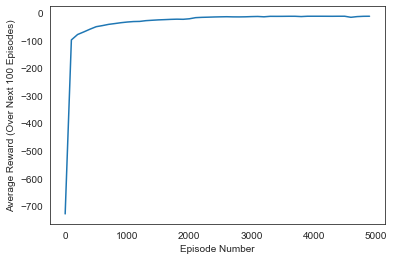

Best Average Reward over 100 Episodes:  -13.0


**<span style="color: green;">PASSED</span>**


Estimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):
[[ 1  1  2  2  1  1  1  1  0  3  1  2]
 [ 0  1  1  1  2  1  2  1  1  2  2  2]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]]


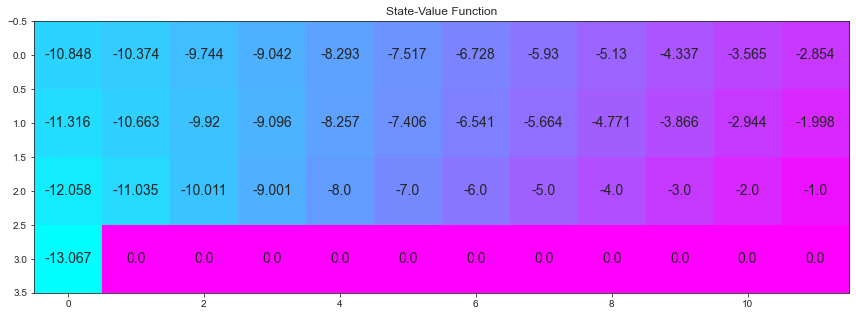

In [10]:
# obtain the estimated optimal policy and corresponding action-value function
Q_sarsa = sarsa(env, 5000, .01)

# print the estimated optimal policy
policy_sarsa = np.array([np.argmax(Q_sarsa[key]) if key in Q_sarsa else -1 for key in np.arange(48)]).reshape(4,12)
check_test.run_check('td_control_check', policy_sarsa)
print("\nEstimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):")
print(policy_sarsa)

# plot the estimated optimal state-value function
V_sarsa = ([np.max(Q_sarsa[key]) if key in Q_sarsa else 0 for key in np.arange(48)])
plot_values(V_sarsa)

### Part 2: TD Control: Q-learning

In this section, you will write your own implementation of the Q-learning control algorithm.

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

Please complete the function in the code cell below.

(_Feel free to define additional functions to help you to organize your code._)

In [8]:
def update_Q_sarsamax(alpha, gamma, Q, state, action, reward, next_state=None):
    """Returns updated Q-value for the most recent experience."""
    current = Q[state][action]  # estimate in Q-table (for current state, action pair)
    Qsa_next = np.max(Q[next_state]) if next_state is not None else 0  # value of next state 
    target = reward + (gamma * Qsa_next)               # construct TD target
    new_value = current + (alpha * (target - current)) # get updated value 
    return new_value

In [9]:
def q_learning(env, num_episodes, alpha, gamma=1.0, plot_every=100):
    """Q-Learning - TD Control
    
    Params
    ======
        num_episodes (int): number of episodes to run the algorithm
        alpha (float): learning rate
        gamma (float): discount factor
        plot_every (int): number of episodes to use when calculating average score
    """
    nA = env.action_space.n                # number of actions
    Q = defaultdict(lambda: np.zeros(nA))  # initialize empty dictionary of arrays
    
    # monitor performance
    tmp_scores = deque(maxlen=plot_every)     # deque for keeping track of scores
    avg_scores = deque(maxlen=num_episodes)   # average scores over every plot_every episodes
    
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 100 == 0:
            print("\rEpisode {}/{}".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        score = 0                                              # initialize score
        state = env.reset()                                    # start episode
        eps = 1.0 / i_episode                                  # set value of epsilon
        
        while True:
            action = epsilon_greedy(Q, state, nA, eps)         # epsilon-greedy action selection
            next_state, reward, done, info = env.step(action)  # take action A, observe R, S'
            score += reward                                    # add reward to agent's score
            Q[state][action] = update_Q_sarsamax(alpha, gamma, Q, \
                                                 state, action, reward, next_state)        
            state = next_state                                 # S <- S'
            if done:
                tmp_scores.append(score)                       # append score
                break
        if (i_episode % plot_every == 0):
            avg_scores.append(np.mean(tmp_scores))
            
    # plot performance
    plt.plot(np.linspace(0,num_episodes,len(avg_scores),endpoint=False), np.asarray(avg_scores))
    plt.xlabel('Episode Number')
    plt.ylabel('Average Reward (Over Next %d Episodes)' % plot_every)
    plt.show()
    # print best 100-episode performance
    print(('Best Average Reward over %d Episodes: ' % plot_every), np.max(avg_scores))
    return Q

Use the next code cell to visualize the **_estimated_** optimal policy and the corresponding state-value function. 

If the code cell returns **PASSED**, then you have implemented the function correctly!  Feel free to change the `num_episodes` and `alpha` parameters that are supplied to the function.  However, if you'd like to ensure the accuracy of the unit test, please do not change the value of `gamma` from the default.

Episode 5000/5000

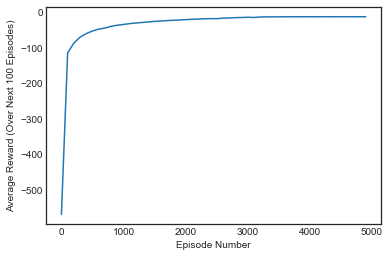

Best Average Reward over 100 Episodes:  -13.0


**<span style="color: green;">PASSED</span>**


Estimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):
[[ 0  3  1  1  1  1  1  1  1  2  2  1]
 [ 1  1  0  3  2  2  1  3  2  2  2  2]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0]]


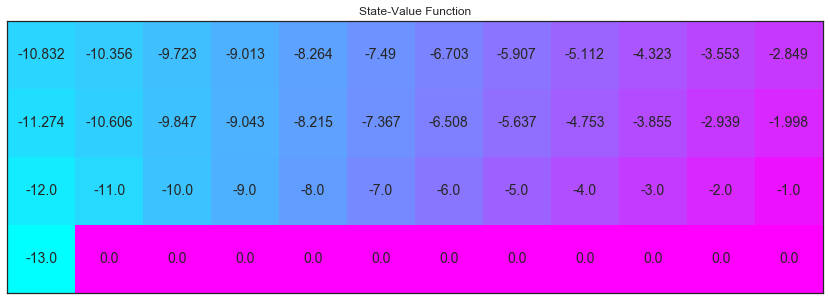

In [10]:
# obtain the estimated optimal policy and corresponding action-value function
Q_sarsamax = q_learning(env, 5000, .01)

# print the estimated optimal policy
policy_sarsamax = np.array([np.argmax(Q_sarsamax[key]) if key in Q_sarsamax else -1 for key in np.arange(48)]).reshape((4,12))
check_test.run_check('td_control_check', policy_sarsamax)
print("\nEstimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):")
print(policy_sarsamax)

# plot the estimated optimal state-value function
plot_values([np.max(Q_sarsamax[key]) if key in Q_sarsamax else 0 for key in np.arange(48)])

### Part 3: TD Control: Expected Sarsa

In this section, you will write your own implementation of the Expected Sarsa control algorithm.

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

Please complete the function in the code cell below.

(_Feel free to define additional functions to help you to organize your code._)

In [11]:
def update_Q_expsarsa(alpha, gamma, nA, eps, Q, state, action, reward, next_state=None):
    """Returns updated Q-value for the most recent experience."""
    current = Q[state][action]         # estimate in Q-table (for current state, action pair)
    policy_s = np.ones(nA) * eps / nA  # current policy (for next state S')
    policy_s[np.argmax(Q[next_state])] = 1 - eps + (eps / nA) # greedy action
    Qsa_next = np.dot(Q[next_state], policy_s)         # get value of state at next time step
    target = reward + (gamma * Qsa_next)               # construct target
    new_value = current + (alpha * (target - current)) # get updated value 
    return new_value

In [12]:
def expected_sarsa(env, num_episodes, alpha, gamma=1.0, plot_every=100):
    """Expected SARSA - TD Control
    
    Params
    ======
        num_episodes (int): number of episodes to run the algorithm
        alpha (float): step-size parameters for the update step
        gamma (float): discount factor
        plot_every (int): number of episodes to use when calculating average score
    """
    nA = env.action_space.n                # number of actions
    Q = defaultdict(lambda: np.zeros(nA))  # initialize empty dictionary of arrays
    
    # monitor performance
    tmp_scores = deque(maxlen=plot_every)     # deque for keeping track of scores
    avg_scores = deque(maxlen=num_episodes)   # average scores over every plot_every episodes
    
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 100 == 0:
            print("\rEpisode {}/{}".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        
        score = 0             # initialize score
        state = env.reset()   # start episode
        eps = 0.005           # set value of epsilon
        
        while True:
            action = epsilon_greedy(Q, state, nA, eps)         # epsilon-greedy action selection
            next_state, reward, done, info = env.step(action)  # take action A, observe R, S'
            score += reward                                    # add reward to agent's score
            # update Q
            Q[state][action] = update_Q_expsarsa(alpha, gamma, nA, eps, Q, \
                                                 state, action, reward, next_state)        
            state = next_state              # S <- S'
            if done:
                tmp_scores.append(score)    # append score
                break
        if (i_episode % plot_every == 0):
            avg_scores.append(np.mean(tmp_scores))
            
    # plot performance
    plt.plot(np.linspace(0,num_episodes,len(avg_scores),endpoint=False), np.asarray(avg_scores))
    plt.xlabel('Episode Number')
    plt.ylabel('Average Reward (Over Next %d Episodes)' % plot_every)
    plt.show()
    # print best 100-episode performance
    print(('Best Average Reward over %d Episodes: ' % plot_every), np.max(avg_scores))
    return Q

Use the next code cell to visualize the **_estimated_** optimal policy and the corresponding state-value function.  

If the code cell returns **PASSED**, then you have implemented the function correctly!  Feel free to change the `num_episodes` and `alpha` parameters that are supplied to the function.  However, if you'd like to ensure the accuracy of the unit test, please do not change the value of `gamma` from the default.

Episode 5000/5000

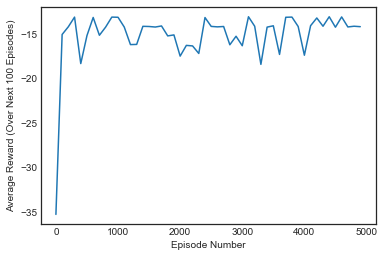

Best Average Reward over 100 Episodes:  -13.02


**<span style="color: green;">PASSED</span>**


Estimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):
[[ 1  1  1  2  1  1  1  2  1  3  1  3]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0]]


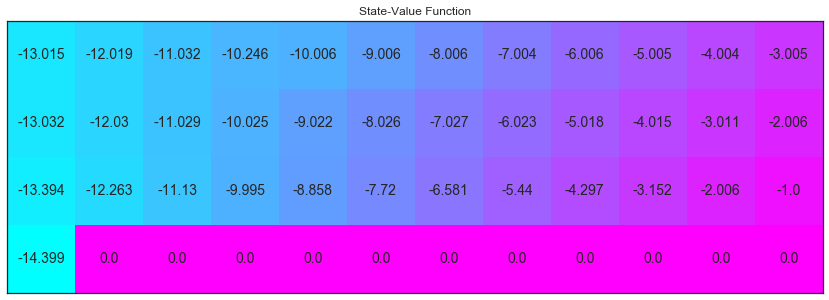

In [13]:
# obtain the estimated optimal policy and corresponding action-value function
Q_expsarsa = expected_sarsa(env, 5000, 1)

# print the estimated optimal policy
policy_expsarsa = np.array([np.argmax(Q_expsarsa[key]) if key in Q_expsarsa else -1 for key in np.arange(48)]).reshape(4,12)
check_test.run_check('td_control_check', policy_expsarsa)
print("\nEstimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):")
print(policy_expsarsa)

# plot the estimated optimal state-value function
plot_values([np.max(Q_expsarsa[key]) if key in Q_expsarsa else 0 for key in np.arange(48)])